# COVID19 - Countries

In [1]:
import os
import ray

In [2]:
import urllib.request
import pandas as pd
import numpy as np
from datetime import datetime,timedelta

In [3]:
# Download data
import get_data as gd
LoadData=True

if LoadData:
    gd.get_data()

# SEAIR-D Model Equations

$$\begin{array}{l}\frac{d s}{d t}=-[\beta i(t) + \beta_2 a(t)-\mu] \cdot s(t)\\ 
\frac{d e}{d t}=[\beta i(t) + \beta_2 a(t)] \cdot s(t) -(\sigma+\mu) \cdot e(t)\\ 
\frac{d a}{d t}=\sigma e(t) \cdot (1-p)-(\gamma+\mu) \cdot a(t) \\
\frac{d i}{d t}=\sigma e(t) \cdot p - (\gamma + \sigma_2 + \sigma_3 + \mu) \cdot i(t)\\ 
\frac{d r}{d t}=(b + \sigma_2) \cdot i(t) + \gamma \cdot a(t) - \mu \cdot r(t)\\
\frac{d k}{d t}=(a + \sigma_3 - \mu) \cdot d(t)
\end{array}$$

The sum of all people accounted is equal to population considered:

$$s + e + a + i + r + k = N$$

The derivate is:

$$\frac{d s}{d t}+\frac{d e}{d t}+\frac{d a}{d t}+\frac{d i}{d t}+\frac{d r}{d t}+\frac{d k}{d t} = 0$$

The last equation does not need to be solve because:

$$\frac{d k}{d t}=-(\frac{d s}{d t}+\frac{d e}{d t}+\frac{d a}{d t}+\frac{d i}{d t}+\frac{d r}{d t})$$

The sum of all rates are equal to zero! The importance of this equation is that it conservates the rates.


## Parameters

N: the population considered

$\beta$: Effective contact rate [1/min]
    
$\gamma$: Recovery(+Mortality) rate $\gamma=(a+b)$ [1/min]

$a$: mortality of healed  [1/min]

$b$: recovery rate  [1/min]

$\sigma$: is the rate at which individuals move from the exposed to the infectious classes. Its reciprocal ($1/\sigma$) is the average latent (exposed) period.

$\sigma_2$: is the rate at which individuals move from the infectious to the healed classes. Its reciprocal ($1/\sigma_2$) is the average latent (exposed) period

$\sigma_3$: is the rate at which individuals move from the infectious to the dead classes. Its reciprocal ($1/\sigma_3$) is the average latent (exposed) period
    
$p$: is the fraction of the exposed which become symptomatic infectious sub-population.

$(1-p)$: is the fraction of the exposed which becomes asymptomatic infectious sub-population.

## Options: Param.CSV file, changeCSV, Adjust Param, Save CSV, Select Specific Country

In [4]:
from IPython.display import display, HTML, Markdown

paramOpt=4
changeCSV=False
adjustParam=True
paramSave=False
selectCountries=False

## Different Options to Load Param.CSV file

In [5]:
model = "YaboxIC"    

if paramOpt==0:
    paramFile="data/param_optimized_Yabox_HistMin-Copy3.csv"
    version = "003"

if paramOpt==1:
    paramFile="data/param_optimized_Yabox_HistMin-Copy4.csv"
    version = "003"
    
if paramOpt==2:
    paramFile="data/param_optimized_Yabox_HistMin.csv"
    version = "004"
    
if paramOpt==3:
    paramFile="data/param_optimized_Yabox_HistMin.csv"
    version = "005"
    
if paramOpt==4:
    paramFile="data/param_optimized_Yabox_HistMin.csv"
    version = "006"


In [6]:
dfparam = pd.read_csv(paramFile)
dfparam = dfparam.dropna()
dfparam.e0=0
dfparam.a0=0

display(Markdown("## Original Initial Parameters"))
display(dfparam)

## Original Initial Parameters

,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,WCASES,WREC
0,Brazil,03/02/20,200,10127776,0,0,16,225,221,233,0.3639,0.0626
1,China,01/26/20,200,359945,0,0,200,100,50,50,0.1516,0.0035
2,Italy,02/28/20,200,491277,0,0,25,183,188,106,0.1570,0.0905
3,US,02/19/20,200,36165499,0,0,115,108,24,70,0.2136,0.0945
4,India,03/10/20,200,15909150,0,0,106,85,106,132,0.4382,0.0369


## Modify param.csv file to fit better the data

In [7]:
if changeCSV and (paramOpt==1):
    dfparam['s0'] = pd.to_numeric(dfparam['s0'],errors='coerce')
    dfparam['i0'] = pd.to_numeric(dfparam['i0'],errors='coerce')
    dfparam['d0'] = pd.to_numeric(dfparam['d0'],errors='coerce')
    dfparam['s0'] = dfparam['s0'].astype(float)
    dfparam['i0'] = dfparam['i0'].astype(float)
    dfparam['d0'] = dfparam['d0'].astype(float)
    dfparam.loc[dfparam.country=='Italy','s0'] = dfparam.loc[dfparam.country=='Italy','s0']*1.8
    dfparam.loc[dfparam.country=='China','s0'] = dfparam.loc[dfparam.country=='China','s0']*1.5
    dfparam.loc[dfparam.country=='India','s0'] = dfparam.loc[dfparam.country=='India','s0']*12/100
    dfparam.loc[dfparam.country=='US','s0'] = dfparam.loc[dfparam.country=='US','s0']*8/10
    dfparam['s0'] = pd.to_numeric(dfparam['s0'],errors='coerce')
    dfparam['i0'] = pd.to_numeric(dfparam['i0'],errors='coerce')
    dfparam['d0'] = pd.to_numeric(dfparam['d0'],errors='coerce')
    

# if adjustParam:
#     sCorrect=[1.38,1.0,1.05,1.5,1.5,1.4,1.1,1.5,1.15,1.55,1.35,1.2,1.35,1.15,1.55,1.45,1.25]
#     dfparam.s0=dfparam.s0.multiply(sCorrect[:len(DRS)], axis=0)

if selectCountries and paramOpt==0:
    countries=['Brazil', 
         'US']

if not selectCountries:
    countries=dfparam.country    

dfparam['s0'] = dfparam['s0'].astype(int)
dfparam['i0'] = dfparam['i0'].astype(int)
dfparam['d0'] = dfparam['d0'].astype(int)

if paramSave:
    dfparam.to_csv("new_"+paramFile)    

display(Markdown("## Modified Initial Parameters"))
display(dfparam)

## Modified Initial Parameters

,country,start-date,prediction-range,s0,e0,a0,i0,r0,d0,START,WCASES,WREC
0,Brazil,03/02/20,200,10127776,0,0,16,225,221,233,0.3639,0.0626
1,China,01/26/20,200,359945,0,0,200,100,50,50,0.1516,0.0035
2,Italy,02/28/20,200,491277,0,0,25,183,188,106,0.1570,0.0905
3,US,02/19/20,200,36165499,0,0,115,108,24,70,0.2136,0.0945
4,India,03/10/20,200,15909150,0,0,106,85,106,132,0.4382,0.0369


# Solver Loading and Version

In [8]:
%reload_ext autoreload
%autoreload 2

underNote=True

if underNote:
    import LearnerYabox_v3 as Learner 
else:
    import LearnerYabox_v2 as Learner 


2020-10-13 10:55:21,171	INFO resource_spec.py:212 -- Starting Ray with 229.98 GiB memory available for workers and up to 67.86 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-10-13 10:55:21,495	INFO services.py:1170 -- View the Ray dashboard at localhost:8265


In [9]:
allCountries=True
cleanRecovered=False
version="1"

if allCountries:
    display(countries)
else:
    countrySelected="Brazil"
    display(countrySelected)

0    Brazil
1     China
2     Italy
3        US
4     India
Name: country, dtype: object

In [10]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return true;}

<IPython.core.display.Javascript object>

# Main Loop

In [11]:
results=[]
if allCountries:
    for country in countries:
        query = dfparam.query('country == "{}"'.format(country)).reset_index()
        parameters = np.array(query.iloc[:, 2:])[0]
        current = datetime.strptime(parameters[0], '%m/%d/%y')
        parameters[0] = datetime.strftime(current, '%-m/%-d/%y')
        f=Learner.Learner.remote(country, *parameters, cleanRecovered, version)
        result = f.train.remote() 
        results.append(result)
else:
    country = countrySelected 
    query = dfparam.query('country == "{}"'.format(country)).reset_index()
    parameters = np.array(query.iloc[:, 2:])[0]
    current = datetime.strptime(parameters[0], '%m/%d/%y')
    parameters[0] = datetime.strftime(current, '%-m/%-d/%y')
    f=Learner.Learner.remote(country, *parameters, cleanRecovered, version)
    result = f.train.remote() 
    results.append(result)

# #execute all the queue with max_runner_cap at a time    
results = ray.get(results)

2020-10-13 10:55:22,419	WARNING worker.py:1090 -- WARNING: 3 PYTHON workers have been started. This could be a result of using a large number of actors, or it could be a consequence of using nested tasks (see https://github.com/ray-project/ray/issues/3644) for some a discussion of workarounds.


  0%|          | 0/55125000.0 [00:00<?, ?it/s]


2020-10-13 10:55:22,836	WARNING worker.py:1090 -- WARNING: 4 PYTHON workers have been started. This could be a result of using a large number of actors, or it could be a consequence of using nested tasks (see https://github.com/ray-project/ray/issues/3644) for some a discussion of workarounds.


  0%|          | 0/55125000.0 [00:00<?, ?it/s]


2020-10-13 10:55:23,283	WARNING worker.py:1090 -- WARNING: 5 PYTHON workers have been started. This could be a result of using a large number of actors, or it could be a consequence of using nested tasks (see https://github.com/ray-project/ray/issues/3644) for some a discussion of workarounds.


  0%|          | 0/55125000.0 [00:00<?, ?it/s]
  0%|          | 0/55125000.0 [00:00<?, ?it/s]
  0%|          | 0/55125000.0 [00:00<?, ?it/s]
  0%|          | 0/55125000.0 [00:02<?, ?it/s]
  0%|          | 0/55125000.0 [00:03<?, ?it/s]
  0%|          | 0/55125000.0 [00:03<?, ?it/s]
  0%|          | 1/55125000.0 [00:04<21195:11:15,  1.38s/it]
  0%|          | 1/55125000.0 [00:05<26231:15:17,  1.71s/it]
  0%|          | 0/55125000.0 [00:03<?, ?it/s]
  0%|          | 1/55125000.0 [00:04<21573:22:59,  1.41s/it]
  0%|          | 0/55125000.0 [00:03<?, ?it/s]
  0%|          | 3/55125000.0 [00:05<17975:41:20,  1.17s/it]
  0%|          | 3/55125000.0 [00:05<18499:49:13,  1.21s/it]
  0%|          | 3/55125000.0 [00:06<22374:44:05,  1.46s/it]
  0%|          | 1/55125000.0 [00:05<27990:49:37,  1.83s/it]
  0%|          | 1/55125000.0 [00:05<27063:32:58,  1.77s/it]
  0%|          | 6/55125000.0 [00:07<14830:10:05,  1.03it/s]
  0%|          | 6/55125000.0 [00:07<15252:46:36,  1.00it/s]
  0%|         

  0%|          | 465/55125000.0 [00:46<792:13:51, 19.33it/s]
  0%|          | 435/55125000.0 [00:46<862:17:32, 17.76it/s]
  0%|          | 351/55125000.0 [00:48<1095:26:38, 13.98it/s]
  0%|          | 276/55125000.0 [00:47<1423:30:23, 10.76it/s]
  0%|          | 496/55125000.0 [00:48<765:04:58, 20.01it/s]
  0%|          | 300/55125000.0 [00:47<1289:38:37, 11.87it/s]
  0%|          | 465/55125000.0 [00:48<828:24:58, 18.48it/s]
  0%|          | 378/55125000.0 [00:49<1045:02:37, 14.65it/s]
  0%|          | 528/55125000.0 [00:49<739:47:16, 20.70it/s]
  0%|          | 300/55125000.0 [00:49<1345:23:55, 11.38it/s]
  0%|          | 496/55125000.0 [00:49<800:10:39, 19.14it/s]
  0%|          | 325/55125000.0 [00:48<1226:27:24, 12.49it/s]
  0%|          | 406/55125000.0 [00:51<1001:03:01, 15.30it/s]
  0%|          | 561/55125000.0 [00:51<718:11:18, 21.32it/s]
  0%|          | 528/55125000.0 [00:51<764:16:08, 20.04it/s]
  0%|          | 325/55125000.0 [00:50<1286:55:16, 11.90it/s]
  0%|          |

  0%|          | 1081/55125000.0 [01:28<618:10:25, 24.77it/s]
  0%|          | 1891/55125000.0 [01:30<361:34:02, 42.35it/s]
  0%|          | 1378/55125000.0 [01:30<497:00:18, 30.81it/s]
  0%|          | 1176/55125000.0 [01:29<584:56:30, 26.18it/s]
  0%|          | 1770/55125000.0 [01:30<385:29:23, 39.72it/s]
  0%|          | 1953/55125000.0 [01:31<357:20:03, 42.85it/s]
  0%|          | 1128/55125000.0 [01:30<602:24:54, 25.42it/s]
  0%|          | 1830/55125000.0 [01:31<377:11:47, 40.59it/s]
  0%|          | 1431/55125000.0 [01:32<491:02:33, 31.18it/s]
  0%|          | 1225/55125000.0 [01:30<569:46:03, 26.87it/s]
  0%|          | 2016/55125000.0 [01:32<350:59:42, 43.62it/s]
  0%|          | 1176/55125000.0 [01:32<580:15:47, 26.39it/s]
  0%|          | 1891/55125000.0 [01:32<370:16:22, 41.35it/s]
  0%|          | 1485/55125000.0 [01:34<479:53:40, 31.91it/s]
  0%|          | 1275/55125000.0 [01:32<555:00:15, 27.59it/s]
  0%|          | 2080/55125000.0 [01:34<346:52:23, 44.14it/s]
  0%|   

  0%|          | 3916/55125000.0 [02:10<244:25:46, 62.64it/s]
  0%|          | 2628/55125000.0 [02:09<375:37:49, 40.76it/s]
  0%|          | 3081/55125000.0 [02:11<311:14:47, 49.19it/s]
  0%|          | 4186/55125000.0 [02:11<243:59:11, 62.75it/s]
  0%|          | 2556/55125000.0 [02:10<379:40:22, 40.33it/s]
  0%|          | 4005/55125000.0 [02:11<236:35:51, 64.71it/s]
  0%|          | 3160/55125000.0 [02:13<306:35:31, 49.94it/s]
  0%|          | 2701/55125000.0 [02:11<364:49:02, 41.97it/s]
  0%|          | 4278/55125000.0 [02:13<239:34:38, 63.91it/s]
  0%|          | 4095/55125000.0 [02:12<234:45:06, 65.22it/s]
  0%|          | 2628/55125000.0 [02:12<373:18:02, 41.02it/s]
  0%|          | 3240/55125000.0 [02:14<301:08:25, 50.85it/s]
  0%|          | 2775/55125000.0 [02:12<354:04:32, 43.24it/s]
  0%|          | 4371/55125000.0 [02:14<235:31:15, 65.01it/s]
  0%|          | 4186/55125000.0 [02:14<228:23:22, 67.04it/s]
  0%|          | 2701/55125000.0 [02:14<363:00:01, 42.18it/s]
  0%|   

  0%|          | 7021/55125000.0 [02:47<154:57:49, 98.80it/s]
  0%|          | 4656/55125000.0 [02:46<238:04:31, 64.31it/s]
  0%|          | 4560/55125000.0 [02:47<232:13:37, 65.93it/s]
  0%|          | 5671/55125000.0 [02:49<175:15:54, 87.36it/s]
  0%|          | 7021/55125000.0 [02:49<178:42:01, 85.68it/s]
  0%|          | 7140/55125000.0 [02:48<153:50:31, 99.52it/s]
  0%|          | 4753/55125000.0 [02:48<236:24:44, 64.76it/s]
  0%|          | 4656/55125000.0 [02:49<230:07:21, 66.54it/s]
  0%|          | 5778/55125000.0 [02:50<173:34:07, 88.21it/s]
  0%|          | 7260/55125000.0 [02:50<151:16:53, 101.21it/s]
  0%|          | 7140/55125000.0 [02:50<177:59:22, 86.02it/s]
  0%|          | 4851/55125000.0 [02:49<229:37:31, 66.68it/s]
  0%|          | 5886/55125000.0 [02:51<170:35:39, 89.75it/s]
  0%|          | 4753/55125000.0 [02:50<227:24:15, 67.33it/s]
  0%|          | 7381/55125000.0 [02:51<150:27:09, 101.76it/s]
  0%|          | 7260/55125000.0 [02:51<176:14:49, 86.87it/s]
  0%| 

  0%|          | 10878/55125000.0 [03:20<117:53:14, 129.87it/s]
  0%|          | 9045/55125000.0 [03:21<135:43:10, 112.81it/s]
  0%|          | 10153/55125000.0 [03:21<146:32:23, 104.47it/s]
  0%|          | 7503/55125000.0 [03:20<156:42:36, 97.70it/s]
  0%|          | 7260/55125000.0 [03:21<169:08:50, 90.52it/s]
  0%|          | 11026/55125000.0 [03:21<115:58:18, 132.01it/s]
  0%|          | 9180/55125000.0 [03:23<134:53:17, 113.50it/s]
  0%|          | 10296/55125000.0 [03:22<143:51:45, 106.42it/s]
  0%|          | 7626/55125000.0 [03:21<151:47:29, 100.86it/s]
  0%|          | 11175/55125000.0 [03:22<114:02:38, 134.24it/s]
  0%|          | 7381/55125000.0 [03:22<170:40:26, 89.71it/s]
  0%|          | 9316/55125000.0 [03:24<132:41:52, 115.37it/s]
  0%|          | 10440/55125000.0 [03:24<142:58:15, 107.08it/s]
  0%|          | 11325/55125000.0 [03:23<113:43:00, 134.63it/s]
  0%|          | 7750/55125000.0 [03:23<152:56:39, 100.10it/s]
  0%|          | 7503/55125000.0 [03:23<168:51:34, 

  0%|          | 13041/55125000.0 [03:52<108:13:40, 141.45it/s]
  0%|          | 11026/55125000.0 [03:51<122:14:15, 125.24it/s]
  0%|          | 15576/55125000.0 [03:52<95:02:21, 161.07it/s]
  0%|          | 10440/55125000.0 [03:52<137:51:50, 111.05it/s]
  0%|          | 13861/55125000.0 [03:53<122:21:23, 125.12it/s]
  0%|          | 13203/55125000.0 [03:53<108:09:48, 141.53it/s]
  0%|          | 15753/55125000.0 [03:53<94:43:06, 161.62it/s]
  0%|          | 11175/55125000.0 [03:52<121:19:58, 126.18it/s]
  0%|          | 10585/55125000.0 [03:53<135:10:49, 113.25it/s]
  0%|          | 13366/55125000.0 [03:54<108:04:58, 141.64it/s]
  0%|          | 14028/55125000.0 [03:54<121:10:49, 126.33it/s]
  0%|          | 15931/55125000.0 [03:54<93:14:08, 164.19it/s]
  0%|          | 11325/55125000.0 [03:53<118:01:43, 129.71it/s]
  0%|          | 10731/55125000.0 [03:54<131:46:25, 116.18it/s]
  0%|          | 13530/55125000.0 [03:55<105:23:36, 145.25it/s]
  0%|          | 16110/55125000.0 [03:55<91

  0%|          | 17766/55125000.0 [04:23<93:34:41, 163.58it/s]
  0%|          | 15225/55125000.0 [04:21<109:42:11, 139.54it/s]
  0%|          | 20910/55125000.0 [04:22<89:37:22, 170.79it/s]
  0%|          | 14365/55125000.0 [04:22<113:36:31, 134.75it/s]
  0%|          | 17955/55125000.0 [04:23<109:58:04, 139.20it/s]
  0%|          | 15400/55125000.0 [04:22<105:21:36, 145.29it/s]
  0%|          | 17955/55125000.0 [04:24<93:20:13, 164.00it/s]
  0%|          | 21115/55125000.0 [04:23<86:15:41, 177.44it/s]
  0%|          | 14535/55125000.0 [04:23<111:09:03, 137.73it/s]
  0%|          | 21321/55125000.0 [04:24<83:15:42, 183.84it/s]
  0%|          | 18145/55125000.0 [04:25<92:21:26, 165.74it/s]
  0%|          | 18145/55125000.0 [04:25<108:50:17, 140.64it/s]
  0%|          | 15576/55125000.0 [04:23<103:34:35, 147.80it/s]
  0%|          | 14706/55125000.0 [04:24<109:46:27, 139.45it/s]
  0%|          | 21528/55125000.0 [04:25<81:57:11, 186.77it/s]
  0%|          | 18336/55125000.0 [04:26<92:13:

  0%|          | 23220/55125000.0 [04:53<80:10:39, 190.90it/s]
  0%|          | 18915/55125000.0 [04:52<97:29:36, 157.01it/s]
  0%|          | 20301/55125000.0 [04:52<88:14:30, 173.47it/s]
  0%|          | 27261/55125000.0 [04:53<68:43:26, 222.70it/s]
  0%|          | 22578/55125000.0 [04:53<95:08:19, 160.88it/s]
  0%|          | 23436/55125000.0 [04:54<79:23:59, 192.77it/s]
  0%|          | 19110/55125000.0 [04:53<95:48:09, 159.78it/s]
  0%|          | 20503/55125000.0 [04:53<87:21:09, 175.23it/s]
  0%|          | 27495/55125000.0 [04:54<68:36:29, 223.08it/s]
  0%|          | 22791/55125000.0 [04:55<94:26:01, 162.08it/s]
  0%|          | 23653/55125000.0 [04:56<81:16:06, 188.34it/s]
  0%|          | 19306/55125000.0 [04:54<95:36:02, 160.12it/s]
  0%|          | 27730/55125000.0 [04:55<68:10:59, 224.47it/s]
  0%|          | 20706/55125000.0 [04:54<86:57:11, 176.03it/s]
  0%|          | 23005/55125000.0 [04:56<94:08:21, 162.59it/s]
  0%|          | 23871/55125000.0 [04:57<79:12:23, 193.

  0%|          | 34453/55125000.0 [05:23<60:12:36, 254.16it/s]
  0%|          | 29403/55125000.0 [05:24<70:36:05, 216.77it/s]
  0%|          | 27730/55125000.0 [05:23<84:58:36, 180.11it/s]
  0%|          | 24090/55125000.0 [05:23<87:48:54, 174.30it/s]
  0%|          | 26106/55125000.0 [05:22<76:00:11, 201.38it/s]
  0%|          | 34716/55125000.0 [05:24<59:22:08, 257.76it/s]
  0%|          | 29646/55125000.0 [05:25<71:09:07, 215.09it/s]
  0%|          | 26335/55125000.0 [05:23<75:33:16, 202.57it/s]
  0%|          | 24310/55125000.0 [05:24<86:17:01, 177.39it/s]
  0%|          | 27966/55125000.0 [05:25<83:50:05, 182.56it/s]
  0%|          | 34980/55125000.0 [05:25<59:52:59, 255.54it/s]
  0%|          | 26565/55125000.0 [05:24<75:09:22, 203.64it/s]
  0%|          | 29890/55125000.0 [05:26<71:56:45, 212.72it/s]
  0%|          | 28203/55125000.0 [05:26<82:50:49, 184.73it/s]
  0%|          | 24531/55125000.0 [05:25<87:28:41, 174.97it/s]
  0%|          | 35245/55125000.0 [05:26<59:30:17, 257.

  0%|          | 32385/55125000.0 [05:52<71:25:03, 214.28it/s]
  0%|          | 29890/55125000.0 [05:53<77:30:18, 197.46it/s]
  0%|          | 33670/55125000.0 [05:54<74:56:09, 204.22it/s]
  0%|          | 36315/55125000.0 [05:55<66:41:52, 229.43it/s]
  0%|          | 42778/55125000.0 [05:54<53:59:29, 283.39it/s]
  0%|          | 32640/55125000.0 [05:54<72:01:44, 212.46it/s]
  0%|          | 30135/55125000.0 [05:54<76:17:52, 200.58it/s]
  0%|          | 33930/55125000.0 [05:55<73:42:42, 207.61it/s]
  0%|          | 43071/55125000.0 [05:55<53:39:22, 285.16it/s]
  0%|          | 36585/55125000.0 [05:56<67:08:17, 227.92it/s]
  0%|          | 32896/55125000.0 [05:55<70:39:30, 216.58it/s]
  0%|          | 30381/55125000.0 [05:55<75:57:11, 201.49it/s]
  0%|          | 34191/55125000.0 [05:56<72:55:37, 209.84it/s]
  0%|          | 43365/55125000.0 [05:56<52:38:47, 290.63it/s]
  0%|          | 33153/55125000.0 [05:56<68:37:29, 223.00it/s]
  0%|          | 30628/55125000.0 [05:56<74:56:55, 204.

  0%|          | 39340/55125000.0 [06:24<63:39:34, 240.37it/s]
  0%|          | 40186/55125000.0 [06:25<67:31:04, 226.63it/s]
  0%|          | 51681/55125000.0 [06:26<49:02:16, 311.97it/s]
  0%|          | 36315/55125000.0 [06:25<67:52:48, 225.43it/s]
  0%|          | 43660/55125000.0 [06:27<60:15:08, 253.94it/s]
  0%|          | 39621/55125000.0 [06:25<62:40:08, 244.16it/s]
  0%|          | 40470/55125000.0 [06:27<67:05:01, 228.09it/s]
  0%|          | 52003/55125000.0 [06:27<48:43:27, 313.97it/s]
  0%|          | 36585/55125000.0 [06:26<66:49:38, 228.98it/s]
  0%|          | 43956/55125000.0 [06:28<59:36:32, 256.68it/s]
  0%|          | 39903/55125000.0 [06:26<62:56:34, 243.10it/s]
  0%|          | 40755/55125000.0 [06:28<66:16:27, 230.88it/s]
  0%|          | 52326/55125000.0 [06:27<47:55:27, 319.21it/s]
  0%|          | 36856/55125000.0 [06:27<67:36:13, 226.35it/s]
  0%|          | 44253/55125000.0 [06:29<59:30:27, 257.11it/s]
  0%|          | 40186/55125000.0 [06:27<62:34:05, 244.

  0%|          | 51681/55125000.0 [06:56<54:50:49, 278.92it/s]
  0%|          | 47586/55125000.0 [06:56<59:30:46, 257.07it/s]
  0%|          | 61425/55125000.0 [06:55<43:56:32, 348.08it/s]
  0%|          | 43365/55125000.0 [06:55<62:18:50, 245.54it/s]
  0%|          | 47278/55125000.0 [06:55<58:45:23, 260.39it/s]
  0%|          | 61776/55125000.0 [06:56<43:32:41, 351.25it/s]
  0%|          | 52003/55125000.0 [06:57<54:45:50, 279.35it/s]
  0%|          | 47895/55125000.0 [06:57<58:55:30, 259.64it/s]
  0%|          | 43660/55125000.0 [06:56<62:40:18, 244.14it/s]
  0%|          | 47586/55125000.0 [06:56<58:21:56, 262.13it/s]
  0%|          | 62128/55125000.0 [06:57<43:50:12, 348.91it/s]
  0%|          | 48205/55125000.0 [06:58<59:04:06, 259.01it/s]
  0%|          | 52326/55125000.0 [06:58<55:30:18, 275.61it/s]
  0%|          | 47895/55125000.0 [06:57<57:24:02, 266.53it/s]
  0%|          | 62481/55125000.0 [06:58<43:45:38, 349.52it/s]
  0%|          | 43956/55125000.0 [06:58<63:19:35, 241.

  0%|          | 50721/55125000.0 [07:24<57:49:41, 264.55it/s]
  0%|          | 72010/55125000.0 [07:25<41:32:33, 368.12it/s]
  0%|          | 60378/55125000.0 [07:26<51:14:45, 298.48it/s]
  0%|          | 55945/55125000.0 [07:26<54:00:10, 283.26it/s]
  0%|          | 55611/55125000.0 [07:25<53:01:44, 288.47it/s]
  0%|          | 51040/55125000.0 [07:25<56:42:02, 269.81it/s]
  0%|          | 72390/55125000.0 [07:26<41:28:40, 368.69it/s]
  0%|          | 60726/55125000.0 [07:27<50:50:31, 300.85it/s]
  0%|          | 56280/55125000.0 [07:27<53:30:41, 285.86it/s]
  0%|          | 51360/55125000.0 [07:26<55:27:17, 275.87it/s]
  0%|          | 55945/55125000.0 [07:26<53:19:59, 286.82it/s]
  0%|          | 72771/55125000.0 [07:27<41:10:38, 371.38it/s]
  0%|          | 61075/55125000.0 [07:28<50:26:24, 303.24it/s]
  0%|          | 56616/55125000.0 [07:28<53:32:43, 285.68it/s]
  0%|          | 51681/55125000.0 [07:27<54:52:58, 278.74it/s]
  0%|          | 56280/55125000.0 [07:27<52:23:25, 291.

  0%|          | 59340/55125000.0 [07:54<51:21:40, 297.81it/s]
  0%|          | 64620/55125000.0 [07:55<48:23:42, 316.03it/s]
  0%|          | 83436/55125000.0 [07:54<38:59:02, 392.19it/s]
  0%|          | 69751/55125000.0 [07:55<46:57:04, 325.72it/s]
  0%|          | 64261/55125000.0 [07:54<49:23:03, 309.71it/s]
  0%|          | 83845/55125000.0 [07:55<38:33:45, 396.48it/s]
  0%|          | 59685/55125000.0 [07:55<51:01:43, 299.75it/s]
  0%|          | 64980/55125000.0 [07:56<48:25:29, 315.84it/s]
  0%|          | 70125/55125000.0 [07:56<46:50:31, 326.48it/s]
  0%|          | 64620/55125000.0 [07:55<49:16:34, 310.38it/s]
  0%|          | 84255/55125000.0 [07:56<38:17:27, 399.29it/s]
  0%|          | 65341/55125000.0 [07:57<47:18:23, 323.30it/s]
  0%|          | 60031/55125000.0 [07:56<50:57:33, 300.16it/s]
  0%|          | 70500/55125000.0 [07:57<46:01:07, 332.32it/s]
  0%|          | 64980/55125000.0 [07:56<49:36:38, 308.29it/s]
  0%|          | 84666/55125000.0 [07:57<38:18:18, 399.

  0%|          | 74305/55125000.0 [08:24<44:42:42, 342.01it/s]
  0%|          | 73536/55125000.0 [08:22<46:14:05, 330.75it/s]
  0%|          | 95703/55125000.0 [08:24<36:17:03, 421.28it/s]
  0%|          | 68635/55125000.0 [08:24<49:04:37, 311.62it/s]
  0%|          | 79800/55125000.0 [08:25<44:30:14, 343.57it/s]
  0%|          | 74691/55125000.0 [08:25<44:29:32, 343.69it/s]
  0%|          | 73920/55125000.0 [08:24<46:44:31, 327.16it/s]
  0%|          | 96141/55125000.0 [08:25<36:09:48, 422.69it/s]
  0%|          | 69006/55125000.0 [08:25<47:49:32, 319.77it/s]
  0%|          | 75078/55125000.0 [08:26<44:02:29, 347.21it/s]
  0%|          | 74305/55125000.0 [08:25<45:31:31, 335.90it/s]
  0%|          | 96580/55125000.0 [08:26<36:05:50, 423.46it/s]
  0%|          | 80200/55125000.0 [08:27<56:21:12, 271.33it/s]
  0%|          | 69378/55125000.0 [08:26<47:46:49, 320.07it/s]
  0%|          | 75466/55125000.0 [08:27<43:56:43, 347.97it/s]
  0%|          | 74691/55125000.0 [08:26<45:50:32, 333.

  0%|          | 77815/55125000.0 [08:53<46:19:27, 330.08it/s]
  0%|          | 90100/55125000.0 [08:54<39:59:14, 382.31it/s]
  0%|          | 85078/55125000.0 [08:54<39:25:30, 387.80it/s]
  0%|          | 108345/55125000.0 [08:54<35:32:26, 430.00it/s]
  0%|          | 83845/55125000.0 [08:53<43:08:16, 354.43it/s]
  0%|          | 78210/55125000.0 [08:54<46:10:09, 331.19it/s]
  0%|          | 85491/55125000.0 [08:55<38:56:48, 392.56it/s]
  0%|          | 90525/55125000.0 [08:55<40:22:04, 378.70it/s]
  0%|          | 108811/55125000.0 [08:55<34:46:35, 439.44it/s]
  0%|          | 84255/55125000.0 [08:54<42:54:18, 356.35it/s]
  0%|          | 85905/55125000.0 [08:56<38:46:20, 394.32it/s]
  0%|          | 90951/55125000.0 [08:56<40:12:32, 380.19it/s]
  0%|          | 78606/55125000.0 [08:55<46:29:04, 328.94it/s]
  0%|          | 109278/55125000.0 [08:56<34:06:19, 448.09it/s]
  0%|          | 84666/55125000.0 [08:55<41:59:04, 364.16it/s]
  0%|          | 86320/55125000.0 [08:57<38:04:58, 4

  0%|          | 87571/55125000.0 [09:21<43:54:51, 348.14it/s]
  0%|          | 94395/55125000.0 [09:21<39:16:38, 389.19it/s]
  0%|          | 97020/55125000.0 [09:22<35:57:14, 425.14it/s]
  0%|          | 121771/55125000.0 [09:22<31:02:35, 492.17it/s]
  0%|          | 101475/55125000.0 [09:23<37:40:14, 405.74it/s]
  0%|          | 87990/55125000.0 [09:22<43:46:02, 349.30it/s]
  0%|          | 97461/55125000.0 [09:23<36:11:16, 422.39it/s]
  0%|          | 94830/55125000.0 [09:22<39:23:55, 387.98it/s]
  0%|          | 122265/55125000.0 [09:23<31:07:01, 491.00it/s]
  0%|          | 101926/55125000.0 [09:24<37:48:11, 404.31it/s]
  0%|          | 97903/55125000.0 [09:24<36:00:51, 424.42it/s]
  0%|          | 88410/55125000.0 [09:24<43:37:24, 350.45it/s]
  0%|          | 95266/55125000.0 [09:23<39:12:02, 389.94it/s]
  0%|          | 122760/55125000.0 [09:24<31:28:31, 485.41it/s]
  0%|          | 98346/55125000.0 [09:25<35:42:13, 428.11it/s]
  0%|          | 95703/55125000.0 [09:24<38:45:16,

  0%|          | 97903/55125000.0 [09:52<42:09:53, 362.51it/s]
  0%|          | 113050/55125000.0 [09:54<36:35:48, 417.55it/s]
  0%|          | 106030/55125000.0 [09:53<39:41:44, 385.00it/s]
  0%|          | 109746/55125000.0 [09:54<33:32:41, 455.57it/s]
  0%|          | 135981/55125000.0 [09:54<30:31:01, 500.53it/s]
  0%|          | 98346/55125000.0 [09:53<41:42:22, 366.50it/s]
  0%|          | 113526/55125000.0 [09:55<36:09:40, 422.58it/s]
  0%|          | 110215/55125000.0 [09:55<33:05:20, 461.84it/s]
  0%|          | 106491/55125000.0 [09:54<38:33:10, 396.41it/s]
  0%|          | 136503/55125000.0 [09:55<30:19:45, 503.63it/s]
  0%|          | 98790/55125000.0 [09:55<41:08:23, 371.54it/s]
  0%|          | 114003/55125000.0 [09:56<36:05:18, 423.43it/s]
  0%|          | 110685/55125000.0 [09:56<33:07:16, 461.39it/s]
  0%|          | 137026/55125000.0 [09:56<30:02:13, 508.52it/s]
  0%|          | 106953/55125000.0 [09:55<38:06:44, 400.99it/s]
  0%|          | 99235/55125000.0 [09:56<41

  0%|          | 122760/55125000.0 [10:22<31:23:20, 486.74it/s]
  0%|          | 117855/55125000.0 [10:20<35:12:34, 433.97it/s]
  0%|          | 150975/55125000.0 [10:22<27:48:27, 549.15it/s]
  0%|          | 125751/55125000.0 [10:23<34:09:18, 447.30it/s]
  0%|          | 123256/55125000.0 [10:23<31:18:09, 488.08it/s]
  0%|          | 109278/55125000.0 [10:22<38:59:50, 391.88it/s]
  0%|          | 118341/55125000.0 [10:21<34:46:38, 439.35it/s]
  0%|          | 151525/55125000.0 [10:23<28:02:21, 544.61it/s]
  0%|          | 123753/55125000.0 [10:24<31:06:51, 491.03it/s]
  0%|          | 126253/55125000.0 [10:24<33:57:10, 449.96it/s]
  0%|          | 109746/55125000.0 [10:23<38:22:30, 398.23it/s]
  0%|          | 118828/55125000.0 [10:23<34:18:22, 445.39it/s]
  0%|          | 152076/55125000.0 [10:24<27:56:15, 546.58it/s]
  0%|          | 124251/55125000.0 [10:25<31:22:46, 486.88it/s]
  0%|          | 126756/55125000.0 [10:25<33:52:47, 450.93it/s]
  0%|          | 110215/55125000.0 [10:2

  0%|          | 120295/55125000.0 [10:49<37:14:25, 410.28it/s]
  0%|          | 166176/55125000.0 [10:49<26:56:26, 566.66it/s]
  0%|          | 137026/55125000.0 [10:50<29:57:35, 509.83it/s]
  0%|          | 130816/55125000.0 [10:49<33:25:18, 457.07it/s]
  0%|          | 138601/55125000.0 [10:51<32:38:06, 468.02it/s]
  0%|          | 166753/55125000.0 [10:51<27:09:01, 562.28it/s]
  0%|          | 120786/55125000.0 [10:50<37:00:21, 412.88it/s]
  0%|          | 137550/55125000.0 [10:51<29:40:56, 514.59it/s]
  0%|          | 139128/55125000.0 [10:52<32:08:52, 475.11it/s]
  0%|          | 131328/55125000.0 [10:50<33:17:11, 458.93it/s]
  0%|          | 167331/55125000.0 [10:52<27:05:25, 563.52it/s]
  0%|          | 138075/55125000.0 [10:52<29:27:27, 518.51it/s]
  0%|          | 121278/55125000.0 [10:51<37:17:11, 409.77it/s]
  0%|          | 131841/55125000.0 [10:51<33:02:58, 462.21it/s]
  0%|          | 139656/55125000.0 [10:53<32:22:15, 471.83it/s]
  0%|          | 167910/55125000.0 [10:5

  0%|          | 132355/55125000.0 [11:17<34:33:57, 441.93it/s]
  0%|          | 143916/55125000.0 [11:17<30:56:06, 493.70it/s]
  0%|          | 152076/55125000.0 [11:19<30:28:58, 500.94it/s]
  0%|          | 152076/55125000.0 [11:18<27:47:54, 549.32it/s]
  0%|          | 182710/55125000.0 [11:18<25:51:01, 590.39it/s]
  0%|          | 132870/55125000.0 [11:18<34:23:56, 444.07it/s]
  0%|          | 144453/55125000.0 [11:18<31:35:24, 483.45it/s]
  0%|          | 152628/55125000.0 [11:20<30:17:44, 504.04it/s]
  0%|          | 152628/55125000.0 [11:19<28:07:13, 543.03it/s]
  0%|          | 183315/55125000.0 [11:19<25:49:56, 590.79it/s]
  0%|          | 133386/55125000.0 [11:19<34:12:43, 446.49it/s]
  0%|          | 144991/55125000.0 [11:19<31:54:44, 478.57it/s]
  0%|          | 153181/55125000.0 [11:21<30:16:47, 504.29it/s]
  0%|          | 153181/55125000.0 [11:20<27:53:10, 547.58it/s]
  0%|          | 183921/55125000.0 [11:20<26:00:04, 586.95it/s]
  0%|          | 145530/55125000.0 [11:2

  0%|          | 199396/55125000.0 [11:45<24:13:38, 629.75it/s]
  0%|          | 167331/55125000.0 [11:46<26:46:27, 570.18it/s]
  0%|          | 157641/55125000.0 [11:45<30:13:21, 505.21it/s]
  0%|          | 144991/55125000.0 [11:45<32:59:29, 462.91it/s]
  0%|          | 166753/55125000.0 [11:47<28:19:25, 538.99it/s]
  0%|          | 200028/55125000.0 [11:46<24:21:34, 626.32it/s]
  0%|          | 167910/55125000.0 [11:47<26:54:45, 567.24it/s]
  0%|          | 158203/55125000.0 [11:46<30:14:17, 504.94it/s]
  0%|          | 145530/55125000.0 [11:46<33:09:57, 460.47it/s]
  0%|          | 167331/55125000.0 [11:48<28:17:17, 539.66it/s]
  0%|          | 200661/55125000.0 [11:47<24:16:52, 628.34it/s]
  0%|          | 168490/55125000.0 [11:48<26:57:05, 566.41it/s]
  0%|          | 158766/55125000.0 [11:47<30:22:05, 502.78it/s]
  0%|          | 146070/55125000.0 [11:47<33:18:23, 458.53it/s]
  0%|          | 167910/55125000.0 [11:49<28:14:29, 540.54it/s]
  0%|          | 201295/55125000.0 [11:4

  0%|          | 183315/55125000.0 [12:13<25:29:53, 598.53it/s]
  0%|          | 217470/55125000.0 [12:13<23:12:56, 656.97it/s]
  0%|          | 171991/55125000.0 [12:12<29:18:18, 520.89it/s]
  0%|          | 158203/55125000.0 [12:13<32:13:53, 473.72it/s]
  0%|          | 183921/55125000.0 [12:14<25:20:12, 602.34it/s]
  0%|          | 182106/55125000.0 [12:15<27:38:43, 552.06it/s]
  0%|          | 218130/55125000.0 [12:14<23:11:12, 657.79it/s]
  0%|          | 172578/55125000.0 [12:13<29:15:12, 521.80it/s]
  0%|          | 184528/55125000.0 [12:15<25:57:01, 588.09it/s]
  0%|          | 182710/55125000.0 [12:16<27:38:24, 552.16it/s]
  0%|          | 158766/55125000.0 [12:14<32:10:26, 474.56it/s]
  0%|          | 218791/55125000.0 [12:15<23:04:25, 661.00it/s]
  0%|          | 173166/55125000.0 [12:14<29:07:37, 524.06it/s]
  0%|          | 185136/55125000.0 [12:16<25:54:24, 589.07it/s]
  0%|          | 183315/55125000.0 [12:17<27:19:56, 558.37it/s]
  0%|          | 219453/55125000.0 [12:1

  0%|          | 171405/55125000.0 [12:40<31:01:49, 491.93it/s]
  0%|          | 197506/55125000.0 [12:42<26:24:25, 577.79it/s]
  0%|          | 186966/55125000.0 [12:40<28:39:13, 532.59it/s]
  0%|          | 236328/55125000.0 [12:41<22:33:51, 675.71it/s]
  0%|          | 200661/55125000.0 [12:42<24:43:30, 617.05it/s]
  0%|          | 171991/55125000.0 [12:41<30:41:36, 497.33it/s]
  0%|          | 198135/55125000.0 [12:43<26:17:34, 580.29it/s]
  0%|          | 237016/55125000.0 [12:42<22:26:17, 679.50it/s]
  0%|          | 201295/55125000.0 [12:43<24:37:38, 619.50it/s]
  0%|          | 187578/55125000.0 [12:41<28:40:55, 532.06it/s]
  0%|          | 172578/55125000.0 [12:42<30:06:58, 506.86it/s]
  0%|          | 198765/55125000.0 [12:44<26:19:27, 579.59it/s]
  0%|          | 237705/55125000.0 [12:43<22:20:22, 682.48it/s]
  0%|          | 201930/55125000.0 [12:44<24:32:12, 621.78it/s]
  0%|          | 188191/55125000.0 [12:42<28:29:07, 535.72it/s]
  0%|          | 238395/55125000.0 [12:4

  0%|          | 212226/55125000.0 [13:11<26:05:28, 584.62it/s]
  0%|          | 256686/55125000.0 [13:10<21:26:25, 710.86it/s]
  0%|          | 203203/55125000.0 [13:10<27:35:12, 553.02it/s]
  0%|          | 212878/55125000.0 [13:12<25:42:28, 593.33it/s]
  0%|          | 186966/55125000.0 [13:10<29:37:12, 515.21it/s]
  0%|          | 257403/55125000.0 [13:11<21:08:16, 721.02it/s]
  0%|          | 217470/55125000.0 [13:12<44:33:36, 342.28it/s]
  0%|          | 203841/55125000.0 [13:11<27:25:18, 556.34it/s]
  0%|          | 213531/55125000.0 [13:13<25:52:43, 589.41it/s]
  0%|          | 258121/55125000.0 [13:12<20:57:24, 727.25it/s]
  0%|          | 187578/55125000.0 [13:12<29:35:30, 515.70it/s]
  0%|          | 218130/55125000.0 [13:13<38:23:57, 397.19it/s]
  0%|          | 204480/55125000.0 [13:12<27:07:59, 562.25it/s]
  0%|          | 214185/55125000.0 [13:14<25:19:06, 602.44it/s]
  0%|          | 258840/55125000.0 [13:13<20:56:56, 727.51it/s]
  0%|          | 188191/55125000.0 [13:1

  1%|          | 275653/55125000.0 [13:40<21:26:45, 710.43it/s]
  0%|          | 218130/55125000.0 [13:40<26:30:46, 575.27it/s]
  0%|          | 200661/55125000.0 [13:40<28:09:10, 541.92it/s]
  0%|          | 231540/55125000.0 [13:42<24:03:10, 633.94it/s]
  0%|          | 237016/55125000.0 [13:41<22:18:39, 683.37it/s]
  1%|          | 276396/55125000.0 [13:41<21:11:34, 718.91it/s]
  0%|          | 218791/55125000.0 [13:41<26:27:17, 576.52it/s]
  0%|          | 201295/55125000.0 [13:41<28:00:15, 544.80it/s]
  0%|          | 232221/55125000.0 [13:43<23:58:46, 635.88it/s]
  0%|          | 237705/55125000.0 [13:42<22:16:58, 684.23it/s]
  1%|          | 277140/55125000.0 [13:42<20:41:15, 736.45it/s]
  0%|          | 219453/55125000.0 [13:42<26:29:36, 575.67it/s]
  0%|          | 201930/55125000.0 [13:42<27:45:52, 549.49it/s]
  0%|          | 238395/55125000.0 [13:43<22:10:59, 687.29it/s]
  0%|          | 232903/55125000.0 [13:44<24:06:29, 632.48it/s]
  1%|          | 277885/55125000.0 [13:4

  0%|          | 216153/55125000.0 [14:08<27:23:18, 556.89it/s]
  0%|          | 255970/55125000.0 [14:09<21:45:18, 700.59it/s]
  1%|          | 296835/55125000.0 [14:09<19:50:39, 767.48it/s]
  0%|          | 249571/55125000.0 [14:10<23:25:05, 650.91it/s]
  0%|          | 234955/55125000.0 [14:08<25:47:08, 591.31it/s]
  0%|          | 216811/55125000.0 [14:09<27:12:30, 560.57it/s]
  0%|          | 256686/55125000.0 [14:10<21:36:43, 705.22it/s]
  1%|          | 297606/55125000.0 [14:10<19:57:16, 763.23it/s]
  0%|          | 250278/55125000.0 [14:11<23:37:47, 645.07it/s]
  0%|          | 235641/55125000.0 [14:09<25:50:19, 590.08it/s]
  0%|          | 257403/55125000.0 [14:11<21:40:48, 703.00it/s]
  1%|          | 298378/55125000.0 [14:11<19:32:15, 779.50it/s]
  0%|          | 217470/55125000.0 [14:10<26:54:33, 566.80it/s]
  0%|          | 250986/55125000.0 [14:12<23:12:36, 656.73it/s]
  0%|          | 236328/55125000.0 [14:10<25:15:28, 603.64it/s]
  1%|          | 299151/55125000.0 [14:1

  0%|          | 267546/55125000.0 [14:37<22:01:36, 691.80it/s]
  0%|          | 251695/55125000.0 [14:35<24:23:31, 624.90it/s]
  1%|          | 318801/55125000.0 [14:36<19:05:11, 797.63it/s]
  1%|          | 276396/55125000.0 [14:37<20:46:17, 733.49it/s]
  0%|          | 232903/55125000.0 [14:36<25:51:22, 589.71it/s]
  0%|          | 268278/55125000.0 [14:38<22:25:03, 679.73it/s]
  1%|          | 319600/55125000.0 [14:37<19:07:10, 796.24it/s]
  0%|          | 252405/55125000.0 [14:37<24:10:45, 630.39it/s]
  1%|          | 277140/55125000.0 [14:38<20:37:52, 738.47it/s]
  0%|          | 233586/55125000.0 [14:38<25:58:18, 587.08it/s]
  0%|          | 269011/55125000.0 [14:39<22:34:27, 675.01it/s]
  1%|          | 320400/55125000.0 [14:38<19:21:22, 786.48it/s]
  0%|          | 253116/55125000.0 [14:38<24:26:17, 623.70it/s]
  1%|          | 277885/55125000.0 [14:39<20:36:15, 739.42it/s]
  0%|          | 234270/55125000.0 [14:39<26:08:24, 583.30it/s]
  0%|          | 269745/55125000.0 [14:4

  0%|          | 269011/55125000.0 [15:03<23:57:27, 636.03it/s]
  1%|          | 286903/55125000.0 [15:05<21:04:48, 722.62it/s]
  1%|          | 296835/55125000.0 [15:04<19:48:01, 769.18it/s]
  1%|          | 341551/55125000.0 [15:04<18:22:36, 828.09it/s]
  0%|          | 249571/55125000.0 [15:04<24:26:10, 623.79it/s]
  0%|          | 269745/55125000.0 [15:04<23:54:20, 637.40it/s]
  1%|          | 287661/55125000.0 [15:06<20:58:27, 726.25it/s]
  1%|          | 297606/55125000.0 [15:05<19:53:42, 765.50it/s]
  1%|          | 342378/55125000.0 [15:05<18:14:52, 833.93it/s]
  0%|          | 250278/55125000.0 [15:05<24:28:29, 622.80it/s]
  1%|          | 288420/55125000.0 [15:07<20:56:14, 727.52it/s]
  1%|          | 298378/55125000.0 [15:06<19:47:21, 769.59it/s]
  0%|          | 270480/55125000.0 [15:05<23:52:51, 638.05it/s]
  1%|          | 343206/55125000.0 [15:06<18:08:55, 838.46it/s]
  0%|          | 250986/55125000.0 [15:06<24:27:02, 623.41it/s]
  1%|          | 299151/55125000.0 [15:0

  1%|          | 306936/55125000.0 [15:32<20:37:11, 738.48it/s]
  0%|          | 266815/55125000.0 [15:31<23:34:04, 646.58it/s]
  1%|          | 365085/55125000.0 [15:32<17:15:57, 880.99it/s]
  1%|          | 287661/55125000.0 [15:31<22:36:31, 673.75it/s]
  1%|          | 318801/55125000.0 [15:32<19:12:00, 792.90it/s]
  1%|          | 307720/55125000.0 [15:33<20:22:53, 747.10it/s]
  0%|          | 267546/55125000.0 [15:32<23:25:04, 650.70it/s]
  1%|          | 365940/55125000.0 [15:33<17:26:28, 872.11it/s]
  1%|          | 319600/55125000.0 [15:33<18:57:26, 803.05it/s]
  1%|          | 288420/55125000.0 [15:32<22:54:26, 664.96it/s]
  1%|          | 308505/55125000.0 [15:34<20:29:39, 742.97it/s]
  1%|          | 366796/55125000.0 [15:34<17:27:39, 871.12it/s]
  0%|          | 268278/55125000.0 [15:33<23:15:50, 655.00it/s]
  1%|          | 320400/55125000.0 [15:34<19:08:57, 794.99it/s]
  1%|          | 289180/55125000.0 [15:33<22:45:31, 669.29it/s]
  1%|          | 309291/55125000.0 [15:3

  1%|          | 284635/55125000.0 [15:58<23:06:14, 659.34it/s]
  1%|          | 340725/55125000.0 [15:59<18:18:17, 831.36it/s]
  1%|          | 306153/55125000.0 [15:58<22:01:08, 691.56it/s]
  1%|          | 328455/55125000.0 [16:00<19:53:32, 765.19it/s]
  1%|          | 389403/55125000.0 [15:59<16:56:07, 897.78it/s]
  1%|          | 285390/55125000.0 [15:59<23:10:22, 657.37it/s]
  1%|          | 341551/55125000.0 [16:00<18:34:45, 819.07it/s]
  1%|          | 306936/55125000.0 [15:59<21:57:50, 693.28it/s]
  1%|          | 390286/55125000.0 [16:01<17:09:13, 886.34it/s]
  1%|          | 329266/55125000.0 [16:01<19:57:04, 762.91it/s]
  1%|          | 342378/55125000.0 [16:01<18:16:35, 832.61it/s]
  1%|          | 286146/55125000.0 [16:00<22:44:36, 669.78it/s]
  1%|          | 391170/55125000.0 [16:01<16:49:23, 903.75it/s]
  1%|          | 307720/55125000.0 [16:01<22:19:40, 681.98it/s]
  1%|          | 330078/55125000.0 [16:02<19:45:37, 770.26it/s]
  1%|          | 343206/55125000.0 [16:0

  1%|          | 325221/55125000.0 [16:25<21:15:49, 715.87it/s]
  1%|          | 413595/55125000.0 [16:26<16:26:17, 924.52it/s]
  1%|          | 303810/55125000.0 [16:26<21:58:59, 692.72it/s]
  1%|          | 364231/55125000.0 [16:27<17:42:25, 859.05it/s]
  1%|          | 414505/55125000.0 [16:27<16:35:14, 916.19it/s]
  1%|          | 326028/55125000.0 [16:26<21:16:52, 715.27it/s]
  1%|          | 365085/55125000.0 [16:28<17:46:41, 855.60it/s]
  1%|          | 304590/55125000.0 [16:27<22:08:24, 687.80it/s]
  1%|          | 415416/55125000.0 [16:28<16:37:27, 914.15it/s]
  1%|          | 326836/55125000.0 [16:27<21:21:42, 712.56it/s]
  1%|          | 365940/55125000.0 [16:29<17:48:23, 854.23it/s]
  1%|          | 305371/55125000.0 [16:28<22:16:30, 683.62it/s]
  1%|          | 416328/55125000.0 [16:29<16:32:31, 918.68it/s]
  1%|          | 327645/55125000.0 [16:28<20:55:37, 727.36it/s]
  1%|          | 366796/55125000.0 [16:30<17:43:57, 857.78it/s]
  1%|          | 306153/55125000.0 [16:3

  1%|          | 368511/55125000.0 [16:57<18:53:59, 804.77it/s]
  1%|          | 385881/55125000.0 [16:57<18:25:48, 825.02it/s]
  1%|          | 347361/55125000.0 [16:55<20:27:29, 743.76it/s]
  1%|          | 369370/55125000.0 [16:58<18:43:10, 812.51it/s]
  1%|          | 386760/55125000.0 [16:58<17:54:50, 848.78it/s]
  1%|          | 348195/55125000.0 [16:57<20:32:42, 740.60it/s]
  1%|          | 370230/55125000.0 [16:59<18:42:26, 813.03it/s]
  1%|          | 387640/55125000.0 [16:59<17:48:08, 854.09it/s]
  1%|          | 322806/55125000.0 [16:58<50:17:40, 302.67it/s]
  1%|          | 349030/55125000.0 [16:58<20:23:00, 746.46it/s]
  1%|          | 371091/55125000.0 [17:00<18:48:17, 808.81it/s]
  1%|          | 388521/55125000.0 [17:00<17:34:24, 865.19it/s]
  1%|          | 323610/55125000.0 [16:59<41:18:07, 368.57it/s]
  1%|          | 441330/55125000.0 [17:00<35:38:20, 426.22it/s]
  1%|          | 349866/55125000.0 [16:59<20:33:46, 739.94it/s]
  1%|          | 371953/55125000.0 [17:0

  1%|          | 391170/55125000.0 [17:26<18:26:18, 824.57it/s]
  1%|          | 343206/55125000.0 [17:25<19:58:36, 761.74it/s]
  1%|          | 365940/55125000.0 [17:25<20:04:59, 757.39it/s]
  1%|          | 466095/55125000.0 [17:26<15:10:43, 1000.29it/s]
  1%|          | 412686/55125000.0 [17:26<16:39:38, 912.20it/s]
  1%|          | 392055/55125000.0 [17:27<18:18:16, 830.59it/s]
  1%|          | 366796/55125000.0 [17:26<19:39:27, 773.78it/s]
  1%|          | 467061/55125000.0 [17:27<15:10:30, 1000.50it/s]
  1%|          | 344035/55125000.0 [17:26<20:04:13, 758.17it/s]
  1%|          | 413595/55125000.0 [17:27<16:35:39, 915.83it/s]
  1%|          | 392941/55125000.0 [17:28<17:45:13, 856.35it/s]
  1%|          | 468028/55125000.0 [17:28<15:34:23, 974.91it/s] 
  1%|          | 367653/55125000.0 [17:27<19:46:57, 768.87it/s]
  1%|          | 344865/55125000.0 [17:27<20:19:21, 748.76it/s]
  1%|          | 414505/55125000.0 [17:28<16:33:49, 917.51it/s]
  1%|          | 393828/55125000.0 [1

  1%|          | 415416/55125000.0 [17:54<16:59:41, 894.22it/s]
  1%|          | 436645/55125000.0 [17:54<16:01:52, 947.60it/s]
  1%|          | 363378/55125000.0 [17:54<20:09:05, 754.86it/s]
  1%|          | 386760/55125000.0 [17:53<25:02:39, 607.12it/s]
  1%|          | 416328/55125000.0 [17:55<16:59:20, 894.51it/s]
  1%|          | 437580/55125000.0 [17:55<16:09:39, 939.97it/s]
  1%|          | 364231/55125000.0 [17:55<20:18:26, 749.05it/s]
  1%|          | 493521/55125000.0 [17:55<25:18:09, 599.75it/s]
  1%|          | 387640/55125000.0 [17:55<23:42:35, 641.29it/s]
  1%|          | 417241/55125000.0 [17:56<17:09:41, 885.50it/s]
  1%|          | 438516/55125000.0 [17:56<16:12:48, 936.91it/s]
  1%|          | 494515/55125000.0 [17:56<22:10:39, 684.25it/s]
  1%|          | 365085/55125000.0 [17:56<20:29:32, 742.28it/s]
  1%|          | 439453/55125000.0 [17:57<16:04:23, 945.08it/s]
  1%|          | 388521/55125000.0 [17:56<22:09:58, 685.93it/s]
  1%|          | 418155/55125000.0 [17:5

  1%|          | 439453/55125000.0 [18:21<16:23:04, 927.11it/s]
  1%|          | 519690/55125000.0 [18:21<14:31:00, 1044.86it/s]
  1%|          | 408156/55125000.0 [18:20<18:39:44, 814.43it/s]
  1%|          | 463203/55125000.0 [18:22<15:44:28, 964.59it/s]
  1%|          | 385003/55125000.0 [18:21<18:28:51, 822.76it/s]
  1%|          | 440391/55125000.0 [18:22<16:14:17, 935.46it/s]
  1%|          | 520710/55125000.0 [18:22<14:32:56, 1042.53it/s]
  1%|          | 409060/55125000.0 [18:21<18:27:54, 823.11it/s]
  1%|          | 464166/55125000.0 [18:23<15:57:39, 951.29it/s]
  1%|          | 385881/55125000.0 [18:22<18:37:57, 816.05it/s]
  1%|          | 441330/55125000.0 [18:23<16:16:36, 933.22it/s]
  1%|          | 521731/55125000.0 [18:23<14:31:46, 1043.91it/s]
  1%|          | 409965/55125000.0 [18:22<18:20:50, 828.38it/s]
  1%|          | 465130/55125000.0 [18:24<15:49:32, 959.41it/s]
  1%|          | 522753/55125000.0 [18:24<14:20:22, 1057.73it/s]
  1%|          | 442270/55125000.0 [

  1%|          | 488566/55125000.0 [18:47<15:05:26, 1005.70it/s]
  1%|          | 430128/55125000.0 [18:46<17:47:50, 853.66it/s]
  1%|          | 464166/55125000.0 [18:48<15:57:35, 951.36it/s]
  1%|          | 548628/55125000.0 [18:48<13:50:53, 1094.74it/s]
  1%|          | 406351/55125000.0 [18:47<18:53:50, 804.33it/s]
  1%|          | 489555/55125000.0 [18:48<15:07:13, 1003.70it/s]
  1%|          | 431056/55125000.0 [18:47<18:04:50, 840.28it/s]
  1%|          | 465130/55125000.0 [18:49<16:18:29, 931.02it/s]
  1%|          | 549676/55125000.0 [18:49<14:05:38, 1075.63it/s]
  1%|          | 490545/55125000.0 [18:49<15:00:11, 1011.54it/s]
  1%|          | 407253/55125000.0 [18:48<18:57:59, 801.38it/s]
  1%|          | 431985/55125000.0 [18:48<18:08:54, 837.13it/s]
  1%|          | 466095/55125000.0 [18:50<16:37:35, 913.18it/s]
  1%|          | 550725/55125000.0 [18:50<14:07:11, 1073.63it/s]
  1%|          | 491536/55125000.0 [18:50<14:53:36, 1018.97it/s]
  1%|          | 408156/55125000.

  1%|          | 515620/55125000.0 [19:14<14:30:57, 1045.01it/s]
  1%|          | 428275/55125000.0 [19:13<17:14:34, 881.15it/s]
  1%|          | 489555/55125000.0 [19:14<15:10:44, 999.84it/s]
  1%|          | 577275/55125000.0 [19:14<13:31:24, 1120.43it/s]
  1%|          | 452676/55125000.0 [19:13<17:41:39, 858.28it/s]
  1%|          | 516636/55125000.0 [19:15<14:24:49, 1052.39it/s]
  1%|          | 429201/55125000.0 [19:14<17:06:10, 888.35it/s]
  1%|          | 490545/55125000.0 [19:15<15:15:22, 994.75it/s]
  1%|          | 578350/55125000.0 [19:15<13:39:43, 1109.04it/s]
  1%|          | 453628/55125000.0 [19:14<17:42:45, 857.38it/s]
  1%|          | 517653/55125000.0 [19:16<14:28:51, 1047.50it/s]
  1%|          | 430128/55125000.0 [19:15<16:50:49, 901.81it/s]
  1%|          | 491536/55125000.0 [19:16<15:09:12, 1001.48it/s]
  1%|          | 579426/55125000.0 [19:16<13:43:21, 1104.13it/s]
  1%|          | 518671/55125000.0 [19:17<14:25:27, 1051.59it/s]
  1%|          | 454581/55125000

  1%|          | 451725/55125000.0 [19:39<16:58:34, 894.61it/s]
  1%|          | 543403/55125000.0 [19:40<14:19:47, 1058.04it/s]
  1%|          | 515620/55125000.0 [19:41<15:11:31, 998.51it/s] 
  1%|          | 475800/55125000.0 [19:39<16:46:22, 905.05it/s]
  1%|          | 606651/55125000.0 [19:40<13:39:42, 1108.49it/s]
  1%|          | 544446/55125000.0 [19:41<14:11:17, 1068.59it/s]
  1%|          | 452676/55125000.0 [19:40<16:46:04, 905.70it/s]
  1%|          | 516636/55125000.0 [19:42<14:47:02, 1026.05it/s]
  1%|          | 607753/55125000.0 [19:41<13:42:00, 1105.36it/s]
  1%|          | 476776/55125000.0 [19:40<16:53:17, 898.86it/s]
  1%|          | 545490/55125000.0 [19:42<14:09:34, 1070.71it/s]
  1%|          | 453628/55125000.0 [19:41<16:28:26, 921.85it/s]
  1%|          | 517653/55125000.0 [19:43<15:08:05, 1002.24it/s]
  1%|          | 608856/55125000.0 [19:42<13:45:14, 1101.01it/s]
  1%|          | 477753/55125000.0 [19:41<16:58:48, 893.97it/s]
  1%|          | 546535/5512500

  1%|          | 636756/55125000.0 [20:07<13:14:47, 1142.62it/s]
  1%|          | 537166/55125000.0 [20:08<33:32:13, 452.13it/s]
  1%|          | 476776/55125000.0 [20:07<16:27:39, 922.18it/s]
  1%|          | 572985/55125000.0 [20:08<14:08:12, 1071.91it/s]
  1%|          | 500500/55125000.0 [20:07<16:40:19, 910.11it/s]
  1%|          | 538203/55125000.0 [20:09<27:30:46, 551.12it/s]
  1%|          | 637885/55125000.0 [20:08<13:12:40, 1145.64it/s]
  1%|          | 574056/55125000.0 [20:08<13:49:20, 1096.27it/s]
  1%|          | 477753/55125000.0 [20:08<16:29:27, 920.50it/s]
  1%|          | 501501/55125000.0 [20:08<16:36:28, 913.61it/s]
  1%|          | 539241/55125000.0 [20:10<23:40:47, 640.32it/s]
  1%|          | 639015/55125000.0 [20:09<13:17:00, 1139.37it/s]
  1%|          | 575128/55125000.0 [20:09<13:44:05, 1103.22it/s]
  1%|          | 478731/55125000.0 [20:09<16:29:43, 920.22it/s]
  1%|          | 502503/55125000.0 [20:09<16:42:53, 907.75it/s]
  1%|          | 540280/55125000.0

  1%|          | 595686/55125000.0 [20:34<19:55:49, 759.99it/s]
  1%|          | 525825/55125000.0 [20:34<16:04:59, 942.99it/s]
  1%|          | 668746/55125000.0 [20:35<13:14:34, 1142.25it/s]
  1%|          | 566580/55125000.0 [20:36<14:08:22, 1071.82it/s]
  1%|          | 596778/55125000.0 [20:35<17:55:05, 845.32it/s]
  1%|          | 526851/55125000.0 [20:35<16:02:55, 945.00it/s]
  1%|          | 669903/55125000.0 [20:36<13:04:10, 1157.38it/s]
  1%|          | 567645/55125000.0 [20:37<13:54:20, 1089.82it/s]
  1%|          | 597871/55125000.0 [20:36<16:32:12, 915.93it/s]
  1%|          | 527878/55125000.0 [20:36<15:44:59, 962.91it/s]
  1%|          | 671061/55125000.0 [20:37<13:04:30, 1156.86it/s]
  1%|          | 568711/55125000.0 [20:38<14:03:24, 1078.09it/s]
  1%|          | 598965/55125000.0 [20:37<15:38:27, 968.35it/s]
  1%|          | 528906/55125000.0 [20:37<15:56:49, 950.99it/s]
  1%|          | 569778/55125000.0 [20:39<14:23:13, 1053.33it/s]
  1%|          | 600060/55125000.

  1%|▏         | 695610/55125000.0 [21:03<12:41:09, 1191.80it/s]
  1%|          | 597871/55125000.0 [21:04<13:48:17, 1097.19it/s]
  1%|          | 524800/55125000.0 [21:03<15:24:53, 983.91it/s]
  1%|          | 630003/55125000.0 [21:05<13:03:11, 1159.68it/s]
  1%|▏         | 696790/55125000.0 [21:04<12:34:53, 1201.69it/s]
  1%|          | 548628/55125000.0 [21:04<16:04:42, 942.89it/s]
  1%|          | 598965/55125000.0 [21:05<13:45:51, 1100.40it/s]
  1%|          | 525825/55125000.0 [21:04<15:30:15, 978.20it/s]
  1%|          | 631126/55125000.0 [21:05<13:03:34, 1159.08it/s]
  1%|▏         | 697971/55125000.0 [21:05<12:36:32, 1199.02it/s]
  1%|          | 549676/55125000.0 [21:05<15:57:22, 950.08it/s]
  1%|          | 600060/55125000.0 [21:06<13:51:02, 1093.50it/s]
  1%|          | 632250/55125000.0 [21:06<13:01:13, 1162.55it/s]
  1%|          | 526851/55125000.0 [21:06<15:31:26, 976.95it/s]
  1%|▏         | 699153/55125000.0 [21:06<12:29:07, 1210.88it/s]
  1%|          | 601156/551250

  1%|          | 626640/55125000.0 [21:30<13:17:39, 1138.72it/s]
  1%|          | 549676/55125000.0 [21:29<15:19:16, 989.46it/s]
  1%|          | 572985/55125000.0 [21:29<15:33:56, 973.50it/s]
  1%|▏         | 727821/55125000.0 [21:30<12:27:04, 1213.55it/s]
  1%|          | 660675/55125000.0 [21:30<12:33:36, 1204.53it/s]
  1%|          | 627760/55125000.0 [21:31<13:42:19, 1104.54it/s]
  1%|          | 550725/55125000.0 [21:30<15:16:27, 992.48it/s]
  1%|          | 661825/55125000.0 [21:31<12:28:57, 1211.99it/s]
  1%|          | 574056/55125000.0 [21:30<15:42:25, 964.73it/s]
  1%|▏         | 729028/55125000.0 [21:31<12:28:50, 1210.67it/s]
  1%|          | 628881/55125000.0 [21:32<13:39:09, 1108.78it/s]
  1%|          | 551775/55125000.0 [21:31<15:22:00, 986.50it/s]
  1%|          | 662976/55125000.0 [21:32<12:41:46, 1191.57it/s]
  1%|▏         | 730236/55125000.0 [21:32<12:27:12, 1213.28it/s]
  1%|          | 575128/55125000.0 [21:31<15:47:21, 959.68it/s]
  1%|          | 630003/5512500

  1%|▏         | 690900/55125000.0 [21:56<12:32:43, 1205.27it/s]
  1%|          | 575128/55125000.0 [21:55<15:10:24, 998.64it/s] 
  1%|▏         | 759528/55125000.0 [21:56<12:14:30, 1233.61it/s]
  1%|          | 657231/55125000.0 [21:57<12:40:53, 1193.07it/s]
  1%|          | 598965/55125000.0 [21:55<15:02:08, 1007.35it/s]
  1%|▏         | 692076/55125000.0 [21:56<12:18:03, 1229.20it/s]
  1%|          | 576201/55125000.0 [21:56<15:23:37, 984.32it/s]
  1%|▏         | 760761/55125000.0 [21:57<12:12:04, 1237.68it/s]
  1%|          | 658378/55125000.0 [21:58<12:42:42, 1190.20it/s]
  1%|▏         | 693253/55125000.0 [21:57<12:18:50, 1227.86it/s]
  1%|          | 600060/55125000.0 [21:56<14:55:00, 1015.36it/s]
  1%|          | 577275/55125000.0 [21:57<15:11:41, 997.18it/s]
  1%|▏         | 761995/55125000.0 [21:58<12:07:14, 1245.88it/s]
  1%|          | 659526/55125000.0 [21:59<12:58:59, 1165.29it/s]
  1%|▏         | 694431/55125000.0 [21:58<12:22:24, 1221.93it/s]
  1%|          | 601156/551

  1%|          | 624403/55125000.0 [22:20<14:58:26, 1011.03it/s]
  1%|▏         | 723003/55125000.0 [22:22<11:59:07, 1260.83it/s]
  1%|          | 602253/55125000.0 [22:21<14:07:58, 1071.63it/s]
  1%|▏         | 791911/55125000.0 [22:22<11:56:17, 1264.24it/s]
  1%|          | 687378/55125000.0 [22:23<13:06:31, 1153.54it/s]
  1%|          | 625521/55125000.0 [22:21<14:57:53, 1011.62it/s]
  1%|▏         | 724206/55125000.0 [22:23<12:00:40, 1258.09it/s]
  1%|          | 603351/55125000.0 [22:22<13:55:01, 1088.22it/s]
  1%|▏         | 793170/55125000.0 [22:23<11:58:19, 1260.60it/s]
  1%|          | 688551/55125000.0 [22:24<13:08:10, 1151.11it/s]
  1%|          | 626640/55125000.0 [22:22<14:49:58, 1020.60it/s]
  1%|▏         | 725410/55125000.0 [22:24<11:59:00, 1261.00it/s]
  1%|          | 604450/55125000.0 [22:23<13:48:08, 1097.25it/s]
  1%|▏         | 794430/55125000.0 [22:24<11:54:18, 1267.67it/s]
  1%|▏         | 689725/55125000.0 [22:25<13:02:22, 1159.62it/s]
  1%|▏         | 726615/5

  1%|▏         | 823686/55125000.0 [22:46<11:40:41, 1291.62it/s]
  1%|▏         | 717003/55125000.0 [22:48<13:08:51, 1149.52it/s]
  1%|▏         | 755835/55125000.0 [22:48<11:49:54, 1276.42it/s]
  1%|          | 652653/55125000.0 [22:46<13:59:57, 1080.86it/s]
  1%|          | 630003/55125000.0 [22:47<13:42:54, 1103.70it/s]
  1%|▏         | 824970/55125000.0 [22:47<11:36:34, 1299.22it/s]
  1%|▏         | 718201/55125000.0 [22:49<13:08:59, 1149.29it/s]
  1%|▏         | 757065/55125000.0 [22:48<11:54:28, 1268.25it/s]
  1%|          | 653796/55125000.0 [22:47<13:53:40, 1088.99it/s]
  1%|▏         | 826255/55125000.0 [22:48<11:39:12, 1294.30it/s]
  1%|          | 631126/55125000.0 [22:48<13:54:23, 1088.49it/s]
  1%|▏         | 719400/55125000.0 [22:50<13:00:16, 1162.09it/s]
  1%|▏         | 758296/55125000.0 [22:49<11:50:18, 1275.65it/s]
  2%|▏         | 827541/55125000.0 [22:49<11:36:35, 1299.13it/s]
  1%|          | 654940/55125000.0 [22:49<13:54:13, 1088.24it/s]
  1%|          | 632250/5

  2%|▏         | 857395/55125000.0 [23:12<11:35:01, 1301.34it/s]
  1%|          | 657231/55125000.0 [23:12<13:57:07, 1084.42it/s]
  1%|          | 680361/55125000.0 [23:12<13:48:15, 1095.56it/s]
  1%|▏         | 789396/55125000.0 [23:13<11:29:24, 1313.58it/s]
  1%|▏         | 748476/55125000.0 [23:14<12:20:14, 1224.31it/s]
  2%|▏         | 858705/55125000.0 [23:13<11:41:01, 1290.16it/s]
  1%|          | 658378/55125000.0 [23:13<13:54:23, 1087.96it/s]
  1%|          | 681528/55125000.0 [23:13<13:50:04, 1093.15it/s]
  1%|▏         | 790653/55125000.0 [23:14<11:32:43, 1307.26it/s]
  1%|▏         | 749700/55125000.0 [23:15<12:34:27, 1201.20it/s]
  2%|▏         | 860016/55125000.0 [23:14<11:44:46, 1283.26it/s]
  1%|          | 659526/55125000.0 [23:14<13:39:34, 1107.59it/s]
  1%|          | 682696/55125000.0 [23:14<13:43:46, 1101.47it/s]
  1%|▏         | 791911/55125000.0 [23:15<11:32:46, 1307.13it/s]
  1%|▏         | 750925/55125000.0 [23:16<12:18:51, 1226.54it/s]
  2%|▏         | 861328/5

  2%|▏         | 893116/55125000.0 [23:40<11:25:14, 1319.03it/s]
  1%|          | 687378/55125000.0 [23:39<13:51:49, 1090.74it/s]
  1%|▏         | 824970/55125000.0 [23:40<11:26:18, 1318.66it/s]
  1%|▏         | 711028/55125000.0 [23:39<13:30:06, 1119.49it/s]
  1%|▏         | 773146/55125000.0 [23:41<30:43:10, 491.47it/s]
  2%|▏         | 894453/55125000.0 [23:41<11:32:27, 1305.26it/s]
  1%|▏         | 826255/55125000.0 [23:41<11:16:28, 1337.77it/s]
  1%|          | 688551/55125000.0 [23:40<13:50:51, 1091.98it/s]
  1%|▏         | 774390/55125000.0 [23:42<24:52:03, 607.11it/s]
  1%|▏         | 712221/55125000.0 [23:40<13:25:44, 1125.51it/s]
  2%|▏         | 895791/55125000.0 [23:42<11:34:52, 1300.69it/s]
  2%|▏         | 827541/55125000.0 [23:42<11:19:24, 1331.96it/s]
  1%|▏         | 689725/55125000.0 [23:41<13:39:34, 1106.99it/s]
  1%|▏         | 775635/55125000.0 [23:43<21:02:51, 717.28it/s]
  1%|▏         | 713415/55125000.0 [23:42<13:22:35, 1129.92it/s]
  2%|▏         | 897130/5512

  2%|▏         | 929566/55125000.0 [24:07<11:04:09, 1360.01it/s]
  1%|▏         | 807085/55125000.0 [24:08<11:39:58, 1293.34it/s]
  2%|▏         | 852165/55125000.0 [24:08<36:22:32, 414.45it/s] 
  1%|▏         | 742371/55125000.0 [24:07<12:36:50, 1197.58it/s]
  1%|▏         | 718201/55125000.0 [24:07<13:24:47, 1126.72it/s]
  2%|▏         | 930930/55125000.0 [24:08<10:59:15, 1370.09it/s]
  1%|▏         | 808356/55125000.0 [24:09<11:46:31, 1281.31it/s]
  2%|▏         | 853471/55125000.0 [24:09<28:41:54, 525.31it/s]
  1%|▏         | 743590/55125000.0 [24:08<12:46:02, 1183.16it/s]
  1%|▏         | 719400/55125000.0 [24:08<13:21:44, 1130.99it/s]
  2%|▏         | 932295/55125000.0 [24:09<10:58:12, 1372.21it/s]
  1%|▏         | 809628/55125000.0 [24:10<11:49:01, 1276.76it/s]
  2%|▏         | 854778/55125000.0 [24:10<23:31:51, 640.65it/s]
  1%|▏         | 744810/55125000.0 [24:09<12:44:26, 1185.62it/s]
  1%|▏         | 720600/55125000.0 [24:09<13:09:10, 1148.96it/s]
  2%|▏         | 933661/551

  1%|▏         | 743590/55125000.0 [24:36<13:00:37, 1161.08it/s]
  2%|▏         | 893116/55125000.0 [24:38<11:02:14, 1364.85it/s]
  2%|▏         | 961191/55125000.0 [24:37<11:13:09, 1341.03it/s]
  2%|▏         | 846951/55125000.0 [24:38<11:22:00, 1326.44it/s]
  1%|▏         | 769420/55125000.0 [24:37<16:09:04, 934.84it/s]
  1%|▏         | 744810/55125000.0 [24:38<13:05:14, 1154.22it/s]
  2%|▏         | 894453/55125000.0 [24:38<10:57:21, 1374.96it/s]
  2%|▏         | 962578/55125000.0 [24:38<11:07:45, 1351.85it/s]
  2%|▏         | 848253/55125000.0 [24:39<11:20:17, 1329.74it/s]
  1%|▏         | 770661/55125000.0 [24:38<15:24:06, 980.29it/s]
  2%|▏         | 895791/55125000.0 [24:39<10:52:26, 1385.28it/s]
  1%|▏         | 746031/55125000.0 [24:39<12:57:55, 1165.05it/s]
  2%|▏         | 963966/55125000.0 [24:39<11:07:38, 1352.05it/s]
  2%|▏         | 849556/55125000.0 [24:40<11:24:00, 1322.48it/s]
  1%|▏         | 771903/55125000.0 [24:39<14:40:16, 1029.10it/s]
  2%|▏         | 897130/551

  2%|▏         | 881128/55125000.0 [25:03<11:10:42, 1347.92it/s]
  2%|▏         | 929566/55125000.0 [25:03<10:33:29, 1425.83it/s]
  1%|▏         | 799480/55125000.0 [25:02<12:56:48, 1165.57it/s]
  2%|▏         | 997578/55125000.0 [25:03<10:52:35, 1382.37it/s]
  1%|▏         | 774390/55125000.0 [25:03<13:05:47, 1152.78it/s]
  2%|▏         | 882456/55125000.0 [25:05<11:16:37, 1336.11it/s]
  2%|▏         | 930930/55125000.0 [25:04<10:31:35, 1430.09it/s]
  1%|▏         | 800745/55125000.0 [25:03<12:57:24, 1164.65it/s]
  2%|▏         | 998991/55125000.0 [25:04<10:45:35, 1397.33it/s]
  1%|▏         | 775635/55125000.0 [25:04<12:51:24, 1174.25it/s]
  2%|▏         | 883785/55125000.0 [25:06<11:21:32, 1326.44it/s]
  2%|▏         | 932295/55125000.0 [25:05<10:31:00, 1431.38it/s]
  1%|▏         | 802011/55125000.0 [25:04<12:53:49, 1170.00it/s]
  2%|▏         | 1000405/55125000.0 [25:05<10:52:14, 1383.05it/s]
  1%|▏         | 776881/55125000.0 [25:05<12:45:07, 1183.86it/s]
  2%|▏         | 885115/

  2%|▏         | 830116/55125000.0 [25:28<12:25:37, 1213.63it/s]
  2%|▏         | 915981/55125000.0 [25:29<10:39:21, 1413.09it/s]
  2%|▏         | 966745/55125000.0 [25:29<10:16:04, 1465.14it/s]
  2%|▏         | 1033203/55125000.0 [25:29<10:51:10, 1384.45it/s]
  1%|▏         | 804546/55125000.0 [25:29<12:41:57, 1188.17it/s]
  2%|▏         | 831405/55125000.0 [25:29<12:32:36, 1202.34it/s]
  2%|▏         | 917335/55125000.0 [25:30<10:51:02, 1387.71it/s]
  2%|▏         | 968136/55125000.0 [25:30<10:25:50, 1442.25it/s]
  2%|▏         | 1034641/55125000.0 [25:30<10:51:13, 1384.33it/s]
  1%|▏         | 805815/55125000.0 [25:30<12:37:13, 1195.58it/s]
  2%|▏         | 969528/55125000.0 [25:31<10:19:56, 1455.92it/s]
  2%|▏         | 918690/55125000.0 [25:31<10:54:15, 1380.86it/s]
  2%|▏         | 832695/55125000.0 [25:30<12:36:42, 1195.81it/s]
  2%|▏         | 1036080/55125000.0 [25:31<10:46:04, 1395.32it/s]
  1%|▏         | 807085/55125000.0 [25:31<13:05:20, 1152.76it/s]
  2%|▏         | 97092

  2%|▏         | 861328/55125000.0 [25:53<12:04:59, 1247.47it/s]
  2%|▏         | 1069453/55125000.0 [25:54<10:24:00, 1443.76it/s]
  2%|▏         | 1004653/55125000.0 [25:55<10:25:12, 1442.73it/s]
  2%|▏         | 952890/55125000.0 [25:56<10:42:20, 1405.59it/s]
  2%|▏         | 835278/55125000.0 [25:54<12:45:44, 1181.63it/s]
  2%|▏         | 862641/55125000.0 [25:54<12:11:16, 1236.70it/s]
  2%|▏         | 1006071/55125000.0 [25:56<10:17:19, 1461.10it/s]
  2%|▏         | 1070916/55125000.0 [25:55<10:22:00, 1448.39it/s]
  2%|▏         | 954271/55125000.0 [25:57<10:52:36, 1383.44it/s]
  2%|▏         | 836571/55125000.0 [25:56<12:47:26, 1178.99it/s]
  2%|▏         | 863955/55125000.0 [25:55<12:00:25, 1255.29it/s]
  2%|▏         | 1007490/55125000.0 [25:57<10:11:28, 1475.05it/s]
  2%|▏         | 1072380/55125000.0 [25:56<10:30:30, 1428.83it/s]
  2%|▏         | 955653/55125000.0 [25:58<10:55:19, 1377.66it/s]
  2%|▏         | 837865/55125000.0 [25:57<12:38:08, 1193.44it/s]
  2%|▏         | 86

  2%|▏         | 865270/55125000.0 [26:19<12:20:29, 1221.26it/s]
  2%|▏         | 989121/55125000.0 [26:21<9:59:52, 1504.08it/s] 
  2%|▏         | 1106328/55125000.0 [26:20<10:07:22, 1482.31it/s]
  2%|▏         | 894453/55125000.0 [26:19<11:49:43, 1273.51it/s]
  2%|▏         | 1043290/55125000.0 [26:21<10:03:40, 1493.12it/s]
  2%|▏         | 866586/55125000.0 [26:20<12:22:32, 1217.85it/s]
  2%|▏         | 990528/55125000.0 [26:22<10:10:12, 1478.57it/s]
  2%|▏         | 1107816/55125000.0 [26:21<10:10:15, 1475.26it/s]
  2%|▏         | 895791/55125000.0 [26:20<11:50:25, 1272.24it/s]
  2%|▏         | 1044735/55125000.0 [26:22<10:00:52, 1500.06it/s]
  2%|▏         | 991936/55125000.0 [26:22<9:58:41, 1506.98it/s] 
  2%|▏         | 867903/55125000.0 [26:21<12:25:22, 1213.18it/s]
  2%|▏         | 1109305/55125000.0 [26:22<10:18:10, 1456.32it/s]
  2%|▏         | 1046181/55125000.0 [26:23<9:56:30, 1510.99it/s] 
  2%|▏         | 897130/55125000.0 [26:21<11:49:32, 1273.78it/s]
  2%|▏         | 99

  2%|▏         | 1143828/55125000.0 [26:45<9:58:37, 1502.91it/s] 
  2%|▏         | 926841/55125000.0 [26:44<11:31:37, 1306.05it/s]
  2%|▏         | 1081185/55125000.0 [26:45<9:38:19, 1557.47it/s]
  2%|▏         | 897130/55125000.0 [26:45<12:03:06, 1249.87it/s]
  2%|▏         | 1027461/55125000.0 [26:46<10:05:53, 1488.11it/s]
  2%|▏         | 1082656/55125000.0 [26:46<9:40:59, 1550.30it/s]
  2%|▏         | 1145341/55125000.0 [26:46<10:02:53, 1492.23it/s]
  2%|▏         | 928203/55125000.0 [26:45<11:30:24, 1308.31it/s]
  2%|▏         | 898470/55125000.0 [26:46<11:49:29, 1273.83it/s]
  2%|▏         | 1028895/55125000.0 [26:47<10:02:57, 1495.29it/s]
  2%|▏         | 1084128/55125000.0 [26:47<9:41:09, 1549.80it/s]
  2%|▏         | 1146855/55125000.0 [26:47<9:59:24, 1500.87it/s] 
  2%|▏         | 929566/55125000.0 [26:46<11:15:11, 1337.79it/s]
  2%|▏         | 1030330/55125000.0 [26:48<10:03:56, 1492.81it/s]
  2%|▏         | 899811/55125000.0 [26:47<12:05:24, 1245.84it/s]
  2%|▏         | 10

  2%|▏         | 929566/55125000.0 [27:11<11:46:00, 1279.39it/s]
  2%|▏         | 1122751/55125000.0 [27:12<9:40:46, 1549.72it/s]
  2%|▏         | 962578/55125000.0 [27:11<10:56:50, 1374.32it/s]
  2%|▏         | 1183491/55125000.0 [27:12<10:08:25, 1477.63it/s]
  2%|▏         | 930930/55125000.0 [27:12<11:54:38, 1263.91it/s]
  2%|▏         | 1124250/55125000.0 [27:13<9:38:45, 1555.08it/s]
  2%|▏         | 963966/55125000.0 [27:12<10:52:27, 1383.52it/s]
  2%|▏         | 1185030/55125000.0 [27:13<10:10:30, 1472.53it/s]
  2%|▏         | 932295/55125000.0 [27:13<11:43:00, 1284.79it/s]
  2%|▏         | 1125750/55125000.0 [27:14<9:39:08, 1553.98it/s]
  2%|▏         | 965355/55125000.0 [27:13<10:58:45, 1370.25it/s]
  2%|▏         | 1186570/55125000.0 [27:14<10:12:58, 1466.57it/s]
  2%|▏         | 933661/55125000.0 [27:14<11:31:02, 1306.99it/s]
  2%|▏         | 1127251/55125000.0 [27:15<9:48:49, 1528.39it/s]
  2%|▏         | 966745/55125000.0 [27:14<10:51:03, 1386.42it/s]
  2%|▏         | 11881

  2%|▏         | 1222266/55125000.0 [27:37<9:55:35, 1508.38it/s]
  2%|▏         | 1163575/55125000.0 [27:38<9:23:11, 1596.89it/s]
  2%|▏         | 997578/55125000.0 [27:37<11:13:13, 1340.00it/s]
  2%|▏         | 1092981/55125000.0 [27:39<9:51:19, 1522.89it/s]
  2%|▏         | 965355/55125000.0 [27:37<11:20:39, 1326.15it/s]
  2%|▏         | 1165101/55125000.0 [27:39<9:21:37, 1601.28it/s]
  2%|▏         | 1223830/55125000.0 [27:39<10:00:03, 1497.11it/s]
  2%|▏         | 998991/55125000.0 [27:38<10:54:57, 1377.33it/s]
  2%|▏         | 1094460/55125000.0 [27:40<10:01:44, 1496.50it/s]
  2%|▏         | 966745/55125000.0 [27:39<11:14:07, 1338.98it/s]
  2%|▏         | 1166628/55125000.0 [27:40<9:26:06, 1588.55it/s]
  2%|▏         | 1225395/55125000.0 [27:40<9:51:27, 1518.85it/s] 
  2%|▏         | 1000405/55125000.0 [27:39<10:45:28, 1397.55it/s]
  2%|▏         | 1095940/55125000.0 [27:41<10:02:35, 1494.36it/s]
  2%|▏         | 968136/55125000.0 [27:40<11:19:53, 1327.59it/s]
  2%|▏         | 100

  2%|▏         | 1198926/55125000.0 [28:08<9:19:13, 1607.15it/s]
  2%|▏         | 994755/55125000.0 [28:08<15:29:39, 970.44it/s]
  2%|▏         | 1139295/55125000.0 [28:09<9:59:17, 1501.38it/s]
  2%|▏         | 1200475/55125000.0 [28:09<9:21:43, 1599.95it/s]
  2%|▏         | 1258491/55125000.0 [28:10<33:27:34, 447.19it/s]
  2%|▏         | 996166/55125000.0 [28:09<14:22:28, 1046.00it/s]
  2%|▏         | 1140805/55125000.0 [28:10<9:59:16, 1501.37it/s]
  2%|▏         | 1202025/55125000.0 [28:10<9:14:50, 1619.76it/s]
  2%|▏         | 997578/55125000.0 [28:10<13:16:13, 1133.00it/s]
  2%|▏         | 1142316/55125000.0 [28:11<10:04:24, 1488.59it/s]
  2%|▏         | 1260078/55125000.0 [28:11<26:22:47, 567.19it/s]
  2%|▏         | 1203576/55125000.0 [28:11<9:12:12, 1627.47it/s]
  2%|▏         | 1143828/55125000.0 [28:12<9:57:36, 1505.49it/s] 
  2%|▏         | 1261666/55125000.0 [28:12<21:17:01, 702.98it/s]
  2%|▏         | 998991/55125000.0 [28:11<12:52:30, 1167.75it/s]
  2%|▏         | 1205128

  2%|▏         | 1298466/55125000.0 [28:35<9:29:02, 1576.51it/s]
  2%|▏         | 1030330/55125000.0 [28:35<11:02:21, 1361.17it/s]
  2%|▏         | 1242676/55125000.0 [28:35<9:13:45, 1621.69it/s]
  2%|▏         | 1180416/55125000.0 [28:36<9:42:32, 1543.36it/s]
  2%|▏         | 1067991/55125000.0 [28:35<10:41:29, 1404.46it/s]
  2%|▏         | 1244253/55125000.0 [28:36<9:14:38, 1619.11it/s]
  2%|▏         | 1300078/55125000.0 [28:36<9:32:34, 1566.77it/s]
  2%|▏         | 1031766/55125000.0 [28:36<10:56:48, 1372.62it/s]
  2%|▏         | 1181953/55125000.0 [28:37<9:32:37, 1570.06it/s]
  2%|▏         | 1069453/55125000.0 [28:36<10:40:52, 1405.78it/s]
  2%|▏         | 1245831/55125000.0 [28:37<9:09:53, 1633.04it/s]
  2%|▏         | 1301691/55125000.0 [28:37<9:29:52, 1574.14it/s]
  2%|▏         | 1033203/55125000.0 [28:37<11:00:13, 1365.49it/s]
  2%|▏         | 1183491/55125000.0 [28:38<9:32:20, 1570.80it/s]
  2%|▏         | 1070916/55125000.0 [28:37<10:36:14, 1415.98it/s]
  2%|▏         | 12

  2%|▏         | 1103355/55125000.0 [28:59<10:42:47, 1400.70it/s]
  2%|▏         | 1339066/55125000.0 [29:01<9:19:11, 1603.09it/s]
  2%|▏         | 1285606/55125000.0 [29:01<8:53:12, 1682.88it/s]
  2%|▏         | 1066530/55125000.0 [29:00<10:17:58, 1457.96it/s]
  2%|▏         | 1220703/55125000.0 [29:02<9:21:43, 1599.36it/s]
  2%|▏         | 1104841/55125000.0 [29:00<10:34:22, 1419.25it/s]
  2%|▏         | 1340703/55125000.0 [29:02<9:20:10, 1600.20it/s]
  2%|▏         | 1287210/55125000.0 [29:02<9:02:33, 1653.85it/s]
  2%|▏         | 1067991/55125000.0 [29:01<10:12:49, 1470.17it/s]
  2%|▏         | 1222266/55125000.0 [29:03<9:22:55, 1595.89it/s]
  2%|▏         | 1106328/55125000.0 [29:01<10:40:32, 1405.53it/s]
  2%|▏         | 1288815/55125000.0 [29:03<8:56:55, 1671.10it/s]
  2%|▏         | 1342341/55125000.0 [29:03<9:30:11, 1572.06it/s]
  2%|▏         | 1069453/55125000.0 [29:02<10:34:33, 1419.77it/s]
  2%|▏         | 1223830/55125000.0 [29:04<9:23:03, 1595.50it/s]
  2%|▏         | 11

  2%|▏         | 1260078/55125000.0 [29:27<9:22:50, 1595.02it/s]
  2%|▏         | 1327635/55125000.0 [29:26<8:48:06, 1697.79it/s]
  3%|▎         | 1380291/55125000.0 [29:26<9:05:21, 1642.50it/s]
  2%|▏         | 1140805/55125000.0 [29:25<10:20:06, 1450.93it/s]
  2%|▏         | 1103355/55125000.0 [29:26<10:36:02, 1415.58it/s]
  2%|▏         | 1261666/55125000.0 [29:28<9:24:04, 1591.50it/s]
  2%|▏         | 1329265/55125000.0 [29:27<8:53:07, 1681.75it/s]
  3%|▎         | 1381953/55125000.0 [29:27<9:08:55, 1631.79it/s]
  2%|▏         | 1142316/55125000.0 [29:27<10:16:29, 1459.40it/s]
  2%|▏         | 1104841/55125000.0 [29:27<10:37:36, 1412.05it/s]
  2%|▏         | 1263255/55125000.0 [29:29<9:18:58, 1605.96it/s]
  2%|▏         | 1330896/55125000.0 [29:28<8:50:01, 1691.55it/s]
  3%|▎         | 1383616/55125000.0 [29:28<9:06:22, 1639.32it/s]
  2%|▏         | 1143828/55125000.0 [29:28<10:09:55, 1475.09it/s]
  2%|▏         | 1106328/55125000.0 [29:28<10:33:42, 1420.70it/s]
  2%|▏         | 12

  2%|▏         | 1177345/55125000.0 [29:51<10:12:18, 1468.44it/s]
  3%|▎         | 1422141/55125000.0 [29:52<8:50:17, 1687.84it/s]
  2%|▏         | 1371996/55125000.0 [29:52<8:38:46, 1726.94it/s]
  2%|▏         | 1303305/55125000.0 [29:53<9:12:52, 1622.46it/s]
  2%|▏         | 1139295/55125000.0 [29:52<10:38:53, 1408.31it/s]
  2%|▏         | 1178880/55125000.0 [29:52<10:03:51, 1488.94it/s]
  3%|▎         | 1423828/55125000.0 [29:53<8:48:41, 1692.89it/s]
  2%|▏         | 1373653/55125000.0 [29:53<8:39:34, 1724.18it/s]
  2%|▏         | 1304920/55125000.0 [29:54<9:07:38, 1637.92it/s]
  2%|▏         | 1140805/55125000.0 [29:53<10:42:40, 1399.98it/s]
  2%|▏         | 1180416/55125000.0 [29:53<10:03:16, 1490.34it/s]
  3%|▎         | 1425516/55125000.0 [29:54<8:53:18, 1678.18it/s]
  2%|▏         | 1375311/55125000.0 [29:54<8:39:15, 1725.18it/s]
  2%|▏         | 1306536/55125000.0 [29:55<9:08:22, 1635.69it/s]
  2%|▏         | 1142316/55125000.0 [29:54<10:36:00, 1414.63it/s]
  2%|▏         | 11

  3%|▎         | 1415403/55125000.0 [30:17<8:46:41, 1699.59it/s]
  2%|▏         | 1345620/55125000.0 [30:18<8:39:51, 1724.19it/s]
  2%|▏         | 1175811/55125000.0 [30:17<10:07:59, 1478.87it/s]
  2%|▏         | 1216020/55125000.0 [30:17<10:12:06, 1467.84it/s]
  3%|▎         | 1466328/55125000.0 [30:18<8:42:22, 1712.03it/s]
  3%|▎         | 1417086/55125000.0 [30:18<8:50:07, 1688.51it/s]
  2%|▏         | 1347261/55125000.0 [30:19<8:55:20, 1674.23it/s]
  2%|▏         | 1177345/55125000.0 [30:18<10:08:46, 1476.95it/s]
  3%|▎         | 1468041/55125000.0 [30:19<8:39:06, 1722.72it/s]
  2%|▏         | 1217580/55125000.0 [30:18<10:10:26, 1471.82it/s]
  3%|▎         | 1418770/55125000.0 [30:19<8:45:52, 1702.15it/s]
  2%|▏         | 1348903/55125000.0 [30:20<8:49:50, 1691.58it/s]
  2%|▏         | 1178880/55125000.0 [30:19<10:05:16, 1485.46it/s]
  3%|▎         | 1469755/55125000.0 [30:20<8:40:28, 1718.15it/s]
  2%|▏         | 1219141/55125000.0 [30:19<10:02:03, 1492.26it/s]
  3%|▎         | 14

  2%|▏         | 1253736/55125000.0 [30:42<9:57:43, 1502.10it/s] 
  3%|▎         | 1509453/55125000.0 [30:43<8:31:45, 1746.14it/s]
  2%|▏         | 1212903/55125000.0 [30:42<10:10:17, 1472.31it/s]
  3%|▎         | 1461195/55125000.0 [30:44<8:28:17, 1759.62it/s]
  2%|▏         | 1255320/55125000.0 [30:43<9:55:46, 1507.00it/s]
  3%|▎         | 1511191/55125000.0 [30:44<8:40:41, 1716.14it/s]
  2%|▏         | 1214461/55125000.0 [30:44<10:13:51, 1463.72it/s]
  3%|▎         | 1462905/55125000.0 [30:44<8:30:02, 1753.54it/s]
  2%|▏         | 1256905/55125000.0 [30:44<9:56:05, 1506.16it/s]
  3%|▎         | 1512930/55125000.0 [30:45<8:39:21, 1720.47it/s]
  3%|▎         | 1464616/55125000.0 [30:45<8:26:58, 1764.07it/s]
  2%|▏         | 1216020/55125000.0 [30:45<10:09:52, 1473.24it/s]
  2%|▏         | 1258491/55125000.0 [30:45<10:01:54, 1491.53it/s]
  3%|▎         | 1514670/55125000.0 [30:46<8:38:43, 1722.53it/s]
  3%|▎         | 1466328/55125000.0 [30:46<8:23:10, 1777.35it/s]
  2%|▏         | 121

  3%|▎         | 1418770/55125000.0 [31:11<8:46:31, 1700.04it/s]
  3%|▎         | 1509453/55125000.0 [31:11<8:16:40, 1799.17it/s]
  2%|▏         | 1253736/55125000.0 [31:10<10:01:12, 1493.41it/s]
  2%|▏         | 1296855/55125000.0 [31:10<9:21:48, 1596.86it/s]
  3%|▎         | 1558495/55125000.0 [31:11<8:27:17, 1759.90it/s]
  3%|▎         | 1420455/55125000.0 [31:12<8:42:50, 1711.92it/s]
  3%|▎         | 1511191/55125000.0 [31:12<8:17:43, 1795.31it/s]
  2%|▏         | 1255320/55125000.0 [31:11<9:58:15, 1500.73it/s] 
  2%|▏         | 1298466/55125000.0 [31:11<9:20:38, 1600.13it/s]
  3%|▎         | 1560261/55125000.0 [31:12<8:27:08, 1760.36it/s]
  3%|▎         | 1422141/55125000.0 [31:13<8:39:10, 1723.98it/s]
  3%|▎         | 1512930/55125000.0 [31:13<8:15:06, 1804.70it/s]
  2%|▏         | 1256905/55125000.0 [31:12<9:46:13, 1531.52it/s]
  2%|▏         | 1300078/55125000.0 [31:12<9:26:50, 1582.62it/s]
  3%|▎         | 1562028/55125000.0 [31:13<8:26:28, 1762.59it/s]
  3%|▎         | 142382

  3%|▎         | 1542646/55125000.0 [31:38<10:01:35, 1484.47it/s]
  3%|▎         | 1606528/55125000.0 [31:38<8:17:46, 1791.95it/s]
  2%|▏         | 1340703/55125000.0 [31:37<9:17:28, 1607.98it/s]
  3%|▎         | 1468041/55125000.0 [31:39<8:20:57, 1785.17it/s]
  3%|▎         | 1544403/55125000.0 [31:39<9:33:57, 1555.87it/s] 
  3%|▎         | 1608321/55125000.0 [31:39<8:17:49, 1791.68it/s]
  2%|▏         | 1342341/55125000.0 [31:38<9:20:13, 1600.05it/s]
  3%|▎         | 1469755/55125000.0 [31:40<8:30:52, 1750.42it/s]
  3%|▎         | 1546161/55125000.0 [31:40<9:08:50, 1627.03it/s]
  3%|▎         | 1610115/55125000.0 [31:40<8:18:47, 1788.15it/s]
  3%|▎         | 1471470/55125000.0 [31:41<8:21:32, 1782.93it/s]
  2%|▏         | 1343980/55125000.0 [31:39<9:14:57, 1615.19it/s]
  3%|▎         | 1547920/55125000.0 [31:41<8:54:14, 1671.45it/s]
  3%|▎         | 1611910/55125000.0 [31:41<8:22:30, 1774.84it/s]
  3%|▎         | 1473186/55125000.0 [31:42<8:19:44, 1789.31it/s]
  2%|▏         | 134562

  3%|▎         | 1597578/55125000.0 [32:08<8:02:16, 1849.82it/s]
  3%|▎         | 1644391/55125000.0 [32:08<8:40:20, 1712.99it/s]
  3%|▎         | 1521640/55125000.0 [32:10<8:34:43, 1735.65it/s]
  2%|▏         | 1329265/55125000.0 [32:08<9:51:32, 1515.70it/s]
  2%|▏         | 1375311/55125000.0 [32:08<10:08:03, 1473.24it/s]
  3%|▎         | 1599366/55125000.0 [32:09<7:56:32, 1871.99it/s]
  3%|▎         | 1646205/55125000.0 [32:09<8:34:33, 1732.21it/s]
  3%|▎         | 1523385/55125000.0 [32:10<8:20:44, 1784.09it/s]
  2%|▏         | 1330896/55125000.0 [32:09<9:35:40, 1557.44it/s]
  3%|▎         | 1601155/55125000.0 [32:10<7:58:08, 1865.72it/s]
  2%|▏         | 1376970/55125000.0 [32:09<9:55:37, 1503.95it/s] 
  3%|▎         | 1648020/55125000.0 [32:10<8:26:07, 1761.01it/s]
  3%|▎         | 1525131/55125000.0 [32:11<8:16:20, 1799.84it/s]
  2%|▏         | 1332528/55125000.0 [32:10<9:32:07, 1567.04it/s]
  3%|▎         | 1602945/55125000.0 [32:11<7:58:40, 1863.57it/s]
  3%|▎         | 137863

  3%|▎         | 1646205/55125000.0 [32:34<7:55:00, 1876.44it/s]
  3%|▎         | 1567335/55125000.0 [32:35<8:04:36, 1841.94it/s]
  3%|▎         | 1691880/55125000.0 [32:35<8:06:54, 1828.98it/s]
  3%|▎         | 1417086/55125000.0 [32:34<9:14:30, 1614.30it/s]
  3%|▎         | 1648020/55125000.0 [32:35<7:51:42, 1889.46it/s]
  2%|▏         | 1370340/55125000.0 [32:34<9:43:42, 1534.86it/s]
  3%|▎         | 1569106/55125000.0 [32:36<8:07:31, 1830.89it/s]
  3%|▎         | 1693720/55125000.0 [32:36<8:06:07, 1831.89it/s]
  3%|▎         | 1649836/55125000.0 [32:36<7:50:11, 1895.53it/s]
  2%|▏         | 1371996/55125000.0 [32:35<9:31:20, 1568.05it/s]
  3%|▎         | 1418770/55125000.0 [32:35<9:27:21, 1577.65it/s]
  3%|▎         | 1570878/55125000.0 [32:37<8:06:55, 1833.10it/s]
  3%|▎         | 1695561/55125000.0 [32:37<8:02:52, 1844.13it/s]
  3%|▎         | 1651653/55125000.0 [32:37<7:55:21, 1874.84it/s]
  3%|▎         | 1420455/55125000.0 [32:36<9:15:27, 1611.41it/s]
  3%|▎         | 1572651/

  3%|▎         | 1738180/55125000.0 [33:00<8:02:37, 1843.64it/s]
  3%|▎         | 1457778/55125000.0 [32:59<8:54:13, 1674.30it/s]
  3%|▎         | 1695561/55125000.0 [33:00<7:36:47, 1949.42it/s]
  3%|▎         | 1615503/55125000.0 [33:01<8:13:46, 1806.13it/s]
  3%|▎         | 1412040/55125000.0 [33:00<8:50:48, 1686.49it/s]
  3%|▎         | 1459486/55125000.0 [33:00<8:42:09, 1712.91it/s]
  3%|▎         | 1697403/55125000.0 [33:01<7:39:20, 1938.55it/s]
  3%|▎         | 1740045/55125000.0 [33:01<8:01:03, 1849.59it/s]
  3%|▎         | 1617301/55125000.0 [33:02<8:09:27, 1822.03it/s]
  3%|▎         | 1413721/55125000.0 [33:01<8:53:14, 1678.78it/s]
  3%|▎         | 1699246/55125000.0 [33:02<7:38:05, 1943.80it/s]
  3%|▎         | 1741911/55125000.0 [33:02<8:00:18, 1852.40it/s]
  3%|▎         | 1461195/55125000.0 [33:01<8:53:15, 1677.25it/s]
  3%|▎         | 1619100/55125000.0 [33:03<8:01:33, 1851.83it/s]
  3%|▎         | 1415403/55125000.0 [33:02<8:57:07, 1666.57it/s]
  3%|▎         | 1701090/

  3%|▎         | 1743778/55125000.0 [33:25<7:28:46, 1982.45it/s]
  3%|▎         | 1785105/55125000.0 [33:25<7:50:56, 1887.69it/s]
  3%|▎         | 1662576/55125000.0 [33:26<7:41:02, 1932.66it/s]
  3%|▎         | 1500778/55125000.0 [33:24<8:48:28, 1691.18it/s]
  3%|▎         | 1454365/55125000.0 [33:25<8:43:36, 1708.35it/s]
  3%|▎         | 1745646/55125000.0 [33:26<7:24:14, 2002.61it/s]
  3%|▎         | 1664400/55125000.0 [33:27<7:41:00, 1932.74it/s]
  3%|▎         | 1786995/55125000.0 [33:26<7:55:34, 1869.25it/s]
  3%|▎         | 1502511/55125000.0 [33:25<8:43:55, 1705.78it/s]
  3%|▎         | 1456071/55125000.0 [33:26<8:56:04, 1668.56it/s]
  3%|▎         | 1747515/55125000.0 [33:27<7:26:27, 1992.64it/s]
  3%|▎         | 1666225/55125000.0 [33:28<7:46:47, 1908.75it/s]
  3%|▎         | 1788886/55125000.0 [33:27<7:56:21, 1866.11it/s]
  3%|▎         | 1504245/55125000.0 [33:26<8:50:57, 1683.15it/s]
  3%|▎         | 1457778/55125000.0 [33:27<8:53:28, 1676.64it/s]
  3%|▎         | 1749385/

  3%|▎         | 1832655/55125000.0 [33:50<7:45:47, 1906.84it/s]
  3%|▎         | 1710325/55125000.0 [33:51<7:44:05, 1918.25it/s]
  3%|▎         | 1544403/55125000.0 [33:49<8:30:53, 1747.95it/s]
  3%|▎         | 1794565/55125000.0 [33:51<7:27:51, 1984.63it/s]
  3%|▎         | 1497315/55125000.0 [33:50<8:41:18, 1714.52it/s]
  3%|▎         | 1712175/55125000.0 [33:52<7:44:14, 1917.55it/s]
  3%|▎         | 1834570/55125000.0 [33:51<7:46:51, 1902.45it/s]
  3%|▎         | 1796460/55125000.0 [33:52<7:29:35, 1976.93it/s]
  3%|▎         | 1499046/55125000.0 [33:51<8:35:59, 1732.14it/s]
  3%|▎         | 1546161/55125000.0 [33:50<8:43:38, 1705.31it/s]
  3%|▎         | 1836486/55125000.0 [33:52<7:43:55, 1914.43it/s]
  3%|▎         | 1714026/55125000.0 [33:53<7:48:24, 1900.46it/s]
  3%|▎         | 1798356/55125000.0 [33:53<7:27:30, 1986.03it/s]
  3%|▎         | 1500778/55125000.0 [33:52<8:20:47, 1784.64it/s]
  3%|▎         | 1547920/55125000.0 [33:51<8:34:42, 1734.86it/s]
  3%|▎         | 1715878/

  3%|▎         | 1844160/55125000.0 [34:15<7:18:09, 2026.69it/s]
  3%|▎         | 1880830/55125000.0 [34:15<7:38:46, 1934.31it/s]
  3%|▎         | 1758750/55125000.0 [34:16<7:36:26, 1948.66it/s]
  3%|▎         | 1542646/55125000.0 [34:15<8:13:43, 1808.76it/s]
  3%|▎         | 1588653/55125000.0 [34:15<8:49:47, 1684.20it/s]
  3%|▎         | 1846081/55125000.0 [34:16<7:21:43, 2010.29it/s]
  3%|▎         | 1882770/55125000.0 [34:16<7:36:59, 1941.75it/s]
  3%|▎         | 1760626/55125000.0 [34:17<7:33:07, 1962.81it/s]
  3%|▎         | 1544403/55125000.0 [34:16<8:18:22, 1791.85it/s]
  3%|▎         | 1848003/55125000.0 [34:17<7:18:57, 2022.83it/s]
  3%|▎         | 1590436/55125000.0 [34:16<8:49:24, 1685.36it/s]
  3%|▎         | 1884711/55125000.0 [34:17<7:40:07, 1928.49it/s]
  3%|▎         | 1762503/55125000.0 [34:18<7:37:29, 1944.02it/s]
  3%|▎         | 1546161/55125000.0 [34:17<8:06:21, 1836.06it/s]
  3%|▎         | 1849926/55125000.0 [34:18<7:24:43, 1996.57it/s]
  3%|▎         | 1592220/

  3%|▎         | 1788886/55125000.0 [34:43<8:32:07, 1735.75it/s]
  3%|▎         | 1592220/55125000.0 [34:42<7:36:38, 1953.86it/s]
  4%|▎         | 1933561/55125000.0 [34:42<7:37:37, 1937.25it/s]
  3%|▎         | 1900275/55125000.0 [34:43<7:20:56, 2011.81it/s]
  3%|▎         | 1637145/55125000.0 [34:42<8:20:55, 1779.65it/s]
  3%|▎         | 1790778/55125000.0 [34:44<8:16:32, 1790.19it/s]
  3%|▎         | 1594005/55125000.0 [34:43<7:42:16, 1929.95it/s]
  4%|▎         | 1935528/55125000.0 [34:43<7:36:40, 1941.16it/s]
  3%|▎         | 1902225/55125000.0 [34:44<7:20:31, 2013.63it/s]
  3%|▎         | 1638955/55125000.0 [34:43<8:22:51, 1772.72it/s]
  3%|▎         | 1595791/55125000.0 [34:43<7:44:37, 1920.19it/s]
  3%|▎         | 1792671/55125000.0 [34:45<8:14:15, 1798.39it/s]
  4%|▎         | 1937496/55125000.0 [34:44<7:37:20, 1938.27it/s]
  3%|▎         | 1904176/55125000.0 [34:45<7:17:05, 2029.35it/s]
  3%|▎         | 1640766/55125000.0 [34:44<8:10:57, 1815.65it/s]
  3%|▎         | 1597578/

  3%|▎         | 1644391/55125000.0 [35:09<7:35:24, 1957.23it/s]
  3%|▎         | 1684530/55125000.0 [35:08<8:06:36, 1830.36it/s]
  3%|▎         | 1832655/55125000.0 [35:10<12:36:02, 1174.80it/s]
  4%|▎         | 1987021/55125000.0 [35:10<7:31:22, 1962.07it/s]
  3%|▎         | 1646205/55125000.0 [35:09<7:38:18, 1944.80it/s]
  3%|▎         | 1686366/55125000.0 [35:09<8:13:07, 1806.09it/s]
  3%|▎         | 1834570/55125000.0 [35:11<11:11:55, 1321.84it/s]
  4%|▎         | 1989015/55125000.0 [35:11<7:30:49, 1964.37it/s]
  3%|▎         | 1648020/55125000.0 [35:10<7:37:31, 1948.04it/s]
  3%|▎         | 1688203/55125000.0 [35:10<8:07:59, 1825.07it/s]
  3%|▎         | 1836486/55125000.0 [35:12<10:06:30, 1464.37it/s]
  4%|▎         | 1991010/55125000.0 [35:12<7:28:54, 1972.68it/s]
  3%|▎         | 1649836/55125000.0 [35:11<7:33:33, 1965.01it/s]
  3%|▎         | 1690041/55125000.0 [35:11<8:10:24, 1816.00it/s]
  3%|▎         | 1838403/55125000.0 [35:13<9:15:40, 1598.26it/s] 
  3%|▎         | 1651

  3%|▎         | 1680861/55125000.0 [35:38<7:40:02, 1936.20it/s]
  4%|▎         | 1993006/55125000.0 [35:39<7:05:40, 2080.33it/s]
  3%|▎         | 1890540/55125000.0 [35:40<7:38:43, 1934.16it/s]
  3%|▎         | 1682695/55125000.0 [35:39<7:42:14, 1926.93it/s]
  4%|▎         | 1995003/55125000.0 [35:40<7:06:34, 2075.86it/s]
  3%|▎         | 1892485/55125000.0 [35:41<7:35:05, 1949.51it/s]
  3%|▎         | 1684530/55125000.0 [35:40<7:45:30, 1913.31it/s]
  4%|▎         | 1997001/55125000.0 [35:41<7:05:01, 2083.36it/s]
  3%|▎         | 1686366/55125000.0 [35:40<7:29:59, 1979.25it/s]
  3%|▎         | 1894431/55125000.0 [35:42<7:30:13, 1970.55it/s]
  4%|▎         | 1999000/55125000.0 [35:42<7:11:36, 2051.49it/s]
  3%|▎         | 1688203/55125000.0 [35:41<7:32:31, 1968.11it/s]
  3%|▎         | 1896378/55125000.0 [35:43<7:27:35, 1982.01it/s]
  4%|▎         | 2001000/55125000.0 [35:43<7:11:29, 2051.95it/s]
  3%|▎         | 1690041/55125000.0 [35:42<7:37:04, 1948.46it/s]
  3%|▎         | 1898326/

  4%|▎         | 2043231/55125000.0 [36:08<8:00:03, 1842.91it/s]
  3%|▎         | 1730730/55125000.0 [36:07<10:59:35, 1349.17it/s]
  4%|▎         | 1947351/55125000.0 [36:09<7:27:40, 1979.79it/s]
  4%|▍         | 2081820/55125000.0 [36:08<7:17:20, 2021.41it/s]
  3%|▎         | 1773786/55125000.0 [36:07<7:56:23, 1866.52it/s]
  4%|▎         | 2045253/55125000.0 [36:09<7:39:34, 1924.95it/s]
  3%|▎         | 1732591/55125000.0 [36:08<9:57:07, 1490.28it/s] 
  4%|▎         | 1949325/55125000.0 [36:10<7:28:43, 1975.07it/s]
  4%|▍         | 2083861/55125000.0 [36:09<7:19:20, 2012.18it/s]
  3%|▎         | 1775670/55125000.0 [36:08<7:53:43, 1876.94it/s]
  4%|▎         | 2047276/55125000.0 [36:10<7:28:36, 1971.93it/s]
  3%|▎         | 1734453/55125000.0 [36:09<9:18:00, 1594.67it/s]
  4%|▎         | 1951300/55125000.0 [36:11<7:25:02, 1991.31it/s]
  4%|▍         | 2085903/55125000.0 [36:10<7:14:42, 2033.55it/s]
  3%|▎         | 1777555/55125000.0 [36:09<7:52:55, 1880.02it/s]
  4%|▎         | 204930

  4%|▎         | 1999000/55125000.0 [36:34<7:29:00, 1971.96it/s]
  3%|▎         | 1783216/55125000.0 [36:33<7:05:25, 2089.75it/s]
  3%|▎         | 1815465/55125000.0 [36:33<8:04:50, 1832.56it/s]
  4%|▍         | 2100225/55125000.0 [36:35<7:04:33, 2081.59it/s]
  4%|▍         | 2126953/55125000.0 [36:34<11:37:56, 1265.57it/s]
  3%|▎         | 1785105/55125000.0 [36:34<6:56:16, 2135.61it/s]
  4%|▎         | 2001000/55125000.0 [36:35<7:27:03, 1980.51it/s]
  3%|▎         | 1817371/55125000.0 [36:34<8:01:23, 1845.60it/s]
  4%|▍         | 2102275/55125000.0 [36:36<7:03:16, 2087.76it/s]
  4%|▍         | 2129016/55125000.0 [36:35<10:13:46, 1439.08it/s]
  3%|▎         | 1786995/55125000.0 [36:35<7:06:34, 2083.93it/s]
  4%|▎         | 2003001/55125000.0 [36:36<7:18:15, 2020.20it/s]
  3%|▎         | 1819278/55125000.0 [36:35<8:00:25, 1849.22it/s]
  4%|▍         | 2104326/55125000.0 [36:37<7:00:46, 2100.16it/s]
  4%|▍         | 2131080/55125000.0 [36:36<9:20:27, 1575.92it/s] 
  3%|▎         | 17888

  4%|▎         | 2049300/55125000.0 [36:59<7:00:20, 2104.43it/s]
  4%|▍         | 2151775/55125000.0 [36:59<6:51:31, 2145.40it/s]
  4%|▍         | 2176741/55125000.0 [36:58<7:10:11, 2051.31it/s]
  3%|▎         | 1836486/55125000.0 [36:58<6:56:10, 2134.03it/s]
  3%|▎         | 1861485/55125000.0 [36:58<7:45:45, 1905.99it/s]
  4%|▎         | 2051325/55125000.0 [37:00<7:02:12, 2095.08it/s]
  4%|▍         | 2153850/55125000.0 [37:00<6:54:44, 2128.69it/s]
  4%|▍         | 2178828/55125000.0 [36:59<7:07:00, 2066.55it/s]
  3%|▎         | 1838403/55125000.0 [36:59<6:55:00, 2139.95it/s]
  3%|▎         | 1863415/55125000.0 [36:59<7:46:54, 1901.23it/s]
  4%|▎         | 2053351/55125000.0 [37:01<7:06:05, 2075.91it/s]
  4%|▍         | 2155926/55125000.0 [37:01<6:52:59, 2137.64it/s]
  3%|▎         | 1840321/55125000.0 [37:00<6:51:02, 2160.57it/s]
  4%|▍         | 2180916/55125000.0 [37:00<7:06:58, 2066.64it/s]
  3%|▎         | 1865346/55125000.0 [37:00<7:41:59, 1921.35it/s]
  4%|▎         | 2055378/

  4%|▍         | 2100225/55125000.0 [37:23<7:02:55, 2089.62it/s]
  4%|▍         | 2227105/55125000.0 [37:23<7:09:13, 2054.02it/s]
  3%|▎         | 1890540/55125000.0 [37:23<6:41:06, 2212.01it/s]
  4%|▍         | 2206050/55125000.0 [37:24<6:42:00, 2193.92it/s]
  3%|▎         | 1910035/55125000.0 [37:22<7:28:47, 1976.20it/s]
  4%|▍         | 2102275/55125000.0 [37:24<7:03:32, 2086.47it/s]
  4%|▍         | 2229216/55125000.0 [37:24<7:05:07, 2073.74it/s]
  3%|▎         | 1892485/55125000.0 [37:23<6:39:43, 2219.57it/s]
  3%|▎         | 1911990/55125000.0 [37:23<7:22:52, 2002.58it/s]
  4%|▍         | 2208151/55125000.0 [37:25<6:45:53, 2172.89it/s]
  4%|▍         | 2104326/55125000.0 [37:25<7:04:38, 2081.03it/s]
  4%|▍         | 2231328/55125000.0 [37:25<7:04:46, 2075.40it/s]
  3%|▎         | 1894431/55125000.0 [37:24<6:42:46, 2202.69it/s]
  4%|▍         | 2210253/55125000.0 [37:26<6:44:59, 2177.58it/s]
  3%|▎         | 1913946/55125000.0 [37:24<7:24:27, 1995.36it/s]
  4%|▍         | 2106378/

  4%|▎         | 1945378/55125000.0 [37:46<6:20:36, 2328.67it/s]
  4%|▍         | 2278045/55125000.0 [37:47<6:59:18, 2100.53it/s]
  4%|▍         | 2151775/55125000.0 [37:48<7:00:31, 2099.51it/s]
  4%|▍         | 2258875/55125000.0 [37:48<6:37:56, 2214.16it/s]
  4%|▎         | 1959210/55125000.0 [37:47<7:25:59, 1986.82it/s]
  4%|▎         | 1947351/55125000.0 [37:47<6:28:48, 2279.55it/s]
  4%|▍         | 2280180/55125000.0 [37:48<6:57:33, 2109.26it/s]
  4%|▍         | 2153850/55125000.0 [37:49<7:05:31, 2074.78it/s]
  4%|▍         | 2261001/55125000.0 [37:49<6:42:53, 2186.85it/s]
  4%|▎         | 1949325/55125000.0 [37:48<6:33:05, 2254.61it/s]
  4%|▎         | 1961190/55125000.0 [37:48<7:22:16, 2003.41it/s]
  4%|▍         | 2282316/55125000.0 [37:49<6:59:17, 2100.44it/s]
  4%|▍         | 2155926/55125000.0 [37:50<7:07:13, 2066.40it/s]
  4%|▍         | 2263128/55125000.0 [37:50<6:46:47, 2165.76it/s]
  4%|▎         | 1951300/55125000.0 [37:49<6:34:34, 2246.01it/s]
  4%|▎         | 1963171/

  4%|▎         | 2011015/55125000.0 [38:13<7:09:20, 2061.85it/s]
  4%|▍         | 2333880/55125000.0 [38:14<6:56:56, 2110.27it/s]
  4%|▍         | 2316628/55125000.0 [38:14<6:33:28, 2236.82it/s]
  4%|▎         | 2009010/55125000.0 [38:13<6:06:18, 2416.68it/s]
  4%|▎         | 2013021/55125000.0 [38:14<7:06:42, 2074.49it/s]
  4%|▍         | 2336041/55125000.0 [38:15<7:02:09, 2084.05it/s]
  4%|▎         | 2011015/55125000.0 [38:14<6:14:43, 2362.41it/s]
  4%|▍         | 2318781/55125000.0 [38:15<6:39:10, 2204.82it/s]
  4%|▎         | 2015028/55125000.0 [38:15<7:17:00, 2025.54it/s]
  4%|▎         | 2013021/55125000.0 [38:15<6:17:16, 2346.34it/s]
  4%|▍         | 2338203/55125000.0 [38:16<7:05:59, 2065.27it/s]
  4%|▍         | 2187186/55125000.0 [38:17<32:07:42, 457.69it/s]
  4%|▍         | 2320935/55125000.0 [38:16<6:42:10, 2188.23it/s]
  4%|▎         | 2015028/55125000.0 [38:16<6:23:04, 2310.70it/s]
  4%|▎         | 2017036/55125000.0 [38:16<7:16:23, 2028.33it/s]
  4%|▍         | 2189278/

  4%|▍         | 2370753/55125000.0 [38:39<6:33:38, 2233.59it/s]
  4%|▍         | 2235555/55125000.0 [38:39<6:47:48, 2161.52it/s]
  4%|▍         | 2386020/55125000.0 [38:39<6:59:19, 2096.15it/s]
  4%|▍         | 2069595/55125000.0 [38:38<5:51:36, 2514.90it/s]
  4%|▎         | 2061465/55125000.0 [38:38<7:13:29, 2040.19it/s]
  4%|▍         | 2372931/55125000.0 [38:40<6:35:20, 2223.94it/s]
  4%|▍         | 2237670/55125000.0 [38:40<6:44:52, 2177.13it/s]
  4%|▍         | 2071630/55125000.0 [38:39<5:46:20, 2553.06it/s]
  4%|▍         | 2388205/55125000.0 [38:40<6:57:10, 2106.89it/s]
  4%|▎         | 2063496/55125000.0 [38:39<7:08:23, 2064.35it/s]
  4%|▍         | 2239786/55125000.0 [38:41<6:43:55, 2182.11it/s]
  4%|▍         | 2375110/55125000.0 [38:41<6:38:37, 2205.50it/s]
  4%|▍         | 2073666/55125000.0 [38:40<5:43:44, 2572.23it/s]
  4%|▍         | 2390391/55125000.0 [38:41<6:57:08, 2106.97it/s]
  4%|▎         | 2065528/55125000.0 [38:40<7:14:21, 2035.90it/s]
  4%|▍         | 2075703/

  4%|▍         | 2445366/55125000.0 [39:07<6:56:27, 2108.28it/s]
  4%|▍         | 2410110/55125000.0 [39:07<12:34:16, 1164.80it/s]
  4%|▍         | 2116653/55125000.0 [39:07<5:39:53, 2599.28it/s]
  4%|▍         | 2118711/55125000.0 [39:06<7:11:50, 2045.71it/s]
  4%|▍         | 2299440/55125000.0 [39:08<6:48:49, 2153.55it/s]
  4%|▍         | 2447578/55125000.0 [39:08<6:58:08, 2099.62it/s]
  4%|▍         | 2118711/55125000.0 [39:07<5:39:53, 2599.11it/s]
  4%|▍         | 2412306/55125000.0 [39:08<10:40:36, 1371.41it/s]
  4%|▍         | 2120770/55125000.0 [39:07<7:14:51, 2031.47it/s]
  4%|▍         | 2301585/55125000.0 [39:09<6:52:23, 2134.87it/s]
  4%|▍         | 2120770/55125000.0 [39:08<5:30:02, 2676.67it/s]
  4%|▍         | 2449791/55125000.0 [39:09<6:55:55, 2110.78it/s]
  4%|▍         | 2414503/55125000.0 [39:09<9:32:50, 1533.59it/s] 
  4%|▍         | 2122830/55125000.0 [39:08<7:15:51, 2026.76it/s]
  4%|▍         | 2122830/55125000.0 [39:09<5:25:07, 2716.95it/s]
  4%|▍         | 23037

  4%|▍         | 2191371/55125000.0 [39:33<5:20:46, 2750.33it/s]
  4%|▍         | 2357706/55125000.0 [39:34<6:30:52, 2249.97it/s]
  4%|▍         | 2471976/55125000.0 [39:35<6:30:57, 2244.61it/s]
  4%|▍         | 2193465/55125000.0 [39:34<5:26:36, 2701.08it/s]
  4%|▍         | 2359878/55125000.0 [39:35<6:30:56, 2249.46it/s]
  4%|▍         | 2195560/55125000.0 [39:34<5:24:49, 2715.80it/s]
  4%|▍         | 2474200/55125000.0 [39:36<6:26:50, 2268.37it/s]
  4%|▍         | 2362051/55125000.0 [39:36<6:30:31, 2251.83it/s]
  4%|▍         | 2197656/55125000.0 [39:35<5:22:03, 2738.94it/s]
  5%|▍         | 2483106/55125000.0 [39:36<29:04:13, 503.01it/s]
  4%|▍         | 2476425/55125000.0 [39:37<6:31:33, 2240.96it/s]
  4%|▍         | 2199753/55125000.0 [39:36<5:20:34, 2751.64it/s]
  4%|▍         | 2364225/55125000.0 [39:37<6:30:47, 2250.17it/s]
  4%|▍         | 2155926/55125000.0 [39:36<30:50:53, 476.97it/s]
  5%|▍         | 2485335/55125000.0 [39:37<22:23:48, 652.86it/s]
  4%|▍         | 2478651/

  4%|▍         | 2261001/55125000.0 [39:57<5:14:20, 2802.89it/s]
  5%|▍         | 2527876/55125000.0 [39:59<6:13:17, 2348.37it/s]
  4%|▍         | 2412306/55125000.0 [39:59<6:30:58, 2247.03it/s]
  4%|▍         | 2201851/55125000.0 [39:58<7:00:43, 2096.49it/s]
  5%|▍         | 2532375/55125000.0 [39:59<6:50:18, 2136.29it/s]
  4%|▍         | 2263128/55125000.0 [39:58<5:16:54, 2780.15it/s]
  5%|▍         | 2530125/55125000.0 [40:00<6:13:09, 2349.12it/s]
  4%|▍         | 2414503/55125000.0 [40:00<6:33:20, 2233.47it/s]
  4%|▍         | 2265256/55125000.0 [39:59<5:08:51, 2852.43it/s]
  5%|▍         | 2534626/55125000.0 [40:00<6:49:29, 2140.47it/s]
  4%|▍         | 2203950/55125000.0 [39:59<7:20:07, 2004.02it/s]
  5%|▍         | 2532375/55125000.0 [40:01<6:14:16, 2342.01it/s]
  4%|▍         | 2267385/55125000.0 [40:00<5:02:27, 2912.73it/s]
  4%|▍         | 2416701/55125000.0 [40:01<6:36:25, 2216.01it/s]
  5%|▍         | 2536878/55125000.0 [40:01<6:47:54, 2148.72it/s]
  4%|▍         | 2206050/

  5%|▍         | 2582128/55125000.0 [40:22<6:42:52, 2173.69it/s]
  4%|▍         | 2331720/55125000.0 [40:21<4:47:00, 3065.73it/s]
  4%|▍         | 2465310/55125000.0 [40:23<6:44:14, 2171.10it/s]
  5%|▍         | 2584401/55125000.0 [40:23<6:07:11, 2384.82it/s]
  4%|▍         | 2250381/55125000.0 [40:21<7:03:33, 2080.58it/s]
  4%|▍         | 2333880/55125000.0 [40:22<4:40:42, 3134.48it/s]
  5%|▍         | 2584401/55125000.0 [40:23<6:42:38, 2174.85it/s]
  4%|▍         | 2467531/55125000.0 [40:24<6:45:34, 2163.90it/s]
  5%|▍         | 2586675/55125000.0 [40:24<6:06:57, 2386.16it/s]
  4%|▍         | 2336041/55125000.0 [40:23<4:44:12, 3095.63it/s]
  4%|▍         | 2252503/55125000.0 [40:22<7:04:20, 2076.69it/s]
  5%|▍         | 2586675/55125000.0 [40:24<6:44:12, 2166.33it/s]
  4%|▍         | 2338203/55125000.0 [40:23<4:38:44, 3156.26it/s]
  5%|▍         | 2588950/55125000.0 [40:24<6:05:42, 2394.26it/s]
  4%|▍         | 2469753/55125000.0 [40:25<6:48:25, 2148.72it/s]
  4%|▍         | 2254626/

  4%|▍         | 2403528/55125000.0 [40:45<4:43:34, 3098.62it/s]
  5%|▍         | 2639253/55125000.0 [40:46<6:09:23, 2368.16it/s]
  4%|▍         | 2299440/55125000.0 [40:45<6:52:40, 2133.47it/s]
  5%|▍         | 2518890/55125000.0 [40:46<6:14:10, 2343.16it/s]
  5%|▍         | 2634660/55125000.0 [40:46<6:41:08, 2180.91it/s]
  4%|▍         | 2405721/55125000.0 [40:45<4:48:38, 3044.14it/s]
  5%|▍         | 2641551/55125000.0 [40:47<6:08:11, 2375.71it/s]
  4%|▍         | 2301585/55125000.0 [40:46<6:48:03, 2157.52it/s]
  4%|▍         | 2407915/55125000.0 [40:46<4:46:41, 3064.71it/s]
  5%|▍         | 2521135/55125000.0 [40:47<6:22:40, 2291.05it/s]
  5%|▍         | 2636956/55125000.0 [40:47<6:42:52, 2171.44it/s]
  5%|▍         | 2643850/55125000.0 [40:48<6:04:55, 2396.85it/s]
  4%|▍         | 2410110/55125000.0 [40:47<4:53:25, 2994.20it/s]
  4%|▍         | 2303731/55125000.0 [40:47<6:50:49, 2142.92it/s]
  5%|▍         | 2523381/55125000.0 [40:48<6:22:57, 2289.29it/s]
  5%|▍         | 2639253/

  5%|▍         | 2573046/55125000.0 [41:10<6:15:54, 2329.99it/s]
  5%|▍         | 2685403/55125000.0 [41:09<6:41:39, 2175.96it/s]
  4%|▍         | 2349028/55125000.0 [41:08<6:59:24, 2097.27it/s]
  4%|▍         | 2476425/55125000.0 [41:09<4:35:31, 3184.74it/s]
  5%|▍         | 2697003/55125000.0 [41:10<6:04:32, 2397.01it/s]
  5%|▍         | 2575315/55125000.0 [41:11<6:15:45, 2330.81it/s]
  5%|▍         | 2687721/55125000.0 [41:10<6:38:37, 2192.40it/s]
  4%|▍         | 2478651/55125000.0 [41:10<4:42:41, 3103.95it/s]
  4%|▍         | 2351196/55125000.0 [41:09<7:01:37, 2086.13it/s]
  5%|▍         | 2699326/55125000.0 [41:11<6:01:12, 2419.05it/s]
  5%|▍         | 2577585/55125000.0 [41:12<6:14:10, 2340.59it/s]
  5%|▍         | 2480878/55125000.0 [41:10<4:43:09, 3098.71it/s]
  5%|▍         | 2690040/55125000.0 [41:11<6:36:30, 2203.99it/s]
  4%|▍         | 2353365/55125000.0 [41:10<6:51:40, 2136.45it/s]
  5%|▍         | 2701650/55125000.0 [41:12<6:01:54, 2414.17it/s]
  5%|▍         | 2483106/

  4%|▍         | 2399145/55125000.0 [41:32<6:38:14, 2206.64it/s]
  5%|▍         | 2753031/55125000.0 [41:33<6:02:10, 2410.07it/s]
  5%|▍         | 2548153/55125000.0 [41:33<4:58:24, 2936.48it/s]
  5%|▍         | 2630071/55125000.0 [41:34<6:15:34, 2329.55it/s]
  5%|▍         | 2738970/55125000.0 [41:33<6:40:25, 2180.48it/s]
  4%|▍         | 2401336/55125000.0 [41:33<6:41:41, 2187.57it/s]
  5%|▍         | 2755378/55125000.0 [41:34<6:00:00, 2424.43it/s]
  5%|▍         | 2550411/55125000.0 [41:33<4:45:24, 3070.13it/s]
  5%|▍         | 2632365/55125000.0 [41:35<6:13:07, 2344.71it/s]
  4%|▍         | 2403528/55125000.0 [41:34<6:35:18, 2222.83it/s]
  5%|▌         | 2757726/55125000.0 [41:35<5:58:53, 2431.91it/s]
  5%|▍         | 2741311/55125000.0 [41:35<6:39:21, 2186.14it/s]
  5%|▍         | 2552670/55125000.0 [41:34<4:45:13, 3071.95it/s]
  5%|▍         | 2634660/55125000.0 [41:36<6:17:42, 2316.22it/s]
  5%|▍         | 2554930/55125000.0 [41:35<4:52:34, 2994.61it/s]
  4%|▍         | 2405721/

  5%|▌         | 2795430/55125000.0 [41:59<6:28:36, 2244.29it/s]
  4%|▍         | 2456436/55125000.0 [41:58<6:51:03, 2135.50it/s]
  5%|▍         | 2627778/55125000.0 [41:59<4:52:37, 2990.08it/s]
  5%|▍         | 2662278/55125000.0 [42:00<11:55:02, 1222.83it/s]
  5%|▌         | 2819125/55125000.0 [42:00<5:52:39, 2471.95it/s]
  5%|▌         | 2797795/55125000.0 [42:00<6:28:35, 2244.29it/s]
  4%|▍         | 2458653/55125000.0 [41:59<6:53:21, 2123.49it/s]
  5%|▍         | 2630071/55125000.0 [42:00<4:41:30, 3108.03it/s]
  5%|▍         | 2664586/55125000.0 [42:01<10:08:54, 1435.91it/s]
  5%|▌         | 2821500/55125000.0 [42:01<5:54:19, 2460.19it/s]
  5%|▍         | 2632365/55125000.0 [42:00<4:45:26, 3064.95it/s]
  5%|▌         | 2800161/55125000.0 [42:01<6:28:32, 2244.50it/s]
  4%|▍         | 2460871/55125000.0 [42:00<6:51:06, 2135.04it/s]
  5%|▍         | 2666895/55125000.0 [42:02<8:54:13, 1636.58it/s] 
  5%|▌         | 2823876/55125000.0 [42:02<5:52:55, 2469.93it/s]
  5%|▍         | 26346

  5%|▍         | 2671516/55125000.0 [42:26<10:27:02, 1394.20it/s]
  5%|▍         | 2516646/55125000.0 [42:25<6:45:04, 2164.58it/s]
  5%|▌         | 2886003/55125000.0 [42:27<5:43:41, 2533.28it/s]
  5%|▌         | 2857245/55125000.0 [42:27<6:28:13, 2243.90it/s]
  5%|▍         | 2727280/55125000.0 [42:27<6:07:43, 2374.83it/s]
  5%|▍         | 2673828/55125000.0 [42:26<8:46:28, 1660.47it/s] 
  5%|▍         | 2518890/55125000.0 [42:26<6:42:33, 2177.98it/s]
  5%|▌         | 2888406/55125000.0 [42:28<5:49:21, 2491.99it/s]
  5%|▍         | 2729616/55125000.0 [42:28<6:04:24, 2396.36it/s]
  5%|▍         | 2676141/55125000.0 [42:27<7:34:27, 1923.49it/s]
  5%|▌         | 2859636/55125000.0 [42:28<6:26:45, 2252.31it/s]
  5%|▍         | 2678455/55125000.0 [42:28<6:45:32, 2155.46it/s]
  5%|▌         | 2890810/55125000.0 [42:29<5:49:54, 2488.04it/s]
  5%|▍         | 2521135/55125000.0 [42:28<6:51:18, 2131.56it/s]
  5%|▍         | 2731953/55125000.0 [42:29<6:10:07, 2359.25it/s]
  5%|▌         | 286202

  5%|▍         | 2573046/55125000.0 [42:51<6:32:15, 2232.86it/s]
  5%|▌         | 2917320/55125000.0 [42:52<11:14:16, 1290.47it/s]
  5%|▌         | 2914905/55125000.0 [42:52<6:26:37, 2250.66it/s]
  5%|▍         | 2755378/55125000.0 [42:52<4:33:41, 3189.01it/s]
  5%|▌         | 2790703/55125000.0 [42:54<5:51:32, 2481.20it/s]
  5%|▌         | 2919736/55125000.0 [42:53<9:34:27, 1514.60it/s] 
  5%|▍         | 2575315/55125000.0 [42:52<6:29:53, 2246.33it/s]
  5%|▌         | 2757726/55125000.0 [42:53<4:23:39, 3310.30it/s]
  5%|▌         | 2917320/55125000.0 [42:53<6:26:35, 2250.74it/s]
  5%|▌         | 2793066/55125000.0 [42:55<5:54:41, 2459.07it/s]
  5%|▌         | 2760075/55125000.0 [42:53<4:30:54, 3221.55it/s]
  5%|▌         | 2922153/55125000.0 [42:54<8:28:22, 1711.44it/s]
  5%|▍         | 2577585/55125000.0 [42:53<6:31:04, 2239.41it/s]
  5%|▌         | 2919736/55125000.0 [42:54<6:25:09, 2259.07it/s]
  5%|▌         | 2762425/55125000.0 [42:54<4:31:36, 3213.03it/s]
  5%|▌         | 279543

  5%|▌         | 2835771/55125000.0 [43:17<4:19:52, 3353.56it/s]
  5%|▌         | 2852466/55125000.0 [43:19<5:59:06, 2426.00it/s]
  5%|▌         | 2982903/55125000.0 [43:18<5:49:03, 2489.69it/s]
  5%|▌         | 2838153/55125000.0 [43:18<4:13:35, 3436.48it/s]
  5%|▌         | 2840536/55125000.0 [43:18<4:13:07, 3442.53it/s]
  5%|▌         | 2854855/55125000.0 [43:20<5:56:24, 2444.33it/s]
  5%|▌         | 2985346/55125000.0 [43:19<5:47:58, 2497.28it/s]
  5%|▌         | 2842920/55125000.0 [43:19<4:18:06, 3375.93it/s]
  5%|▌         | 2857245/55125000.0 [43:21<5:55:09, 2452.83it/s]
  5%|▌         | 2987790/55125000.0 [43:21<6:00:16, 2411.89it/s]
  5%|▌         | 2845305/55125000.0 [43:20<4:21:11, 3335.99it/s]
  5%|▌         | 2859636/55125000.0 [43:22<6:01:19, 2410.81it/s]
  5%|▌         | 2847691/55125000.0 [43:21<4:22:03, 3324.89it/s]
  5%|▌         | 2990235/55125000.0 [43:22<5:57:44, 2428.89it/s]
  5%|▍         | 2616328/55125000.0 [43:20<6:37:30, 2201.58it/s]
  5%|▌         | 2850078/

  5%|▍         | 2662278/55125000.0 [43:43<6:25:26, 2268.53it/s]
  5%|▌         | 2917320/55125000.0 [43:44<5:38:50, 2567.92it/s]
  5%|▌         | 2924571/55125000.0 [43:43<4:07:51, 3510.04it/s]
  6%|▌         | 3049215/55125000.0 [43:45<5:36:15, 2581.15it/s]
  5%|▌         | 2919736/55125000.0 [43:45<5:39:57, 2559.39it/s]
  5%|▌         | 3004926/55125000.0 [43:45<6:30:22, 2225.24it/s]
  5%|▍         | 2664586/55125000.0 [43:44<6:23:08, 2282.02it/s]
  5%|▌         | 2926990/55125000.0 [43:44<4:11:35, 3457.91it/s]
  6%|▌         | 3051685/55125000.0 [43:46<5:38:56, 2560.63it/s]
  5%|▌         | 2929410/55125000.0 [43:45<4:15:35, 3403.54it/s]
  5%|▌         | 2922153/55125000.0 [43:46<5:42:06, 2543.22it/s]
  5%|▍         | 2666895/55125000.0 [43:45<6:17:44, 2314.55it/s]
  5%|▌         | 3007378/55125000.0 [43:46<6:28:16, 2237.16it/s]
  6%|▌         | 3054156/55125000.0 [43:47<5:34:20, 2595.64it/s]
  5%|▌         | 2931831/55125000.0 [43:46<4:18:28, 3365.37it/s]
  5%|▌         | 2924571/

  6%|▌         | 3108771/55125000.0 [44:08<5:36:47, 2574.09it/s]
  5%|▌         | 3004926/55125000.0 [44:07<4:08:47, 3491.59it/s]
  5%|▍         | 2717946/55125000.0 [44:07<6:22:14, 2285.05it/s]
  5%|▌         | 2980461/55125000.0 [44:09<5:32:54, 2610.49it/s]
  6%|▌         | 3059101/55125000.0 [44:08<6:16:08, 2307.01it/s]
  6%|▌         | 3111265/55125000.0 [44:09<5:38:07, 2563.88it/s]
  5%|▌         | 3007378/55125000.0 [44:08<4:03:43, 3563.97it/s]
  5%|▍         | 2720278/55125000.0 [44:08<6:14:39, 2331.23it/s]
  5%|▌         | 2982903/55125000.0 [44:10<5:37:56, 2571.53it/s]
  5%|▌         | 3009831/55125000.0 [44:09<4:05:51, 3532.98it/s]
  6%|▌         | 3061575/55125000.0 [44:09<6:14:15, 2318.53it/s]
  6%|▌         | 3113760/55125000.0 [44:10<5:35:58, 2580.08it/s]
  5%|▌         | 3012285/55125000.0 [44:09<4:06:36, 3522.00it/s]
  5%|▌         | 2985346/55125000.0 [44:11<5:38:49, 2564.72it/s]
  5%|▍         | 2722611/55125000.0 [44:09<6:20:55, 2292.82it/s]
  6%|▌         | 3116256/

  6%|▌         | 3083886/55125000.0 [44:30<4:18:08, 3360.02it/s]
  5%|▌         | 2771835/55125000.0 [44:30<6:20:40, 2292.10it/s]
  6%|▌         | 3041811/55125000.0 [44:32<5:32:16, 2612.43it/s]
  6%|▌         | 3171421/55125000.0 [44:32<5:38:05, 2561.13it/s]
  6%|▌         | 3086370/55125000.0 [44:31<4:15:12, 3398.38it/s]
  6%|▌         | 3113760/55125000.0 [44:32<6:11:38, 2332.49it/s]
  5%|▌         | 2774190/55125000.0 [44:31<6:15:48, 2321.70it/s]
  6%|▌         | 3088855/55125000.0 [44:32<4:09:22, 3477.81it/s]
  6%|▌         | 3044278/55125000.0 [44:33<5:27:19, 2651.81it/s]
  6%|▌         | 3173940/55125000.0 [44:33<5:33:42, 2594.64it/s]
  6%|▌         | 3116256/55125000.0 [44:33<6:13:16, 2322.22it/s]
  6%|▌         | 3091341/55125000.0 [44:32<4:11:42, 3445.36it/s]
  5%|▌         | 2776546/55125000.0 [44:32<6:15:39, 2322.49it/s]
  6%|▌         | 3046746/55125000.0 [44:34<5:26:54, 2655.07it/s]
  6%|▌         | 3176460/55125000.0 [44:34<5:30:01, 2623.48it/s]
  6%|▌         | 3093828/

  6%|▌         | 3166386/55125000.0 [44:54<3:55:46, 3672.78it/s]
  6%|▌         | 3103786/55125000.0 [44:55<5:13:46, 2763.18it/s]
  6%|▌         | 3166386/55125000.0 [44:54<6:13:16, 2319.93it/s]
  6%|▌         | 3232153/55125000.0 [44:55<5:22:52, 2678.73it/s]
  6%|▌         | 3168903/55125000.0 [44:54<3:57:32, 3645.28it/s]
  5%|▌         | 2828631/55125000.0 [44:54<5:57:51, 2435.57it/s]
  6%|▌         | 3106278/55125000.0 [44:56<5:11:27, 2783.66it/s]
  6%|▌         | 3234696/55125000.0 [44:56<5:21:25, 2690.70it/s]
  6%|▌         | 3171421/55125000.0 [44:55<3:59:50, 3610.28it/s]
  6%|▌         | 3168903/55125000.0 [44:55<6:15:13, 2307.78it/s]
  5%|▌         | 2831010/55125000.0 [44:55<5:57:08, 2440.35it/s]
  6%|▌         | 3108771/55125000.0 [44:57<5:14:54, 2752.98it/s]
  6%|▌         | 3173940/55125000.0 [44:56<3:58:03, 3637.24it/s]
  6%|▌         | 3237240/55125000.0 [44:57<5:22:33, 2680.99it/s]
  6%|▌         | 3171421/55125000.0 [44:57<6:14:55, 2309.49it/s]
  5%|▌         | 2833390/

  6%|▌         | 3219453/55125000.0 [45:17<6:08:24, 2348.22it/s]
  6%|▌         | 3293461/55125000.0 [45:18<5:27:03, 2641.35it/s]
  6%|▌         | 3249975/55125000.0 [45:17<4:09:52, 3460.14it/s]
  6%|▌         | 3168903/55125000.0 [45:18<5:09:09, 2800.99it/s]
  5%|▌         | 2883601/55125000.0 [45:17<6:01:13, 2410.34it/s]
  6%|▌         | 3252525/55125000.0 [45:18<4:02:09, 3570.12it/s]
  6%|▌         | 3221991/55125000.0 [45:18<6:10:51, 2332.54it/s]
  6%|▌         | 3296028/55125000.0 [45:19<5:29:47, 2619.33it/s]
  6%|▌         | 3171421/55125000.0 [45:19<5:11:14, 2782.07it/s]
  6%|▌         | 3255076/55125000.0 [45:18<3:57:24, 3641.41it/s]
  5%|▌         | 2886003/55125000.0 [45:18<6:13:33, 2330.74it/s]
  6%|▌         | 3224530/55125000.0 [45:19<6:10:10, 2336.75it/s]
  6%|▌         | 3173940/55125000.0 [45:20<5:10:26, 2789.14it/s]
  6%|▌         | 3298596/55125000.0 [45:20<5:28:52, 2626.44it/s]
  6%|▌         | 3257628/55125000.0 [45:19<3:54:20, 3688.97it/s]
  5%|▌         | 2888406/

  5%|▌         | 2948806/55125000.0 [45:44<5:59:30, 2418.90it/s]
  6%|▌         | 3206778/55125000.0 [45:46<5:27:55, 2638.67it/s]
  6%|▌         | 3285766/55125000.0 [45:45<6:06:50, 2355.24it/s]
  6%|▌         | 3368310/55125000.0 [45:46<5:22:59, 2670.69it/s]
  5%|▌         | 2951235/55125000.0 [45:45<5:59:07, 2421.32it/s]
  6%|▌         | 3209311/55125000.0 [45:47<5:25:46, 2655.97it/s]
  6%|▌         | 3288330/55125000.0 [45:47<6:10:18, 2333.04it/s]
  6%|▌         | 3370906/55125000.0 [45:47<5:26:11, 2644.41it/s]
  6%|▌         | 3211845/55125000.0 [45:48<5:26:12, 2652.38it/s]
  5%|▌         | 2953665/55125000.0 [45:46<6:09:36, 2352.60it/s]
  6%|▌         | 3373503/55125000.0 [45:48<5:25:20, 2651.16it/s]
  6%|▌         | 3290895/55125000.0 [45:48<6:08:34, 2343.90it/s]
  6%|▌         | 3214380/55125000.0 [45:49<5:22:57, 2678.88it/s]
  5%|▌         | 2956096/55125000.0 [45:47<6:04:47, 2383.46it/s]
  6%|▌         | 3376101/55125000.0 [45:49<5:19:12, 2701.94it/s]
  6%|▌         | 3293461/

  6%|▌         | 3278080/55125000.0 [46:11<4:52:32, 2953.83it/s]
  6%|▌         | 3389106/55125000.0 [46:10<3:54:22, 3678.93it/s]
  6%|▌         | 3344991/55125000.0 [46:10<5:58:57, 2404.16it/s]
  5%|▌         | 3009831/55125000.0 [46:09<5:59:00, 2419.41it/s]
  6%|▌         | 3436131/55125000.0 [46:11<5:15:05, 2734.07it/s]
  6%|▌         | 3391710/55125000.0 [46:10<3:51:27, 3725.04it/s]
  6%|▌         | 3280641/55125000.0 [46:12<5:00:38, 2874.07it/s]
  6%|▌         | 3347578/55125000.0 [46:11<6:02:33, 2380.16it/s]
  5%|▌         | 3012285/55125000.0 [46:10<6:02:09, 2398.20it/s]
  6%|▌         | 3438753/55125000.0 [46:12<5:17:02, 2717.16it/s]
  6%|▌         | 3394315/55125000.0 [46:11<3:56:36, 3643.93it/s]
  6%|▌         | 3283203/55125000.0 [46:13<5:00:29, 2875.43it/s]
  5%|▌         | 3014740/55125000.0 [46:11<5:54:33, 2449.50it/s]
  6%|▌         | 3396921/55125000.0 [46:12<4:06:25, 3498.51it/s]
  6%|▌         | 3350166/55125000.0 [46:12<6:03:15, 2375.53it/s]
  6%|▌         | 3441376/

  6%|▌         | 3352755/55125000.0 [46:37<5:03:43, 2841.03it/s]
  6%|▌         | 3407355/55125000.0 [46:36<6:00:18, 2392.24it/s]
  6%|▋         | 3467661/55125000.0 [46:37<21:26:51, 669.03it/s]
  6%|▋         | 3486120/55125000.0 [46:36<3:50:35, 3732.34it/s]
  6%|▌         | 3073960/55125000.0 [46:36<5:50:03, 2478.19it/s]
  6%|▌         | 3355345/55125000.0 [46:38<5:00:09, 2874.61it/s]
  6%|▋         | 3488761/55125000.0 [46:37<3:49:32, 3749.27it/s]
  6%|▋         | 3470295/55125000.0 [46:38<16:34:20, 865.81it/s]
  6%|▌         | 3409966/55125000.0 [46:37<5:55:59, 2421.21it/s]
  6%|▋         | 3491403/55125000.0 [46:37<3:47:16, 3786.40it/s]
  6%|▌         | 3076440/55125000.0 [46:37<5:48:32, 2488.90it/s]
  6%|▌         | 3357936/55125000.0 [46:39<5:02:50, 2848.93it/s]
  6%|▋         | 3472930/55125000.0 [46:39<13:10:55, 1088.42it/s]
  6%|▌         | 3412578/55125000.0 [46:38<5:58:18, 2405.39it/s]
  6%|▋         | 3494046/55125000.0 [46:38<3:41:10, 3890.51it/s]
  6%|▌         | 3078921

  6%|▋         | 3576475/55125000.0 [46:59<3:29:30, 4100.74it/s]
  6%|▌         | 3420420/55125000.0 [47:00<4:54:29, 2926.21it/s]
  6%|▋         | 3531153/55125000.0 [47:00<5:13:36, 2741.91it/s]
  6%|▋         | 3465028/55125000.0 [47:00<5:55:04, 2424.87it/s]
  6%|▋         | 3579150/55125000.0 [47:00<3:35:45, 3981.67it/s]
  6%|▌         | 3423036/55125000.0 [47:01<4:53:39, 2934.42it/s]
  6%|▋         | 3533811/55125000.0 [47:01<5:14:17, 2735.83it/s]
  6%|▋         | 3581826/55125000.0 [47:00<3:34:19, 4008.14it/s]
  6%|▋         | 3467661/55125000.0 [47:01<5:54:01, 2431.93it/s]
  6%|▌         | 3425653/55125000.0 [47:02<4:52:01, 2950.68it/s]
  7%|▋         | 3584503/55125000.0 [47:01<3:34:02, 4013.42it/s]
  6%|▋         | 3536470/55125000.0 [47:02<5:11:53, 2756.71it/s]
  6%|▌         | 3428271/55125000.0 [47:03<4:48:31, 2986.25it/s]
  7%|▋         | 3587181/55125000.0 [47:02<3:33:42, 4019.35it/s]
  6%|▋         | 3470295/55125000.0 [47:02<5:54:03, 2431.55it/s]
  6%|▋         | 3539130/

  7%|▋         | 3684255/55125000.0 [47:26<3:27:10, 4138.32it/s]
  7%|▋         | 3605955/55125000.0 [47:27<5:05:11, 2813.42it/s]
  6%|▋         | 3501981/55125000.0 [47:28<4:38:05, 3093.84it/s]
  6%|▌         | 3163870/55125000.0 [47:26<5:53:24, 2450.46it/s]
  6%|▋         | 3496690/55125000.0 [47:27<7:48:08, 1838.03it/s]
  7%|▋         | 3686970/55125000.0 [47:27<3:25:02, 4181.08it/s]
  7%|▋         | 3608641/55125000.0 [47:28<5:06:20, 2802.79it/s]
  6%|▋         | 3504628/55125000.0 [47:29<4:39:39, 3076.31it/s]
  7%|▋         | 3689686/55125000.0 [47:27<3:25:22, 4173.97it/s]
  6%|▌         | 3166386/55125000.0 [47:27<5:52:58, 2453.36it/s]
  6%|▋         | 3499335/55125000.0 [47:28<7:13:15, 1985.98it/s]
  6%|▋         | 3507276/55125000.0 [47:29<4:40:07, 3071.11it/s]
  7%|▋         | 3611328/55125000.0 [47:29<5:06:50, 2798.10it/s]
  7%|▋         | 3692403/55125000.0 [47:28<3:33:05, 4022.83it/s]
  6%|▌         | 3168903/55125000.0 [47:28<5:47:25, 2492.38it/s]
  7%|▋         | 3695121/

  6%|▋         | 3568456/55125000.0 [47:50<4:47:07, 2992.66it/s]
  6%|▌         | 3219453/55125000.0 [47:49<5:54:26, 2440.72it/s]
  7%|▋         | 3779875/55125000.0 [47:49<3:30:52, 4058.03it/s]
  7%|▋         | 3670695/55125000.0 [47:51<5:08:04, 2783.60it/s]
  6%|▋         | 3552445/55125000.0 [47:50<5:52:15, 2440.14it/s]
  6%|▋         | 3571128/55125000.0 [47:51<4:51:17, 2949.79it/s]
  7%|▋         | 3782625/55125000.0 [47:50<3:24:53, 4176.34it/s]
  6%|▌         | 3221991/55125000.0 [47:50<5:51:32, 2460.68it/s]
  7%|▋         | 3785376/55125000.0 [47:51<3:26:18, 4147.48it/s]
  6%|▋         | 3573801/55125000.0 [47:52<4:45:25, 3010.13it/s]
  7%|▋         | 3673405/55125000.0 [47:52<5:11:00, 2757.18it/s]
  6%|▋         | 3555111/55125000.0 [47:51<5:50:30, 2452.11it/s]
  7%|▋         | 3788128/55125000.0 [47:51<3:23:14, 4210.00it/s]
  6%|▌         | 3224530/55125000.0 [47:51<5:43:46, 2516.21it/s]
  6%|▋         | 3576475/55125000.0 [47:53<4:46:55, 2994.31it/s]
  7%|▋         | 3676116/

  7%|▋         | 3733278/55125000.0 [48:13<5:03:45, 2819.70it/s]
  7%|▋         | 3638253/55125000.0 [48:13<4:34:48, 3122.61it/s]
  7%|▋         | 3876720/55125000.0 [48:12<3:25:23, 4158.72it/s]
  7%|▋         | 3879505/55125000.0 [48:13<3:26:41, 4132.17it/s]
  6%|▌         | 3278080/55125000.0 [48:12<5:42:05, 2525.95it/s]
  7%|▋         | 3608641/55125000.0 [48:13<5:51:11, 2444.85it/s]
  7%|▋         | 3640951/55125000.0 [48:14<4:33:09, 3141.24it/s]
  7%|▋         | 3736011/55125000.0 [48:14<5:01:45, 2838.29it/s]
  7%|▋         | 3882291/55125000.0 [48:13<3:16:23, 4348.58it/s]
  6%|▌         | 3280641/55125000.0 [48:13<5:37:33, 2559.81it/s]
  7%|▋         | 3643650/55125000.0 [48:15<4:32:41, 3146.48it/s]
  7%|▋         | 3738745/55125000.0 [48:15<4:56:15, 2890.79it/s]
  7%|▋         | 3611328/55125000.0 [48:14<5:47:58, 2467.26it/s]
  7%|▋         | 3885078/55125000.0 [48:14<3:14:18, 4395.03it/s]
  7%|▋         | 3646350/55125000.0 [48:16<4:33:30, 3136.94it/s]
  7%|▋         | 3887866/

  7%|▋         | 3662571/55125000.0 [48:35<5:43:54, 2493.96it/s]
  7%|▋         | 3977610/55125000.0 [48:34<3:07:58, 4534.96it/s]
  7%|▋         | 3708726/55125000.0 [48:36<4:32:44, 3142.01it/s]
  6%|▌         | 3334653/55125000.0 [48:34<5:47:21, 2485.00it/s]
  7%|▋         | 3799146/55125000.0 [48:36<5:00:08, 2850.09it/s]
  7%|▋         | 3980431/55125000.0 [48:35<3:07:06, 4555.76it/s]
  7%|▋         | 3665278/55125000.0 [48:36<5:46:35, 2474.56it/s]
  7%|▋         | 3711450/55125000.0 [48:37<4:30:58, 3162.27it/s]
  7%|▋         | 3983253/55125000.0 [48:36<3:12:28, 4428.41it/s]
  7%|▋         | 3801903/55125000.0 [48:37<5:01:12, 2839.83it/s]
  6%|▌         | 3337236/55125000.0 [48:35<5:46:06, 2493.87it/s]
  7%|▋         | 3986076/55125000.0 [48:36<3:07:40, 4541.58it/s]
  7%|▋         | 3714175/55125000.0 [48:38<4:36:55, 3094.14it/s]
  7%|▋         | 3667986/55125000.0 [48:37<5:46:45, 2473.24it/s]
  7%|▋         | 3804661/55125000.0 [48:38<4:58:11, 2868.39it/s]
  6%|▌         | 3339820/

  6%|▌         | 3391710/55125000.0 [48:57<5:39:56, 2536.38it/s]
  7%|▋         | 4082653/55125000.0 [48:58<3:05:15, 4592.13it/s]
  7%|▋         | 3865590/55125000.0 [48:59<4:56:31, 2881.11it/s]
  7%|▋         | 3722356/55125000.0 [48:59<5:40:05, 2519.01it/s]
  7%|▋         | 4085511/55125000.0 [48:58<3:00:14, 4719.43it/s]
  6%|▌         | 3394315/55125000.0 [48:58<5:39:50, 2536.98it/s]
  7%|▋         | 4088370/55125000.0 [48:59<2:59:37, 4735.46it/s]
  7%|▋         | 3868371/55125000.0 [49:00<4:54:36, 2899.63it/s]
  7%|▋         | 3725085/55125000.0 [49:00<5:40:32, 2515.60it/s]
  7%|▋         | 4091230/55125000.0 [48:59<2:53:59, 4888.61it/s]
  6%|▌         | 3396921/55125000.0 [48:59<5:39:14, 2541.41it/s]
  7%|▋         | 3871153/55125000.0 [49:01<4:50:18, 2942.54it/s]
  7%|▋         | 4094091/55125000.0 [49:00<2:58:15, 4771.17it/s]
  6%|▌         | 3399528/55125000.0 [49:00<5:35:17, 2571.18it/s]
  7%|▋         | 3727815/55125000.0 [49:01<5:40:12, 2517.95it/s]
  7%|▋         | 4096953/

  7%|▋         | 3793635/55125000.0 [49:27<5:40:14, 2514.49it/s]
  8%|▊         | 4148640/55125000.0 [49:27<3:14:38, 4365.11it/s]
  6%|▋         | 3467661/55125000.0 [49:26<5:36:59, 2554.85it/s]
  7%|▋         | 3949455/55125000.0 [49:28<4:51:17, 2928.11it/s]
  7%|▋         | 3823995/55125000.0 [49:28<4:38:52, 3066.02it/s]
  8%|▊         | 4151521/55125000.0 [49:27<3:10:28, 4460.09it/s]
  6%|▋         | 3470295/55125000.0 [49:27<5:31:10, 2599.54it/s]
  7%|▋         | 3826761/55125000.0 [49:29<4:30:18, 3162.92it/s]
  7%|▋         | 3796390/55125000.0 [49:28<5:39:21, 2520.88it/s]
  7%|▋         | 3952266/55125000.0 [49:29<4:51:10, 2929.10it/s]
  8%|▊         | 4154403/55125000.0 [49:28<3:15:18, 4349.65it/s]
  8%|▊         | 4157286/55125000.0 [49:28<3:10:44, 4453.46it/s]
  7%|▋         | 3829528/55125000.0 [49:30<4:29:47, 3168.81it/s]
  6%|▋         | 3472930/55125000.0 [49:28<5:25:36, 2643.81it/s]
  7%|▋         | 3955078/55125000.0 [49:30<4:52:29, 2915.74it/s]
  7%|▋         | 3799146/

  7%|▋         | 3848925/55125000.0 [49:49<5:37:42, 2530.60it/s]
  8%|▊         | 4255903/55125000.0 [49:49<2:58:41, 4744.68it/s]
  7%|▋         | 3896236/55125000.0 [49:50<4:11:47, 3391.06it/s]
  7%|▋         | 4014361/55125000.0 [49:50<4:50:33, 2931.83it/s]
  6%|▋         | 3525840/55125000.0 [49:49<5:39:35, 2532.44it/s]
  8%|▊         | 4258821/55125000.0 [49:49<2:56:10, 4811.90it/s]
  7%|▋         | 3851700/55125000.0 [49:50<5:37:10, 2534.48it/s]
  7%|▋         | 3899028/55125000.0 [49:51<4:11:03, 3400.73it/s]
  8%|▊         | 4261740/55125000.0 [49:50<2:50:27, 4973.28it/s]
  7%|▋         | 4017195/55125000.0 [49:51<4:50:20, 2933.74it/s]
  6%|▋         | 3528496/55125000.0 [49:50<5:36:44, 2553.73it/s]
  8%|▊         | 4264660/55125000.0 [49:50<2:50:10, 4981.30it/s]
  7%|▋         | 3854476/55125000.0 [49:51<5:35:30, 2546.95it/s]
  7%|▋         | 3901821/55125000.0 [49:52<4:16:11, 3332.36it/s]
  7%|▋         | 4020030/55125000.0 [49:52<4:51:15, 2924.44it/s]
  8%|▊         | 4267581/

  7%|▋         | 3971971/55125000.0 [50:12<4:10:08, 3408.19it/s]
  7%|▋         | 3907410/55125000.0 [50:12<5:34:35, 2551.24it/s]
  8%|▊         | 4370446/55125000.0 [50:11<2:47:02, 5063.90it/s]
  7%|▋         | 3584503/55125000.0 [50:11<5:41:13, 2517.39it/s]
  8%|▊         | 4373403/55125000.0 [50:12<2:49:14, 4998.17it/s]
  7%|▋         | 3974790/55125000.0 [50:13<4:09:51, 3412.02it/s]
  7%|▋         | 3910206/55125000.0 [50:13<5:35:55, 2541.00it/s]
  8%|▊         | 4376361/55125000.0 [50:13<2:50:59, 4946.50it/s]
  7%|▋         | 3977610/55125000.0 [50:14<4:06:46, 3454.38it/s]
  7%|▋         | 3587181/55125000.0 [50:12<5:35:00, 2564.06it/s]
  8%|▊         | 4379320/55125000.0 [50:13<2:49:51, 4979.28it/s]
  7%|▋         | 3913003/55125000.0 [50:14<5:36:25, 2537.13it/s]
  7%|▋         | 3980431/55125000.0 [50:15<4:11:27, 3389.78it/s]
  8%|▊         | 4382280/55125000.0 [50:14<2:45:18, 5116.10it/s]
  7%|▋         | 3589860/55125000.0 [50:13<5:30:34, 2598.26it/s]
  8%|▊         | 4385241/

  7%|▋         | 4105545/55125000.0 [50:36<5:02:27, 2811.45it/s]
  7%|▋         | 4054128/55125000.0 [50:36<4:04:49, 3476.80it/s]
  8%|▊         | 4489506/55125000.0 [50:35<2:46:58, 5054.44it/s]
  7%|▋         | 3969153/55125000.0 [50:36<5:26:13, 2613.51it/s]
  7%|▋         | 3646350/55125000.0 [50:35<5:30:54, 2592.85it/s]
  8%|▊         | 4492503/55125000.0 [50:36<2:43:35, 5158.46it/s]
  7%|▋         | 4108411/55125000.0 [50:36<4:55:10, 2880.64it/s]
  7%|▋         | 4056976/55125000.0 [50:37<4:06:36, 3451.35it/s]
  8%|▊         | 4495501/55125000.0 [50:36<2:42:53, 5180.46it/s]
  7%|▋         | 3649051/55125000.0 [50:36<5:24:58, 2640.05it/s]
  7%|▋         | 3971971/55125000.0 [50:37<5:26:20, 2612.44it/s]
  7%|▋         | 4111278/55125000.0 [50:37<4:54:05, 2891.07it/s]
  7%|▋         | 4059825/55125000.0 [50:38<4:08:15, 3428.20it/s]
  8%|▊         | 4498500/55125000.0 [50:37<2:42:08, 5203.79it/s]
  8%|▊         | 4501500/55125000.0 [50:37<2:43:49, 5150.30it/s]
  7%|▋         | 3651753/

  8%|▊         | 4177495/55125000.0 [51:00<4:48:01, 2948.09it/s]
  8%|▊         | 4613203/55125000.0 [50:59<2:44:09, 5128.59it/s]
  8%|▊         | 4137126/55125000.0 [51:01<4:05:56, 3455.26it/s]
  8%|▊         | 4616241/55125000.0 [51:00<2:40:20, 5250.38it/s]
  8%|▊         | 4180386/55125000.0 [51:01<4:44:50, 2980.84it/s]
  8%|▊         | 4140003/55125000.0 [51:01<4:02:53, 3498.42it/s]
  8%|▊         | 4619280/55125000.0 [51:00<2:42:29, 5180.17it/s]
  7%|▋         | 3673405/55125000.0 [51:00<29:01:24, 492.43it/s]
  8%|▊         | 4622320/55125000.0 [51:01<2:37:11, 5354.79it/s]
  8%|▊         | 4183278/55125000.0 [51:02<4:49:16, 2934.99it/s]
  8%|▊         | 4142881/55125000.0 [51:02<4:01:19, 3521.10it/s]
  8%|▊         | 4625361/55125000.0 [51:01<2:33:26, 5485.46it/s]
  7%|▋         | 3676116/55125000.0 [51:01<21:58:40, 650.26it/s]
  8%|▊         | 4145760/55125000.0 [51:03<4:02:24, 3505.13it/s]
  8%|▊         | 4186171/55125000.0 [51:03<4:49:08, 2936.14it/s]
  8%|▊         | 4628403/

  9%|▊         | 4738581/55125000.0 [51:23<2:41:52, 5188.01it/s]
  8%|▊         | 4220965/55125000.0 [51:25<3:58:26, 3558.22it/s]
  8%|▊         | 4250070/55125000.0 [51:24<4:44:26, 2980.99it/s]
  7%|▋         | 4054128/55125000.0 [51:24<6:48:02, 2086.00it/s]
  9%|▊         | 4741660/55125000.0 [51:24<2:41:03, 5213.85it/s]
  7%|▋         | 3736011/55125000.0 [51:23<5:21:01, 2667.94it/s]
  8%|▊         | 4223871/55125000.0 [51:25<3:58:28, 3557.49it/s]
  8%|▊         | 4252986/55125000.0 [51:25<4:39:30, 3033.39it/s]
  9%|▊         | 4744740/55125000.0 [51:24<2:47:18, 5018.83it/s]
  7%|▋         | 4056976/55125000.0 [51:25<6:23:34, 2218.94it/s]
  7%|▋         | 3738745/55125000.0 [51:25<5:25:31, 2630.93it/s]
  8%|▊         | 4226778/55125000.0 [51:26<3:59:07, 3547.64it/s]
  9%|▊         | 4747821/55125000.0 [51:25<2:48:43, 4976.31it/s]
  8%|▊         | 4255903/55125000.0 [51:26<4:44:15, 2982.56it/s]
  9%|▊         | 4750903/55125000.0 [51:26<2:46:26, 5044.06it/s]
  8%|▊         | 4229686/

  8%|▊         | 4296846/55125000.0 [51:46<3:57:07, 3572.50it/s]
  7%|▋         | 3793635/55125000.0 [51:45<5:17:06, 2697.83it/s]
  9%|▉         | 4856286/55125000.0 [51:45<2:31:27, 5531.54it/s]
  7%|▋         | 4111278/55125000.0 [51:46<5:27:40, 2594.70it/s]
  8%|▊         | 4299778/55125000.0 [51:47<3:57:30, 3566.57it/s]
  8%|▊         | 4317391/55125000.0 [51:47<4:38:56, 3035.73it/s]
  9%|▉         | 4859403/55125000.0 [51:46<2:41:45, 5179.13it/s]
  7%|▋         | 3796390/55125000.0 [51:46<5:21:12, 2663.34it/s]
  8%|▊         | 4302711/55125000.0 [51:48<3:52:59, 3635.36it/s]
  7%|▋         | 4114146/55125000.0 [51:47<5:28:24, 2588.73it/s]
  9%|▉         | 4862521/55125000.0 [51:47<2:41:07, 5198.85it/s]
  8%|▊         | 4320330/55125000.0 [51:48<4:37:52, 3047.25it/s]
  9%|▉         | 4865640/55125000.0 [51:47<2:37:39, 5313.15it/s]
  8%|▊         | 4305645/55125000.0 [51:49<3:49:18, 3693.55it/s]
  7%|▋         | 3799146/55125000.0 [51:47<5:16:07, 2705.97it/s]
  7%|▋         | 4117015/

  8%|▊         | 4376361/55125000.0 [52:08<3:47:58, 3710.15it/s]
  9%|▉         | 4969128/55125000.0 [52:07<2:37:06, 5320.77it/s]
  8%|▊         | 4382280/55125000.0 [52:08<4:36:38, 3057.04it/s]
  8%|▊         | 4168828/55125000.0 [52:08<5:22:50, 2630.56it/s]
  7%|▋         | 3854476/55125000.0 [52:07<5:07:34, 2778.25it/s]
  9%|▉         | 4972281/55125000.0 [52:08<2:34:22, 5414.70it/s]
  8%|▊         | 4379320/55125000.0 [52:09<3:42:45, 3796.63it/s]
  8%|▊         | 4385241/55125000.0 [52:09<4:37:10, 3050.92it/s]
  9%|▉         | 4975435/55125000.0 [52:08<2:42:43, 5136.31it/s]
  7%|▋         | 3857253/55125000.0 [52:08<5:07:29, 2778.76it/s]
  8%|▊         | 4382280/55125000.0 [52:10<3:44:51, 3761.15it/s]
  8%|▊         | 4171716/55125000.0 [52:09<5:21:41, 2639.88it/s]
  9%|▉         | 4978590/55125000.0 [52:09<2:40:19, 5213.08it/s]
  8%|▊         | 4388203/55125000.0 [52:10<4:37:09, 3051.05it/s]
  8%|▊         | 4385241/55125000.0 [52:11<3:49:42, 3681.37it/s]
  9%|▉         | 4981746/

  8%|▊         | 4450636/55125000.0 [52:31<4:36:38, 3052.93it/s]
  7%|▋         | 3915801/55125000.0 [52:29<5:02:39, 2819.89it/s]
  9%|▉         | 5092836/55125000.0 [52:30<2:39:12, 5237.64it/s]
  8%|▊         | 4229686/55125000.0 [52:31<5:20:53, 2643.43it/s]
  8%|▊         | 4453620/55125000.0 [52:32<4:34:58, 3071.26it/s]
  9%|▉         | 5096028/55125000.0 [52:31<2:35:54, 5348.18it/s]
  7%|▋         | 3918600/55125000.0 [52:30<5:03:29, 2812.07it/s]
  9%|▉         | 5099221/55125000.0 [52:31<2:35:29, 5362.27it/s]
  8%|▊         | 4232595/55125000.0 [52:32<5:23:47, 2619.57it/s]
  8%|▊         | 4456605/55125000.0 [52:33<4:37:08, 3047.13it/s]
  9%|▉         | 5102415/55125000.0 [52:32<2:35:29, 5361.97it/s]
  7%|▋         | 3921400/55125000.0 [52:31<5:08:36, 2765.36it/s]
  9%|▉         | 5105610/55125000.0 [52:32<2:37:29, 5293.47it/s]
  8%|▊         | 4459591/55125000.0 [52:34<4:40:58, 3005.32it/s]
  8%|▊         | 4235505/55125000.0 [52:33<5:20:10, 2649.05it/s]
  7%|▋         | 3924201/

  9%|▉         | 5160078/55125000.0 [52:58<2:36:25, 5323.43it/s]
  8%|▊         | 4507503/55125000.0 [53:00<3:47:22, 3710.19it/s]
  9%|▉         | 5163291/55125000.0 [52:59<2:30:17, 5540.56it/s]
  8%|▊         | 4540591/55125000.0 [53:00<4:31:42, 3102.81it/s]
  8%|▊         | 4305645/55125000.0 [53:00<5:15:42, 2682.78it/s]
  7%|▋         | 3997378/55125000.0 [52:59<5:10:40, 2742.82it/s]
  8%|▊         | 4510506/55125000.0 [53:01<3:46:36, 3722.70it/s]
  9%|▉         | 5166505/55125000.0 [52:59<2:30:56, 5516.43it/s]
  8%|▊         | 4543605/55125000.0 [53:01<4:31:04, 3109.83it/s]
  9%|▉         | 5169720/55125000.0 [53:00<2:32:46, 5449.53it/s]
  8%|▊         | 4308580/55125000.0 [53:01<5:14:50, 2689.99it/s]
  7%|▋         | 4000206/55125000.0 [53:00<5:12:21, 2727.85it/s]
  8%|▊         | 4513510/55125000.0 [53:02<3:51:12, 3648.33it/s]
  9%|▉         | 5172936/55125000.0 [53:01<2:28:57, 5588.95it/s]
  8%|▊         | 4546620/55125000.0 [53:02<4:30:32, 3115.95it/s]
  8%|▊         | 4516515/

  8%|▊         | 4361581/55125000.0 [53:20<5:13:55, 2695.12it/s]
  8%|▊         | 4607130/55125000.0 [53:21<4:28:23, 3136.99it/s]
 10%|▉         | 5282875/55125000.0 [53:20<2:20:53, 5895.69it/s]
  8%|▊         | 4588935/55125000.0 [53:21<3:40:56, 3812.06it/s]
 10%|▉         | 5286126/55125000.0 [53:21<2:18:22, 6003.01it/s]
  7%|▋         | 4056976/55125000.0 [53:20<4:57:19, 2862.71it/s]
  8%|▊         | 4591965/55125000.0 [53:22<3:37:36, 3870.22it/s]
  8%|▊         | 4364535/55125000.0 [53:21<5:12:19, 2708.76it/s]
  8%|▊         | 4610166/55125000.0 [53:22<4:26:34, 3158.30it/s]
 10%|▉         | 5289378/55125000.0 [53:21<2:17:57, 6020.86it/s]
  7%|▋         | 4059825/55125000.0 [53:21<4:57:50, 2857.50it/s]
  8%|▊         | 4594996/55125000.0 [53:23<3:36:57, 3881.58it/s]
 10%|▉         | 5292631/55125000.0 [53:22<2:24:26, 5749.96it/s]
  8%|▊         | 4367490/55125000.0 [53:22<5:13:04, 2702.05it/s]
  8%|▊         | 4613203/55125000.0 [53:23<4:32:43, 3086.89it/s]
 10%|▉         | 5295885/

  8%|▊         | 4671096/55125000.0 [53:42<3:33:30, 3938.39it/s]
 10%|▉         | 5403828/55125000.0 [53:41<2:23:13, 5786.09it/s]
  7%|▋         | 4117015/55125000.0 [53:41<4:54:09, 2890.10it/s]
  8%|▊         | 4674153/55125000.0 [53:43<4:27:07, 3147.83it/s]
  8%|▊         | 4420851/55125000.0 [53:42<5:10:25, 2722.33it/s]
 10%|▉         | 5407116/55125000.0 [53:42<2:29:20, 5548.47it/s]
  8%|▊         | 4674153/55125000.0 [53:43<3:32:30, 3956.71it/s]
 10%|▉         | 5410405/55125000.0 [53:42<2:26:37, 5650.78it/s]
  7%|▋         | 4119885/55125000.0 [53:42<4:54:04, 2890.66it/s]
  8%|▊         | 4677211/55125000.0 [53:43<4:24:29, 3178.83it/s]
  8%|▊         | 4677211/55125000.0 [53:44<3:30:09, 4000.86it/s]
  8%|▊         | 4423825/55125000.0 [53:43<5:08:39, 2737.72it/s]
 10%|▉         | 5413695/55125000.0 [53:43<2:21:35, 5851.78it/s]
  8%|▊         | 4680270/55125000.0 [53:45<3:31:03, 3983.47it/s]
  7%|▋         | 4122756/55125000.0 [53:43<4:51:23, 2917.23it/s]
  8%|▊         | 4680270/

 10%|█         | 5532801/55125000.0 [54:04<2:19:43, 5915.33it/s]
  9%|▊         | 4763241/55125000.0 [54:05<3:29:38, 4003.88it/s]
 10%|█         | 5536128/55125000.0 [54:04<2:18:37, 5961.94it/s]
  8%|▊         | 4483515/55125000.0 [54:05<5:05:06, 2766.36it/s]
  8%|▊         | 4183278/55125000.0 [54:04<4:57:49, 2850.79it/s]
  9%|▊         | 4766328/55125000.0 [54:06<3:29:04, 4014.28it/s]
 10%|█         | 5539456/55125000.0 [54:05<2:22:29, 5799.97it/s]
  9%|▊         | 4769416/55125000.0 [54:07<3:31:28, 3968.53it/s]
  8%|▊         | 4486510/55125000.0 [54:06<5:06:25, 2754.32it/s]
 10%|█         | 5542785/55125000.0 [54:06<2:25:20, 5685.74it/s]
  8%|▊         | 4186171/55125000.0 [54:05<5:01:01, 2820.31it/s]
 10%|█         | 5546115/55125000.0 [54:06<2:22:04, 5815.90it/s]
  9%|▊         | 4772505/55125000.0 [54:08<3:25:33, 4082.43it/s]
  8%|▊         | 4489506/55125000.0 [54:07<5:07:42, 2742.64it/s]
  8%|▊         | 4189065/55125000.0 [54:06<4:59:36, 2833.51it/s]
 10%|█         | 5549446/

  9%|▉         | 4853170/55125000.0 [54:27<3:18:12, 4227.36it/s]
 10%|█         | 5666661/55125000.0 [54:26<2:20:35, 5863.46it/s]
  9%|▊         | 4766328/55125000.0 [54:27<4:28:52, 3121.57it/s]
  8%|▊         | 4543605/55125000.0 [54:27<5:09:30, 2723.69it/s]
  8%|▊         | 4247155/55125000.0 [54:26<4:48:03, 2943.72it/s]
 10%|█         | 5670028/55125000.0 [54:27<2:20:08, 5881.36it/s]
  9%|▉         | 4856286/55125000.0 [54:28<3:22:10, 4143.85it/s]
 10%|█         | 5673396/55125000.0 [54:27<2:19:26, 5910.62it/s]
  9%|▊         | 4769416/55125000.0 [54:28<4:27:20, 3139.31it/s]
  8%|▊         | 4250070/55125000.0 [54:27<4:49:00, 2933.96it/s]
  8%|▊         | 4546620/55125000.0 [54:28<5:09:49, 2720.77it/s]
  9%|▉         | 4859403/55125000.0 [54:29<3:24:24, 4098.48it/s]
 10%|█         | 5676765/55125000.0 [54:28<2:16:44, 6026.65it/s]
 10%|█         | 5680135/55125000.0 [54:28<2:13:53, 6154.73it/s]
  9%|▊         | 4772505/55125000.0 [54:29<4:30:23, 3103.59it/s]
  9%|▉         | 4862521/

  9%|▉         | 4950231/55125000.0 [54:50<3:09:03, 4423.38it/s]
 11%|█         | 5812345/55125000.0 [54:49<2:09:48, 6331.19it/s]
  8%|▊         | 4607130/55125000.0 [54:50<5:06:03, 2751.00it/s]
  9%|▉         | 4840716/55125000.0 [54:51<4:16:54, 3262.17it/s]
  9%|▉         | 4953378/55125000.0 [54:51<3:09:59, 4401.05it/s]
 11%|█         | 5815755/55125000.0 [54:50<2:10:33, 6294.90it/s]
 11%|█         | 5819166/55125000.0 [54:50<2:13:38, 6149.05it/s]
  9%|▉         | 4956526/55125000.0 [54:52<3:12:35, 4341.69it/s]
  8%|▊         | 4270503/55125000.0 [54:50<27:57:25, 505.28it/s]
  8%|▊         | 4610166/55125000.0 [54:51<5:05:04, 2759.65it/s]
  9%|▉         | 4843828/55125000.0 [54:51<4:15:08, 3284.45it/s]
 11%|█         | 5822578/55125000.0 [54:51<2:15:22, 6069.74it/s]
  9%|▉         | 4959675/55125000.0 [54:52<3:13:51, 4312.92it/s]
  8%|▊         | 4273426/55125000.0 [54:51<21:01:07, 672.04it/s]
 11%|█         | 5825991/55125000.0 [54:51<2:17:46, 5963.61it/s]
  9%|▉         | 4846941/

 11%|█         | 5956426/55125000.0 [55:12<2:11:02, 6253.19it/s]
  9%|▉         | 5051431/55125000.0 [55:14<3:08:10, 4435.07it/s]
  8%|▊         | 4335040/55125000.0 [55:12<4:50:02, 2918.53it/s]
 11%|█         | 5959878/55125000.0 [55:12<2:12:02, 6205.95it/s]
  9%|▉         | 4915680/55125000.0 [55:14<4:18:35, 3236.17it/s]
  8%|▊         | 4628403/55125000.0 [55:13<20:20:25, 689.60it/s]
 11%|█         | 5963331/55125000.0 [55:13<2:08:58, 6353.18it/s]
  9%|▉         | 5054610/55125000.0 [55:14<3:05:25, 4500.42it/s]
  8%|▊         | 4337985/55125000.0 [55:13<4:51:07, 2907.53it/s]
 11%|█         | 5966785/55125000.0 [55:13<2:05:14, 6541.85it/s]
  9%|▉         | 5057790/55125000.0 [55:15<3:03:34, 4545.52it/s]
  9%|▉         | 4918816/55125000.0 [55:15<4:18:54, 3231.88it/s]
  8%|▊         | 4631446/55125000.0 [55:14<15:44:48, 890.72it/s]
 11%|█         | 5970240/55125000.0 [55:14<2:06:45, 6462.83it/s]
  9%|▉         | 5060971/55125000.0 [55:16<3:01:22, 4600.42it/s]
  8%|▊         | 4340931/

  8%|▊         | 4683330/55125000.0 [55:33<5:03:02, 2774.18it/s]
 11%|█         | 6091795/55125000.0 [55:33<2:07:50, 6392.24it/s]
  9%|▉         | 5144028/55125000.0 [55:34<3:09:02, 4406.40it/s]
  9%|▉         | 4981746/55125000.0 [55:34<4:19:31, 3220.12it/s]
 11%|█         | 6095286/55125000.0 [55:33<2:03:14, 6630.99it/s]
  8%|▊         | 4397095/55125000.0 [55:33<4:41:32, 3002.92it/s]
  9%|▉         | 5147236/55125000.0 [55:35<3:05:43, 4485.04it/s]
  9%|▊         | 4686391/55125000.0 [55:34<5:03:30, 2769.78it/s]
 11%|█         | 6098778/55125000.0 [55:34<2:01:03, 6749.77it/s]
  9%|▉         | 4984903/55125000.0 [55:35<4:20:45, 3204.83it/s]
 11%|█         | 6102271/55125000.0 [55:34<1:59:54, 6814.20it/s]
  8%|▊         | 4400061/55125000.0 [55:34<4:43:37, 2980.73it/s]
  9%|▉         | 5150445/55125000.0 [55:36<3:01:19, 4593.44it/s]
 11%|█         | 6105765/55125000.0 [55:35<1:58:19, 6904.84it/s]
  9%|▊         | 4689453/55125000.0 [55:35<5:00:51, 2794.06it/s]
  9%|▉         | 5153655/

 11%|█▏        | 6232215/55125000.0 [55:54<2:04:06, 6565.74it/s]
  9%|▊         | 4744740/55125000.0 [55:55<4:58:09, 2816.20it/s]
 11%|█▏        | 6235746/55125000.0 [55:54<2:02:05, 6674.23it/s]
  9%|▉         | 5051431/55125000.0 [55:55<4:15:06, 3271.49it/s]
  8%|▊         | 4459591/55125000.0 [55:54<4:44:08, 2971.85it/s]
 11%|█▏        | 6239278/55125000.0 [55:55<2:06:15, 6452.85it/s]
  9%|▉         | 5054610/55125000.0 [55:56<4:10:44, 3328.19it/s]
  9%|▊         | 4747821/55125000.0 [55:56<4:58:50, 2809.65it/s]
  8%|▊         | 4462578/55125000.0 [55:55<4:44:14, 2970.63it/s]
 11%|█▏        | 6242811/55125000.0 [55:56<2:12:09, 6164.42it/s]
 11%|█▏        | 6246345/55125000.0 [55:56<2:12:33, 6145.64it/s]
  9%|▉         | 5057790/55125000.0 [55:57<4:13:32, 3291.23it/s]
  9%|▊         | 4750903/55125000.0 [55:57<4:58:08, 2816.06it/s]
  8%|▊         | 4465566/55125000.0 [55:56<4:45:28, 2957.69it/s]
 11%|█▏        | 6249880/55125000.0 [55:57<2:10:45, 6229.75it/s]
 11%|█▏        | 6253416/

 10%|▉         | 5292631/55125000.0 [56:24<3:02:57, 4539.70it/s]
 11%|█▏        | 6306576/55125000.0 [56:23<8:45:50, 1547.33it/s] 
  9%|▉         | 4825171/55125000.0 [56:23<4:52:48, 2863.03it/s]
  8%|▊         | 4543605/55125000.0 [56:22<4:48:01, 2926.98it/s]
  9%|▉         | 5144028/55125000.0 [56:24<4:12:10, 3303.31it/s]
 11%|█▏        | 6310128/55125000.0 [56:23<6:42:28, 2021.45it/s]
 10%|▉         | 5295885/55125000.0 [56:25<2:59:42, 4621.13it/s]
 11%|█▏        | 6313681/55125000.0 [56:24<5:21:29, 2530.49it/s]
  9%|▉         | 5147236/55125000.0 [56:25<4:10:22, 3326.94it/s]
  9%|▉         | 4828278/55125000.0 [56:24<4:53:08, 2859.70it/s]
 10%|▉         | 5299140/55125000.0 [56:25<3:01:24, 4577.78it/s]
  8%|▊         | 4546620/55125000.0 [56:24<4:48:19, 2923.66it/s]
 11%|█▏        | 6317235/55125000.0 [56:24<4:20:10, 3126.68it/s]
 10%|▉         | 5302396/55125000.0 [56:26<2:57:18, 4683.37it/s]
 11%|█▏        | 6320790/55125000.0 [56:25<3:40:17, 3692.47it/s]
  9%|▉         | 5150445

 10%|▉         | 5387403/55125000.0 [56:44<3:01:06, 4577.03it/s]
 12%|█▏        | 6442255/55125000.0 [56:43<2:06:47, 6399.50it/s]
  8%|▊         | 4604095/55125000.0 [56:43<4:39:47, 3009.49it/s]
 10%|▉         | 5390686/55125000.0 [56:45<3:00:20, 4596.43it/s]
  9%|▉         | 5211606/55125000.0 [56:44<4:10:44, 3317.82it/s]
  9%|▉         | 4884375/55125000.0 [56:44<4:54:24, 2844.21it/s]
 12%|█▏        | 6445845/55125000.0 [56:44<2:02:15, 6636.20it/s]
 10%|▉         | 5393970/55125000.0 [56:45<2:58:26, 4645.07it/s]
 12%|█▏        | 6449436/55125000.0 [56:44<2:03:52, 6549.18it/s]
  8%|▊         | 4607130/55125000.0 [56:44<4:35:01, 3061.45it/s]
  9%|▉         | 5214835/55125000.0 [56:45<4:07:07, 3365.96it/s]
  9%|▉         | 4887501/55125000.0 [56:45<4:52:21, 2863.86it/s]
 12%|█▏        | 6453028/55125000.0 [56:45<2:05:59, 6438.66it/s]
 10%|▉         | 5397255/55125000.0 [56:46<2:57:24, 4671.54it/s]
  8%|▊         | 4610166/55125000.0 [56:45<4:35:48, 3052.56it/s]
 12%|█▏        | 6456621/

 12%|█▏        | 6575751/55125000.0 [57:03<2:02:01, 6630.92it/s]
  8%|▊         | 4664985/55125000.0 [57:03<4:36:07, 3045.76it/s]
 10%|▉         | 5489641/55125000.0 [57:05<2:50:17, 4858.04it/s]
 12%|█▏        | 6579378/55125000.0 [57:04<2:06:35, 6391.51it/s]
 10%|▉         | 5279625/55125000.0 [57:05<4:08:35, 3341.85it/s]
  9%|▉         | 4943940/55125000.0 [57:05<4:50:45, 2876.44it/s]
  8%|▊         | 4668040/55125000.0 [57:04<4:33:40, 3072.79it/s]
 10%|▉         | 5492955/55125000.0 [57:06<2:48:33, 4907.51it/s]
 12%|█▏        | 6583006/55125000.0 [57:04<2:03:12, 6566.50it/s]
 12%|█▏        | 6586635/55125000.0 [57:05<1:59:35, 6764.69it/s]
 10%|▉         | 5282875/55125000.0 [57:06<4:06:41, 3367.32it/s]
 10%|▉         | 5496270/55125000.0 [57:06<2:52:00, 4808.79it/s]
  9%|▉         | 4947085/55125000.0 [57:06<4:49:28, 2889.00it/s]
  8%|▊         | 4671096/55125000.0 [57:05<4:37:02, 3035.25it/s]
 12%|█▏        | 6590265/55125000.0 [57:05<1:58:15, 6840.29it/s]
 10%|▉         | 5499586/

 12%|█▏        | 6714280/55125000.0 [57:24<1:57:43, 6853.83it/s]
 10%|█         | 5589496/55125000.0 [57:26<2:59:04, 4610.46it/s]
 12%|█▏        | 6717945/55125000.0 [57:24<1:58:33, 6805.05it/s]
 10%|▉         | 5348085/55125000.0 [57:26<4:10:01, 3318.20it/s]
  9%|▊         | 4729350/55125000.0 [57:24<4:40:39, 2992.78it/s]
  9%|▉         | 5003866/55125000.0 [57:25<4:46:55, 2911.41it/s]
 12%|█▏        | 6721611/55125000.0 [57:25<1:56:57, 6897.40it/s]
 10%|█         | 5592840/55125000.0 [57:26<3:00:11, 4581.39it/s]
 12%|█▏        | 6725278/55125000.0 [57:25<1:52:14, 7186.97it/s]
 10%|▉         | 5351356/55125000.0 [57:26<4:06:55, 3359.60it/s]
  9%|▊         | 4732426/55125000.0 [57:25<4:36:44, 3034.85it/s]
 10%|█         | 5596185/55125000.0 [57:27<2:54:40, 4725.87it/s]
  9%|▉         | 5007030/55125000.0 [57:26<4:45:53, 2921.79it/s]
 12%|█▏        | 6728946/55125000.0 [57:26<1:54:24, 7050.62it/s]
 10%|█         | 5599531/55125000.0 [57:28<2:50:19, 4846.30it/s]
 10%|▉         | 5354628/

 10%|█         | 5690251/55125000.0 [57:46<2:42:40, 5064.94it/s]
  9%|▊         | 4791060/55125000.0 [57:44<4:32:13, 3081.60it/s]
 12%|█▏        | 6857956/55125000.0 [57:45<1:54:24, 7031.40it/s]
 10%|█         | 5693625/55125000.0 [57:47<2:47:10, 4928.20it/s]
  9%|▉         | 5064153/55125000.0 [57:46<4:45:23, 2923.50it/s]
 12%|█▏        | 6861660/55125000.0 [57:45<1:56:54, 6880.52it/s]
  9%|▊         | 4794156/55125000.0 [57:45<4:32:05, 3082.95it/s]
 10%|█         | 5697000/55125000.0 [57:47<2:44:21, 5011.99it/s]
 12%|█▏        | 6865365/55125000.0 [57:46<1:54:13, 7041.65it/s]
  9%|▉         | 5067336/55125000.0 [57:47<4:46:46, 2909.22it/s]
 12%|█▏        | 6869071/55125000.0 [57:47<1:54:21, 7032.99it/s]
 10%|█         | 5700376/55125000.0 [57:48<2:42:26, 5070.82it/s]
  9%|▊         | 4797253/55125000.0 [57:46<4:32:27, 3078.68it/s]
 12%|█▏        | 6872778/55125000.0 [57:47<1:55:19, 6973.38it/s]
 10%|█         | 5703753/55125000.0 [57:48<2:38:23, 5200.58it/s]
  9%|▉         | 5070520/

 13%|█▎        | 7010640/55125000.0 [58:07<1:52:48, 7108.86it/s]
 10%|▉         | 5436753/55125000.0 [58:09<5:49:14, 2371.23it/s]
 11%|█         | 5805528/55125000.0 [58:09<2:41:00, 5105.52it/s]
 13%|█▎        | 7014385/55125000.0 [58:08<1:53:32, 7062.09it/s]
  9%|▉         | 4862521/55125000.0 [58:08<4:34:04, 3056.54it/s]
  9%|▉         | 5131206/55125000.0 [58:09<4:43:33, 2938.53it/s]
 13%|█▎        | 7018131/55125000.0 [58:08<1:52:48, 7107.57it/s]
 11%|█         | 5808936/55125000.0 [58:10<2:47:57, 4893.48it/s]
 10%|▉         | 5440051/55125000.0 [58:09<5:18:20, 2601.28it/s]
 13%|█▎        | 7021878/55125000.0 [58:09<1:59:18, 6719.56it/s]
 11%|█         | 5812345/55125000.0 [58:11<2:49:41, 4843.22it/s]
  9%|▉         | 4865640/55125000.0 [58:09<4:33:27, 3063.25it/s]
  9%|▉         | 5134410/55125000.0 [58:10<4:44:43, 2926.20it/s]
 10%|▉         | 5443350/55125000.0 [58:10<4:57:25, 2783.94it/s]
 13%|█▎        | 7025626/55125000.0 [58:10<2:01:18, 6608.16it/s]
 11%|█         | 5815755/

 13%|█▎        | 7157436/55125000.0 [58:29<1:54:55, 6956.64it/s]
 10%|▉         | 5509540/55125000.0 [58:30<4:01:35, 3422.84it/s]
 11%|█         | 5915080/55125000.0 [58:30<2:35:47, 5264.28it/s]
  9%|▉         | 5192253/55125000.0 [58:30<4:41:00, 2961.56it/s]
 13%|█▎        | 7161220/55125000.0 [58:29<1:54:12, 6999.39it/s]
 11%|█         | 5918520/55125000.0 [58:31<2:36:55, 5226.28it/s]
 10%|█         | 5512860/55125000.0 [58:31<3:58:08, 3472.24it/s]
 13%|█▎        | 7165005/55125000.0 [58:30<1:57:08, 6823.47it/s]
  9%|▉         | 5195476/55125000.0 [58:31<4:39:09, 2980.97it/s]
 11%|█         | 5921961/55125000.0 [58:32<2:34:32, 5306.62it/s]
 13%|█▎        | 7168791/55125000.0 [58:30<1:52:31, 7103.42it/s]
 10%|█         | 5516181/55125000.0 [58:32<3:54:55, 3519.54it/s]
 11%|█         | 5925403/55125000.0 [58:32<2:30:43, 5440.50it/s]
 13%|█▎        | 7172578/55125000.0 [58:31<1:57:34, 6796.98it/s]
  9%|▉         | 5198700/55125000.0 [58:32<4:38:30, 2987.79it/s]
 13%|█▎        | 7176366/

 10%|▉         | 5256903/55125000.0 [58:51<4:36:54, 3001.52it/s]
 13%|█▎        | 7313400/55125000.0 [58:51<1:46:33, 7478.40it/s]
 11%|█         | 6029128/55125000.0 [58:52<2:40:28, 5098.77it/s]
  9%|▉         | 4943940/55125000.0 [58:51<4:55:33, 2829.77it/s]
 10%|█         | 5586153/55125000.0 [58:52<3:56:06, 3496.96it/s]
 13%|█▎        | 7317225/55125000.0 [58:51<1:48:31, 7342.37it/s]
 11%|█         | 6032601/55125000.0 [58:53<2:36:16, 5235.90it/s]
 10%|▉         | 5260146/55125000.0 [58:52<4:36:54, 3001.30it/s]
 10%|█         | 5589496/55125000.0 [58:53<3:51:27, 3566.91it/s]
 13%|█▎        | 7321051/55125000.0 [58:52<1:49:46, 7257.78it/s]
  9%|▉         | 4947085/55125000.0 [58:52<4:43:41, 2947.99it/s]
 11%|█         | 6036075/55125000.0 [58:54<2:41:01, 5081.01it/s]
 13%|█▎        | 7324878/55125000.0 [58:52<1:50:13, 7227.50it/s]
 10%|█         | 5592840/55125000.0 [58:54<3:52:02, 3557.66it/s]
 11%|█         | 6039550/55125000.0 [58:54<2:37:16, 5201.60it/s]
  9%|▉         | 4950231/

 14%|█▎        | 7478778/55125000.0 [59:14<1:47:38, 7376.78it/s]
 10%|█         | 5666661/55125000.0 [59:15<3:55:30, 3500.06it/s]
 14%|█▎        | 7482646/55125000.0 [59:14<1:48:53, 7292.24it/s]
 10%|▉         | 5276376/55125000.0 [59:15<9:53:52, 1398.98it/s] 
  9%|▉         | 5016528/55125000.0 [59:14<4:24:12, 3160.90it/s]
 14%|█▎        | 7486515/55125000.0 [59:15<1:46:07, 7481.36it/s]
 10%|█         | 5670028/55125000.0 [59:16<3:59:05, 3447.31it/s]
 14%|█▎        | 7490385/55125000.0 [59:15<1:47:01, 7417.85it/s]
  9%|▉         | 5019696/55125000.0 [59:15<4:22:11, 3185.09it/s]
 10%|▉         | 5279625/55125000.0 [59:16<8:20:40, 1659.25it/s]
 14%|█▎        | 7494256/55125000.0 [59:16<1:44:17, 7612.22it/s]
 10%|█         | 5673396/55125000.0 [59:17<4:00:43, 3423.77it/s]
 14%|█▎        | 7498128/55125000.0 [59:16<1:44:07, 7623.24it/s]
  9%|▉         | 5022865/55125000.0 [59:16<4:21:09, 3197.41it/s]
 10%|▉         | 5282875/55125000.0 [59:17<7:13:00, 1918.46it/s]
 14%|█▎        | 7502001

  9%|▉         | 5092836/55125000.0 [59:39<4:27:58, 3111.72it/s]
 11%|█         | 6165316/55125000.0 [59:41<4:04:00, 3344.05it/s]
 10%|▉         | 5351356/55125000.0 [59:40<4:34:21, 3023.64it/s]
 10%|█         | 5754528/55125000.0 [59:40<3:53:52, 3518.23it/s]
 11%|█         | 6168828/55125000.0 [59:41<3:42:29, 3667.19it/s]
  9%|▉         | 5096028/55125000.0 [59:40<4:26:40, 3126.69it/s]
 10%|▉         | 5354628/55125000.0 [59:41<4:36:42, 2997.80it/s]
 10%|█         | 5757921/55125000.0 [59:41<3:53:38, 3521.48it/s]
 11%|█         | 6172341/55125000.0 [59:42<3:19:53, 4081.46it/s]
  9%|▉         | 5099221/55125000.0 [59:41<4:25:18, 3142.64it/s]
 11%|█         | 6175855/55125000.0 [59:43<3:03:56, 4435.03it/s]
 10%|█         | 5761315/55125000.0 [59:42<3:55:37, 3491.60it/s]
 10%|▉         | 5357901/55125000.0 [59:42<4:37:56, 2984.25it/s]
 11%|█         | 6179370/55125000.0 [59:43<3:00:32, 4518.22it/s]
  9%|▉         | 5102415/55125000.0 [59:42<4:29:25, 3094.40it/s]
 10%|█         | 5764710/

 14%|█▍        | 7720485/55125000.0 [1:00:03<1:48:27, 7284.72it/s]
 11%|█▏        | 6292378/55125000.0 [1:00:04<2:34:53, 5254.73it/s]
 10%|▉         | 5423571/55125000.0 [1:00:04<4:35:01, 3011.91it/s]
 14%|█▍        | 7724415/55125000.0 [1:00:04<1:47:03, 7379.55it/s]
 11%|█▏        | 6295926/55125000.0 [1:00:05<2:36:01, 5216.06it/s]
 11%|█         | 5839653/55125000.0 [1:00:05<3:50:16, 3567.07it/s]
  9%|▉         | 5172936/55125000.0 [1:00:04<4:23:05, 3164.35it/s]
 14%|█▍        | 7728346/55125000.0 [1:00:04<1:47:34, 7343.29it/s]
 11%|█▏        | 6299475/55125000.0 [1:00:06<2:31:52, 5357.82it/s]
 10%|▉         | 5426865/55125000.0 [1:00:05<4:35:12, 3009.65it/s]
 14%|█▍        | 7732278/55125000.0 [1:00:05<1:49:19, 7225.59it/s]
 11%|█         | 5843071/55125000.0 [1:00:06<3:51:16, 3551.53it/s]
 11%|█▏        | 6303025/55125000.0 [1:00:06<2:29:36, 5438.88it/s]
  9%|▉         | 5176153/55125000.0 [1:00:05<4:25:36, 3134.22it/s]
 14%|█▍        | 7736211/55125000.0 [1:00:05<1:45:50, 7461.92i

 11%|█         | 5904766/55125000.0 [1:00:23<3:48:38, 3587.99it/s]
 14%|█▍        | 7870528/55125000.0 [1:00:22<1:43:30, 7608.57it/s]
  9%|▉         | 5230995/55125000.0 [1:00:22<4:25:43, 3129.38it/s]
 12%|█▏        | 6399253/55125000.0 [1:00:24<2:33:47, 5280.53it/s]
 14%|█▍        | 7874496/55125000.0 [1:00:23<1:46:29, 7395.15it/s]
 10%|▉         | 5483016/55125000.0 [1:00:24<4:33:47, 3021.86it/s]
 11%|█         | 5908203/55125000.0 [1:00:24<3:47:11, 3610.47it/s]
 12%|█▏        | 6402831/55125000.0 [1:00:25<2:35:15, 5230.28it/s]
 14%|█▍        | 7878465/55125000.0 [1:00:24<1:47:04, 7353.76it/s]
  9%|▉         | 5234230/55125000.0 [1:00:23<4:25:51, 3127.75it/s]
 12%|█▏        | 6406410/55125000.0 [1:00:25<2:30:35, 5392.06it/s]
 14%|█▍        | 7882435/55125000.0 [1:00:24<1:43:53, 7578.32it/s]
 11%|█         | 5911641/55125000.0 [1:00:25<3:46:19, 3624.13it/s]
 10%|▉         | 5486328/55125000.0 [1:00:25<4:32:37, 3034.61it/s]
 14%|█▍        | 7886406/55125000.0 [1:00:25<1:44:59, 7498.87i

 11%|█         | 5973696/55125000.0 [1:00:43<3:49:17, 3572.75it/s]
 10%|█         | 5539456/55125000.0 [1:00:42<4:34:18, 3012.77it/s]
 10%|▉         | 5292631/55125000.0 [1:00:41<4:15:16, 3253.46it/s]
 15%|█▍        | 8022015/55125000.0 [1:00:42<1:43:21, 7595.79it/s]
 12%|█▏        | 6507028/55125000.0 [1:00:43<2:24:48, 5595.86it/s]
 15%|█▍        | 8026021/55125000.0 [1:00:42<1:38:00, 8009.84it/s]
 11%|█         | 5977153/55125000.0 [1:00:44<3:47:37, 3598.67it/s]
 10%|▉         | 5295885/55125000.0 [1:00:42<4:13:03, 3281.70it/s]
 10%|█         | 5542785/55125000.0 [1:00:43<4:34:17, 3012.68it/s]
 12%|█▏        | 6510636/55125000.0 [1:00:44<2:28:14, 5465.36it/s]
 15%|█▍        | 8030028/55125000.0 [1:00:43<1:36:47, 8109.21it/s]
 15%|█▍        | 8034036/55125000.0 [1:00:43<1:37:36, 8040.48it/s]
 12%|█▏        | 6514245/55125000.0 [1:00:45<2:28:12, 5466.46it/s]
 11%|█         | 5980611/55125000.0 [1:00:45<3:48:49, 3579.39it/s]
 10%|▉         | 5299140/55125000.0 [1:00:43<4:13:42, 3273.08i

 10%|▉         | 5354628/55125000.0 [1:01:00<4:18:11, 3212.79it/s]
 11%|█         | 6043026/55125000.0 [1:01:02<3:47:18, 3598.87it/s]
 15%|█▍        | 8170903/55125000.0 [1:01:01<1:43:03, 7593.29it/s]
 12%|█▏        | 6615703/55125000.0 [1:01:03<2:20:33, 5752.07it/s]
 10%|█         | 5599531/55125000.0 [1:01:02<4:29:20, 3064.55it/s]
 15%|█▍        | 8174946/55125000.0 [1:01:02<1:42:00, 7671.25it/s]
 10%|▉         | 5357901/55125000.0 [1:01:01<4:15:26, 3247.16it/s]
 12%|█▏        | 6619341/55125000.0 [1:01:03<2:19:35, 5791.51it/s]
 11%|█         | 6046503/55125000.0 [1:01:03<3:47:13, 3599.95it/s]
 15%|█▍        | 8178990/55125000.0 [1:01:02<1:38:33, 7938.79it/s]
 10%|█         | 5602878/55125000.0 [1:01:03<4:28:33, 3073.25it/s]
 15%|█▍        | 8183035/55125000.0 [1:01:03<1:37:12, 8048.13it/s]
 12%|█▏        | 6622980/55125000.0 [1:01:04<2:21:55, 5695.83it/s]
 10%|▉         | 5361175/55125000.0 [1:01:02<4:18:28, 3208.88it/s]
 11%|█         | 6049981/55125000.0 [1:01:04<3:44:59, 3635.19i

 15%|█▌        | 8317081/55125000.0 [1:01:20<1:37:11, 8026.58it/s]
 12%|█▏        | 6721611/55125000.0 [1:01:22<2:24:35, 5579.11it/s]
 15%|█▌        | 8321160/55125000.0 [1:01:20<1:38:11, 7944.90it/s]
 11%|█         | 6112756/55125000.0 [1:01:21<3:51:59, 3521.05it/s]
 10%|▉         | 5420278/55125000.0 [1:01:20<4:14:00, 3261.37it/s]
 10%|█         | 5659930/55125000.0 [1:01:21<4:24:48, 3113.30it/s]
 15%|█▌        | 8325240/55125000.0 [1:01:21<1:41:08, 7711.37it/s]
 12%|█▏        | 6725278/55125000.0 [1:01:22<2:29:48, 5384.56it/s]
 15%|█▌        | 8329321/55125000.0 [1:01:21<1:44:08, 7489.07it/s]
 11%|█         | 6116253/55125000.0 [1:01:22<3:51:59, 3520.80it/s]
 12%|█▏        | 6728946/55125000.0 [1:01:23<2:23:09, 5634.18it/s]
 10%|▉         | 5423571/55125000.0 [1:01:21<4:19:14, 3195.26it/s]
 10%|█         | 5663295/55125000.0 [1:01:22<4:23:20, 3130.43it/s]
 15%|█▌        | 8333403/55125000.0 [1:01:22<1:40:23, 7768.41it/s]
 12%|█▏        | 6732615/55125000.0 [1:01:24<2:22:13, 5670.84i

 10%|█         | 5720653/55125000.0 [1:01:41<4:25:55, 3096.31it/s]
 12%|█▏        | 6835753/55125000.0 [1:01:42<2:20:22, 5733.35it/s]
 15%|█▌        | 8481021/55125000.0 [1:01:41<1:38:10, 7917.88it/s]
 10%|▉         | 5486328/55125000.0 [1:01:40<4:11:44, 3286.25it/s]
 15%|█▌        | 8485140/55125000.0 [1:01:41<1:39:56, 7777.51it/s]
 12%|█▏        | 6839451/55125000.0 [1:01:43<2:24:00, 5588.38it/s]
 10%|█         | 5724036/55125000.0 [1:01:42<4:27:32, 3077.48it/s]
 15%|█▌        | 8489260/55125000.0 [1:01:42<1:39:19, 7824.97it/s]
 10%|▉         | 5489641/55125000.0 [1:01:41<4:14:19, 3252.70it/s]
 12%|█▏        | 6843150/55125000.0 [1:01:43<2:24:27, 5570.45it/s]
 15%|█▌        | 8493381/55125000.0 [1:01:42<1:39:25, 7816.26it/s]
 10%|█         | 5727420/55125000.0 [1:01:43<4:26:29, 3089.30it/s]
 12%|█▏        | 6846850/55125000.0 [1:01:44<2:22:34, 5643.89it/s]
 15%|█▌        | 8497503/55125000.0 [1:01:43<1:37:00, 8010.36it/s]
 10%|▉         | 5492955/55125000.0 [1:01:42<4:12:31, 3275.77i

 16%|█▌        | 8650720/55125000.0 [1:02:02<1:34:09, 8226.84it/s]
 11%|█         | 6193440/55125000.0 [1:02:03<5:01:41, 2703.16it/s]
 11%|█         | 5788503/55125000.0 [1:02:03<4:24:01, 3114.38it/s]
 13%|█▎        | 6954585/55125000.0 [1:02:04<2:23:26, 5596.73it/s]
 16%|█▌        | 8654880/55125000.0 [1:02:02<1:36:05, 8060.52it/s]
 10%|█         | 5559445/55125000.0 [1:02:02<4:02:29, 3406.79it/s]
 11%|█         | 6196960/55125000.0 [1:02:04<4:39:33, 2916.95it/s]
 16%|█▌        | 8659041/55125000.0 [1:02:03<1:34:20, 8208.72it/s]
 13%|█▎        | 6958315/55125000.0 [1:02:04<2:25:03, 5533.97it/s]
 11%|█         | 5791906/55125000.0 [1:02:04<4:22:30, 3132.08it/s]
 16%|█▌        | 8663203/55125000.0 [1:02:03<1:33:57, 8241.53it/s]
 10%|█         | 5562780/55125000.0 [1:02:03<4:02:23, 3407.84it/s]
 13%|█▎        | 6962046/55125000.0 [1:02:05<2:24:46, 5544.72it/s]
 11%|█         | 6200481/55125000.0 [1:02:05<4:20:48, 3126.54it/s]
 16%|█▌        | 8667366/55125000.0 [1:02:04<1:34:01, 8234.73i

 13%|█▎        | 7066920/55125000.0 [1:02:24<2:20:56, 5682.67it/s]
 16%|█▌        | 8822100/55125000.0 [1:02:23<1:35:19, 8095.39it/s]
 11%|█         | 5853331/55125000.0 [1:02:23<4:24:57, 3099.37it/s]
 13%|█▎        | 7070680/55125000.0 [1:02:24<2:22:24, 5623.92it/s]
 10%|█         | 5592840/55125000.0 [1:02:23<4:06:09, 3353.78it/s]
 16%|█▌        | 8826301/55125000.0 [1:02:23<1:34:36, 8155.77it/s]
 11%|█▏        | 6271111/55125000.0 [1:02:24<3:46:42, 3591.42it/s]
 16%|█▌        | 8830503/55125000.0 [1:02:24<1:32:38, 8328.03it/s]
 13%|█▎        | 7074441/55125000.0 [1:02:25<2:24:12, 5553.55it/s]
 11%|█         | 5856753/55125000.0 [1:02:25<4:25:27, 3093.38it/s]
 16%|█▌        | 8834706/55125000.0 [1:02:24<1:32:00, 8385.09it/s]
 11%|█▏        | 6274653/55125000.0 [1:02:25<3:44:11, 3631.54it/s]
 13%|█▎        | 7078203/55125000.0 [1:02:26<2:23:01, 5598.68it/s]
 16%|█▌        | 8838910/55125000.0 [1:02:25<1:30:39, 8509.52it/s]
 13%|█▎        | 7081966/55125000.0 [1:02:26<2:21:17, 5666.89i

 12%|█▏        | 6345703/55125000.0 [1:02:45<3:46:04, 3595.97it/s]
 16%|█▋        | 8999403/55125000.0 [1:02:44<1:29:21, 8603.82it/s]
 16%|█▋        | 9003646/55125000.0 [1:02:45<1:30:59, 8448.48it/s]
 10%|█         | 5643120/55125000.0 [1:02:44<4:09:53, 3300.25it/s]
 11%|█         | 5921961/55125000.0 [1:02:45<4:22:31, 3123.76it/s]
 12%|█▏        | 6349266/55125000.0 [1:02:46<3:46:23, 3590.76it/s]
 16%|█▋        | 9007890/55125000.0 [1:02:45<1:30:13, 8519.02it/s]
 16%|█▋        | 9012135/55125000.0 [1:02:46<1:31:32, 8395.66it/s]
 10%|█         | 5646480/55125000.0 [1:02:45<4:10:00, 3298.38it/s]
 11%|█         | 5925403/55125000.0 [1:02:46<4:19:55, 3154.73it/s]
 12%|█▏        | 6352830/55125000.0 [1:02:47<3:44:52, 3614.69it/s]
 16%|█▋        | 9016381/55125000.0 [1:02:46<1:31:39, 8383.92it/s]
 16%|█▋        | 9020628/55125000.0 [1:02:47<1:32:14, 8330.46it/s]
 10%|█         | 5649841/55125000.0 [1:02:46<4:07:49, 3327.21it/s]
 12%|█▏        | 6356395/55125000.0 [1:02:48<3:44:22, 3622.42i

 17%|█▋        | 9208486/55125000.0 [1:03:09<1:29:10, 8581.89it/s]
 13%|█▎        | 7221900/55125000.0 [1:03:11<2:21:16, 5651.15it/s]
 12%|█▏        | 6438666/55125000.0 [1:03:10<3:42:53, 3640.54it/s]
 11%|█         | 5939181/55125000.0 [1:03:10<20:14:00, 675.26it/s]
 10%|█         | 5727420/55125000.0 [1:03:09<4:04:44, 3363.92it/s]
 13%|█▎        | 7225701/55125000.0 [1:03:11<2:18:35, 5759.98it/s]
 12%|█▏        | 6442255/55125000.0 [1:03:11<3:43:28, 3630.76it/s]
 11%|█         | 5942628/55125000.0 [1:03:11<15:28:15, 883.06it/s]
 13%|█▎        | 7229503/55125000.0 [1:03:12<2:18:10, 5777.46it/s]
 10%|█         | 5730805/55125000.0 [1:03:10<4:02:57, 3388.44it/s]
 13%|█▎        | 7233306/55125000.0 [1:03:13<2:22:37, 5596.31it/s]
 12%|█▏        | 6445845/55125000.0 [1:03:12<3:42:52, 3640.25it/s]
 11%|█         | 5946076/55125000.0 [1:03:12<12:07:32, 1126.59it/s]
 10%|█         | 5734191/55125000.0 [1:03:11<4:05:14, 3356.60it/s]
 13%|█▎        | 7237110/55125000.0 [1:03:13<2:20:05, 5697.14

 11%|█         | 5808936/55125000.0 [1:03:34<4:04:57, 3355.46it/s]
 13%|█▎        | 7367041/55125000.0 [1:03:36<2:14:06, 5935.14it/s]
 11%|█         | 6018715/55125000.0 [1:03:35<4:18:15, 3169.14it/s]
 17%|█▋        | 9255753/55125000.0 [1:03:35<2:04:04, 6161.41it/s]
 12%|█▏        | 6532305/55125000.0 [1:03:36<3:41:20, 3658.89it/s]
 11%|█         | 5812345/55125000.0 [1:03:35<4:03:22, 3376.89it/s]
 17%|█▋        | 9260056/55125000.0 [1:03:35<1:57:13, 6521.22it/s]
 13%|█▎        | 7370880/55125000.0 [1:03:37<2:13:33, 5959.30it/s]
 17%|█▋        | 9264360/55125000.0 [1:03:36<1:48:57, 7015.06it/s]
 11%|█         | 6022185/55125000.0 [1:03:36<4:17:55, 3172.84it/s]
 12%|█▏        | 6535920/55125000.0 [1:03:37<3:39:41, 3686.03it/s]
 13%|█▎        | 7374720/55125000.0 [1:03:37<2:14:06, 5934.15it/s]
 11%|█         | 5815755/55125000.0 [1:03:36<4:01:29, 3403.08it/s]
 17%|█▋        | 9268665/55125000.0 [1:03:36<1:43:48, 7362.19it/s]
 13%|█▎        | 7378561/55125000.0 [1:03:38<2:16:01, 5850.27i

 12%|█▏        | 6601161/55125000.0 [1:03:54<3:41:21, 3653.43it/s]
 14%|█▎        | 7478778/55125000.0 [1:03:55<2:17:22, 5780.31it/s]
 17%|█▋        | 9415630/55125000.0 [1:03:53<1:29:57, 8469.13it/s]
 17%|█▋        | 9419970/55125000.0 [1:03:54<1:29:44, 8487.80it/s]
 14%|█▎        | 7482646/55125000.0 [1:03:55<2:15:35, 5856.09it/s]
 11%|█         | 6081328/55125000.0 [1:03:55<4:15:10, 3203.30it/s]
 11%|█         | 5877306/55125000.0 [1:03:54<4:12:58, 3244.67it/s]
 12%|█▏        | 6604795/55125000.0 [1:03:55<3:38:33, 3700.00it/s]
 17%|█▋        | 9424311/55125000.0 [1:03:54<1:28:04, 8647.46it/s]
 14%|█▎        | 7486515/55125000.0 [1:03:56<2:15:57, 5839.95it/s]
 17%|█▋        | 9428653/55125000.0 [1:03:55<1:31:26, 8328.34it/s]
 12%|█▏        | 6608430/55125000.0 [1:03:56<3:34:41, 3766.34it/s]
 11%|█         | 5880735/55125000.0 [1:03:55<4:07:05, 3321.56it/s]
 11%|█         | 6084816/55125000.0 [1:03:56<4:15:55, 3193.59it/s]
 14%|█▎        | 7490385/55125000.0 [1:03:57<2:13:11, 5960.86i

 11%|█         | 6140760/55125000.0 [1:04:13<4:16:57, 3177.14it/s]
 17%|█▋        | 9576876/55125000.0 [1:04:13<1:30:49, 8358.14it/s]
 14%|█▍        | 7595253/55125000.0 [1:04:15<2:13:34, 5930.18it/s]
 17%|█▋        | 9581253/55125000.0 [1:04:13<1:29:56, 8440.06it/s]
 11%|█         | 5942628/55125000.0 [1:04:13<4:00:22, 3410.03it/s]
 12%|█▏        | 6677685/55125000.0 [1:04:15<3:33:06, 3788.85it/s]
 17%|█▋        | 9585631/55125000.0 [1:04:14<1:27:58, 8627.33it/s]
 14%|█▍        | 7599151/55125000.0 [1:04:15<2:14:02, 5909.51it/s]
 11%|█         | 6144265/55125000.0 [1:04:14<4:15:35, 3193.93it/s]
 17%|█▋        | 9590010/55125000.0 [1:04:14<1:28:37, 8563.46it/s]
 11%|█         | 5946076/55125000.0 [1:04:14<4:00:45, 3404.46it/s]
 14%|█▍        | 7603050/55125000.0 [1:04:16<2:16:16, 5812.24it/s]
 12%|█▏        | 6681340/55125000.0 [1:04:16<3:35:20, 3749.37it/s]
 17%|█▋        | 9594390/55125000.0 [1:04:15<1:28:21, 8588.01it/s]
 11%|█         | 6147771/55125000.0 [1:04:16<4:16:57, 3176.83i

 11%|█         | 6008311/55125000.0 [1:04:32<3:55:36, 3474.35it/s]
 11%|█▏        | 6204003/55125000.0 [1:04:33<4:16:49, 3174.81it/s]
 18%|█▊        | 9743905/55125000.0 [1:04:33<1:28:35, 8536.75it/s]
 14%|█▍        | 7712628/55125000.0 [1:04:34<2:16:12, 5801.51it/s]
 12%|█▏        | 6750975/55125000.0 [1:04:34<3:31:49, 3806.00it/s]
 18%|█▊        | 9748320/55125000.0 [1:04:33<1:31:24, 8273.37it/s]
 11%|█         | 6011778/55125000.0 [1:04:33<3:53:37, 3503.64it/s]
 14%|█▍        | 7716556/55125000.0 [1:04:35<2:14:32, 5873.07it/s]
 11%|█▏        | 6207526/55125000.0 [1:04:34<4:15:36, 3189.60it/s]
 18%|█▊        | 9752736/55125000.0 [1:04:34<1:29:23, 8460.17it/s]
 12%|█▏        | 6754650/55125000.0 [1:04:35<3:33:23, 3777.85it/s]
 14%|█▍        | 7720485/55125000.0 [1:04:35<2:14:11, 5887.56it/s]
 18%|█▊        | 9757153/55125000.0 [1:04:34<1:28:39, 8529.15it/s]
 11%|█         | 6015246/55125000.0 [1:04:34<3:55:18, 3478.49it/s]
 18%|█▊        | 9761571/55125000.0 [1:04:35<1:27:00, 8688.83i

 14%|█▍        | 7826946/55125000.0 [1:04:53<2:09:57, 6065.75it/s]
 18%|█▊        | 9907926/55125000.0 [1:04:52<1:24:19, 8936.42it/s]
 11%|█         | 6077841/55125000.0 [1:04:52<3:52:09, 3521.13it/s]
 11%|█▏        | 6267570/55125000.0 [1:04:53<4:10:07, 3255.64it/s]
 18%|█▊        | 9912378/55125000.0 [1:04:52<1:25:57, 8765.67it/s]
 14%|█▍        | 7830903/55125000.0 [1:04:54<2:13:52, 5887.83it/s]
 12%|█▏        | 6824665/55125000.0 [1:04:53<3:30:10, 3830.10it/s]
 18%|█▊        | 9916831/55125000.0 [1:04:53<1:28:38, 8500.63it/s]
 14%|█▍        | 7834861/55125000.0 [1:04:54<2:11:24, 5997.90it/s]
 11%|█         | 6081328/55125000.0 [1:04:53<3:55:18, 3473.63it/s]
 11%|█▏        | 6271111/55125000.0 [1:04:54<4:11:42, 3234.87it/s]
 18%|█▊        | 9921285/55125000.0 [1:04:53<1:26:14, 8736.01it/s]
 12%|█▏        | 6828360/55125000.0 [1:04:54<3:33:17, 3774.04it/s]
 14%|█▍        | 7838820/55125000.0 [1:04:55<2:10:19, 6047.55it/s]
 18%|█▊        | 9925740/55125000.0 [1:04:54<1:24:33, 8908.63i

 11%|█         | 6144265/55125000.0 [1:05:11<3:52:48, 3506.46it/s]
 18%|█▊        | 10077805/55125000.0 [1:05:11<1:26:10, 8712.21it/s]
 14%|█▍        | 7946091/55125000.0 [1:05:13<2:07:32, 6165.07it/s]
 13%|█▎        | 6898755/55125000.0 [1:05:13<3:33:44, 3760.55it/s]
 18%|█▊        | 10082295/55125000.0 [1:05:12<1:26:21, 8693.46it/s]
 11%|█▏        | 6331461/55125000.0 [1:05:12<4:11:06, 3238.55it/s]
 11%|█         | 6147771/55125000.0 [1:05:12<3:52:07, 3516.54it/s]
 14%|█▍        | 7950078/55125000.0 [1:05:14<2:10:11, 6039.03it/s]
 18%|█▊        | 10086786/55125000.0 [1:05:12<1:27:52, 8541.96it/s]
 13%|█▎        | 6902470/55125000.0 [1:05:14<3:36:28, 3712.65it/s]
 18%|█▊        | 10091278/55125000.0 [1:05:13<1:27:29, 8578.78it/s]
 14%|█▍        | 7954066/55125000.0 [1:05:14<2:10:56, 6004.02it/s]
 11%|█▏        | 6335020/55125000.0 [1:05:13<4:11:04, 3238.69it/s]
 11%|█         | 6151278/55125000.0 [1:05:13<3:56:18, 3453.97it/s]
 18%|█▊        | 10095771/55125000.0 [1:05:13<1:26:35, 866

 19%|█▊        | 10253656/55125000.0 [1:05:31<1:23:24, 8966.37it/s]
 11%|█▏        | 6218101/55125000.0 [1:05:31<3:42:18, 3666.70it/s]
 15%|█▍        | 8066136/55125000.0 [1:05:33<2:11:13, 5976.98it/s]
 12%|█▏        | 6395676/55125000.0 [1:05:32<4:09:15, 3258.23it/s]
 19%|█▊        | 10258185/55125000.0 [1:05:32<1:24:34, 8841.28it/s]
 15%|█▍        | 8070153/55125000.0 [1:05:33<2:14:02, 5850.96it/s]
 19%|█▊        | 10262715/55125000.0 [1:05:32<1:24:48, 8817.10it/s]
 11%|█▏        | 6221628/55125000.0 [1:05:32<3:41:48, 3674.65it/s]
 12%|█▏        | 6399253/55125000.0 [1:05:33<4:09:58, 3248.78it/s]
 15%|█▍        | 8074171/55125000.0 [1:05:34<2:09:20, 6062.82it/s]
 19%|█▊        | 10267246/55125000.0 [1:05:33<1:25:45, 8717.53it/s]
 11%|█▏        | 6225156/55125000.0 [1:05:33<3:40:39, 3693.36it/s]
 19%|█▊        | 10271778/55125000.0 [1:05:33<1:27:22, 8555.57it/s]
 15%|█▍        | 8078190/55125000.0 [1:05:35<2:12:45, 5906.09it/s]
 12%|█▏        | 6402831/55125000.0 [1:05:34<4:12:02, 322

 12%|█▏        | 6463810/55125000.0 [1:05:53<4:05:25, 3304.54it/s]
 11%|█▏        | 6295926/55125000.0 [1:05:52<3:41:25, 3675.39it/s]
 19%|█▉        | 10440165/55125000.0 [1:05:53<1:22:26, 9033.95it/s]
 15%|█▍        | 8195176/55125000.0 [1:05:54<2:05:32, 6230.05it/s]
 19%|█▉        | 10444735/55125000.0 [1:05:53<1:24:00, 8865.10it/s]
 13%|█▎        | 6984453/55125000.0 [1:05:54<4:43:07, 2833.87it/s]
 15%|█▍        | 8199225/55125000.0 [1:05:55<2:08:10, 6101.53it/s]
 12%|█▏        | 6467406/55125000.0 [1:05:54<4:05:49, 3298.97it/s]
 11%|█▏        | 6299475/55125000.0 [1:05:53<3:42:38, 3654.95it/s]
 19%|█▉        | 10449306/55125000.0 [1:05:54<1:24:09, 8847.65it/s]
 19%|█▉        | 10453878/55125000.0 [1:05:54<1:23:30, 8916.02it/s]
 15%|█▍        | 8203275/55125000.0 [1:05:55<2:10:31, 5991.37it/s]
 13%|█▎        | 6988191/55125000.0 [1:05:55<4:18:34, 3102.80it/s]
 11%|█▏        | 6303025/55125000.0 [1:05:54<3:37:58, 3732.89it/s]
 12%|█▏        | 6471003/55125000.0 [1:05:55<4:05:17, 3305

 13%|█▎        | 7074441/55125000.0 [1:06:17<3:30:16, 3808.57it/s]
 12%|█▏        | 6543153/55125000.0 [1:06:17<4:07:27, 3272.15it/s]
 19%|█▉        | 10656036/55125000.0 [1:06:17<1:24:30, 8770.99it/s]
 19%|█▉        | 10660653/55125000.0 [1:06:17<1:23:18, 8895.92it/s]
 13%|█▎        | 7078203/55125000.0 [1:06:18<3:28:25, 3841.97it/s]
 12%|█▏        | 6546771/55125000.0 [1:06:18<4:07:52, 3266.33it/s]
 19%|█▉        | 10665271/55125000.0 [1:06:18<1:22:04, 9027.54it/s]
 19%|█▉        | 10669890/55125000.0 [1:06:18<1:21:51, 9051.12it/s]
 13%|█▎        | 7081966/55125000.0 [1:06:19<3:27:11, 3864.67it/s]
 12%|█▏        | 6550390/55125000.0 [1:06:19<4:05:58, 3291.34it/s]
 19%|█▉        | 10674510/55125000.0 [1:06:19<1:22:39, 8963.39it/s]
 19%|█▉        | 10679131/55125000.0 [1:06:19<1:23:25, 8878.68it/s]
 13%|█▎        | 7085730/55125000.0 [1:06:20<3:28:32, 3839.38it/s]
 19%|█▉        | 10683753/55125000.0 [1:06:20<1:21:32, 9082.64it/s]
 12%|█▏        | 6554010/55125000.0 [1:06:20<4:04:30, 3

 12%|█▏        | 6615703/55125000.0 [1:06:39<4:01:07, 3352.99it/s]
 20%|█▉        | 10855470/55125000.0 [1:06:38<1:19:43, 9253.84it/s]
 12%|█▏        | 6392100/55125000.0 [1:06:38<3:40:13, 3688.12it/s]
 13%|█▎        | 7161220/55125000.0 [1:06:39<3:22:11, 3953.70it/s]
 15%|█▌        | 8349741/55125000.0 [1:06:40<2:00:40, 6460.18it/s]
 20%|█▉        | 10860130/55125000.0 [1:06:39<1:17:33, 9512.15it/s]
 12%|█▏        | 6619341/55125000.0 [1:06:40<4:02:12, 3337.73it/s]
 15%|█▌        | 8353828/55125000.0 [1:06:41<2:03:10, 6328.18it/s]
 12%|█▏        | 6395676/55125000.0 [1:06:39<3:38:07, 3723.39it/s]
 20%|█▉        | 10864791/55125000.0 [1:06:39<1:17:48, 9480.59it/s]
 13%|█▎        | 7165005/55125000.0 [1:06:40<3:23:09, 3934.68it/s]
 20%|█▉        | 10869453/55125000.0 [1:06:40<1:20:16, 9187.72it/s]
 15%|█▌        | 8357916/55125000.0 [1:06:41<2:01:39, 6406.93it/s]
 12%|█▏        | 6399253/55125000.0 [1:06:40<3:37:32, 3733.00it/s]
 12%|█▏        | 6622980/55125000.0 [1:06:41<4:04:24, 3307

 15%|█▌        | 8518128/55125000.0 [1:07:07<2:08:45, 6033.01it/s]
 13%|█▎        | 7271391/55125000.0 [1:07:07<3:16:58, 4049.20it/s]
 12%|█▏        | 6492606/55125000.0 [1:07:05<3:38:39, 3706.91it/s]
 20%|█▉        | 10916128/55125000.0 [1:07:06<7:33:55, 1623.22it/s] 
 15%|█▌        | 8522256/55125000.0 [1:07:08<2:07:32, 6089.53it/s]
 20%|█▉        | 10920801/55125000.0 [1:07:07<5:42:29, 2151.08it/s]
 13%|█▎        | 7275205/55125000.0 [1:07:08<3:15:48, 4072.78it/s]
 12%|█▏        | 6496210/55125000.0 [1:07:06<3:38:26, 3710.40it/s]
 20%|█▉        | 10925475/55125000.0 [1:07:07<4:25:08, 2778.32it/s]
 15%|█▌        | 8526385/55125000.0 [1:07:09<2:06:40, 6131.02it/s]
 12%|█▏        | 6652128/55125000.0 [1:07:08<24:32:42, 548.57it/s]
 20%|█▉        | 10930150/55125000.0 [1:07:08<3:29:59, 3507.55it/s]
 13%|█▎        | 7279020/55125000.0 [1:07:09<3:14:16, 4104.79it/s]
 12%|█▏        | 6499815/55125000.0 [1:07:07<3:37:08, 3732.29it/s]
 15%|█▌        | 8530515/55125000.0 [1:07:09<2:09:17, 600

 13%|█▎        | 7347861/55125000.0 [1:07:26<3:16:29, 4052.47it/s]
 12%|█▏        | 6710616/55125000.0 [1:07:25<4:04:09, 3304.76it/s]
 20%|██        | 11094405/55125000.0 [1:07:25<1:19:13, 9262.74it/s]
 16%|█▌        | 8638246/55125000.0 [1:07:27<2:04:41, 6213.71it/s]
 12%|█▏        | 6564876/55125000.0 [1:07:25<3:39:57, 3679.41it/s]
 20%|██        | 11099116/55125000.0 [1:07:26<1:21:03, 9052.26it/s]
 13%|█▎        | 7351695/55125000.0 [1:07:27<3:18:26, 4012.32it/s]
 16%|█▌        | 8642403/55125000.0 [1:07:27<2:04:48, 6207.20it/s]
 20%|██        | 11103828/55125000.0 [1:07:26<1:17:32, 9461.16it/s]
 12%|█▏        | 6714280/55125000.0 [1:07:27<4:04:36, 3298.49it/s]
 12%|█▏        | 6568500/55125000.0 [1:07:26<3:34:44, 3768.67it/s]
 20%|██        | 11108541/55125000.0 [1:07:27<1:18:01, 9402.13it/s]
 16%|█▌        | 8646561/55125000.0 [1:07:28<2:05:33, 6169.75it/s]
 13%|█▎        | 7355530/55125000.0 [1:07:28<3:19:30, 3990.51it/s]
 20%|██        | 11113255/55125000.0 [1:07:27<1:17:17, 948

 12%|█▏        | 6633903/55125000.0 [1:07:43<3:36:25, 3734.36it/s]
 20%|██        | 11269378/55125000.0 [1:07:44<1:18:29, 9311.29it/s]
 13%|█▎        | 7424731/55125000.0 [1:07:45<3:17:29, 4025.40it/s]
 16%|█▌        | 8755020/55125000.0 [1:07:46<2:07:11, 6076.42it/s]
 20%|██        | 11274126/55125000.0 [1:07:44<1:16:26, 9559.90it/s]
 12%|█▏        | 6776721/55125000.0 [1:07:45<4:00:31, 3350.20it/s]
 12%|█▏        | 6637546/55125000.0 [1:07:44<3:34:26, 3768.62it/s]
 20%|██        | 11278875/55125000.0 [1:07:45<1:18:04, 9360.42it/s]
 16%|█▌        | 8759205/55125000.0 [1:07:46<2:05:53, 6137.92it/s]
 13%|█▎        | 7428585/55125000.0 [1:07:46<3:18:08, 4012.09it/s]
 20%|██        | 11283625/55125000.0 [1:07:45<1:18:39, 9290.32it/s]
 16%|█▌        | 8763391/55125000.0 [1:07:47<2:04:09, 6223.42it/s]
 12%|█▏        | 6641190/55125000.0 [1:07:45<3:35:27, 3750.34it/s]
 12%|█▏        | 6780403/55125000.0 [1:07:46<4:01:16, 3339.59it/s]
 20%|██        | 11288376/55125000.0 [1:07:46<1:19:10, 922

 16%|█▌        | 8872578/55125000.0 [1:08:04<2:02:49, 6276.47it/s]
 12%|█▏        | 6706953/55125000.0 [1:08:03<3:34:52, 3755.66it/s]
 21%|██        | 11450505/55125000.0 [1:08:03<1:15:11, 9681.36it/s]
 12%|█▏        | 6839451/55125000.0 [1:08:04<3:58:27, 3374.74it/s]
 16%|█▌        | 8876791/55125000.0 [1:08:05<2:00:08, 6415.70it/s]
 14%|█▎        | 7502001/55125000.0 [1:08:04<3:20:40, 3955.37it/s]
 21%|██        | 11455291/55125000.0 [1:08:04<1:14:06, 9820.96it/s]
 12%|█▏        | 6710616/55125000.0 [1:08:03<3:29:49, 3845.70it/s]
 21%|██        | 11460078/55125000.0 [1:08:04<1:13:51, 9853.66it/s]
 16%|█▌        | 8881005/55125000.0 [1:08:05<1:56:10, 6634.49it/s]
 14%|█▎        | 7505875/55125000.0 [1:08:05<3:17:25, 4020.16it/s]
 12%|█▏        | 6843150/55125000.0 [1:08:05<3:57:16, 3391.52it/s]
 21%|██        | 11464866/55125000.0 [1:08:05<1:16:37, 9496.64it/s]
 16%|█▌        | 8885220/55125000.0 [1:08:06<1:59:13, 6464.30it/s]
 12%|█▏        | 6714280/55125000.0 [1:08:04<3:32:14, 3801

 13%|█▎        | 6902470/55125000.0 [1:08:23<3:59:17, 3358.65it/s]
 21%|██        | 11633076/55125000.0 [1:08:22<1:14:02, 9789.28it/s]
 12%|█▏        | 6780403/55125000.0 [1:08:22<3:29:51, 3839.32it/s]
 16%|█▋        | 8995161/55125000.0 [1:08:24<1:58:17, 6499.76it/s]
 14%|█▎        | 7579671/55125000.0 [1:08:24<3:15:54, 4044.72it/s]
 21%|██        | 11637900/55125000.0 [1:08:23<1:16:26, 9481.15it/s]
 16%|█▋        | 8999403/55125000.0 [1:08:24<1:57:41, 6531.85it/s]
 12%|█▏        | 6784086/55125000.0 [1:08:23<3:31:48, 3803.82it/s]
 13%|█▎        | 6906186/55125000.0 [1:08:24<3:57:21, 3385.89it/s]
 21%|██        | 11642725/55125000.0 [1:08:23<1:15:32, 9593.45it/s]
 16%|█▋        | 9003646/55125000.0 [1:08:25<1:55:19, 6665.28it/s]
 14%|█▍        | 7583565/55125000.0 [1:08:25<3:16:29, 4032.40it/s]
 21%|██        | 11647551/55125000.0 [1:08:24<1:15:46, 9563.46it/s]
 12%|█▏        | 6787770/55125000.0 [1:08:24<3:31:51, 3802.68it/s]
 16%|█▋        | 9007890/55125000.0 [1:08:25<1:55:46, 6639

 13%|█▎        | 6965778/55125000.0 [1:08:41<3:55:10, 3413.03it/s]
 14%|█▍        | 7653828/55125000.0 [1:08:42<3:13:25, 4090.55it/s]
 21%|██▏       | 11817091/55125000.0 [1:08:41<1:17:09, 9353.91it/s]
 17%|█▋        | 9114315/55125000.0 [1:08:43<1:56:31, 6580.53it/s]
 12%|█▏        | 6854253/55125000.0 [1:08:41<3:31:10, 3809.79it/s]
 21%|██▏       | 11821953/55125000.0 [1:08:42<1:15:08, 9604.11it/s]
 13%|█▎        | 6969511/55125000.0 [1:08:42<3:57:07, 3384.68it/s]
 17%|█▋        | 9118585/55125000.0 [1:08:43<1:57:05, 6548.69it/s]
 14%|█▍        | 7657741/55125000.0 [1:08:43<3:13:59, 4077.98it/s]
 21%|██▏       | 11826816/55125000.0 [1:08:42<1:14:50, 9641.99it/s]
 12%|█▏        | 6857956/55125000.0 [1:08:42<3:30:21, 3824.07it/s]
 17%|█▋        | 9122856/55125000.0 [1:08:44<1:56:36, 6575.48it/s]
 21%|██▏       | 11831680/55125000.0 [1:08:43<1:17:37, 9295.15it/s]
 13%|█▎        | 6973245/55125000.0 [1:08:43<3:58:54, 3359.14it/s]
 14%|█▍        | 7661655/55125000.0 [1:08:44<3:14:36, 4064

 17%|█▋        | 9234253/55125000.0 [1:09:01<1:58:22, 6460.77it/s]
 22%|██▏       | 11997651/55125000.0 [1:09:00<1:09:21, 10363.50it/s]
 13%|█▎        | 6924781/55125000.0 [1:08:59<3:27:56, 3863.35it/s]
 22%|██▏       | 12002550/55125000.0 [1:09:00<1:09:30, 10338.98it/s]
 17%|█▋        | 9238551/55125000.0 [1:09:02<1:56:09, 6584.09it/s]
 14%|█▍        | 7732278/55125000.0 [1:09:01<3:10:36, 4144.16it/s]
 13%|█▎        | 7033125/55125000.0 [1:09:01<3:53:37, 3430.90it/s]
 13%|█▎        | 6928503/55125000.0 [1:09:00<3:25:10, 3915.08it/s]
 22%|██▏       | 12007450/55125000.0 [1:09:01<1:10:11, 10237.64it/s]
 17%|█▋        | 9242850/55125000.0 [1:09:02<1:55:20, 6629.69it/s]
 22%|██▏       | 12012351/55125000.0 [1:09:01<1:12:56, 9850.27it/s] 
 14%|█▍        | 7736211/55125000.0 [1:09:02<3:10:10, 4153.20it/s]
 13%|█▎        | 7036876/55125000.0 [1:09:02<3:53:46, 3428.27it/s]
 13%|█▎        | 6932226/55125000.0 [1:09:01<3:23:00, 3956.70it/s]
 17%|█▋        | 9247150/55125000.0 [1:09:03<1:58:55, 

 13%|█▎        | 6999411/55125000.0 [1:09:18<3:23:37, 3938.98it/s]
 13%|█▎        | 7097028/55125000.0 [1:09:20<3:53:25, 3429.16it/s]
 22%|██▏       | 12184516/55125000.0 [1:09:19<1:14:22, 9622.79it/s]
 17%|█▋        | 9359301/55125000.0 [1:09:20<1:57:01, 6518.28it/s]
 22%|██▏       | 12189453/55125000.0 [1:09:20<1:13:16, 9766.19it/s]
 17%|█▋        | 9363628/55125000.0 [1:09:21<1:55:33, 6599.61it/s]
 13%|█▎        | 7003153/55125000.0 [1:09:19<3:23:20, 3944.15it/s]
 22%|██▏       | 12194391/55125000.0 [1:09:20<1:10:45, 10113.03it/s]
 13%|█▎        | 7100796/55125000.0 [1:09:21<3:52:46, 3438.62it/s]
 17%|█▋        | 9367956/55125000.0 [1:09:22<1:59:10, 6399.14it/s]
 22%|██▏       | 12199330/55125000.0 [1:09:21<1:11:18, 10032.74it/s]
 13%|█▎        | 7006896/55125000.0 [1:09:20<3:19:54, 4011.62it/s]
 22%|██▏       | 12204270/55125000.0 [1:09:21<1:11:36, 9989.00it/s] 
 17%|█▋        | 9372285/55125000.0 [1:09:23<1:58:43, 6423.22it/s]
 13%|█▎        | 7104565/55125000.0 [1:09:22<3:52:28, 

 13%|█▎        | 7097028/55125000.0 [1:09:43<3:22:03, 3961.59it/s]
 14%|█▍        | 7822990/55125000.0 [1:09:45<8:16:33, 1587.69it/s] 
 23%|██▎       | 12422620/55125000.0 [1:09:44<1:15:31, 9424.13it/s]
 23%|██▎       | 12427605/55125000.0 [1:09:44<1:15:12, 9462.61it/s]
 13%|█▎        | 7183945/55125000.0 [1:09:45<3:53:36, 3420.40it/s]
 13%|█▎        | 7100796/55125000.0 [1:09:44<3:23:05, 3941.03it/s]
 14%|█▍        | 7826946/55125000.0 [1:09:46<6:45:15, 1945.14it/s]
 23%|██▎       | 12432591/55125000.0 [1:09:45<1:12:32, 9809.16it/s]
 23%|██▎       | 12437578/55125000.0 [1:09:45<1:13:31, 9676.22it/s]
 13%|█▎        | 7187736/55125000.0 [1:09:46<3:52:23, 3438.06it/s]
 13%|█▎        | 7104565/55125000.0 [1:09:45<3:22:12, 3957.89it/s]
 14%|█▍        | 7830903/55125000.0 [1:09:47<5:45:03, 2284.37it/s]
 23%|██▎       | 12442566/55125000.0 [1:09:46<1:12:23, 9826.86it/s]
 23%|██▎       | 12447555/55125000.0 [1:09:46<1:12:44, 9777.67it/s]
 13%|█▎        | 7108335/55125000.0 [1:09:46<3:17:51, 4

 13%|█▎        | 7267578/55125000.0 [1:10:09<3:49:10, 3480.35it/s]
 23%|██▎       | 12668061/55125000.0 [1:10:09<1:13:09, 9672.45it/s]
 17%|█▋        | 9511341/55125000.0 [1:10:10<2:03:08, 6173.63it/s]
 14%|█▍        | 7926171/55125000.0 [1:10:10<3:09:37, 4148.54it/s]
 23%|██▎       | 12673095/55125000.0 [1:10:09<1:14:13, 9533.16it/s]
 17%|█▋        | 9515703/55125000.0 [1:10:11<1:56:56, 6500.57it/s]
 13%|█▎        | 7271391/55125000.0 [1:10:10<3:48:23, 3491.98it/s]
 23%|██▎       | 12678130/55125000.0 [1:10:10<1:12:19, 9781.33it/s]
 14%|█▍        | 7930153/55125000.0 [1:10:11<3:12:52, 4078.03it/s]
 17%|█▋        | 9520066/55125000.0 [1:10:11<1:56:29, 6524.52it/s]
 23%|██▎       | 12683166/55125000.0 [1:10:10<1:15:22, 9385.46it/s]
 13%|█▎        | 7275205/55125000.0 [1:10:11<3:47:36, 3503.84it/s]
 17%|█▋        | 9524430/55125000.0 [1:10:12<1:58:00, 6440.06it/s]
 14%|█▍        | 7934136/55125000.0 [1:10:12<3:11:50, 4099.69it/s]
 23%|██▎       | 12688203/55125000.0 [1:10:11<1:15:43, 934

 23%|██▎       | 12758826/55125000.0 [1:10:35<13:09:03, 894.87it/s]
 13%|█▎        | 7214301/55125000.0 [1:10:35<3:22:03, 3951.90it/s]
 17%|█▋        | 9633855/55125000.0 [1:10:37<1:52:14, 6754.67it/s]
 15%|█▍        | 8038045/55125000.0 [1:10:37<3:05:58, 4219.83it/s]
 13%|█▎        | 7363203/55125000.0 [1:10:37<3:48:42, 3480.45it/s]
 17%|█▋        | 9638245/55125000.0 [1:10:38<1:50:54, 6835.02it/s]
 13%|█▎        | 7218100/55125000.0 [1:10:36<3:19:56, 3993.53it/s]
 15%|█▍        | 8042055/55125000.0 [1:10:38<3:06:10, 4214.89it/s]
 17%|█▋        | 9642636/55125000.0 [1:10:38<1:52:22, 6745.74it/s]
 13%|█▎        | 7367041/55125000.0 [1:10:38<3:49:18, 3471.14it/s]
 13%|█▎        | 7221900/55125000.0 [1:10:37<3:14:56, 4095.55it/s]
 18%|█▊        | 9647028/55125000.0 [1:10:39<1:52:07, 6760.41it/s]
 15%|█▍        | 8046066/55125000.0 [1:10:39<3:10:14, 4124.42it/s]
 13%|█▎        | 7225701/55125000.0 [1:10:38<3:12:32, 4146.24it/s]
 18%|█▊        | 9651421/55125000.0 [1:10:40<1:51:42, 6785.00

 13%|█▎        | 7301931/55125000.0 [1:10:57<3:18:07, 4022.94it/s]
 15%|█▍        | 8126496/55125000.0 [1:10:58<3:08:02, 4165.54it/s]
 23%|██▎       | 12931155/55125000.0 [1:10:57<1:08:17, 10296.62it/s]
 18%|█▊        | 9779253/55125000.0 [1:10:59<1:51:09, 6798.73it/s]
 23%|██▎       | 12936241/55125000.0 [1:10:58<1:09:24, 10129.80it/s]
 13%|█▎        | 7305753/55125000.0 [1:10:58<3:13:06, 4127.19it/s]
 18%|█▊        | 9783676/55125000.0 [1:10:59<1:52:36, 6710.47it/s]
 15%|█▍        | 8130528/55125000.0 [1:10:59<3:07:22, 4180.11it/s]
 23%|██▎       | 12941328/55125000.0 [1:10:58<1:11:09, 9880.77it/s] 
 18%|█▊        | 9788100/55125000.0 [1:11:00<1:53:27, 6659.42it/s]
 23%|██▎       | 12946416/55125000.0 [1:10:59<1:10:16, 10004.29it/s]
 13%|█▎        | 7309576/55125000.0 [1:10:59<3:15:24, 4078.25it/s]
 15%|█▍        | 8134561/55125000.0 [1:11:00<3:05:16, 4227.18it/s]
 23%|██▎       | 12951505/55125000.0 [1:10:59<1:09:10, 10161.10it/s]
 18%|█▊        | 9792525/55125000.0 [1:11:01<1:54:19

 15%|█▍        | 8219485/55125000.0 [1:11:20<3:04:08, 4245.32it/s]
 18%|█▊        | 9925740/55125000.0 [1:11:21<1:54:36, 6572.80it/s]
 13%|█▎        | 7393935/55125000.0 [1:11:19<3:12:55, 4123.34it/s]
 13%|█▎        | 7440153/55125000.0 [1:11:20<4:40:21, 2834.73it/s]
 18%|█▊        | 9930196/55125000.0 [1:11:21<1:54:21, 6586.95it/s]
 15%|█▍        | 8223540/55125000.0 [1:11:21<3:01:11, 4314.13it/s]
 13%|█▎        | 7397781/55125000.0 [1:11:20<3:15:01, 4078.57it/s]
 18%|█▊        | 9934653/55125000.0 [1:11:22<1:52:44, 6680.19it/s]
 14%|█▎        | 7444011/55125000.0 [1:11:21<4:23:42, 3013.57it/s]
 15%|█▍        | 8227596/55125000.0 [1:11:22<3:01:00, 4318.01it/s]
 18%|█▊        | 9939111/55125000.0 [1:11:23<1:50:01, 6844.98it/s]
 13%|█▎        | 7401628/55125000.0 [1:11:21<3:17:56, 4018.31it/s]
 14%|█▎        | 7447870/55125000.0 [1:11:22<4:12:42, 3144.50it/s]
 18%|█▊        | 9943570/55125000.0 [1:11:23<1:48:17, 6953.87it/s]
 24%|██▍       | 13094403/55125000.0 [1:11:22<6:51:08, 1703.82

 18%|█▊        | 10055370/55125000.0 [1:11:40<1:50:18, 6809.56it/s]
 24%|██▍       | 13263825/55125000.0 [1:11:39<1:07:17, 10367.25it/s]
 14%|█▎        | 7474911/55125000.0 [1:11:39<3:09:28, 4191.55it/s]
 18%|█▊        | 10059855/55125000.0 [1:11:41<1:49:16, 6873.35it/s]
 15%|█▌        | 8304850/55125000.0 [1:11:40<3:03:17, 4257.28it/s]
 14%|█▎        | 7509750/55125000.0 [1:11:40<3:43:39, 3548.14it/s]
 24%|██▍       | 13268976/55125000.0 [1:11:39<1:07:09, 10387.12it/s]
 24%|██▍       | 13274128/55125000.0 [1:11:40<1:06:21, 10510.61it/s]
 18%|█▊        | 10064341/55125000.0 [1:11:41<1:49:49, 6838.08it/s]
 14%|█▎        | 7478778/55125000.0 [1:11:40<3:10:55, 4159.42it/s]
 24%|██▍       | 13279281/55125000.0 [1:11:40<1:05:01, 10724.51it/s]
 15%|█▌        | 8308926/55125000.0 [1:11:41<3:04:11, 4236.27it/s]
 14%|█▎        | 7513626/55125000.0 [1:11:41<3:44:09, 3539.93it/s]
 18%|█▊        | 10068828/55125000.0 [1:11:42<1:49:39, 6847.48it/s]
 24%|██▍       | 13284435/55125000.0 [1:11:41<1:07

 24%|██▍       | 13455078/55125000.0 [1:11:57<1:06:50, 10390.58it/s]
 14%|█▎        | 7552441/55125000.0 [1:11:57<3:05:34, 4272.67it/s]
 15%|█▌        | 8382465/55125000.0 [1:11:58<2:58:05, 4374.44it/s]
 18%|█▊        | 10185841/55125000.0 [1:11:59<1:48:00, 6934.92it/s]
 24%|██▍       | 13460266/55125000.0 [1:11:58<1:06:26, 10450.70it/s]
 14%|█▎        | 7575778/55125000.0 [1:11:59<3:43:37, 3543.87it/s]
 18%|█▊        | 10190355/55125000.0 [1:12:00<1:47:45, 6950.05it/s]
 14%|█▎        | 7556328/55125000.0 [1:11:58<3:04:04, 4306.99it/s]
 15%|█▌        | 8386560/55125000.0 [1:11:59<2:57:46, 4381.82it/s]
 24%|██▍       | 13465455/55125000.0 [1:11:58<1:08:39, 10113.55it/s]
 24%|██▍       | 13470645/55125000.0 [1:11:59<1:07:56, 10218.78it/s]
 18%|█▊        | 10194870/55125000.0 [1:12:00<1:45:41, 7085.20it/s]
 14%|█▎        | 7560216/55125000.0 [1:11:59<3:02:40, 4339.63it/s]
 14%|█▎        | 7579671/55125000.0 [1:12:00<3:42:40, 3558.56it/s]
 15%|█▌        | 8390656/55125000.0 [1:12:00<2:57:1

 14%|█▍        | 7638186/55125000.0 [1:12:16<3:41:56, 3565.96it/s]
 14%|█▍        | 7630371/55125000.0 [1:12:15<3:11:46, 4127.65it/s]
 19%|█▊        | 10312611/55125000.0 [1:12:17<1:47:12, 6966.07it/s]
 25%|██▍       | 13647700/55125000.0 [1:12:16<1:07:13, 10282.50it/s]
 15%|█▌        | 8464555/55125000.0 [1:12:17<2:56:22, 4409.04it/s]
 25%|██▍       | 13652925/55125000.0 [1:12:16<1:05:56, 10481.44it/s]
 19%|█▊        | 10317153/55125000.0 [1:12:18<1:47:38, 6937.87it/s]
 14%|█▍        | 7642095/55125000.0 [1:12:17<3:42:53, 3550.40it/s]
 25%|██▍       | 13658151/55125000.0 [1:12:17<1:05:15, 10589.64it/s]
 14%|█▍        | 7634278/55125000.0 [1:12:17<3:15:20, 4051.90it/s]
 19%|█▊        | 10321696/55125000.0 [1:12:19<1:47:19, 6957.52it/s]
 15%|█▌        | 8468670/55125000.0 [1:12:18<2:58:04, 4366.89it/s]
 25%|██▍       | 13663378/55125000.0 [1:12:17<1:05:54, 10484.72it/s]
 19%|█▊        | 10326240/55125000.0 [1:12:19<1:46:32, 7008.38it/s]
 14%|█▍        | 7646005/55125000.0 [1:12:18<3:42:

 14%|█▍        | 7708701/55125000.0 [1:12:34<3:05:06, 4269.11it/s]
 14%|█▍        | 7704775/55125000.0 [1:12:35<3:39:26, 3601.52it/s]
 15%|█▌        | 8542911/55125000.0 [1:12:35<2:59:42, 4320.13it/s]
 25%|██▌       | 13841691/55125000.0 [1:12:34<1:05:05, 10570.29it/s]
 19%|█▉        | 10444735/55125000.0 [1:12:36<1:47:43, 6912.54it/s]
 25%|██▌       | 13846953/55125000.0 [1:12:35<1:04:57, 10592.24it/s]
 14%|█▍        | 7712628/55125000.0 [1:12:35<3:06:03, 4246.97it/s]
 19%|█▉        | 10449306/55125000.0 [1:12:37<1:46:47, 6972.89it/s]
 16%|█▌        | 8547045/55125000.0 [1:12:36<3:02:53, 4244.45it/s]
 14%|█▍        | 7708701/55125000.0 [1:12:36<3:39:27, 3601.05it/s]
 25%|██▌       | 13852216/55125000.0 [1:12:35<1:06:33, 10334.88it/s]
 19%|█▉        | 10453878/55125000.0 [1:12:37<1:46:01, 7022.07it/s]
 25%|██▌       | 13857480/55125000.0 [1:12:36<1:06:00, 10419.29it/s]
 14%|█▍        | 7716556/55125000.0 [1:12:36<3:08:38, 4188.49it/s]
 16%|█▌        | 8551180/55125000.0 [1:12:37<3:02:4

 19%|█▉        | 10573101/55125000.0 [1:12:54<1:42:21, 7254.73it/s]
 14%|█▍        | 7787431/55125000.0 [1:12:52<3:04:20, 4279.69it/s]
 16%|█▌        | 8621628/55125000.0 [1:12:54<3:03:34, 4222.05it/s]
 14%|█▍        | 7771653/55125000.0 [1:12:53<3:38:31, 3611.55it/s]
 25%|██▌       | 14037051/55125000.0 [1:12:53<1:06:00, 10375.38it/s]
 19%|█▉        | 10577700/55125000.0 [1:12:55<1:43:39, 7162.77it/s]
 25%|██▌       | 14042350/55125000.0 [1:12:53<1:06:44, 10257.94it/s]
 14%|█▍        | 7791378/55125000.0 [1:12:53<3:03:28, 4299.73it/s]
 16%|█▌        | 8625781/55125000.0 [1:12:55<3:01:07, 4278.91it/s]
 19%|█▉        | 10582300/55125000.0 [1:12:55<1:43:34, 7168.06it/s]
 14%|█▍        | 7775596/55125000.0 [1:12:54<3:38:35, 3610.09it/s]
 25%|██▌       | 14047650/55125000.0 [1:12:54<1:07:10, 10191.07it/s]
 25%|██▌       | 14052951/55125000.0 [1:12:54<1:07:08, 10194.58it/s]
 14%|█▍        | 7795326/55125000.0 [1:12:54<3:04:38, 4272.12it/s]
 19%|█▉        | 10586901/55125000.0 [1:12:56<1:40:

 16%|█▌        | 8700706/55125000.0 [1:13:12<2:54:50, 4425.33it/s]
 26%|██▌       | 14228445/55125000.0 [1:13:11<1:02:47, 10854.83it/s]
 19%|█▉        | 10706878/55125000.0 [1:13:12<1:45:21, 7026.34it/s]
 14%|█▍        | 7866561/55125000.0 [1:13:11<3:05:09, 4253.75it/s]
 14%|█▍        | 7838820/55125000.0 [1:13:12<3:38:33, 3605.80it/s]
 26%|██▌       | 14233780/55125000.0 [1:13:11<1:01:30, 11079.78it/s]
 19%|█▉        | 10711506/55125000.0 [1:13:13<1:42:47, 7201.06it/s]
 16%|█▌        | 8704878/55125000.0 [1:13:13<2:56:59, 4371.36it/s]
 26%|██▌       | 14239116/55125000.0 [1:13:12<1:01:18, 11116.27it/s]
 14%|█▍        | 7870528/55125000.0 [1:13:12<3:07:24, 4202.51it/s]
 26%|██▌       | 14244453/55125000.0 [1:13:12<1:01:50, 11016.95it/s]
 14%|█▍        | 7842780/55125000.0 [1:13:13<3:39:17, 3593.45it/s]
 16%|█▌        | 8709051/55125000.0 [1:13:14<2:57:18, 4363.20it/s]
 26%|██▌       | 14249791/55125000.0 [1:13:13<1:05:42, 10367.86it/s]
 14%|█▍        | 7874496/55125000.0 [1:13:13<3:05:

 14%|█▍        | 7982010/55125000.0 [1:13:37<3:00:56, 4342.22it/s]
 26%|██▋       | 14523355/55125000.0 [1:13:38<1:01:28, 11007.19it/s]
 19%|█▉        | 10734661/55125000.0 [1:13:40<6:11:06, 1993.56it/s]
 16%|█▌        | 8721576/55125000.0 [1:13:39<23:49:05, 541.17it/s]
 14%|█▍        | 7986006/55125000.0 [1:13:38<3:00:44, 4346.67it/s]
 26%|██▋       | 14528745/55125000.0 [1:13:39<1:02:49, 10770.99it/s]
 14%|█▍        | 7938120/55125000.0 [1:13:39<3:36:07, 3638.81it/s]
 19%|█▉        | 10739295/55125000.0 [1:13:40<4:50:27, 2546.84it/s]
 16%|█▌        | 8725753/55125000.0 [1:13:40<17:35:34, 732.60it/s]
 26%|██▋       | 14534136/55125000.0 [1:13:39<1:05:01, 10403.80it/s]
 19%|█▉        | 10743930/55125000.0 [1:13:41<3:53:04, 3173.52it/s]
 14%|█▍        | 7990003/55125000.0 [1:13:39<3:00:10, 4359.94it/s]
 26%|██▋       | 14539528/55125000.0 [1:13:40<1:04:51, 10429.93it/s]
 14%|█▍        | 7942105/55125000.0 [1:13:40<3:36:38, 3629.80it/s]
 19%|█▉        | 10748566/55125000.0 [1:13:42<3:14:

 27%|██▋       | 14750596/55125000.0 [1:13:59<1:02:00, 10852.56it/s]
 20%|█▉        | 10888111/55125000.0 [1:14:01<1:42:33, 7188.77it/s]
 16%|█▌        | 8813701/55125000.0 [1:14:00<2:53:20, 4452.88it/s]
 15%|█▍        | 8014006/55125000.0 [1:14:00<3:34:53, 3653.87it/s]
 27%|██▋       | 14756028/55125000.0 [1:14:00<1:00:13, 11172.84it/s]
 20%|█▉        | 10892778/55125000.0 [1:14:01<1:42:17, 7206.46it/s]
 27%|██▋       | 14761461/55125000.0 [1:14:00<1:01:41, 10905.06it/s]
 16%|█▌        | 8817900/55125000.0 [1:14:01<2:54:24, 4425.16it/s]
 20%|█▉        | 10897446/55125000.0 [1:14:02<1:40:06, 7363.44it/s]
 27%|██▋       | 14766895/55125000.0 [1:14:01<1:01:01, 11021.85it/s]
 15%|█▍        | 8018010/55125000.0 [1:14:01<3:34:10, 3665.89it/s]
 27%|██▋       | 14772330/55125000.0 [1:14:01<1:00:41, 11082.69it/s]
 20%|█▉        | 10902115/55125000.0 [1:14:03<1:39:39, 7395.33it/s]
 16%|█▌        | 8822100/55125000.0 [1:14:02<2:55:39, 4393.34it/s]
 27%|██▋       | 14777766/55125000.0 [1:14:02<59

 15%|█▍        | 8118435/55125000.0 [1:14:29<3:33:29, 3669.63it/s]
 15%|█▍        | 8070153/55125000.0 [1:14:28<11:21:46, 1150.31it/s]
 20%|██        | 11099116/55125000.0 [1:14:30<1:40:46, 7281.31it/s]
 27%|██▋       | 14810403/55125000.0 [1:14:29<3:45:32, 2979.19it/s]
 16%|█▌        | 8906310/55125000.0 [1:14:30<2:55:51, 4380.44it/s]
 27%|██▋       | 14815846/55125000.0 [1:14:29<2:58:15, 3768.62it/s]
 20%|██        | 11103828/55125000.0 [1:14:31<1:41:58, 7194.21it/s]
 15%|█▍        | 8074171/55125000.0 [1:14:29<8:50:21, 1478.60it/s] 
 15%|█▍        | 8122465/55125000.0 [1:14:30<3:32:08, 3692.74it/s]
 27%|██▋       | 14821290/55125000.0 [1:14:30<2:23:49, 4670.27it/s]
 16%|█▌        | 8910531/55125000.0 [1:14:31<2:54:51, 4405.06it/s]
 20%|██        | 11108541/55125000.0 [1:14:31<1:42:31, 7154.88it/s]
 27%|██▋       | 14826735/55125000.0 [1:14:30<1:58:06, 5686.79it/s]
 15%|█▍        | 8078190/55125000.0 [1:14:30<6:59:47, 1867.89it/s]
 15%|█▍        | 8126496/55125000.0 [1:14:31<3:32:01,

 27%|██▋       | 15006981/55125000.0 [1:14:47<1:01:00, 10960.55it/s]
 15%|█▍        | 8154741/55125000.0 [1:14:46<2:50:49, 4582.81it/s]
 15%|█▍        | 8187081/55125000.0 [1:14:47<3:31:12, 3703.88it/s]
 20%|██        | 11231430/55125000.0 [1:14:48<1:43:19, 7079.72it/s]
 16%|█▋        | 8986680/55125000.0 [1:14:48<2:51:28, 4484.46it/s]
 27%|██▋       | 15012460/55125000.0 [1:14:47<1:00:30, 11050.09it/s]
 20%|██        | 11236170/55125000.0 [1:14:49<1:40:27, 7281.59it/s]
 15%|█▍        | 8158780/55125000.0 [1:14:47<2:48:38, 4641.76it/s]
 27%|██▋       | 15017940/55125000.0 [1:14:48<59:55, 11155.74it/s]  
 16%|█▋        | 8990920/55125000.0 [1:14:49<2:52:48, 4449.39it/s]
 15%|█▍        | 8191128/55125000.0 [1:14:48<3:31:26, 3699.41it/s]
 20%|██        | 11240911/55125000.0 [1:14:49<1:38:46, 7404.12it/s]
 27%|██▋       | 15023421/55125000.0 [1:14:48<1:01:18, 10901.45it/s]
 15%|█▍        | 8162820/55125000.0 [1:14:48<2:46:58, 4687.64it/s]
 27%|██▋       | 15028903/55125000.0 [1:14:49<1:00:

 21%|██        | 11378835/55125000.0 [1:15:09<1:40:13, 7274.56it/s]
 28%|██▊       | 15232440/55125000.0 [1:15:07<59:29, 11175.94it/s]  
 16%|█▋        | 9075930/55125000.0 [1:15:08<2:54:53, 4388.34it/s]
 15%|█▍        | 8251953/55125000.0 [1:15:07<2:52:44, 4522.44it/s]
 28%|██▊       | 15237960/55125000.0 [1:15:08<59:46, 11121.32it/s]
 21%|██        | 11383606/55125000.0 [1:15:09<1:42:56, 7081.94it/s]
 28%|██▊       | 15243481/55125000.0 [1:15:08<59:18, 11206.75it/s]
 16%|█▋        | 9080191/55125000.0 [1:15:09<2:55:29, 4372.95it/s]
 21%|██        | 11388378/55125000.0 [1:15:10<1:41:46, 7162.18it/s]
 15%|█▍        | 8256016/55125000.0 [1:15:08<2:54:11, 4484.36it/s]
 28%|██▊       | 15249003/55125000.0 [1:15:09<1:00:25, 11000.07it/s]
 21%|██        | 11393151/55125000.0 [1:15:11<1:42:42, 7096.28it/s]
 16%|█▋        | 9084453/55125000.0 [1:15:10<2:54:55, 4386.62it/s]
 28%|██▊       | 15254526/55125000.0 [1:15:09<1:01:40, 10773.10it/s]
 15%|█▍        | 8260080/55125000.0 [1:15:09<2:48:15

 17%|█▋        | 9161340/55125000.0 [1:15:27<2:46:54, 4589.58it/s]
 28%|██▊       | 15442903/55125000.0 [1:15:26<59:01, 11203.65it/s]
 15%|█▌        | 8341570/55125000.0 [1:15:26<2:43:24, 4771.76it/s]
 21%|██        | 11522400/55125000.0 [1:15:28<1:38:14, 7396.73it/s]
 28%|██▊       | 15448461/55125000.0 [1:15:27<59:21, 11141.02it/s]
 15%|█▍        | 8251953/55125000.0 [1:15:28<3:45:29, 3464.38it/s]
 17%|█▋        | 9165621/55125000.0 [1:15:28<2:48:11, 4554.06it/s]
 21%|██        | 11527201/55125000.0 [1:15:29<1:37:19, 7465.41it/s]
 28%|██▊       | 15454020/55125000.0 [1:15:27<1:00:41, 10895.15it/s]
 15%|█▌        | 8345655/55125000.0 [1:15:27<2:43:23, 4771.51it/s]
 28%|██▊       | 15459580/55125000.0 [1:15:28<58:39, 11271.17it/s]  
 21%|██        | 11532003/55125000.0 [1:15:29<1:34:46, 7666.00it/s]
 17%|█▋        | 9169903/55125000.0 [1:15:29<2:49:15, 4524.99it/s]
 15%|█▍        | 8256016/55125000.0 [1:15:29<3:41:03, 3533.76it/s]
 28%|██▊       | 15465141/55125000.0 [1:15:28<1:01:24, 

 21%|██        | 11662035/55125000.0 [1:15:47<1:37:02, 7464.52it/s]
 15%|█▌        | 8431671/55125000.0 [1:15:45<2:43:15, 4766.64it/s]
 28%|██▊       | 15660406/55125000.0 [1:15:46<1:00:14, 10917.40it/s]
 21%|██        | 11666865/55125000.0 [1:15:48<1:34:16, 7683.03it/s]
 17%|█▋        | 9251451/55125000.0 [1:15:47<2:51:38, 4454.29it/s]
 28%|██▊       | 15666003/55125000.0 [1:15:47<1:00:15, 10914.00it/s]
 15%|█▌        | 8435778/55125000.0 [1:15:46<2:42:34, 4786.48it/s]
 21%|██        | 11671696/55125000.0 [1:15:48<1:34:14, 7684.54it/s]
 28%|██▊       | 15671601/55125000.0 [1:15:47<1:00:22, 10890.82it/s]
 17%|█▋        | 9255753/55125000.0 [1:15:48<2:49:48, 4501.97it/s]
 15%|█▌        | 8439886/55125000.0 [1:15:47<2:40:25, 4850.28it/s]
 21%|██        | 11676528/55125000.0 [1:15:49<1:33:48, 7719.64it/s]
 28%|██▊       | 15677200/55125000.0 [1:15:48<58:36, 11216.64it/s]  
 28%|██▊       | 15682800/55125000.0 [1:15:48<57:53, 11355.89it/s]
 21%|██        | 11681361/55125000.0 [1:15:49<1:34

 29%|██▉       | 15862528/55125000.0 [1:16:04<1:01:44, 10599.49it/s]
 15%|█▌        | 8522256/55125000.0 [1:16:04<2:38:25, 4902.86it/s]
 21%|██▏       | 11807370/55125000.0 [1:16:06<1:31:47, 7864.72it/s]
 17%|█▋        | 9333360/55125000.0 [1:16:05<2:48:10, 4538.20it/s]
 29%|██▉       | 15868161/55125000.0 [1:16:05<59:07, 11066.76it/s]  
 21%|██▏       | 11812230/55125000.0 [1:16:06<1:30:05, 8012.77it/s]
 15%|█▌        | 8362005/55125000.0 [1:16:06<3:31:56, 3677.48it/s]
 15%|█▌        | 8526385/55125000.0 [1:16:05<2:40:18, 4844.58it/s]
 29%|██▉       | 15873795/55125000.0 [1:16:05<59:56, 10913.95it/s]
 17%|█▋        | 9337681/55125000.0 [1:16:06<2:46:46, 4575.65it/s]
 21%|██▏       | 11817091/55125000.0 [1:16:07<1:29:59, 8021.41it/s]
 29%|██▉       | 15879430/55125000.0 [1:16:06<59:35, 10975.81it/s]
 15%|█▌        | 8530515/55125000.0 [1:16:06<2:41:55, 4795.93it/s]
 15%|█▌        | 8366095/55125000.0 [1:16:07<3:31:55, 3677.25it/s]
 21%|██▏       | 11821953/55125000.0 [1:16:08<1:29:31, 

 15%|█▌        | 8427565/55125000.0 [1:16:23<3:26:30, 3768.94it/s]
 16%|█▌        | 8609175/55125000.0 [1:16:22<2:45:58, 4670.95it/s]
 22%|██▏       | 11948716/55125000.0 [1:16:24<1:33:48, 7670.37it/s]
 17%|█▋        | 9415630/55125000.0 [1:16:24<2:48:38, 4517.20it/s]
 29%|██▉       | 16071615/55125000.0 [1:16:23<59:46, 10888.23it/s]
 22%|██▏       | 11953605/55125000.0 [1:16:25<1:32:11, 7804.09it/s]
 29%|██▉       | 16077285/55125000.0 [1:16:23<1:00:19, 10788.55it/s]
 16%|█▌        | 8613325/55125000.0 [1:16:23<2:45:01, 4697.66it/s]
 15%|█▌        | 8431671/55125000.0 [1:16:24<3:27:35, 3748.81it/s]
 17%|█▋        | 9419970/55125000.0 [1:16:25<2:50:05, 4478.44it/s]
 29%|██▉       | 16082956/55125000.0 [1:16:24<1:00:29, 10757.28it/s]
 22%|██▏       | 11958495/55125000.0 [1:16:25<1:29:59, 7994.47it/s]
 16%|█▌        | 8617476/55125000.0 [1:16:24<2:43:16, 4747.13it/s]
 29%|██▉       | 16088628/55125000.0 [1:16:24<1:00:41, 10720.06it/s]
 22%|██▏       | 11963386/55125000.0 [1:16:26<1:34:27

 15%|█▌        | 8497503/55125000.0 [1:16:42<3:26:04, 3771.07it/s]
 16%|█▌        | 8700706/55125000.0 [1:16:41<2:32:10, 5084.31it/s]
 17%|█▋        | 9498261/55125000.0 [1:16:42<2:48:39, 4508.66it/s]
 30%|██▉       | 16276365/55125000.0 [1:16:41<56:39, 11429.06it/s]
 30%|██▉       | 16282071/55125000.0 [1:16:42<56:16, 11504.40it/s]
 16%|█▌        | 8704878/55125000.0 [1:16:42<2:37:21, 4916.50it/s]
 17%|█▋        | 9502620/55125000.0 [1:16:43<2:50:54, 4449.14it/s]
 15%|█▌        | 8501626/55125000.0 [1:16:43<3:26:41, 3759.64it/s]
 30%|██▉       | 16287778/55125000.0 [1:16:42<55:31, 11657.98it/s]
 30%|██▉       | 16293486/55125000.0 [1:16:43<55:17, 11704.29it/s]
 16%|█▌        | 8709051/55125000.0 [1:16:42<2:36:51, 4932.01it/s]
 17%|█▋        | 9506980/55125000.0 [1:16:44<2:48:04, 4523.75it/s]
 15%|█▌        | 8505750/55125000.0 [1:16:44<3:26:21, 3765.17it/s]
 30%|██▉       | 16299195/55125000.0 [1:16:43<56:38, 11425.53it/s]
 16%|█▌        | 8713225/55125000.0 [1:16:43<2:38:01, 4895.14i

 16%|█▌        | 8588440/55125000.0 [1:17:06<3:24:55, 3784.89it/s]
 30%|███       | 16545628/55125000.0 [1:17:05<56:35, 11360.59it/s]
 16%|█▌        | 8817900/55125000.0 [1:17:05<2:38:09, 4880.06it/s]
 22%|██▏       | 12085986/55125000.0 [1:17:07<19:41:33, 607.10it/s]
 17%|█▋        | 9607536/55125000.0 [1:17:06<2:46:19, 4560.91it/s]
 30%|███       | 16551381/55125000.0 [1:17:06<56:23, 11398.94it/s]
 22%|██▏       | 12090903/55125000.0 [1:17:07<14:14:57, 838.92it/s]
 16%|█▌        | 8822100/55125000.0 [1:17:06<2:35:48, 4953.19it/s]
 30%|███       | 16557135/55125000.0 [1:17:06<54:32, 11783.96it/s]
 16%|█▌        | 8592585/55125000.0 [1:17:07<3:24:06, 3799.80it/s]
 17%|█▋        | 9611920/55125000.0 [1:17:07<2:47:46, 4521.22it/s]
 22%|██▏       | 12095821/55125000.0 [1:17:08<10:26:15, 1145.13it/s]
 30%|███       | 16562890/55125000.0 [1:17:07<54:37, 11766.53it/s]
 16%|█▌        | 8826301/55125000.0 [1:17:07<2:38:50, 4857.87it/s]
 30%|███       | 16568646/55125000.0 [1:17:07<53:30, 12010

 30%|███       | 16764945/55125000.0 [1:17:24<55:46, 11464.20it/s]
 22%|██▏       | 12233931/55125000.0 [1:17:26<1:34:03, 7600.46it/s]
 16%|█▌        | 8910531/55125000.0 [1:17:24<2:41:19, 4774.40it/s]
 16%|█▌        | 8663203/55125000.0 [1:17:25<3:22:57, 3815.41it/s]
 30%|███       | 16770736/55125000.0 [1:17:25<56:09, 11381.99it/s]
 22%|██▏       | 12238878/55125000.0 [1:17:26<1:33:40, 7630.90it/s]
 30%|███       | 16776528/55125000.0 [1:17:25<55:31, 11511.57it/s]
 16%|█▌        | 8914753/55125000.0 [1:17:25<2:38:39, 4854.26it/s]
 22%|██▏       | 12243826/55125000.0 [1:17:27<1:33:28, 7645.20it/s]
 30%|███       | 16782321/55125000.0 [1:17:26<55:14, 11566.51it/s]
 16%|█▌        | 8667366/55125000.0 [1:17:26<3:21:31, 3842.14it/s]
 30%|███       | 16788115/55125000.0 [1:17:26<54:58, 11622.19it/s]
 16%|█▌        | 8918976/55125000.0 [1:17:26<2:42:30, 4738.92it/s]
 22%|██▏       | 12248775/55125000.0 [1:17:28<1:35:48, 7458.78it/s]
 30%|███       | 16793910/55125000.0 [1:17:27<54:18, 11762

 16%|█▌        | 8957028/55125000.0 [1:17:52<19:00:43, 674.54it/s]
 18%|█▊        | 9713028/55125000.0 [1:17:53<3:57:55, 3181.14it/s]
 23%|██▎       | 12452545/55125000.0 [1:17:54<1:30:58, 7818.02it/s]
 16%|█▌        | 8771766/55125000.0 [1:17:54<3:20:54, 3845.15it/s]
 23%|██▎       | 12457536/55125000.0 [1:17:55<1:30:58, 7816.88it/s]
 18%|█▊        | 9717436/55125000.0 [1:17:54<3:33:51, 3538.71it/s]
 31%|███       | 16939110/55125000.0 [1:17:54<54:18, 11719.07it/s]
 23%|██▎       | 12462528/55125000.0 [1:17:55<1:31:18, 7786.95it/s]
 16%|█▌        | 8775955/55125000.0 [1:17:55<3:20:31, 3852.43it/s]
 18%|█▊        | 9721845/55125000.0 [1:17:55<3:17:57, 3822.75it/s]
 23%|██▎       | 12467521/55125000.0 [1:17:56<1:30:38, 7843.28it/s]
 23%|██▎       | 12472515/55125000.0 [1:17:57<1:31:52, 7737.49it/s]
 16%|█▌        | 8780145/55125000.0 [1:17:56<3:19:51, 3864.74it/s]
 18%|█▊        | 9726255/55125000.0 [1:17:56<3:10:51, 3964.55it/s]
 23%|██▎       | 12477510/55125000.0 [1:17:57<1:33:24, 76

 18%|█▊        | 9814665/55125000.0 [1:18:16<2:41:28, 4676.79it/s]
 23%|██▎       | 12627825/55125000.0 [1:18:16<1:28:35, 7995.24it/s]
 16%|█▋        | 9041878/55125000.0 [1:18:14<2:36:44, 4900.05it/s]
 16%|█▌        | 8855736/55125000.0 [1:18:15<3:18:36, 3882.83it/s]
 31%|███       | 17079090/55125000.0 [1:18:15<52:32, 12069.29it/s]
 23%|██▎       | 12632851/55125000.0 [1:18:17<1:31:10, 7767.33it/s]
 31%|███       | 17084935/55125000.0 [1:18:15<53:13, 11911.65it/s]
 18%|█▊        | 9819096/55125000.0 [1:18:16<2:41:32, 4674.20it/s]
 16%|█▋        | 9046131/55125000.0 [1:18:15<2:36:19, 4912.70it/s]
 16%|█▌        | 8859945/55125000.0 [1:18:16<3:18:56, 3875.86it/s]
 31%|███       | 17090781/55125000.0 [1:18:16<53:13, 11910.56it/s]
 23%|██▎       | 12637878/55125000.0 [1:18:17<1:30:15, 7845.08it/s]
 31%|███       | 17096628/55125000.0 [1:18:16<53:38, 11817.13it/s]
 16%|█▋        | 9050385/55125000.0 [1:18:16<2:37:05, 4888.41it/s]
 18%|█▊        | 9823528/55125000.0 [1:18:17<2:43:52, 4607.

 16%|█▌        | 8927425/55125000.0 [1:18:34<3:16:54, 3910.15it/s]
 31%|███▏      | 17296021/55125000.0 [1:18:33<53:03, 11883.86it/s]
 23%|██▎       | 12773985/55125000.0 [1:18:35<1:29:24, 7894.48it/s]
 18%|█▊        | 9903475/55125000.0 [1:18:35<2:42:12, 4646.31it/s]
 17%|█▋        | 9135675/55125000.0 [1:18:33<2:32:14, 5034.81it/s]
 31%|███▏      | 17301903/55125000.0 [1:18:34<53:42, 11738.16it/s]
 23%|██▎       | 12779040/55125000.0 [1:18:35<1:30:33, 7793.68it/s]
 16%|█▌        | 8931651/55125000.0 [1:18:35<3:16:31, 3917.54it/s]
 31%|███▏      | 17307786/55125000.0 [1:18:34<54:54, 11477.23it/s]
 17%|█▋        | 9139950/55125000.0 [1:18:34<2:32:23, 5029.33it/s]
 18%|█▊        | 9907926/55125000.0 [1:18:35<2:41:54, 4654.39it/s]
 23%|██▎       | 12784096/55125000.0 [1:18:36<1:30:29, 7798.78it/s]
 31%|███▏      | 17313670/55125000.0 [1:18:35<55:21, 11384.53it/s]
 16%|█▌        | 8935878/55125000.0 [1:18:36<3:16:29, 3917.81it/s]
 23%|██▎       | 12789153/55125000.0 [1:18:37<1:31:23, 7720

 23%|██▎       | 12915903/55125000.0 [1:18:53<1:28:05, 7986.35it/s]
 16%|█▋        | 8999403/55125000.0 [1:18:52<3:15:11, 3938.57it/s]
 32%|███▏      | 17514321/55125000.0 [1:18:52<50:56, 12306.78it/s]
 17%|█▋        | 9229956/55125000.0 [1:18:51<2:21:22, 5410.34it/s]
 23%|██▎       | 12920986/55125000.0 [1:18:53<1:28:55, 7909.33it/s]
 18%|█▊        | 9988215/55125000.0 [1:18:53<2:41:10, 4667.24it/s]
 32%|███▏      | 17520240/55125000.0 [1:18:52<51:55, 12068.64it/s]
 23%|██▎       | 12926070/55125000.0 [1:18:54<1:30:23, 7780.70it/s]
 16%|█▋        | 9003646/55125000.0 [1:18:53<3:16:23, 3914.07it/s]
 32%|███▏      | 17526160/55125000.0 [1:18:53<53:03, 11810.16it/s]
 17%|█▋        | 9234253/55125000.0 [1:18:52<2:25:24, 5260.20it/s]
 18%|█▊        | 9992685/55125000.0 [1:18:54<2:41:31, 4657.13it/s]
 32%|███▏      | 17532081/55125000.0 [1:18:53<51:47, 12098.70it/s]
 23%|██▎       | 12931155/55125000.0 [1:18:55<1:28:10, 7974.83it/s]
 17%|█▋        | 9238551/55125000.0 [1:18:53<2:22:21, 5371

 18%|█▊        | 10077805/55125000.0 [1:19:12<2:41:09, 4658.78it/s]
 24%|██▎       | 13079055/55125000.0 [1:19:13<1:27:14, 8032.12it/s]
 32%|███▏      | 17751861/55125000.0 [1:19:12<52:11, 11935.49it/s]
 17%|█▋        | 9333360/55125000.0 [1:19:11<2:24:00, 5299.59it/s]
 16%|█▋        | 9024876/55125000.0 [1:19:12<3:17:19, 3893.75it/s]
 32%|███▏      | 17757820/55125000.0 [1:19:12<51:41, 12048.43it/s]
 24%|██▎       | 13084170/55125000.0 [1:19:13<1:27:13, 8033.10it/s]
 18%|█▊        | 10082295/55125000.0 [1:19:13<2:43:11, 4600.19it/s]
 32%|███▏      | 17763780/55125000.0 [1:19:13<52:50, 11782.39it/s]
 17%|█▋        | 9337681/55125000.0 [1:19:12<2:24:10, 5292.95it/s]
 24%|██▎       | 13089286/55125000.0 [1:19:14<1:27:15, 8029.31it/s]
 32%|███▏      | 17769741/55125000.0 [1:19:13<52:37, 11828.95it/s]
 18%|█▊        | 10086786/55125000.0 [1:19:14<2:41:43, 4641.23it/s]
 17%|█▋        | 9342003/55125000.0 [1:19:13<2:22:24, 5358.13it/s]
 24%|██▍       | 13094403/55125000.0 [1:19:15<1:27:27, 8

 17%|█▋        | 9437340/55125000.0 [1:19:31<2:18:56, 5480.23it/s]
 33%|███▎      | 17985003/55125000.0 [1:19:31<51:28, 12026.39it/s]
 16%|█▋        | 9063153/55125000.0 [1:19:32<4:28:02, 2864.10it/s]
 24%|██▍       | 13238085/55125000.0 [1:19:33<1:24:23, 8273.14it/s]
 18%|█▊        | 10172305/55125000.0 [1:19:32<2:38:05, 4738.90it/s]
 33%|███▎      | 17991001/55125000.0 [1:19:31<51:06, 12111.34it/s]
 17%|█▋        | 9441685/55125000.0 [1:19:31<2:18:08, 5511.82it/s]
 24%|██▍       | 13243231/55125000.0 [1:19:33<1:24:28, 8262.40it/s]
 33%|███▎      | 17997000/55125000.0 [1:19:32<50:11, 12328.34it/s]
 16%|█▋        | 9067411/55125000.0 [1:19:33<4:06:35, 3113.04it/s]
 18%|█▊        | 10176816/55125000.0 [1:19:33<2:37:19, 4761.95it/s]
 33%|███▎      | 18003000/55125000.0 [1:19:32<49:41, 12452.09it/s]
 24%|██▍       | 13248378/55125000.0 [1:19:34<1:23:20, 8374.42it/s]
 17%|█▋        | 9446031/55125000.0 [1:19:32<2:19:56, 5440.56it/s]
 33%|███▎      | 18009001/55125000.0 [1:19:33<49:15, 1255

 19%|█▊        | 10253656/55125000.0 [1:19:50<2:38:11, 4727.38it/s]
 24%|██▍       | 13382551/55125000.0 [1:19:50<1:22:53, 8393.77it/s]
 33%|███▎      | 18207595/55125000.0 [1:19:49<49:18, 12479.19it/s]
 17%|█▋        | 9541896/55125000.0 [1:19:49<2:10:28, 5822.94it/s]
 24%|██▍       | 13387725/55125000.0 [1:19:51<1:22:10, 8464.38it/s]
 33%|███▎      | 18213630/55125000.0 [1:19:49<48:24, 12706.51it/s]
 17%|█▋        | 9135675/55125000.0 [1:19:50<3:14:35, 3939.05it/s]
 19%|█▊        | 10258185/55125000.0 [1:19:51<2:36:39, 4773.45it/s]
 33%|███▎      | 18219666/55125000.0 [1:19:50<47:15, 13014.31it/s]
 17%|█▋        | 9546265/55125000.0 [1:19:50<2:12:40, 5725.49it/s]
 24%|██▍       | 13392900/55125000.0 [1:19:51<1:24:28, 8233.51it/s]
 33%|███▎      | 18225703/55125000.0 [1:19:50<47:29, 12947.67it/s]
 19%|█▊        | 10262715/55125000.0 [1:19:52<2:38:09, 4727.69it/s]
 24%|██▍       | 13398076/55125000.0 [1:19:52<1:24:25, 8236.80it/s]
 17%|█▋        | 9139950/55125000.0 [1:19:51<3:16:17, 3

 33%|███▎      | 18425485/55125000.0 [1:20:06<47:44, 12812.61it/s]
 17%|█▋        | 9642636/55125000.0 [1:20:06<2:06:40, 5984.25it/s]
 25%|██▍       | 13527801/55125000.0 [1:20:08<1:26:54, 7976.72it/s]
 17%|█▋        | 9204195/55125000.0 [1:20:07<3:13:58, 3945.51it/s]
 33%|███▎      | 18431556/55125000.0 [1:20:07<49:08, 12446.58it/s]
 19%|█▉        | 10339878/55125000.0 [1:20:08<2:42:05, 4604.81it/s]
 18%|█▊        | 9647028/55125000.0 [1:20:07<2:04:59, 6064.02it/s]
 25%|██▍       | 13533003/55125000.0 [1:20:09<1:26:38, 8001.15it/s]
 33%|███▎      | 18437628/55125000.0 [1:20:07<48:19, 12651.30it/s]
 18%|█▊        | 9651421/55125000.0 [1:20:07<2:03:42, 6126.71it/s]
 17%|█▋        | 9208486/55125000.0 [1:20:08<3:13:56, 3945.78it/s]
 33%|███▎      | 18443701/55125000.0 [1:20:08<49:50, 12265.45it/s]
 25%|██▍       | 13538206/55125000.0 [1:20:09<1:25:12, 8134.59it/s]
 19%|█▉        | 10344426/55125000.0 [1:20:09<2:41:53, 4610.26it/s]
 33%|███▎      | 18449775/55125000.0 [1:20:08<47:48, 1278

 17%|█▋        | 9290205/55125000.0 [1:20:29<3:11:35, 3987.36it/s]
 34%|███▍      | 18699670/55125000.0 [1:20:29<48:27, 12529.19it/s]
 18%|█▊        | 9779253/55125000.0 [1:20:28<2:00:49, 6255.37it/s]
 34%|███▍      | 18705786/55125000.0 [1:20:29<48:22, 12545.55it/s]
 19%|█▉        | 10444735/55125000.0 [1:20:30<2:35:17, 4795.19it/s]
 18%|█▊        | 9783676/55125000.0 [1:20:29<2:00:07, 6290.79it/s]
 34%|███▍      | 18711903/55125000.0 [1:20:30<48:54, 12408.59it/s]
 17%|█▋        | 9294516/55125000.0 [1:20:30<3:12:58, 3958.27it/s]
 34%|███▍      | 18718021/55125000.0 [1:20:30<49:15, 12318.68it/s]
 19%|█▉        | 10449306/55125000.0 [1:20:31<2:35:08, 4799.44it/s]
 18%|█▊        | 9788100/55125000.0 [1:20:30<1:58:23, 6382.61it/s]
 34%|███▍      | 18724140/55125000.0 [1:20:31<48:35, 12486.19it/s]
 17%|█▋        | 9298828/55125000.0 [1:20:31<3:12:16, 3972.16it/s]
 18%|█▊        | 9792525/55125000.0 [1:20:31<1:58:10, 6393.02it/s]
 19%|█▉        | 10453878/55125000.0 [1:20:32<2:35:36, 4784.

 19%|█▉        | 10531755/55125000.0 [1:20:48<2:33:24, 4844.89it/s]
 34%|███▍      | 18926628/55125000.0 [1:20:47<49:12, 12261.83it/s]
 18%|█▊        | 9899025/55125000.0 [1:20:47<1:54:48, 6565.61it/s]
 25%|██▍       | 13663378/55125000.0 [1:20:49<1:24:37, 8165.93it/s]
 34%|███▍      | 18932781/55125000.0 [1:20:48<49:34, 12168.03it/s]
 17%|█▋        | 9367956/55125000.0 [1:20:49<3:11:58, 3972.35it/s]
 19%|█▉        | 10536345/55125000.0 [1:20:49<2:33:08, 4852.74it/s]
 18%|█▊        | 9903475/55125000.0 [1:20:48<1:53:19, 6650.53it/s]
 34%|███▍      | 18938935/55125000.0 [1:20:49<49:22, 12214.50it/s]
 25%|██▍       | 13668606/55125000.0 [1:20:50<1:24:50, 8143.52it/s]
 34%|███▍      | 18945090/55125000.0 [1:20:49<48:12, 12507.15it/s]
 18%|█▊        | 9907926/55125000.0 [1:20:49<1:48:51, 6923.08it/s]
 25%|██▍       | 13673835/55125000.0 [1:20:51<1:22:28, 8375.96it/s]
 17%|█▋        | 9372285/55125000.0 [1:20:50<3:10:45, 3997.53it/s]
 19%|█▉        | 10540936/55125000.0 [1:20:50<2:34:52, 47

 25%|██▌       | 13804885/55125000.0 [1:21:06<1:21:46, 8420.67it/s]
 35%|███▍      | 19148766/55125000.0 [1:21:05<46:43, 12832.09it/s]
 18%|█▊        | 10015050/55125000.0 [1:21:05<1:54:29, 6566.38it/s]
 17%|█▋        | 9437340/55125000.0 [1:21:06<3:10:24, 3999.04it/s]
 25%|██▌       | 13810140/55125000.0 [1:21:07<1:23:33, 8240.45it/s]
 19%|█▉        | 10619136/55125000.0 [1:21:07<2:34:56, 4787.32it/s]
 35%|███▍      | 19154955/55125000.0 [1:21:06<48:25, 12378.31it/s]
 18%|█▊        | 10019526/55125000.0 [1:21:06<1:54:00, 6593.86it/s]
 25%|██▌       | 13815396/55125000.0 [1:21:08<1:20:45, 8524.89it/s]
 35%|███▍      | 19161145/55125000.0 [1:21:06<48:54, 12254.08it/s]
 17%|█▋        | 9441685/55125000.0 [1:21:07<3:10:57, 3987.16it/s]
 19%|█▉        | 10623745/55125000.0 [1:21:08<2:34:10, 4810.75it/s]
 18%|█▊        | 10024003/55125000.0 [1:21:06<1:54:31, 6563.06it/s]
 35%|███▍      | 19167336/55125000.0 [1:21:07<48:59, 12234.33it/s]
 25%|██▌       | 13820653/55125000.0 [1:21:08<1:23:42,

 17%|█▋        | 9546265/55125000.0 [1:21:33<3:09:20, 4012.14it/s]
 25%|██▌       | 14037051/55125000.0 [1:21:34<1:24:26, 8110.35it/s]
 25%|██▌       | 14042350/55125000.0 [1:21:35<1:26:31, 7913.11it/s]
 17%|█▋        | 9550635/55125000.0 [1:21:34<3:10:39, 3983.88it/s]
 25%|██▌       | 14047650/55125000.0 [1:21:36<1:25:43, 7986.96it/s]
 17%|█▋        | 9555006/55125000.0 [1:21:35<3:10:41, 3983.02it/s]
 25%|██▌       | 14052951/55125000.0 [1:21:36<1:24:39, 8085.27it/s]
 26%|██▌       | 14058253/55125000.0 [1:21:37<1:24:43, 8077.67it/s]
 17%|█▋        | 9559378/55125000.0 [1:21:36<3:10:57, 3976.87it/s]
 26%|██▌       | 14063556/55125000.0 [1:21:38<1:24:35, 8089.85it/s]
 26%|██▌       | 14068860/55125000.0 [1:21:38<1:24:21, 8110.74it/s]
 17%|█▋        | 9563751/55125000.0 [1:21:37<3:08:55, 4019.24it/s]
 26%|██▌       | 14074165/55125000.0 [1:21:39<1:22:29, 8293.62it/s]
 19%|█▉        | 10679131/55125000.0 [1:21:39<18:31:57, 666.18it/s]
 17%|█▋        | 9568125/55125000.0 [1:21:39<3:09:21,

 18%|█▊        | 10181328/55125000.0 [1:21:56<1:52:23, 6664.95it/s]
 35%|███▌      | 19453203/55125000.0 [1:21:56<49:14, 12073.90it/s]
 17%|█▋        | 9642636/55125000.0 [1:21:57<3:06:15, 4069.88it/s]
 26%|██▌       | 14233780/55125000.0 [1:21:58<1:22:03, 8305.34it/s]
 35%|███▌      | 19459441/55125000.0 [1:21:57<49:25, 12025.37it/s]
 18%|█▊        | 10185841/55125000.0 [1:21:56<1:53:00, 6627.39it/s]
 19%|█▉        | 10743930/55125000.0 [1:21:58<2:39:47, 4628.91it/s]
 26%|██▌       | 14239116/55125000.0 [1:21:58<1:20:37, 8452.17it/s]
 35%|███▌      | 19465680/55125000.0 [1:21:57<48:30, 12251.13it/s]
 18%|█▊        | 10190355/55125000.0 [1:21:57<1:48:05, 6928.21it/s]
 18%|█▊        | 9647028/55125000.0 [1:21:58<3:06:51, 4056.54it/s]
 26%|██▌       | 14244453/55125000.0 [1:21:59<1:20:10, 8498.20it/s]
 35%|███▌      | 19471920/55125000.0 [1:21:58<48:39, 12213.84it/s]
 19%|█▉        | 10748566/55125000.0 [1:21:59<2:36:52, 4714.52it/s]
 18%|█▊        | 10194870/55125000.0 [1:21:58<1:52:43,

 26%|██▌       | 14378203/55125000.0 [1:22:15<1:20:01, 8486.32it/s]
 19%|█▊        | 10298991/55125000.0 [1:22:13<1:52:59, 6612.23it/s]
 36%|███▌      | 19672128/55125000.0 [1:22:14<49:06, 12030.56it/s]
 18%|█▊        | 9713028/55125000.0 [1:22:14<3:07:04, 4045.64it/s]
 26%|██▌       | 14383566/55125000.0 [1:22:15<1:20:01, 8485.88it/s]
 36%|███▌      | 19678401/55125000.0 [1:22:14<48:22, 12212.37it/s]
 19%|█▊        | 10303530/55125000.0 [1:22:14<1:50:47, 6742.74it/s]
 20%|█▉        | 10827531/55125000.0 [1:22:15<2:32:06, 4853.52it/s]
 36%|███▌      | 19684675/55125000.0 [1:22:15<48:34, 12158.66it/s]
 26%|██▌       | 14388930/55125000.0 [1:22:16<1:20:10, 8468.84it/s]
 18%|█▊        | 9717436/55125000.0 [1:22:15<3:07:04, 4045.28it/s]
 19%|█▊        | 10308070/55125000.0 [1:22:15<1:51:58, 6670.58it/s]
 20%|█▉        | 10832185/55125000.0 [1:22:16<2:30:05, 4918.67it/s]
 36%|███▌      | 19690950/55125000.0 [1:22:15<47:07, 12531.86it/s]
 26%|██▌       | 14394295/55125000.0 [1:22:17<1:18:37,

 36%|███▌      | 19885971/55125000.0 [1:22:31<44:29, 13198.56it/s]
 36%|███▌      | 19892278/55125000.0 [1:22:31<44:29, 13197.28it/s]
 18%|█▊        | 9783676/55125000.0 [1:22:32<3:08:28, 4009.47it/s]
 19%|█▉        | 10417330/55125000.0 [1:22:31<1:48:30, 6867.05it/s]
 26%|██▋       | 14528745/55125000.0 [1:22:32<1:17:55, 8682.92it/s]
 20%|█▉        | 10911456/55125000.0 [1:22:32<2:30:16, 4903.43it/s]
 36%|███▌      | 19898586/55125000.0 [1:22:32<44:19, 13243.18it/s]
 19%|█▉        | 10421895/55125000.0 [1:22:31<1:46:40, 6984.34it/s]
 26%|██▋       | 14534136/55125000.0 [1:22:33<1:18:43, 8593.44it/s]
 36%|███▌      | 19904895/55125000.0 [1:22:32<45:41, 12844.92it/s]
 18%|█▊        | 9788100/55125000.0 [1:22:33<3:07:58, 4019.68it/s]
 20%|█▉        | 10916128/55125000.0 [1:22:33<2:28:26, 4963.53it/s]
 19%|█▉        | 10426461/55125000.0 [1:22:32<1:48:51, 6843.44it/s]
 26%|██▋       | 14539528/55125000.0 [1:22:34<1:20:31, 8399.62it/s]
 36%|███▌      | 19911205/55125000.0 [1:22:33<45:56, 1

 36%|███▋      | 20113653/55125000.0 [1:22:48<44:18, 13171.29it/s]
 19%|█▉        | 10531755/55125000.0 [1:22:48<1:50:38, 6717.22it/s]
 20%|█▉        | 10995705/55125000.0 [1:22:49<2:29:07, 4932.04it/s]
 18%|█▊        | 9854580/55125000.0 [1:22:49<3:00:20, 4183.74it/s]
 27%|██▋       | 14674653/55125000.0 [1:22:50<1:20:09, 8409.95it/s]
 36%|███▋      | 20119996/55125000.0 [1:22:49<43:52, 13298.20it/s]
 19%|█▉        | 10536345/55125000.0 [1:22:48<1:50:07, 6747.74it/s]
 37%|███▋      | 20126340/55125000.0 [1:22:49<45:21, 12859.86it/s]
 27%|██▋       | 14680071/55125000.0 [1:22:50<1:20:44, 8348.93it/s]
 20%|█▉        | 11000395/55125000.0 [1:22:50<2:27:23, 4989.68it/s]
 18%|█▊        | 9859020/55125000.0 [1:22:50<3:01:14, 4162.76it/s]
 19%|█▉        | 10540936/55125000.0 [1:22:49<1:51:15, 6678.47it/s]
 37%|███▋      | 20132685/55125000.0 [1:22:49<43:59, 13254.67it/s]
 27%|██▋       | 14685490/55125000.0 [1:22:51<1:19:50, 8440.99it/s]
 37%|███▋      | 20139031/55125000.0 [1:22:50<43:21, 1

 27%|██▋       | 14826735/55125000.0 [1:23:08<1:20:01, 8392.28it/s]
 37%|███▋      | 20355390/55125000.0 [1:23:06<44:10, 13116.13it/s]
 19%|█▉        | 10656036/55125000.0 [1:23:06<1:49:04, 6795.14it/s]
 20%|██        | 11089695/55125000.0 [1:23:08<2:24:39, 5073.49it/s]
 37%|███▋      | 20361771/55125000.0 [1:23:07<44:30, 13017.97it/s]
 27%|██▋       | 14832181/55125000.0 [1:23:08<1:22:05, 8180.69it/s]
 19%|█▉        | 10660653/55125000.0 [1:23:07<1:47:13, 6911.07it/s]
 37%|███▋      | 20368153/55125000.0 [1:23:07<43:44, 13240.84it/s]
 27%|██▋       | 14837628/55125000.0 [1:23:09<1:22:51, 8103.04it/s]
 20%|██        | 11094405/55125000.0 [1:23:09<2:25:39, 5038.24it/s]
 37%|███▋      | 20374536/55125000.0 [1:23:08<44:06, 13132.66it/s]
 19%|█▉        | 10665271/55125000.0 [1:23:07<1:48:21, 6837.95it/s]
 37%|███▋      | 20380920/55125000.0 [1:23:08<43:52, 13195.70it/s]
 27%|██▋       | 14843076/55125000.0 [1:23:10<1:22:31, 8135.49it/s]
 19%|█▉        | 10669890/55125000.0 [1:23:08<1:44:53

 37%|███▋      | 20617831/55125000.0 [1:23:26<41:07, 13985.48it/s]
 20%|█▉        | 10790335/55125000.0 [1:23:25<1:41:31, 7278.21it/s]
 20%|██        | 11184085/55125000.0 [1:23:27<2:25:48, 5022.44it/s]
 18%|█▊        | 9903475/55125000.0 [1:23:26<18:19:43, 685.34it/s]
 27%|██▋       | 14996026/55125000.0 [1:23:27<1:16:35, 8731.74it/s]
 37%|███▋      | 20624253/55125000.0 [1:23:26<42:59, 13377.26it/s]
 20%|█▉        | 10794981/55125000.0 [1:23:26<1:46:06, 6962.83it/s]
 27%|██▋       | 15001503/55125000.0 [1:23:28<1:18:38, 8504.16it/s]
 20%|██        | 11188815/55125000.0 [1:23:28<2:25:35, 5029.77it/s]
 37%|███▋      | 20630676/55125000.0 [1:23:27<42:09, 13635.31it/s]
 18%|█▊        | 9907926/55125000.0 [1:23:27<13:42:54, 915.79it/s]
 37%|███▋      | 20637100/55125000.0 [1:23:27<41:44, 13768.05it/s]
 20%|█▉        | 10799628/55125000.0 [1:23:27<1:49:18, 6758.42it/s]
 27%|██▋       | 15006981/55125000.0 [1:23:29<1:19:08, 8449.28it/s]
 20%|██        | 11193546/55125000.0 [1:23:28<2:25:02,

 38%|███▊      | 20862570/55125000.0 [1:23:44<42:07, 13556.13it/s]
 18%|█▊        | 9979278/55125000.0 [1:23:45<3:03:27, 4101.47it/s]
 38%|███▊      | 20869030/55125000.0 [1:23:44<41:54, 13621.08it/s]
 20%|█▉        | 10920801/55125000.0 [1:23:44<1:44:48, 7029.33it/s]
 20%|██        | 11278875/55125000.0 [1:23:45<2:22:10, 5140.04it/s]
 38%|███▊      | 20875491/55125000.0 [1:23:45<41:15, 13837.57it/s]
 20%|█▉        | 10925475/55125000.0 [1:23:45<1:44:10, 7071.62it/s]
 18%|█▊        | 9983746/55125000.0 [1:23:46<3:04:44, 4072.36it/s]
 38%|███▊      | 20881953/55125000.0 [1:23:45<42:55, 13293.39it/s]
 20%|██        | 11283625/55125000.0 [1:23:46<2:22:40, 5121.33it/s]
 38%|███▊      | 20888416/55125000.0 [1:23:46<42:46, 13341.91it/s]
 20%|█▉        | 10930150/55125000.0 [1:23:45<1:46:58, 6885.86it/s]
 38%|███▊      | 20894880/55125000.0 [1:23:46<42:11, 13520.13it/s]
 20%|██        | 11288376/55125000.0 [1:23:47<2:24:30, 5055.72it/s]
 18%|█▊        | 9988215/55125000.0 [1:23:47<3:05:21, 40

 38%|███▊      | 21154260/55125000.0 [1:24:05<42:28, 13329.90it/s]
 27%|██▋       | 15105756/55125000.0 [1:24:07<13:44:24, 809.04it/s]
 20%|██        | 11070865/55125000.0 [1:24:05<1:39:37, 7369.52it/s]
 18%|█▊        | 10068828/55125000.0 [1:24:06<2:59:01, 4194.70it/s]
 38%|███▊      | 21160765/55125000.0 [1:24:06<43:27, 13025.55it/s]
 27%|██▋       | 15111253/55125000.0 [1:24:07<9:59:14, 1112.89it/s]
 21%|██        | 11388378/55125000.0 [1:24:07<2:24:50, 5032.71it/s]
 20%|██        | 11075571/55125000.0 [1:24:06<1:42:57, 7130.79it/s]
 38%|███▊      | 21167271/55125000.0 [1:24:07<45:01, 12570.40it/s]
 27%|██▋       | 15116751/55125000.0 [1:24:08<7:25:19, 1497.34it/s]
 18%|█▊        | 10073316/55125000.0 [1:24:07<2:59:55, 4173.30it/s]
 38%|███▊      | 21173778/55125000.0 [1:24:07<42:56, 13177.60it/s]
 20%|██        | 11080278/55125000.0 [1:24:07<1:45:24, 6964.51it/s]
 21%|██        | 11393151/55125000.0 [1:24:08<2:22:59, 5097.06it/s]
 27%|██▋       | 15122250/55125000.0 [1:24:09<5:34:2

 39%|███▉      | 21382530/55125000.0 [1:24:23<41:21, 13597.01it/s]
 28%|██▊       | 15254526/55125000.0 [1:24:24<1:16:34, 8676.97it/s]
 21%|██        | 11474445/55125000.0 [1:24:24<2:24:29, 5034.80it/s]
 18%|█▊        | 10140756/55125000.0 [1:24:24<2:59:42, 4172.06it/s]
 39%|███▉      | 21389070/55125000.0 [1:24:23<42:00, 13385.68it/s]
 20%|██        | 11193546/55125000.0 [1:24:23<1:42:47, 7122.94it/s]
 28%|██▊       | 15260050/55125000.0 [1:24:25<1:14:03, 8971.37it/s]
 39%|███▉      | 21395611/55125000.0 [1:24:24<41:59, 13389.29it/s]
 20%|██        | 11198278/55125000.0 [1:24:23<1:40:02, 7317.60it/s]
 21%|██        | 11479236/55125000.0 [1:24:25<2:24:58, 5017.60it/s]
 39%|███▉      | 21402153/55125000.0 [1:24:24<41:39, 13490.50it/s]
 18%|█▊        | 10145260/55125000.0 [1:24:25<3:00:19, 4157.35it/s]
 28%|██▊       | 15265575/55125000.0 [1:24:26<1:16:33, 8677.21it/s]
 20%|██        | 11203011/55125000.0 [1:24:24<1:38:18, 7446.13it/s]
 39%|███▉      | 21408696/55125000.0 [1:24:25<40:50,

 19%|█▊        | 10212940/55125000.0 [1:24:41<2:56:42, 4236.08it/s]
 39%|███▉      | 21625176/55125000.0 [1:24:40<39:33, 14116.21it/s]
 21%|██        | 11316903/55125000.0 [1:24:40<1:39:01, 7373.76it/s]
 28%|██▊       | 15404025/55125000.0 [1:24:42<1:16:13, 8684.16it/s]
 21%|██        | 11565645/55125000.0 [1:24:42<2:21:46, 5120.66it/s]
 39%|███▉      | 21631753/55125000.0 [1:24:41<40:29, 13785.02it/s]
 28%|██▊       | 15409576/55125000.0 [1:24:42<1:15:46, 8736.34it/s]
 21%|██        | 11321661/55125000.0 [1:24:41<1:39:57, 7303.48it/s]
 19%|█▊        | 10217460/55125000.0 [1:24:42<2:55:41, 4260.08it/s]
 39%|███▉      | 21638331/55125000.0 [1:24:41<40:32, 13764.46it/s]
 28%|██▊       | 15415128/55125000.0 [1:24:43<1:14:12, 8917.57it/s]
 39%|███▉      | 21644910/55125000.0 [1:24:42<39:44, 14037.78it/s]
 21%|██        | 11326420/55125000.0 [1:24:41<1:42:20, 7133.19it/s]
 21%|██        | 11570455/55125000.0 [1:24:43<2:22:58, 5077.46it/s]
 28%|██▊       | 15420681/55125000.0 [1:24:44<1:14:2

 28%|██▊       | 15570990/55125000.0 [1:25:01<1:14:53, 8802.34it/s]
 21%|██        | 11662035/55125000.0 [1:25:01<2:19:33, 5190.58it/s]
 28%|██▊       | 15576571/55125000.0 [1:25:02<1:14:30, 8847.39it/s]
 19%|█▊        | 10298991/55125000.0 [1:25:01<2:58:35, 4183.13it/s]
 21%|██        | 11666865/55125000.0 [1:25:02<2:20:48, 5143.80it/s]
 28%|██▊       | 15582153/55125000.0 [1:25:02<1:14:04, 8897.91it/s]
 28%|██▊       | 15587736/55125000.0 [1:25:03<1:13:50, 8923.65it/s]
 21%|██        | 11671696/55125000.0 [1:25:03<2:18:34, 5226.43it/s]
 19%|█▊        | 10303530/55125000.0 [1:25:02<2:57:56, 4198.21it/s]
 28%|██▊       | 15593320/55125000.0 [1:25:04<1:13:33, 8956.19it/s]
 21%|██        | 11676528/55125000.0 [1:25:03<2:16:38, 5299.71it/s]
 19%|█▊        | 10308070/55125000.0 [1:25:03<2:57:26, 4209.40it/s]
 28%|██▊       | 15598905/55125000.0 [1:25:04<1:15:24, 8735.08it/s]
 21%|██        | 11681361/55125000.0 [1:25:04<2:17:12, 5277.35it/s]
 28%|██▊       | 15604491/55125000.0 [1:25:05<1:

 19%|█▉        | 10417330/55125000.0 [1:25:29<2:57:19, 4202.22it/s]
 21%|██        | 11479236/55125000.0 [1:25:28<1:45:07, 6919.50it/s]
 29%|██▊       | 15823125/55125000.0 [1:25:30<1:17:20, 8469.10it/s]
 40%|███▉      | 21928753/55125000.0 [1:25:29<49:20, 11214.86it/s]
 21%|██        | 11484028/55125000.0 [1:25:29<1:40:24, 7244.20it/s]
 40%|███▉      | 21935376/55125000.0 [1:25:29<46:33, 11881.25it/s]
 29%|██▊       | 15828751/55125000.0 [1:25:31<1:17:07, 8492.33it/s]
 19%|█▉        | 10421895/55125000.0 [1:25:30<2:56:54, 4211.70it/s]
 40%|███▉      | 21942000/55125000.0 [1:25:30<44:21, 12465.50it/s]
 21%|██        | 11488821/55125000.0 [1:25:30<1:40:48, 7213.94it/s]
 29%|██▊       | 15834378/55125000.0 [1:25:32<1:17:04, 8495.30it/s]
 40%|███▉      | 21948625/55125000.0 [1:25:30<43:05, 12831.08it/s]
 21%|██        | 11493615/55125000.0 [1:25:30<1:41:31, 7162.33it/s]
 19%|█▉        | 10426461/55125000.0 [1:25:31<2:57:06, 4206.32it/s]
 29%|██▊       | 15840006/55125000.0 [1:25:32<1:16:3

 19%|█▉        | 10499653/55125000.0 [1:25:49<2:53:39, 4283.05it/s]
 21%|██        | 11623431/55125000.0 [1:25:48<1:34:57, 7635.56it/s]
 40%|████      | 22194453/55125000.0 [1:25:48<40:01, 13713.79it/s]
 29%|██▉       | 15992340/55125000.0 [1:25:50<1:16:04, 8572.94it/s]
 21%|██▏       | 11778231/55125000.0 [1:25:50<7:05:33, 1697.66it/s]
 40%|████      | 22201116/55125000.0 [1:25:49<39:22, 13935.01it/s]
 21%|██        | 11628253/55125000.0 [1:25:48<1:37:06, 7465.25it/s]
 19%|█▉        | 10504236/55125000.0 [1:25:50<2:53:34, 4284.51it/s]
 29%|██▉       | 15997996/55125000.0 [1:25:51<1:16:48, 8489.29it/s]
 40%|████      | 22207780/55125000.0 [1:25:49<38:22, 14298.34it/s]
 21%|██        | 11633076/55125000.0 [1:25:49<1:38:24, 7365.90it/s]
 21%|██▏       | 11783085/55125000.0 [1:25:51<5:40:27, 2121.77it/s]
 40%|████      | 22214445/55125000.0 [1:25:50<38:53, 14104.28it/s]
 29%|██▉       | 16003653/55125000.0 [1:25:51<1:19:52, 8162.45it/s]
 21%|██        | 11637900/55125000.0 [1:25:50<1:37:5

 41%|████      | 22428253/55125000.0 [1:26:05<38:34, 14128.00it/s]
 21%|██▏       | 11749128/55125000.0 [1:26:05<1:38:54, 7309.14it/s]
 19%|█▉        | 10573101/55125000.0 [1:26:06<2:50:35, 4352.62it/s]
 41%|████      | 22434951/55125000.0 [1:26:06<39:02, 13957.21it/s]
 29%|██▉       | 16139721/55125000.0 [1:26:07<1:17:07, 8425.46it/s]
 21%|██▏       | 11753976/55125000.0 [1:26:05<1:43:30, 6983.06it/s]
 22%|██▏       | 11865756/55125000.0 [1:26:07<2:20:22, 5136.43it/s]
 41%|████      | 22441650/55125000.0 [1:26:06<38:46, 14047.08it/s]
 29%|██▉       | 16145403/55125000.0 [1:26:08<1:15:10, 8642.44it/s]
 19%|█▉        | 10577700/55125000.0 [1:26:07<2:51:45, 4322.57it/s]
 41%|████      | 22448350/55125000.0 [1:26:07<38:59, 13969.38it/s]
 21%|██▏       | 11758825/55125000.0 [1:26:06<1:43:05, 7010.50it/s]
 22%|██▏       | 11870628/55125000.0 [1:26:08<2:19:27, 5169.23it/s]
 29%|██▉       | 16151086/55125000.0 [1:26:08<1:16:34, 8482.19it/s]
 41%|████      | 22455051/55125000.0 [1:26:07<39:40,

 22%|██▏       | 11875501/55125000.0 [1:26:22<1:32:47, 7768.70it/s]
 19%|█▉        | 10646805/55125000.0 [1:26:23<2:50:36, 4344.93it/s]
 41%|████      | 22670011/55125000.0 [1:26:23<38:38, 13996.71it/s]
 30%|██▉       | 16287778/55125000.0 [1:26:24<1:10:57, 9122.21it/s]
 22%|██▏       | 11953605/55125000.0 [1:26:24<2:19:55, 5141.97it/s]
 22%|██▏       | 11880375/55125000.0 [1:26:22<1:32:27, 7795.88it/s]
 41%|████      | 22676745/55125000.0 [1:26:23<38:52, 13908.88it/s]
 30%|██▉       | 16293486/55125000.0 [1:26:25<1:11:43, 9022.64it/s]
 41%|████      | 22683480/55125000.0 [1:26:23<38:00, 14223.12it/s]
 19%|█▉        | 10651420/55125000.0 [1:26:24<2:49:14, 4379.56it/s]
 22%|██▏       | 11885250/55125000.0 [1:26:23<1:32:43, 7771.69it/s]
 22%|██▏       | 11958495/55125000.0 [1:26:25<2:18:05, 5209.57it/s]
 41%|████      | 22690216/55125000.0 [1:26:24<38:05, 14189.82it/s]
 30%|██▉       | 16299195/55125000.0 [1:26:25<1:12:49, 8886.10it/s]
 22%|██▏       | 11890126/55125000.0 [1:26:24<1:29:2

 42%|████▏     | 22906296/55125000.0 [1:26:39<38:32, 13935.07it/s]
 30%|██▉       | 16436511/55125000.0 [1:26:41<1:11:16, 9047.78it/s]
 19%|█▉        | 10720765/55125000.0 [1:26:40<2:51:07, 4324.67it/s]
 22%|██▏       | 12002550/55125000.0 [1:26:39<1:39:15, 7241.15it/s]
 42%|████▏     | 22913065/55125000.0 [1:26:40<39:23, 13630.63it/s]
 22%|██▏       | 12041778/55125000.0 [1:26:41<2:20:09, 5122.88it/s]
 30%|██▉       | 16442245/55125000.0 [1:26:41<1:11:43, 8989.70it/s]
 22%|██▏       | 12007450/55125000.0 [1:26:40<1:38:42, 7280.74it/s]
 42%|████▏     | 22919835/55125000.0 [1:26:40<38:19, 14004.26it/s]
 19%|█▉        | 10725396/55125000.0 [1:26:41<2:51:00, 4327.16it/s]
 30%|██▉       | 16447980/55125000.0 [1:26:42<1:10:56, 9086.76it/s]
 42%|████▏     | 22926606/55125000.0 [1:26:41<38:34, 13913.63it/s]
 22%|██▏       | 12012351/55125000.0 [1:26:40<1:37:15, 7387.84it/s]
 22%|██▏       | 12046686/55125000.0 [1:26:42<2:20:48, 5099.14it/s]
 42%|████▏     | 22933378/55125000.0 [1:26:41<38:49,

 30%|███       | 16585920/55125000.0 [1:26:57<1:12:24, 8870.20it/s]
 42%|████▏     | 23143806/55125000.0 [1:26:56<39:00, 13661.73it/s]
 20%|█▉        | 10794981/55125000.0 [1:26:57<2:48:38, 4380.97it/s]
 22%|██▏       | 12135201/55125000.0 [1:26:56<1:29:43, 7984.85it/s]
 30%|███       | 16591680/55125000.0 [1:26:58<1:11:23, 8996.57it/s]
 42%|████▏     | 23150610/55125000.0 [1:26:57<39:03, 13644.09it/s]
 22%|██▏       | 12130275/55125000.0 [1:26:58<2:13:32, 5365.77it/s]
 22%|██▏       | 12140128/55125000.0 [1:26:57<1:28:37, 8083.52it/s]
 42%|████▏     | 23157415/55125000.0 [1:26:57<39:02, 13646.81it/s]
 30%|███       | 16597441/55125000.0 [1:26:59<1:10:27, 9113.48it/s]
 20%|█▉        | 10799628/55125000.0 [1:26:58<2:47:05, 4421.27it/s]
 22%|██▏       | 12145056/55125000.0 [1:26:57<1:30:10, 7943.10it/s]
 22%|██▏       | 12135201/55125000.0 [1:26:59<2:13:01, 5386.10it/s]
 42%|████▏     | 23164221/55125000.0 [1:26:58<39:32, 13471.72it/s]
 30%|███       | 16603203/55125000.0 [1:26:59<1:09:0

 22%|██▏       | 12238878/55125000.0 [1:27:19<2:17:39, 5192.34it/s]
 43%|████▎     | 23437281/55125000.0 [1:27:18<38:29, 13720.19it/s]
 22%|██▏       | 12298320/55125000.0 [1:27:18<1:34:55, 7520.04it/s]
 43%|████▎     | 23444128/55125000.0 [1:27:18<37:23, 14121.97it/s]
 20%|█▉        | 10804276/55125000.0 [1:27:19<18:43:03, 657.74it/s]
 22%|██▏       | 12303280/55125000.0 [1:27:18<1:34:50, 7525.49it/s]
 22%|██▏       | 12243826/55125000.0 [1:27:20<2:16:07, 5250.52it/s]
 43%|████▎     | 23450976/55125000.0 [1:27:19<37:55, 13919.10it/s]
 43%|████▎     | 23457825/55125000.0 [1:27:19<38:45, 13615.75it/s]
 22%|██▏       | 12308241/55125000.0 [1:27:19<1:34:36, 7543.23it/s]
 22%|██▏       | 12248775/55125000.0 [1:27:21<2:15:56, 5256.78it/s]
 43%|████▎     | 23464675/55125000.0 [1:27:20<38:38, 13654.36it/s]
 22%|██▏       | 12313203/55125000.0 [1:27:20<1:36:37, 7384.04it/s]
 43%|████▎     | 23471526/55125000.0 [1:27:20<39:02, 13512.28it/s]
 22%|██▏       | 12253725/55125000.0 [1:27:21<2:15:05,

 23%|██▎       | 12467521/55125000.0 [1:27:39<1:30:17, 7873.49it/s]
 43%|████▎     | 23746386/55125000.0 [1:27:40<39:43, 13166.40it/s]
 30%|███       | 16730220/55125000.0 [1:27:42<7:01:13, 1519.19it/s]
 20%|█▉        | 10874116/55125000.0 [1:27:41<2:52:35, 4273.15it/s]
 22%|██▏       | 12357906/55125000.0 [1:27:41<2:12:56, 5361.56it/s]
 23%|██▎       | 12472515/55125000.0 [1:27:40<1:32:04, 7720.65it/s]
 43%|████▎     | 23753278/55125000.0 [1:27:41<39:42, 13168.18it/s]
 30%|███       | 16736005/55125000.0 [1:27:42<5:16:33, 2021.19it/s]
 43%|████▎     | 23760171/55125000.0 [1:27:41<38:20, 13631.24it/s]
 23%|██▎       | 12477510/55125000.0 [1:27:41<1:35:12, 7465.81it/s]
 22%|██▏       | 12362878/55125000.0 [1:27:42<2:14:16, 5307.83it/s]
 20%|█▉        | 10878780/55125000.0 [1:27:42<2:49:18, 4355.58it/s]
 43%|████▎     | 23767065/55125000.0 [1:27:42<37:13, 14037.38it/s]
 30%|███       | 16741791/55125000.0 [1:27:43<4:02:11, 2641.35it/s]
 23%|██▎       | 12482506/55125000.0 [1:27:42<1:34:3

 20%|█▉        | 10948860/55125000.0 [1:27:58<2:47:07, 4405.36it/s]
 44%|████▎     | 23988201/55125000.0 [1:27:58<36:03, 14391.91it/s]
 23%|██▎       | 12447555/55125000.0 [1:27:59<2:14:35, 5285.02it/s]
 31%|███       | 16886766/55125000.0 [1:27:59<1:10:45, 9005.72it/s]
 23%|██▎       | 12602710/55125000.0 [1:27:57<1:32:52, 7630.71it/s]
 44%|████▎     | 23995128/55125000.0 [1:27:58<36:54, 14057.59it/s]
 20%|█▉        | 10953540/55125000.0 [1:27:59<2:45:33, 4446.59it/s]
 31%|███       | 16892578/55125000.0 [1:28:00<1:11:59, 8851.36it/s]
 44%|████▎     | 24002056/55125000.0 [1:27:59<35:59, 14413.26it/s]
 23%|██▎       | 12607731/55125000.0 [1:27:58<1:35:44, 7400.89it/s]
 23%|██▎       | 12452545/55125000.0 [1:28:00<2:16:46, 5199.70it/s]
 44%|████▎     | 24008985/55125000.0 [1:27:59<36:30, 14206.71it/s]
 31%|███       | 16898391/55125000.0 [1:28:00<1:13:14, 8698.79it/s]
 23%|██▎       | 12612753/55125000.0 [1:27:59<1:38:58, 7158.43it/s]
 20%|█▉        | 10958221/55125000.0 [1:28:00<2:45:3

 44%|████▍     | 24224280/55125000.0 [1:28:14<36:22, 14158.40it/s]
 31%|███       | 17038203/55125000.0 [1:28:16<1:11:13, 8913.08it/s]
 44%|████▍     | 24231241/55125000.0 [1:28:15<37:11, 13844.13it/s]
 23%|██▎       | 12733581/55125000.0 [1:28:15<1:31:12, 7746.64it/s]
 23%|██▎       | 12537528/55125000.0 [1:28:16<2:13:50, 5303.32it/s]
 20%|██        | 11028556/55125000.0 [1:28:16<2:44:33, 4466.12it/s]
 31%|███       | 17044041/55125000.0 [1:28:17<1:09:57, 9072.32it/s]
 44%|████▍     | 24238203/55125000.0 [1:28:15<37:52, 13592.49it/s]
 23%|██▎       | 12738628/55125000.0 [1:28:15<1:31:15, 7741.56it/s]
 44%|████▍     | 24245166/55125000.0 [1:28:16<37:53, 13583.92it/s]
 31%|███       | 17049880/55125000.0 [1:28:17<1:11:55, 8822.95it/s]
 23%|██▎       | 12542536/55125000.0 [1:28:17<2:15:28, 5238.45it/s]
 23%|██▎       | 12743676/55125000.0 [1:28:16<1:30:12, 7830.97it/s]
 20%|██        | 11033253/55125000.0 [1:28:17<2:44:24, 4469.97it/s]
 44%|████▍     | 24252130/55125000.0 [1:28:16<38:06,

 44%|████▍     | 24461515/55125000.0 [1:28:32<37:27, 13641.58it/s]
 31%|███       | 17196180/55125000.0 [1:28:33<1:10:32, 8962.03it/s]
 23%|██▎       | 12865128/55125000.0 [1:28:31<1:34:28, 7454.94it/s]
 20%|██        | 11103828/55125000.0 [1:28:32<2:42:32, 4513.80it/s]
 44%|████▍     | 24468510/55125000.0 [1:28:32<37:07, 13764.30it/s]
 23%|██▎       | 12627825/55125000.0 [1:28:33<2:16:55, 5173.09it/s]
 31%|███       | 17202045/55125000.0 [1:28:34<1:09:49, 9052.76it/s]
 44%|████▍     | 24475506/55125000.0 [1:28:33<37:04, 13779.71it/s]
 23%|██▎       | 12870201/55125000.0 [1:28:32<1:36:36, 7289.69it/s]
 20%|██        | 11108541/55125000.0 [1:28:34<2:42:34, 4512.47it/s]
 31%|███       | 17207911/55125000.0 [1:28:34<1:09:34, 9083.70it/s]
 44%|████▍     | 24482503/55125000.0 [1:28:33<36:34, 13961.46it/s]
 23%|██▎       | 12632851/55125000.0 [1:28:34<2:13:39, 5298.75it/s]
 44%|████▍     | 24489501/55125000.0 [1:28:34<36:00, 14178.26it/s]
 31%|███       | 17213778/55125000.0 [1:28:35<1:08:10

 23%|██▎       | 12784096/55125000.0 [1:29:02<2:09:11, 5462.12it/s]
 32%|███▏      | 17472916/55125000.0 [1:29:03<1:08:15, 9193.16it/s]
 23%|██▎       | 12880350/55125000.0 [1:29:02<15:12:19, 771.75it/s]
 32%|███▏      | 17478828/55125000.0 [1:29:04<1:06:29, 9436.93it/s]
 23%|██▎       | 12789153/55125000.0 [1:29:03<2:08:12, 5503.70it/s]
 20%|██        | 11240911/55125000.0 [1:29:03<2:40:17, 4563.15it/s]
 23%|██▎       | 12885426/55125000.0 [1:29:02<11:03:49, 1060.51it/s]
 32%|███▏      | 17484741/55125000.0 [1:29:04<1:06:03, 9497.48it/s]
 23%|██▎       | 12890503/55125000.0 [1:29:03<8:13:49, 1425.43it/s] 
 23%|██▎       | 12794211/55125000.0 [1:29:04<2:08:57, 5471.20it/s]
 20%|██        | 11245653/55125000.0 [1:29:04<2:41:08, 4538.34it/s]
 32%|███▏      | 17490655/55125000.0 [1:29:05<1:06:36, 9416.11it/s]
 23%|██▎       | 12895581/55125000.0 [1:29:03<6:09:10, 1906.47it/s]
 32%|███▏      | 17496570/55125000.0 [1:29:06<1:06:09, 9478.58it/s]
 23%|██▎       | 12799270/55125000.0 [1:29:05<

 24%|██▎       | 13017753/55125000.0 [1:29:19<1:29:02, 7881.57it/s]
 45%|████▍     | 24749130/55125000.0 [1:29:20<35:47, 14145.15it/s]
 21%|██        | 11321661/55125000.0 [1:29:21<2:38:18, 4611.72it/s]
 32%|███▏      | 17644770/55125000.0 [1:29:22<1:07:22, 9270.63it/s]
 24%|██▎       | 13022856/55125000.0 [1:29:20<1:26:09, 8144.31it/s]
 45%|████▍     | 24756166/55125000.0 [1:29:21<35:59, 14060.04it/s]
 32%|███▏      | 17650711/55125000.0 [1:29:22<1:04:42, 9651.67it/s]
 45%|████▍     | 24763203/55125000.0 [1:29:21<35:33, 14228.17it/s]
 24%|██▎       | 13027960/55125000.0 [1:29:21<1:29:41, 7822.75it/s]
 21%|██        | 11326420/55125000.0 [1:29:22<2:37:52, 4623.90it/s]
 32%|███▏      | 17656653/55125000.0 [1:29:23<1:04:53, 9622.09it/s]
 45%|████▍     | 24770241/55125000.0 [1:29:22<35:25, 14281.52it/s]
 24%|██▎       | 13033065/55125000.0 [1:29:21<1:29:02, 7878.51it/s]
 32%|███▏      | 17662596/55125000.0 [1:29:23<1:05:48, 9486.67it/s]
 45%|████▍     | 24777280/55125000.0 [1:29:22<36:35,

 32%|███▏      | 17829406/55125000.0 [1:29:41<1:07:36, 9193.87it/s]
 45%|████▌     | 25024275/55125000.0 [1:29:40<38:30, 13028.52it/s]
 21%|██        | 11412253/55125000.0 [1:29:41<2:38:06, 4608.03it/s]
 24%|██▍       | 13176411/55125000.0 [1:29:40<1:27:56, 7949.41it/s]
 45%|████▌     | 25031350/55125000.0 [1:29:41<37:37, 13331.82it/s]
 32%|███▏      | 17835378/55125000.0 [1:29:42<1:08:22, 9088.68it/s]
 45%|████▌     | 25038426/55125000.0 [1:29:41<36:55, 13578.90it/s]
 24%|██▍       | 13181545/55125000.0 [1:29:41<1:31:12, 7664.82it/s]
 21%|██        | 11417031/55125000.0 [1:29:42<2:38:18, 4601.58it/s]
 32%|███▏      | 17841351/55125000.0 [1:29:43<1:06:55, 9284.90it/s]
 45%|████▌     | 25045503/55125000.0 [1:29:42<36:42, 13659.23it/s]
 24%|██▍       | 13186680/55125000.0 [1:29:41<1:33:56, 7441.13it/s]
 32%|███▏      | 17847325/55125000.0 [1:29:43<1:10:51, 8768.99it/s]
 45%|████▌     | 25052581/55125000.0 [1:29:42<38:06, 13151.17it/s]
 21%|██        | 11421810/55125000.0 [1:29:43<2:39:56

 46%|████▌     | 25272495/55125000.0 [1:29:58<36:14, 13729.91it/s]
 24%|██▍       | 13315380/55125000.0 [1:29:58<1:28:54, 7837.19it/s]
 33%|███▎      | 18003000/55125000.0 [1:30:00<1:02:46, 9856.23it/s]
 46%|████▌     | 25279605/55125000.0 [1:29:59<36:27, 13640.51it/s]
 23%|██▎       | 12941328/55125000.0 [1:30:00<2:23:43, 4891.86it/s]
 24%|██▍       | 13320541/55125000.0 [1:29:58<1:27:27, 7966.75it/s]
 21%|██        | 11498410/55125000.0 [1:29:59<2:36:47, 4637.49it/s]
 33%|███▎      | 18009001/55125000.0 [1:30:00<1:04:36, 9574.44it/s]
 46%|████▌     | 25286716/55125000.0 [1:29:59<36:33, 13605.86it/s]
 24%|██▍       | 13325703/55125000.0 [1:29:59<1:28:22, 7882.89it/s]
 46%|████▌     | 25293828/55125000.0 [1:30:00<35:53, 13849.61it/s]
 33%|███▎      | 18015003/55125000.0 [1:30:01<1:04:26, 9597.15it/s]
 23%|██▎       | 12946416/55125000.0 [1:30:01<2:20:59, 4985.74it/s]
 21%|██        | 11503206/55125000.0 [1:30:00<2:38:13, 4594.98it/s]
 46%|████▌     | 25300941/55125000.0 [1:30:00<36:48,

 46%|████▋     | 25521940/55125000.0 [1:30:16<35:05, 14056.56it/s]
 24%|██▍       | 13455078/55125000.0 [1:30:16<1:31:12, 7614.78it/s]
 33%|███▎      | 18171406/55125000.0 [1:30:17<1:07:04, 9182.49it/s]
 24%|██▎       | 13033065/55125000.0 [1:30:17<2:11:46, 5323.88it/s]
 21%|██        | 11580078/55125000.0 [1:30:17<2:34:21, 4701.55it/s]
 46%|████▋     | 25529085/55125000.0 [1:30:16<36:42, 13436.38it/s]
 24%|██▍       | 13460266/55125000.0 [1:30:16<1:30:34, 7666.89it/s]
 33%|███▎      | 18177435/55125000.0 [1:30:18<1:07:54, 9067.45it/s]
 46%|████▋     | 25536231/55125000.0 [1:30:17<35:25, 13922.70it/s]
 24%|██▎       | 13038171/55125000.0 [1:30:18<2:12:03, 5311.89it/s]
 21%|██        | 11584891/55125000.0 [1:30:18<2:34:36, 4693.73it/s]
 24%|██▍       | 13465455/55125000.0 [1:30:17<1:27:36, 7925.61it/s]
 46%|████▋     | 25543378/55125000.0 [1:30:17<34:54, 14125.48it/s]
 33%|███▎      | 18183465/55125000.0 [1:30:19<1:05:42, 9370.04it/s]
 46%|████▋     | 25550526/55125000.0 [1:30:18<35:03,

 21%|██        | 11657206/55125000.0 [1:30:33<2:35:37, 4655.00it/s]
 25%|██▍       | 13590291/55125000.0 [1:30:32<1:29:46, 7710.40it/s]
 47%|████▋     | 25765431/55125000.0 [1:30:33<35:56, 13612.48it/s]
 33%|███▎      | 18334540/55125000.0 [1:30:35<1:03:45, 9616.93it/s]
 24%|██▍       | 13125126/55125000.0 [1:30:34<2:14:16, 5213.07it/s]
 25%|██▍       | 13595505/55125000.0 [1:30:33<1:28:29, 7821.98it/s]
 47%|████▋     | 25772610/55125000.0 [1:30:34<35:29, 13780.58it/s]
 21%|██        | 11662035/55125000.0 [1:30:34<2:34:23, 4692.08it/s]
 33%|███▎      | 18340596/55125000.0 [1:30:35<1:04:30, 9502.93it/s]
 47%|████▋     | 25779790/55125000.0 [1:30:34<35:07, 13926.59it/s]
 25%|██▍       | 13600720/55125000.0 [1:30:34<1:30:15, 7668.02it/s]
 24%|██▍       | 13130250/55125000.0 [1:30:35<2:10:57, 5344.77it/s]
 33%|███▎      | 18346653/55125000.0 [1:30:36<1:05:47, 9317.77it/s]
 47%|████▋     | 25786971/55125000.0 [1:30:35<35:20, 13834.01it/s]
 21%|██        | 11666865/55125000.0 [1:30:35<2:33:2

 47%|████▋     | 26031720/55125000.0 [1:30:52<33:22, 14530.76it/s]
 25%|██▍       | 13741903/55125000.0 [1:30:52<1:26:53, 7937.39it/s]
 21%|██▏       | 11749128/55125000.0 [1:30:53<2:35:01, 4663.49it/s]
 24%|██▍       | 13227796/55125000.0 [1:30:54<2:11:29, 5310.63it/s]
 47%|████▋     | 26038936/55125000.0 [1:30:53<34:22, 14101.15it/s]
 25%|██▍       | 13747146/55125000.0 [1:30:52<1:28:55, 7755.92it/s]
 47%|████▋     | 26046153/55125000.0 [1:30:53<33:29, 14470.54it/s]
 21%|██▏       | 11753976/55125000.0 [1:30:54<2:35:05, 4660.65it/s]
 25%|██▍       | 13752390/55125000.0 [1:30:53<1:24:09, 8192.89it/s]
 24%|██▍       | 13232940/55125000.0 [1:30:54<2:11:04, 5326.91it/s]
 47%|████▋     | 26053371/55125000.0 [1:30:54<32:47, 14776.36it/s]
 25%|██▍       | 13757635/55125000.0 [1:30:54<1:23:02, 8302.13it/s]
 47%|████▋     | 26060590/55125000.0 [1:30:54<32:36, 14859.06it/s]
 21%|██▏       | 11758825/55125000.0 [1:30:55<2:35:35, 4645.49it/s]
 24%|██▍       | 13238085/55125000.0 [1:30:55<2:09:52

 48%|████▊     | 26371953/55125000.0 [1:31:16<35:01, 13680.35it/s]
 34%|███▎      | 18474081/55125000.0 [1:31:18<2:44:55, 3703.88it/s]
 25%|██▌       | 13936560/55125000.0 [1:31:16<1:25:19, 8045.50it/s]
 24%|██▍       | 13356696/55125000.0 [1:31:17<2:06:23, 5507.75it/s]
 48%|████▊     | 26379216/55125000.0 [1:31:17<34:23, 13929.50it/s]
 34%|███▎      | 18480160/55125000.0 [1:31:18<2:13:41, 4568.43it/s]
 25%|██▌       | 13941840/55125000.0 [1:31:16<1:22:58, 8271.62it/s]
 48%|████▊     | 26386480/55125000.0 [1:31:17<34:22, 13931.87it/s]
 24%|██▍       | 13361865/55125000.0 [1:31:18<2:05:42, 5537.22it/s]
 25%|██▌       | 13947121/55125000.0 [1:31:17<1:21:20, 8437.18it/s]
 34%|███▎      | 18486240/55125000.0 [1:31:19<1:52:48, 5413.23it/s]
 48%|████▊     | 26393745/55125000.0 [1:31:18<33:28, 14303.62it/s]
 48%|████▊     | 26401011/55125000.0 [1:31:18<34:10, 14005.94it/s]
 34%|███▎      | 18492321/55125000.0 [1:31:19<1:37:01, 6292.62it/s]
 25%|██▌       | 13952403/55125000.0 [1:31:18<1:23:39

 48%|████▊     | 26634051/55125000.0 [1:31:34<32:28, 14624.09it/s]
 34%|███▍      | 18650778/55125000.0 [1:31:36<1:01:17, 9917.50it/s]
 26%|██▌       | 14084778/55125000.0 [1:31:34<1:25:15, 8023.34it/s]
 24%|██▍       | 13455078/55125000.0 [1:31:35<2:06:47, 5477.78it/s]
 48%|████▊     | 26641350/55125000.0 [1:31:35<32:33, 14578.49it/s]
 21%|██▏       | 11821953/55125000.0 [1:31:35<3:06:28, 3870.19it/s]
 34%|███▍      | 18656886/55125000.0 [1:31:36<1:00:58, 9967.00it/s]
 26%|██▌       | 14090086/55125000.0 [1:31:35<1:25:39, 7983.74it/s]
 48%|████▊     | 26648650/55125000.0 [1:31:35<32:34, 14567.91it/s]
 24%|██▍       | 13460266/55125000.0 [1:31:36<2:08:36, 5399.25it/s]
 34%|███▍      | 18662995/55125000.0 [1:31:37<1:01:59, 9802.94it/s]
 26%|██▌       | 14095395/55125000.0 [1:31:35<1:25:34, 7990.36it/s]
 48%|████▊     | 26655951/55125000.0 [1:31:36<32:47, 14466.99it/s]
 21%|██▏       | 11826816/55125000.0 [1:31:36<2:56:15, 4094.05it/s]
 34%|███▍      | 18669105/55125000.0 [1:31:38<1:03:1

 49%|████▉     | 26882778/55125000.0 [1:31:51<31:52, 14769.01it/s]
 22%|██▏       | 11899881/55125000.0 [1:31:52<2:32:33, 4722.11it/s]
 26%|██▌       | 14223111/55125000.0 [1:31:51<1:27:05, 7827.13it/s]
 25%|██▍       | 13548615/55125000.0 [1:31:53<2:05:50, 5506.54it/s]
 34%|███▍      | 18816045/55125000.0 [1:31:53<1:02:09, 9734.81it/s]
 49%|████▉     | 26890111/55125000.0 [1:31:52<31:41, 14847.46it/s]
 26%|██▌       | 14228445/55125000.0 [1:31:52<1:28:03, 7739.91it/s]
 34%|███▍      | 18822180/55125000.0 [1:31:54<1:01:22, 9858.82it/s]
 49%|████▉     | 26897445/55125000.0 [1:31:52<32:18, 14562.40it/s]
 22%|██▏       | 11904760/55125000.0 [1:31:53<2:32:35, 4720.46it/s]
 25%|██▍       | 13553821/55125000.0 [1:31:53<2:05:41, 5512.10it/s]
 49%|████▉     | 26904780/55125000.0 [1:31:53<31:45, 14808.61it/s]
 26%|██▌       | 14233780/55125000.0 [1:31:52<1:31:00, 7488.30it/s]
 34%|███▍      | 18828316/55125000.0 [1:31:54<1:04:26, 9386.57it/s]
 49%|████▉     | 26912116/55125000.0 [1:31:53<31:40,

 34%|███▍      | 18975880/55125000.0 [1:32:10<1:01:32, 9789.88it/s] 
 49%|████▉     | 27125295/55125000.0 [1:32:08<32:54, 14177.58it/s]
 25%|██▍       | 13642476/55125000.0 [1:32:10<2:06:31, 5464.61it/s]
 26%|██▌       | 14367480/55125000.0 [1:32:08<1:21:36, 8323.31it/s]
 49%|████▉     | 27132661/55125000.0 [1:32:09<32:06, 14531.06it/s]
 34%|███▍      | 18982041/55125000.0 [1:32:10<1:02:36, 9622.59it/s]
 22%|██▏       | 11982960/55125000.0 [1:32:09<2:30:13, 4786.24it/s]
 49%|████▉     | 27140028/55125000.0 [1:32:09<31:49, 14655.38it/s]
 26%|██▌       | 14372841/55125000.0 [1:32:09<1:21:01, 8382.78it/s]
 34%|███▍      | 18988203/55125000.0 [1:32:11<1:03:54, 9423.11it/s]
 25%|██▍       | 13647700/55125000.0 [1:32:10<2:04:55, 5533.59it/s]
 49%|████▉     | 27147396/55125000.0 [1:32:10<33:29, 13922.01it/s]
 22%|██▏       | 11987856/55125000.0 [1:32:10<2:30:14, 4785.08it/s]
 26%|██▌       | 14378203/55125000.0 [1:32:10<1:23:46, 8105.74it/s]
 34%|███▍      | 18994366/55125000.0 [1:32:12<1:03:

 35%|███▍      | 19216900/55125000.0 [1:32:34<1:00:25, 9903.24it/s]
 26%|██▌       | 14442625/55125000.0 [1:32:33<1:18:47, 8605.06it/s]
 25%|██▍       | 13778625/55125000.0 [1:32:34<2:05:07, 5507.35it/s]
 22%|██▏       | 12100740/55125000.0 [1:32:34<2:27:27, 4862.91it/s]
 35%|███▍      | 19223100/55125000.0 [1:32:35<59:24, 10070.95it/s] 
 49%|████▉     | 27258036/55125000.0 [1:32:34<32:02, 14492.83it/s]
 25%|██▌       | 13783875/55125000.0 [1:32:35<2:06:01, 5467.47it/s]
 35%|███▍      | 19229301/55125000.0 [1:32:36<1:01:25, 9739.25it/s]
 22%|██▏       | 12105660/55125000.0 [1:32:35<2:26:40, 4888.04it/s]
 35%|███▍      | 19235503/55125000.0 [1:32:36<1:01:12, 9772.92it/s]
 25%|██▌       | 13789126/55125000.0 [1:32:36<2:06:41, 5438.02it/s]
 22%|██▏       | 12110581/55125000.0 [1:32:36<2:28:58, 4812.27it/s]
 35%|███▍      | 19241706/55125000.0 [1:32:37<1:00:23, 9902.42it/s]
 35%|███▍      | 19247910/55125000.0 [1:32:37<1:00:47, 9834.86it/s]
 25%|██▌       | 13794378/55125000.0 [1:32:37<2:0

 35%|███▌      | 19446966/55125000.0 [1:32:57<59:22, 10015.73it/s]
 50%|████▉     | 27383700/55125000.0 [1:32:56<32:56, 14034.21it/s]
 26%|██▋       | 14544921/55125000.0 [1:32:56<1:19:07, 8547.17it/s]
 50%|████▉     | 27391101/55125000.0 [1:32:57<32:37, 14167.39it/s]
 22%|██▏       | 12214153/55125000.0 [1:32:57<2:27:51, 4837.01it/s]
 35%|███▌      | 19453203/55125000.0 [1:32:58<59:51, 9931.18it/s] 
 25%|██▌       | 13910175/55125000.0 [1:32:58<2:05:21, 5479.94it/s]
 26%|██▋       | 14550315/55125000.0 [1:32:57<1:19:04, 8552.06it/s]
 50%|████▉     | 27398503/55125000.0 [1:32:57<33:20, 13861.93it/s]
 35%|███▌      | 19459441/55125000.0 [1:32:59<59:30, 9989.30it/s]
 50%|████▉     | 27405906/55125000.0 [1:32:58<33:07, 13944.36it/s]
 22%|██▏       | 12219096/55125000.0 [1:32:58<2:27:39, 4843.13it/s]
 26%|██▋       | 14555710/55125000.0 [1:32:57<1:21:06, 8337.22it/s]
 25%|██▌       | 13915450/55125000.0 [1:32:59<2:03:59, 5539.43it/s]
 35%|███▌      | 19465680/55125000.0 [1:32:59<1:01:31, 9

 27%|██▋       | 14685490/55125000.0 [1:33:13<1:17:21, 8711.93it/s]
 50%|█████     | 27635895/55125000.0 [1:33:14<32:24, 14138.43it/s]
 36%|███▌      | 19615716/55125000.0 [1:33:15<1:02:02, 9539.44it/s]
 25%|██▌       | 14005278/55125000.0 [1:33:15<2:02:15, 5605.86it/s]
 27%|██▋       | 14690910/55125000.0 [1:33:14<1:16:13, 8841.54it/s]
 22%|██▏       | 12298320/55125000.0 [1:33:15<2:25:24, 4908.63it/s]
 50%|█████     | 27643330/55125000.0 [1:33:14<32:03, 14286.90it/s]
 36%|███▌      | 19621980/55125000.0 [1:33:16<1:02:10, 9518.23it/s]
 50%|█████     | 27650766/55125000.0 [1:33:15<31:15, 14652.39it/s]
 27%|██▋       | 14696331/55125000.0 [1:33:14<1:17:17, 8717.94it/s]
 36%|███▌      | 19628245/55125000.0 [1:33:16<1:02:38, 9445.02it/s]
 25%|██▌       | 14010571/55125000.0 [1:33:16<2:01:10, 5654.61it/s]
 50%|█████     | 27658203/55125000.0 [1:33:15<30:38, 14941.20it/s]
 22%|██▏       | 12303280/55125000.0 [1:33:16<2:25:30, 4904.76it/s]
 27%|██▋       | 14701753/55125000.0 [1:33:15<1:17:5

 51%|█████     | 27911656/55125000.0 [1:33:33<30:48, 14720.93it/s]
 27%|██▋       | 14848525/55125000.0 [1:33:32<1:22:22, 8149.07it/s]
 36%|███▌      | 19804071/55125000.0 [1:33:34<1:01:30, 9571.74it/s]
 51%|█████     | 27919128/55125000.0 [1:33:33<30:36, 14813.81it/s]
 27%|██▋       | 14853975/55125000.0 [1:33:33<1:19:19, 8461.80it/s]
 22%|██▏       | 12392731/55125000.0 [1:33:34<2:25:23, 4898.66it/s]
 51%|█████     | 27926601/55125000.0 [1:33:34<30:28, 14873.66it/s]
 36%|███▌      | 19810365/55125000.0 [1:33:35<1:01:30, 9569.78it/s]
 27%|██▋       | 14859426/55125000.0 [1:33:34<1:19:16, 8466.26it/s]
 51%|█████     | 27934075/55125000.0 [1:33:34<30:22, 14918.43it/s]
 36%|███▌      | 19816660/55125000.0 [1:33:36<1:00:48, 9677.83it/s]
 22%|██▏       | 12397710/55125000.0 [1:33:35<2:23:44, 4954.08it/s]
 27%|██▋       | 14864878/55125000.0 [1:33:34<1:17:52, 8616.24it/s]
 51%|█████     | 27941550/55125000.0 [1:33:35<30:57, 14637.22it/s]
 36%|███▌      | 19822956/55125000.0 [1:33:36<59:51, 

 26%|██▌       | 14058253/55125000.0 [1:33:53<8:58:07, 1271.93it/s]
 36%|███▋      | 19993326/55125000.0 [1:33:54<58:49, 9952.44it/s]
 27%|██▋       | 15012460/55125000.0 [1:33:52<1:21:47, 8174.51it/s]
 51%|█████     | 28203805/55125000.0 [1:33:53<30:14, 14838.91it/s]
 23%|██▎       | 12487503/55125000.0 [1:33:53<2:26:29, 4851.07it/s]
 36%|███▋      | 19999650/55125000.0 [1:33:54<59:11, 9891.47it/s]
 51%|█████     | 28211316/55125000.0 [1:33:53<29:22, 15268.62it/s]
 27%|██▋       | 15017940/55125000.0 [1:33:53<1:21:01, 8249.33it/s]
 26%|██▌       | 14063556/55125000.0 [1:33:54<6:52:32, 1658.88it/s]
 51%|█████     | 28218828/55125000.0 [1:33:54<30:13, 14839.99it/s]
 36%|███▋      | 20005975/55125000.0 [1:33:55<59:02, 9912.91it/s]
 27%|██▋       | 15023421/55125000.0 [1:33:53<1:18:51, 8475.16it/s]
 23%|██▎       | 12492501/55125000.0 [1:33:54<2:24:43, 4909.52it/s]
 51%|█████     | 28226341/55125000.0 [1:33:54<30:31, 14683.04it/s]
 26%|██▌       | 14068860/55125000.0 [1:33:55<5:26:03, 209

 52%|█████▏    | 28452196/55125000.0 [1:34:09<29:30, 15062.06it/s]
 26%|██▌       | 14153860/55125000.0 [1:34:10<2:03:55, 5510.33it/s]
 37%|███▋      | 20164425/55125000.0 [1:34:11<59:15, 9833.02it/s] 
 28%|██▊       | 15160771/55125000.0 [1:34:09<1:15:41, 8799.08it/s]
 23%|██▎       | 12572605/55125000.0 [1:34:10<2:22:17, 4984.41it/s]
 52%|█████▏    | 28459740/55125000.0 [1:34:10<29:59, 14819.32it/s]
 37%|███▋      | 20170776/55125000.0 [1:34:11<58:34, 9944.98it/s]
 26%|██▌       | 14159181/55125000.0 [1:34:11<2:03:00, 5550.64it/s]
 28%|██▊       | 15166278/55125000.0 [1:34:10<1:18:09, 8521.25it/s]
 52%|█████▏    | 28467285/55125000.0 [1:34:10<29:38, 14987.27it/s]
 37%|███▋      | 20177128/55125000.0 [1:34:12<58:13, 10004.80it/s]
 23%|██▎       | 12577620/55125000.0 [1:34:11<2:23:17, 4949.01it/s]
 52%|█████▏    | 28474831/55125000.0 [1:34:11<30:14, 14690.70it/s]
 28%|██▊       | 15171786/55125000.0 [1:34:10<1:16:09, 8742.55it/s]
 26%|██▌       | 14164503/55125000.0 [1:34:12<2:02:55, 5

 28%|██▊       | 15326416/55125000.0 [1:34:29<1:14:33, 8896.67it/s]
 52%|█████▏    | 28747153/55125000.0 [1:34:29<30:04, 14616.24it/s]
 26%|██▌       | 14265811/55125000.0 [1:34:30<2:00:42, 5641.83it/s]
 28%|██▊       | 15331953/55125000.0 [1:34:29<1:13:44, 8994.26it/s]
 23%|██▎       | 12673095/55125000.0 [1:34:30<2:21:05, 5014.41it/s]
 52%|█████▏    | 28754736/55125000.0 [1:34:30<29:36, 14841.55it/s]
 28%|██▊       | 15337491/55125000.0 [1:34:30<1:13:16, 9050.09it/s]
 52%|█████▏    | 28762320/55125000.0 [1:34:30<29:23, 14946.44it/s]
 26%|██▌       | 14271153/55125000.0 [1:34:31<2:00:12, 5664.67it/s]
 23%|██▎       | 12678130/55125000.0 [1:34:31<2:21:13, 5009.41it/s]
 52%|█████▏    | 28769905/55125000.0 [1:34:31<29:16, 15005.61it/s]
 28%|██▊       | 15343030/55125000.0 [1:34:30<1:14:02, 8954.86it/s]
 52%|█████▏    | 28777491/55125000.0 [1:34:31<29:46, 14746.41it/s]
 26%|██▌       | 14276496/55125000.0 [1:34:32<2:00:50, 5633.96it/s]
 28%|██▊       | 15348570/55125000.0 [1:34:31<1:15:15

 53%|█████▎    | 29058876/55125000.0 [1:34:50<29:49, 14567.36it/s]
 26%|██▌       | 14383566/55125000.0 [1:34:51<1:59:33, 5679.13it/s]
 37%|███▋      | 20272528/55125000.0 [1:34:52<4:38:38, 2084.61it/s]
 23%|██▎       | 12779040/55125000.0 [1:34:51<2:19:03, 5075.07it/s]
 53%|█████▎    | 29066500/55125000.0 [1:34:51<29:51, 14545.53it/s]
 28%|██▊       | 15515235/55125000.0 [1:34:50<1:19:08, 8342.25it/s]
 53%|█████▎    | 29074125/55125000.0 [1:34:51<29:43, 14609.20it/s]
 37%|███▋      | 20278896/55125000.0 [1:34:53<3:32:31, 2732.71it/s]
 26%|██▌       | 14388930/55125000.0 [1:34:52<2:00:47, 5621.03it/s]
 28%|██▊       | 15520806/55125000.0 [1:34:51<1:19:28, 8306.18it/s]
 23%|██▎       | 12784096/55125000.0 [1:34:52<2:19:13, 5068.81it/s]
 53%|█████▎    | 29081751/55125000.0 [1:34:52<29:22, 14777.72it/s]
 37%|███▋      | 20285265/55125000.0 [1:34:53<2:46:38, 3484.61it/s]
 28%|██▊       | 15526378/55125000.0 [1:34:52<1:18:48, 8374.97it/s]
 26%|██▌       | 14394295/55125000.0 [1:34:53<1:59:1

 26%|██▋       | 14491036/55125000.0 [1:35:11<2:00:02, 5641.45it/s]
 28%|██▊       | 15682800/55125000.0 [1:35:09<1:12:26, 9074.56it/s]
 53%|█████▎    | 29349291/55125000.0 [1:35:10<28:32, 15050.00it/s]
 37%|███▋      | 20464003/55125000.0 [1:35:11<58:03, 9951.02it/s]
 53%|█████▎    | 29356953/55125000.0 [1:35:10<28:47, 14915.89it/s]
 28%|██▊       | 15688401/55125000.0 [1:35:10<1:15:38, 8690.02it/s]
 37%|███▋      | 20470401/55125000.0 [1:35:12<58:49, 9817.86it/s]
 26%|██▋       | 14496420/55125000.0 [1:35:12<2:00:18, 5628.18it/s]
 53%|█████▎    | 29364616/55125000.0 [1:35:11<29:13, 14690.91it/s]
 28%|██▊       | 15694003/55125000.0 [1:35:11<1:13:16, 8968.93it/s]
 37%|███▋      | 20476800/55125000.0 [1:35:13<1:00:23, 9561.96it/s]
 53%|█████▎    | 29372280/55125000.0 [1:35:11<28:56, 14833.73it/s]
 26%|██▋       | 14501805/55125000.0 [1:35:13<2:00:26, 5621.25it/s]
 28%|██▊       | 15699606/55125000.0 [1:35:11<1:15:01, 8758.35it/s]
 53%|█████▎    | 29379945/55125000.0 [1:35:12<29:10, 147

 29%|██▊       | 15845635/55125000.0 [1:35:28<1:15:08, 8713.03it/s]
 26%|██▋       | 14598906/55125000.0 [1:35:30<2:00:08, 5621.71it/s]
 37%|███▋      | 20656378/55125000.0 [1:35:30<56:45, 10120.93it/s]
 54%|█████▍    | 29633451/55125000.0 [1:35:29<29:27, 14423.26it/s]
 29%|██▉       | 15851265/55125000.0 [1:35:29<1:13:20, 8925.59it/s]
 23%|██▎       | 12829645/55125000.0 [1:35:30<3:57:35, 2966.94it/s]
 54%|█████▍    | 29641150/55125000.0 [1:35:30<29:18, 14490.14it/s]
 37%|███▋      | 20662806/55125000.0 [1:35:31<56:36, 10145.68it/s]
 26%|██▋       | 14604310/55125000.0 [1:35:31<2:00:30, 5604.07it/s]
 29%|██▉       | 15856896/55125000.0 [1:35:30<1:15:47, 8634.24it/s]
 54%|█████▍    | 29648850/55125000.0 [1:35:30<29:16, 14502.40it/s]
 37%|███▋      | 20669235/55125000.0 [1:35:32<56:39, 10136.32it/s]
 23%|██▎       | 12834711/55125000.0 [1:35:31<3:26:27, 3414.01it/s]
 29%|██▉       | 15862528/55125000.0 [1:35:30<1:13:55, 8851.88it/s]
 54%|█████▍    | 29656551/55125000.0 [1:35:31<29:25, 1

 38%|███▊      | 20830285/55125000.0 [1:35:48<56:46, 10067.25it/s]
 27%|██▋       | 14696331/55125000.0 [1:35:47<2:00:04, 5611.25it/s]
 54%|█████▍    | 29895778/55125000.0 [1:35:46<27:49, 15113.37it/s]
 23%|██▎       | 12915903/55125000.0 [1:35:47<2:19:54, 5027.99it/s]
 29%|██▉       | 15997996/55125000.0 [1:35:46<1:16:59, 8469.87it/s]
 38%|███▊      | 20836740/55125000.0 [1:35:48<56:02, 10197.65it/s]
 54%|█████▍    | 29903511/55125000.0 [1:35:47<28:19, 14839.15it/s]
 27%|██▋       | 14701753/55125000.0 [1:35:48<1:59:55, 5618.04it/s]
 29%|██▉       | 16003653/55125000.0 [1:35:47<1:15:23, 8647.82it/s]
 54%|█████▍    | 29911245/55125000.0 [1:35:48<27:36, 15217.24it/s]
 38%|███▊      | 20843196/55125000.0 [1:35:49<56:13, 10163.56it/s]
 23%|██▎       | 12920986/55125000.0 [1:35:48<2:18:16, 5086.78it/s]
 29%|██▉       | 16009311/55125000.0 [1:35:47<1:14:19, 8771.84it/s]
 54%|█████▍    | 29918980/55125000.0 [1:35:48<27:27, 15302.64it/s]
 38%|███▊      | 20849653/55125000.0 [1:35:50<56:47, 10

 55%|█████▍    | 30167028/55125000.0 [1:36:04<27:51, 14928.92it/s]
 38%|███▊      | 21011403/55125000.0 [1:36:06<55:16, 10285.97it/s]
 24%|██▎       | 13007550/55125000.0 [1:36:05<2:18:20, 5074.32it/s]
 27%|██▋       | 14799520/55125000.0 [1:36:06<1:58:37, 5665.47it/s]
 38%|███▊      | 21017886/55125000.0 [1:36:06<55:15, 10286.18it/s]
 38%|███▊      | 21024370/55125000.0 [1:36:07<54:59, 10334.33it/s]
 27%|██▋       | 14804961/55125000.0 [1:36:07<1:59:13, 5636.54it/s]
 24%|██▎       | 13012651/55125000.0 [1:36:06<2:17:32, 5103.17it/s]
 38%|███▊      | 21030855/55125000.0 [1:36:08<55:07, 10307.68it/s]
 27%|██▋       | 14810403/55125000.0 [1:36:08<2:00:56, 5555.40it/s]
 24%|██▎       | 13017753/55125000.0 [1:36:07<2:18:50, 5054.72it/s]
 38%|███▊      | 21037341/55125000.0 [1:36:08<54:04, 10506.45it/s]
 38%|███▊      | 21043828/55125000.0 [1:36:09<54:39, 10392.16it/s]
 27%|██▋       | 14815846/55125000.0 [1:36:08<1:59:41, 5612.59it/s]
 24%|██▎       | 13022856/55125000.0 [1:36:08<2:16:24, 

 27%|██▋       | 14979601/55125000.0 [1:36:37<1:57:15, 5705.71it/s]
 39%|███▊      | 21330246/55125000.0 [1:36:38<55:15, 10191.73it/s]
 24%|██▍       | 13171278/55125000.0 [1:36:37<2:14:59, 5179.69it/s]
 29%|██▉       | 16162455/55125000.0 [1:36:36<4:13:54, 2557.51it/s]
 55%|█████▍    | 30174796/55125000.0 [1:36:37<9:01:18, 768.21it/s]
 39%|███▊      | 21336778/55125000.0 [1:36:38<54:56, 10249.96it/s]
 29%|██▉       | 16168141/55125000.0 [1:36:37<3:18:37, 3268.80it/s]
 27%|██▋       | 14985075/55125000.0 [1:36:38<1:58:24, 5649.81it/s]
 55%|█████▍    | 30182565/55125000.0 [1:36:37<6:27:00, 1074.14it/s]
 24%|██▍       | 13176411/55125000.0 [1:36:38<2:16:06, 5136.88it/s]
 39%|███▊      | 21343311/55125000.0 [1:36:39<55:42, 10106.24it/s]
 29%|██▉       | 16173828/55125000.0 [1:36:37<2:39:26, 4071.51it/s]
 55%|█████▍    | 30190335/55125000.0 [1:36:38<4:39:55, 1484.62it/s]
 27%|██▋       | 14990550/55125000.0 [1:36:39<1:57:35, 5688.15it/s]
 39%|███▊      | 21349845/55125000.0 [1:36:40<56:13,

 55%|█████▌    | 30439503/55125000.0 [1:36:54<27:01, 15219.33it/s]
 39%|███▉      | 21506961/55125000.0 [1:36:55<55:15, 10138.62it/s]
 24%|██▍       | 13263825/55125000.0 [1:36:55<2:12:50, 5252.10it/s]
 30%|██▉       | 16316328/55125000.0 [1:36:54<1:13:28, 8803.19it/s]
 55%|█████▌    | 30447306/55125000.0 [1:36:54<26:24, 15571.90it/s]
 27%|██▋       | 15083778/55125000.0 [1:36:55<1:56:19, 5737.08it/s]
 39%|███▉      | 21513520/55125000.0 [1:36:56<54:44, 10232.67it/s]
 55%|█████▌    | 30455110/55125000.0 [1:36:55<25:56, 15844.98it/s]
 30%|██▉       | 16322041/55125000.0 [1:36:54<1:12:28, 8922.48it/s]
 24%|██▍       | 13268976/55125000.0 [1:36:56<2:13:28, 5226.13it/s]
 55%|█████▌    | 30462915/55125000.0 [1:36:55<25:52, 15886.33it/s]
 39%|███▉      | 21520080/55125000.0 [1:36:57<53:55, 10387.55it/s]
 27%|██▋       | 15089271/55125000.0 [1:36:56<1:56:40, 5718.77it/s]
 30%|██▉       | 16327755/55125000.0 [1:36:55<1:13:32, 8792.69it/s]
 55%|█████▌    | 30470721/55125000.0 [1:36:56<25:54, 15

 56%|█████▌    | 30713203/55125000.0 [1:37:11<26:32, 15329.48it/s]
 39%|███▉      | 21684405/55125000.0 [1:37:13<53:48, 10358.33it/s]
 30%|██▉       | 16470930/55125000.0 [1:37:11<1:11:24, 9021.37it/s]
 28%|██▊       | 15182805/55125000.0 [1:37:13<1:56:44, 5702.60it/s]
 24%|██▍       | 13356696/55125000.0 [1:37:12<2:13:16, 5223.15it/s]
 56%|█████▌    | 30721041/55125000.0 [1:37:12<26:36, 15290.16it/s]
 39%|███▉      | 21690991/55125000.0 [1:37:14<54:06, 10299.51it/s]
 30%|██▉       | 16476670/55125000.0 [1:37:12<1:11:01, 9068.72it/s]
 56%|█████▌    | 30728880/55125000.0 [1:37:12<25:12, 16130.09it/s]
 28%|██▊       | 15188316/55125000.0 [1:37:14<1:56:05, 5733.19it/s]
 39%|███▉      | 21697578/55125000.0 [1:37:14<54:14, 10270.69it/s]
 24%|██▍       | 13361865/55125000.0 [1:37:13<2:12:22, 5258.18it/s]
 56%|█████▌    | 30736720/55125000.0 [1:37:13<25:23, 16008.92it/s]
 30%|██▉       | 16482411/55125000.0 [1:37:13<1:14:20, 8663.38it/s]
 56%|█████▌    | 30744561/55125000.0 [1:37:13<25:59, 15

 30%|███       | 16626261/55125000.0 [1:37:29<1:12:26, 8858.04it/s]
 56%|█████▌    | 30988128/55125000.0 [1:37:29<26:23, 15246.91it/s]
 40%|███▉      | 21869191/55125000.0 [1:37:31<54:17, 10209.75it/s]
 24%|██▍       | 13449891/55125000.0 [1:37:30<2:11:34, 5279.33it/s]
 30%|███       | 16632028/55125000.0 [1:37:29<1:13:05, 8776.73it/s]
 56%|█████▌    | 30996001/55125000.0 [1:37:30<26:31, 15164.29it/s]
 40%|███▉      | 21875805/55125000.0 [1:37:31<53:39, 10326.08it/s]
 56%|█████▌    | 31003875/55125000.0 [1:37:30<26:00, 15458.30it/s]
 30%|███       | 16637796/55125000.0 [1:37:30<1:15:06, 8539.75it/s]
 24%|██▍       | 13455078/55125000.0 [1:37:31<2:11:12, 5292.96it/s]
 40%|███▉      | 21882420/55125000.0 [1:37:32<53:22, 10380.09it/s]
 56%|█████▋    | 31011750/55125000.0 [1:37:31<25:57, 15480.98it/s]
 30%|███       | 16643565/55125000.0 [1:37:31<1:14:11, 8645.34it/s]
 40%|███▉      | 21889036/55125000.0 [1:37:33<52:34, 10534.51it/s]
 56%|█████▋    | 31019626/55125000.0 [1:37:31<25:35, 157

 25%|██▍       | 13553821/55125000.0 [1:37:50<2:11:19, 5275.78it/s]
 30%|███       | 16805503/55125000.0 [1:37:49<1:09:13, 9225.44it/s]
 40%|████      | 22074690/55125000.0 [1:37:51<53:32, 10287.41it/s]
 57%|█████▋    | 31295916/55125000.0 [1:37:49<26:27, 15009.42it/s]
 30%|███       | 16811301/55125000.0 [1:37:49<1:10:52, 9009.00it/s]
 57%|█████▋    | 31303828/55125000.0 [1:37:50<26:25, 15024.90it/s]
 40%|████      | 22081335/55125000.0 [1:37:51<52:35, 10472.99it/s]
 25%|██▍       | 13559028/55125000.0 [1:37:51<2:10:01, 5327.97it/s]
 57%|█████▋    | 31311741/55125000.0 [1:37:50<26:30, 14969.05it/s]
 31%|███       | 16817100/55125000.0 [1:37:50<1:12:09, 8848.54it/s]
 40%|████      | 22087981/55125000.0 [1:37:52<52:15, 10538.06it/s]
 57%|█████▋    | 31319655/55125000.0 [1:37:51<25:47, 15383.50it/s]
 25%|██▍       | 13564236/55125000.0 [1:37:52<2:10:49, 5295.02it/s]
 31%|███       | 16822900/55125000.0 [1:37:51<1:09:27, 9191.47it/s]
 40%|████      | 22094628/55125000.0 [1:37:53<51:54, 10

 31%|███       | 16997365/55125000.0 [1:38:10<1:11:51, 8843.59it/s]
 40%|████      | 22114575/55125000.0 [1:38:12<53:49, 10221.29it/s]
 57%|█████▋    | 31629081/55125000.0 [1:38:11<26:07, 14985.55it/s]
 28%|██▊       | 15354111/55125000.0 [1:38:12<1:56:35, 5685.52it/s]
 31%|███       | 17003196/55125000.0 [1:38:11<1:10:05, 9065.70it/s]
 57%|█████▋    | 31637035/55125000.0 [1:38:12<25:57, 15084.09it/s]
 25%|██▍       | 13673835/55125000.0 [1:38:12<2:10:02, 5312.43it/s]
 31%|███       | 17009028/55125000.0 [1:38:12<1:09:34, 9131.08it/s]
 28%|██▊       | 15359653/55125000.0 [1:38:13<1:56:35, 5684.43it/s]
 57%|█████▋    | 31644990/55125000.0 [1:38:12<26:17, 14885.87it/s]
 25%|██▍       | 13679065/55125000.0 [1:38:13<2:09:36, 5329.91it/s]
 57%|█████▋    | 31652946/55125000.0 [1:38:13<25:31, 15322.70it/s]
 31%|███       | 17014861/55125000.0 [1:38:12<1:08:32, 9266.05it/s]
 28%|██▊       | 15365196/55125000.0 [1:38:14<1:56:06, 5707.56it/s]
 57%|█████▋    | 31660903/55125000.0 [1:38:13<25:07, 

 58%|█████▊    | 31940028/55125000.0 [1:38:31<24:37, 15689.93it/s]
 25%|██▍       | 13778625/55125000.0 [1:38:32<2:08:37, 5357.54it/s]
 31%|███       | 17184453/55125000.0 [1:38:31<1:09:05, 9153.05it/s]
 40%|████      | 22181130/55125000.0 [1:38:33<1:24:11, 6522.05it/s]
 58%|█████▊    | 31948021/55125000.0 [1:38:32<24:45, 15597.96it/s]
 28%|██▊       | 15476266/55125000.0 [1:38:33<1:49:32, 6032.56it/s]
 31%|███       | 17190316/55125000.0 [1:38:32<1:10:15, 8998.58it/s]
 25%|██▌       | 13783875/55125000.0 [1:38:33<2:09:03, 5338.82it/s]
 58%|█████▊    | 31956015/55125000.0 [1:38:32<24:13, 15938.26it/s]
 40%|████      | 22187791/55125000.0 [1:38:34<1:15:24, 7279.02it/s]
 58%|█████▊    | 31964010/55125000.0 [1:38:33<24:41, 15633.33it/s]
 31%|███       | 17196180/55125000.0 [1:38:32<1:10:52, 8920.02it/s]
 28%|██▊       | 15481830/55125000.0 [1:38:34<1:50:18, 5989.42it/s]
 40%|████      | 22194453/55125000.0 [1:38:34<1:09:47, 7863.45it/s]
 25%|██▌       | 13789126/55125000.0 [1:38:34<2:07:0

 31%|███▏      | 17343105/55125000.0 [1:38:48<1:07:12, 9369.35it/s]
 58%|█████▊    | 32212351/55125000.0 [1:38:49<24:45, 15419.44it/s]
 41%|████      | 22361328/55125000.0 [1:38:50<51:10, 10671.73it/s]
 58%|█████▊    | 32220378/55125000.0 [1:38:49<25:32, 14945.46it/s]
 31%|███▏      | 17348995/55125000.0 [1:38:49<1:06:11, 9512.42it/s]
 28%|██▊       | 15576571/55125000.0 [1:38:50<1:52:15, 5871.68it/s]
 41%|████      | 22368016/55125000.0 [1:38:51<50:36, 10787.78it/s]
 58%|█████▊    | 32228406/55125000.0 [1:38:50<25:01, 15251.43it/s]
 31%|███▏      | 17354886/55125000.0 [1:38:49<1:04:13, 9802.67it/s]
 28%|██▊       | 15582153/55125000.0 [1:38:51<1:52:58, 5833.67it/s]
 58%|█████▊    | 32236435/55125000.0 [1:38:50<24:56, 15292.55it/s]
 41%|████      | 22374705/55125000.0 [1:38:52<50:45, 10753.60it/s]
 31%|███▏      | 17360778/55125000.0 [1:38:50<1:08:07, 9240.06it/s]
 58%|█████▊    | 32244465/55125000.0 [1:38:51<24:33, 15532.15it/s]
 41%|████      | 22381395/55125000.0 [1:38:52<52:13, 104

 41%|████      | 22562403/55125000.0 [1:39:10<51:53, 10458.16it/s]
 59%|█████▉    | 32534211/55125000.0 [1:39:09<23:42, 15878.36it/s]
 32%|███▏      | 17532081/55125000.0 [1:39:08<1:10:40, 8866.02it/s]
 41%|████      | 22569121/55125000.0 [1:39:10<51:49, 10470.12it/s]
 28%|██▊       | 15694003/55125000.0 [1:39:10<1:51:39, 5885.25it/s]
 59%|█████▉    | 32542278/55125000.0 [1:39:09<23:28, 16038.02it/s]
 32%|███▏      | 17538003/55125000.0 [1:39:09<1:07:40, 9257.61it/s]
 41%|████      | 22575840/55125000.0 [1:39:11<52:42, 10293.11it/s]
 59%|█████▉    | 32550346/55125000.0 [1:39:10<23:39, 15906.92it/s]
 28%|██▊       | 15699606/55125000.0 [1:39:11<1:52:21, 5848.49it/s]
 32%|███▏      | 17543926/55125000.0 [1:39:10<1:08:59, 9079.23it/s]
 59%|█████▉    | 32558415/55125000.0 [1:39:10<23:58, 15690.19it/s]
 41%|████      | 22582560/55125000.0 [1:39:12<51:51, 10458.49it/s]
 32%|███▏      | 17549850/55125000.0 [1:39:10<1:07:47, 9238.34it/s]
 59%|█████▉    | 32566485/55125000.0 [1:39:11<24:11, 155

 32%|███▏      | 17698275/55125000.0 [1:39:26<1:04:26, 9679.80it/s]
 41%|████▏     | 22757631/55125000.0 [1:39:28<50:27, 10689.81it/s]
 60%|█████▉    | 32833356/55125000.0 [1:39:27<21:59, 16887.86it/s]
 29%|██▊       | 15800631/55125000.0 [1:39:28<1:50:46, 5916.49it/s]
 32%|███▏      | 17704225/55125000.0 [1:39:27<1:03:11, 9869.70it/s]
 25%|██▌       | 13920726/55125000.0 [1:39:28<2:38:27, 4333.70it/s]
 60%|█████▉    | 32841460/55125000.0 [1:39:27<21:57, 16912.47it/s]
 41%|████▏     | 22764378/55125000.0 [1:39:29<50:48, 10614.45it/s]
 60%|█████▉    | 32849565/55125000.0 [1:39:28<21:20, 17398.02it/s]
 32%|███▏      | 17710176/55125000.0 [1:39:28<1:05:11, 9564.70it/s]
 41%|████▏     | 22771126/55125000.0 [1:39:29<50:59, 10574.31it/s]
 29%|██▊       | 15806253/55125000.0 [1:39:29<1:50:19, 5939.83it/s]
 25%|██▌       | 13926003/55125000.0 [1:39:29<2:28:10, 4634.16it/s]
 60%|█████▉    | 32857671/55125000.0 [1:39:28<21:52, 16970.04it/s]
 41%|████▏     | 22777875/55125000.0 [1:39:30<49:02, 10

 25%|██▌       | 14010571/55125000.0 [1:39:44<2:05:26, 5462.85it/s]
 42%|████▏     | 22940151/55125000.0 [1:39:45<50:11, 10688.44it/s]
 60%|██████    | 33117591/55125000.0 [1:39:44<21:49, 16807.80it/s]
 32%|███▏      | 17853300/55125000.0 [1:39:44<1:06:20, 9362.87it/s]
 29%|██▉       | 15901980/55125000.0 [1:39:45<1:51:48, 5846.54it/s]
 60%|██████    | 33125730/55125000.0 [1:39:44<21:35, 16977.46it/s]
 42%|████▏     | 22946925/55125000.0 [1:39:46<50:37, 10595.08it/s]
 32%|███▏      | 17859276/55125000.0 [1:39:44<1:04:25, 9639.72it/s]
 25%|██▌       | 14015865/55125000.0 [1:39:45<2:06:38, 5410.39it/s]
 60%|██████    | 33133870/55125000.0 [1:39:45<21:08, 17337.16it/s]
 42%|████▏     | 22953700/55125000.0 [1:39:47<51:38, 10383.78it/s]
 32%|███▏      | 17865253/55125000.0 [1:39:45<1:04:37, 9610.29it/s]
 60%|██████    | 33142011/55125000.0 [1:39:45<21:14, 17242.06it/s]
 29%|██▉       | 15907620/55125000.0 [1:39:46<1:51:43, 5849.91it/s]
 25%|██▌       | 14021160/55125000.0 [1:39:46<2:06:00, 

 42%|████▏     | 23211891/55125000.0 [1:40:11<51:34, 10314.45it/s]
 29%|██▉       | 16054611/55125000.0 [1:40:11<1:50:25, 5897.04it/s]
 26%|██▌       | 14159181/55125000.0 [1:40:11<1:59:49, 5698.03it/s]
 42%|████▏     | 23218705/55125000.0 [1:40:12<51:16, 10371.48it/s]
 29%|██▉       | 16060278/55125000.0 [1:40:12<1:49:17, 5957.70it/s]
 42%|████▏     | 23225520/55125000.0 [1:40:13<51:28, 10329.15it/s]
 26%|██▌       | 14164503/55125000.0 [1:40:12<2:00:32, 5663.30it/s]
 42%|████▏     | 23232336/55125000.0 [1:40:13<50:24, 10546.50it/s]
 29%|██▉       | 16065946/55125000.0 [1:40:13<1:48:27, 6002.17it/s]
 26%|██▌       | 14169826/55125000.0 [1:40:13<2:01:07, 5635.53it/s]
 42%|████▏     | 23239153/55125000.0 [1:40:14<51:17, 10359.44it/s]
 29%|██▉       | 16071615/55125000.0 [1:40:14<1:49:01, 5970.19it/s]
 42%|████▏     | 23245971/55125000.0 [1:40:15<51:24, 10336.65it/s]
 26%|██▌       | 14175150/55125000.0 [1:40:14<2:02:15, 5582.38it/s]
 42%|████▏     | 23252790/55125000.0 [1:40:15<50:21, 1

 29%|██▉       | 16190895/55125000.0 [1:40:34<1:49:43, 5914.30it/s]
 61%|██████    | 33419400/55125000.0 [1:40:33<22:04, 16389.14it/s]
 26%|██▌       | 14287185/55125000.0 [1:40:34<1:59:11, 5710.04it/s]
 33%|███▎      | 18021006/55125000.0 [1:40:33<1:10:53, 8723.79it/s]
 43%|████▎     | 23457825/55125000.0 [1:40:35<49:13, 10721.66it/s]
 61%|██████    | 33427576/55125000.0 [1:40:34<21:43, 16649.85it/s]
 33%|███▎      | 18027010/55125000.0 [1:40:33<1:10:15, 8800.56it/s]
 43%|████▎     | 23464675/55125000.0 [1:40:35<48:10, 10954.15it/s]
 29%|██▉       | 16196586/55125000.0 [1:40:35<1:50:21, 5879.47it/s]
 26%|██▌       | 14292531/55125000.0 [1:40:35<1:59:12, 5708.96it/s]
 61%|██████    | 33435753/55125000.0 [1:40:34<22:09, 16310.84it/s]
 43%|████▎     | 23471526/55125000.0 [1:40:36<48:38, 10846.50it/s]
 61%|██████    | 33443931/55125000.0 [1:40:35<21:47, 16585.21it/s]
 33%|███▎      | 18033015/55125000.0 [1:40:34<1:10:17, 8795.72it/s]
 29%|██▉       | 16202278/55125000.0 [1:40:36<1:48:31, 

 61%|██████    | 33697945/55125000.0 [1:40:50<21:47, 16390.57it/s]
 43%|████▎     | 23636250/55125000.0 [1:40:51<49:03, 10699.10it/s]
 26%|██▌       | 14383566/55125000.0 [1:40:50<1:55:28, 5880.20it/s]
 33%|███▎      | 18177435/55125000.0 [1:40:49<1:04:32, 9540.23it/s]
 30%|██▉       | 16293486/55125000.0 [1:40:51<1:47:58, 5994.12it/s]
 61%|██████    | 33706155/55125000.0 [1:40:50<21:58, 16251.01it/s]
 43%|████▎     | 23643126/55125000.0 [1:40:52<49:48, 10533.91it/s]
 33%|███▎      | 18183465/55125000.0 [1:40:50<1:05:42, 9371.06it/s]
 26%|██▌       | 14388930/55125000.0 [1:40:51<1:56:57, 5804.93it/s]
 61%|██████    | 33714366/55125000.0 [1:40:51<22:21, 15954.96it/s]
 30%|██▉       | 16299195/55125000.0 [1:40:52<1:46:54, 6052.43it/s]
 43%|████▎     | 23650003/55125000.0 [1:40:52<49:37, 10571.31it/s]
 33%|███▎      | 18189496/55125000.0 [1:40:51<1:06:10, 9302.42it/s]
 61%|██████    | 33722578/55125000.0 [1:40:51<21:45, 16393.85it/s]
 43%|████▎     | 23656881/55125000.0 [1:40:53<48:24, 10

 30%|██▉       | 16390675/55125000.0 [1:41:07<1:47:27, 6007.73it/s]
 43%|████▎     | 23815351/55125000.0 [1:41:08<47:53, 10894.64it/s]
 62%|██████▏   | 33985890/55125000.0 [1:41:06<20:14, 17409.76it/s]
 26%|██▋       | 14480271/55125000.0 [1:41:07<1:57:35, 5760.94it/s]
 33%|███▎      | 18334540/55125000.0 [1:41:06<1:05:18, 9389.67it/s]
 43%|████▎     | 23822253/55125000.0 [1:41:08<47:38, 10951.32it/s]
 62%|██████▏   | 33994135/55125000.0 [1:41:07<20:38, 17059.18it/s]
 30%|██▉       | 16396401/55125000.0 [1:41:08<1:47:01, 6031.11it/s]
 33%|███▎      | 18340596/55125000.0 [1:41:07<1:04:46, 9464.47it/s]
 62%|██████▏   | 34002381/55125000.0 [1:41:07<20:42, 17002.37it/s]
 26%|██▋       | 14485653/55125000.0 [1:41:08<1:59:11, 5682.66it/s]
 43%|████▎     | 23829156/55125000.0 [1:41:09<48:40, 10714.86it/s]
 62%|██████▏   | 34010628/55125000.0 [1:41:08<20:10, 17444.63it/s]
 33%|███▎      | 18346653/55125000.0 [1:41:07<1:05:11, 9403.02it/s]
 30%|██▉       | 16402128/55125000.0 [1:41:09<1:45:07, 

 62%|██████▏   | 34266781/55125000.0 [1:41:23<20:00, 17379.35it/s]
 44%|████▎     | 23995128/55125000.0 [1:41:24<47:33, 10908.57it/s]
 34%|███▎      | 18492321/55125000.0 [1:41:23<1:04:01, 9535.37it/s]
 62%|██████▏   | 34275060/55125000.0 [1:41:23<19:58, 17403.42it/s]
 30%|██▉       | 16493896/55125000.0 [1:41:24<1:45:05, 6126.58it/s]
 26%|██▋       | 14577300/55125000.0 [1:41:24<1:56:48, 5785.19it/s]
 44%|████▎     | 24002056/55125000.0 [1:41:25<47:07, 11007.84it/s]
 62%|██████▏   | 34283340/55125000.0 [1:41:24<20:26, 16996.25it/s]
 34%|███▎      | 18498403/55125000.0 [1:41:23<1:04:46, 9425.06it/s]
 62%|██████▏   | 34291621/55125000.0 [1:41:24<20:36, 16845.74it/s]
 44%|████▎     | 24008985/55125000.0 [1:41:26<46:51, 11066.95it/s]
 30%|██▉       | 16499640/55125000.0 [1:41:25<1:46:56, 6019.40it/s]
 26%|██▋       | 14582700/55125000.0 [1:41:25<1:57:24, 5754.84it/s]
 34%|███▎      | 18504486/55125000.0 [1:41:24<1:05:23, 9334.57it/s]
 62%|██████▏   | 34299903/55125000.0 [1:41:25<20:30, 16

 63%|██████▎   | 34640326/55125000.0 [1:41:44<20:20, 16788.68it/s]
 34%|███▍      | 18693555/55125000.0 [1:41:44<1:05:02, 9335.88it/s]
 63%|██████▎   | 34648650/55125000.0 [1:41:45<19:43, 17306.83it/s]
 27%|██▋       | 14701753/55125000.0 [1:41:46<1:55:45, 5820.48it/s]
 63%|██████▎   | 34656975/55125000.0 [1:41:45<19:28, 17519.84it/s]
 34%|███▍      | 18699670/55125000.0 [1:41:45<1:03:22, 9579.41it/s]
 63%|██████▎   | 34665301/55125000.0 [1:41:46<18:59, 17957.92it/s]
 34%|███▍      | 18705786/55125000.0 [1:41:45<1:03:59, 9484.51it/s]
 27%|██▋       | 14707176/55125000.0 [1:41:46<1:55:22, 5838.99it/s]
 63%|██████▎   | 34673628/55125000.0 [1:41:46<19:00, 17926.39it/s]
 34%|███▍      | 18711903/55125000.0 [1:41:46<1:01:32, 9861.51it/s]
 63%|██████▎   | 34681956/55125000.0 [1:41:47<18:58, 17952.04it/s]
 27%|██▋       | 14712600/55125000.0 [1:41:47<1:57:08, 5749.43it/s]
 30%|██▉       | 16534125/55125000.0 [1:41:48<1:45:35, 6091.17it/s]
 63%|██████▎   | 34690285/55125000.0 [1:41:47<19:01, 1

 44%|████▎     | 24113040/55125000.0 [1:42:09<5:35:04, 1542.56it/s]
 34%|███▍      | 18914325/55125000.0 [1:42:08<1:03:02, 9574.13it/s]
 64%|██████▎   | 35057751/55125000.0 [1:42:08<19:01, 17582.17it/s]
 30%|███       | 16574403/55125000.0 [1:42:09<3:51:16, 2778.05it/s]
 44%|████▍     | 24119985/55125000.0 [1:42:10<4:08:27, 2079.83it/s]
 27%|██▋       | 14837628/55125000.0 [1:42:09<1:55:51, 5795.34it/s]
 64%|██████▎   | 35066125/55125000.0 [1:42:09<19:37, 17037.70it/s]
 34%|███▍      | 18920476/55125000.0 [1:42:08<1:03:48, 9456.30it/s]
 64%|██████▎   | 35074500/55125000.0 [1:42:09<19:07, 17473.02it/s]
 44%|████▍     | 24126931/55125000.0 [1:42:10<3:08:12, 2745.05it/s]
 30%|███       | 16580161/55125000.0 [1:42:10<3:11:47, 3349.47it/s]
 34%|███▍      | 18926628/55125000.0 [1:42:09<1:03:42, 9469.86it/s]
 64%|██████▎   | 35082876/55125000.0 [1:42:10<19:03, 17533.96it/s]
 27%|██▋       | 14843076/55125000.0 [1:42:10<1:56:06, 5781.95it/s]
 44%|████▍     | 24133878/55125000.0 [1:42:11<2:26:2

 35%|███▍      | 19074576/55125000.0 [1:42:24<58:10, 10327.97it/s]
 44%|████▍     | 24293935/55125000.0 [1:42:26<48:22, 10620.78it/s]
 64%|██████▍   | 35351436/55125000.0 [1:42:25<19:08, 17220.15it/s]
 30%|███       | 16678200/55125000.0 [1:42:26<1:46:08, 6037.22it/s]
 44%|████▍     | 24300906/55125000.0 [1:42:27<46:50, 10967.07it/s]
 35%|███▍      | 19080753/55125000.0 [1:42:25<59:33, 10087.12it/s]
 64%|██████▍   | 35359845/55125000.0 [1:42:25<18:38, 17663.64it/s]
 27%|██▋       | 14935845/55125000.0 [1:42:26<1:57:25, 5704.61it/s]
 64%|██████▍   | 35368255/55125000.0 [1:42:26<18:38, 17657.18it/s]
 35%|███▍      | 19086931/55125000.0 [1:42:25<1:00:00, 10010.22it/s]
 44%|████▍     | 24307878/55125000.0 [1:42:27<47:13, 10877.42it/s]
 30%|███       | 16683976/55125000.0 [1:42:27<1:46:00, 6043.99it/s]
 64%|██████▍   | 35376666/55125000.0 [1:42:26<18:48, 17499.80it/s]
 27%|██▋       | 14941311/55125000.0 [1:42:27<1:55:41, 5788.98it/s]
 44%|████▍     | 24314851/55125000.0 [1:42:28<48:14, 106

 65%|██████▍   | 35663235/55125000.0 [1:42:42<17:45, 18269.72it/s]
 35%|███▍      | 19241706/55125000.0 [1:42:41<1:02:06, 9629.41it/s]
 44%|████▍     | 24482503/55125000.0 [1:42:43<47:37, 10722.17it/s]
 30%|███       | 16782321/55125000.0 [1:42:43<1:44:29, 6115.77it/s]
 65%|██████▍   | 35671681/55125000.0 [1:42:42<17:34, 18443.80it/s]
 35%|███▍      | 19247910/55125000.0 [1:42:42<1:02:17, 9600.43it/s]
 44%|████▍     | 24489501/55125000.0 [1:42:44<47:19, 10789.58it/s]
 65%|██████▍   | 35680128/55125000.0 [1:42:43<17:10, 18876.74it/s]
 30%|███       | 16788115/55125000.0 [1:42:44<1:43:38, 6164.48it/s]
 35%|███▍      | 19254115/55125000.0 [1:42:43<1:01:29, 9721.41it/s]
 65%|██████▍   | 35688576/55125000.0 [1:42:43<17:48, 18195.57it/s]
 44%|████▍     | 24496500/55125000.0 [1:42:45<46:23, 11003.00it/s]
 65%|██████▍   | 35697025/55125000.0 [1:42:44<17:12, 18808.85it/s]
 35%|███▍      | 19260321/55125000.0 [1:42:43<1:00:55, 9811.38it/s]
 44%|████▍     | 24503500/55125000.0 [1:42:45<46:35, 109

 35%|███▌      | 19428261/55125000.0 [1:43:01<1:01:01, 9749.56it/s]
 31%|███       | 16898391/55125000.0 [1:43:02<1:43:39, 6146.10it/s]
 65%|██████▌   | 36018828/55125000.0 [1:43:01<17:38, 18055.93it/s]
 45%|████▍     | 24692878/55125000.0 [1:43:03<46:26, 10922.22it/s]
 65%|██████▌   | 36027316/55125000.0 [1:43:02<17:38, 18042.03it/s]
 35%|███▌      | 19434495/55125000.0 [1:43:01<1:03:35, 9354.34it/s]
 31%|███       | 16904205/55125000.0 [1:43:03<1:42:52, 6191.74it/s]
 45%|████▍     | 24699906/55125000.0 [1:43:03<45:58, 11030.01it/s]
 65%|██████▌   | 36035805/55125000.0 [1:43:02<17:35, 18085.53it/s]
 35%|███▌      | 19440730/55125000.0 [1:43:02<1:05:00, 9149.66it/s]
 65%|██████▌   | 36044295/55125000.0 [1:43:03<17:21, 18314.07it/s]
 45%|████▍     | 24706935/55125000.0 [1:43:04<45:05, 11243.24it/s]
 27%|██▋       | 15012460/55125000.0 [1:43:03<16:49:40, 662.13it/s]
 31%|███       | 16910020/55125000.0 [1:43:04<1:43:01, 6182.29it/s]
 35%|███▌      | 19446966/55125000.0 [1:43:03<1:02:15, 

 31%|███       | 17009028/55125000.0 [1:43:20<1:43:26, 6141.79it/s]
 36%|███▌      | 19603191/55125000.0 [1:43:19<59:10, 10005.51it/s] 
 66%|██████▌   | 36342075/55125000.0 [1:43:19<17:45, 17632.02it/s]
 45%|████▌     | 24890040/55125000.0 [1:43:21<46:26, 10850.27it/s]
 36%|███▌      | 19609453/55125000.0 [1:43:19<58:05, 10190.68it/s]
 66%|██████▌   | 36350601/55125000.0 [1:43:20<17:18, 18082.19it/s]
 27%|██▋       | 15067305/55125000.0 [1:43:20<2:28:50, 4485.53it/s]
 31%|███       | 17014861/55125000.0 [1:43:21<1:42:09, 6217.94it/s]
 45%|████▌     | 24897096/55125000.0 [1:43:21<46:04, 10932.90it/s]
 66%|██████▌   | 36359128/55125000.0 [1:43:20<16:56, 18456.12it/s]
 36%|███▌      | 19615716/55125000.0 [1:43:20<56:37, 10452.36it/s]
 45%|████▌     | 24904153/55125000.0 [1:43:22<46:16, 10884.52it/s]
 66%|██████▌   | 36367656/55125000.0 [1:43:21<16:44, 18666.91it/s]
 27%|██▋       | 15072795/55125000.0 [1:43:21<2:16:35, 4886.96it/s]
 31%|███       | 17020695/55125000.0 [1:43:22<1:42:34, 61

 36%|███▌      | 19766328/55125000.0 [1:43:35<1:01:44, 9544.14it/s]
 31%|███       | 17114175/55125000.0 [1:43:37<1:42:39, 6170.67it/s]
 45%|████▌     | 25073821/55125000.0 [1:43:37<45:23, 11032.81it/s]
 28%|██▊       | 15166278/55125000.0 [1:43:37<1:51:32, 5971.00it/s]
 45%|████▌     | 25080903/55125000.0 [1:43:38<44:33, 11236.25it/s]
 31%|███       | 17120026/55125000.0 [1:43:38<1:43:23, 6126.03it/s]
 46%|████▌     | 25087986/55125000.0 [1:43:38<44:37, 11219.71it/s]
 28%|██▊       | 15171786/55125000.0 [1:43:38<1:51:53, 5951.30it/s]
 31%|███       | 17125878/55125000.0 [1:43:39<1:43:04, 6144.14it/s]
 46%|████▌     | 25095070/55125000.0 [1:43:39<45:03, 11106.47it/s]
 28%|██▊       | 15177295/55125000.0 [1:43:39<1:52:28, 5919.50it/s]
 46%|████▌     | 25102155/55125000.0 [1:43:40<44:52, 11151.33it/s]
 31%|███       | 17131731/55125000.0 [1:43:40<1:42:53, 6153.96it/s]
 28%|██▊       | 15182805/55125000.0 [1:43:40<1:52:18, 5927.26it/s]
 46%|████▌     | 25109241/55125000.0 [1:43:40<45:21, 

 66%|██████▋   | 36641080/55125000.0 [1:44:08<4:22:39, 1172.91it/s]
 28%|██▊       | 15354111/55125000.0 [1:44:08<1:50:40, 5989.22it/s]
 46%|████▌     | 25429146/55125000.0 [1:44:09<43:18, 11428.27it/s]
 36%|███▌      | 19785195/55125000.0 [1:44:08<7:59:52, 1227.40it/s]
 31%|███▏      | 17313670/55125000.0 [1:44:09<1:39:18, 6345.92it/s]
 66%|██████▋   | 36649641/55125000.0 [1:44:08<3:08:28, 1633.78it/s]
 46%|████▌     | 25436278/55125000.0 [1:44:10<42:35, 11617.58it/s]
 36%|███▌      | 19791486/55125000.0 [1:44:08<5:53:02, 1668.05it/s]
 67%|██████▋   | 36658203/55125000.0 [1:44:09<2:17:05, 2245.18it/s]
 28%|██▊       | 15359653/55125000.0 [1:44:09<1:49:52, 6032.07it/s]
 31%|███▏      | 17319555/55125000.0 [1:44:10<1:39:03, 6360.82it/s]
 46%|████▌     | 25443411/55125000.0 [1:44:10<42:30, 11639.57it/s]
 67%|██████▋   | 36666766/55125000.0 [1:44:09<1:40:47, 3052.16it/s]
 36%|███▌      | 19797778/55125000.0 [1:44:09<4:25:39, 2216.39it/s]
 67%|██████▋   | 36675330/55125000.0 [1:44:10<1:15:

 28%|██▊       | 15454020/55125000.0 [1:44:25<1:44:49, 6307.95it/s]
 46%|████▋     | 25614903/55125000.0 [1:44:26<43:18, 11357.48it/s]
 67%|██████▋   | 36949906/55125000.0 [1:44:24<16:08, 18765.37it/s]
 36%|███▌      | 19942770/55125000.0 [1:44:24<1:00:43, 9656.71it/s]
 67%|██████▋   | 36958503/55125000.0 [1:44:25<16:24, 18454.61it/s]
 46%|████▋     | 25622061/55125000.0 [1:44:26<43:23, 11334.07it/s]
 32%|███▏      | 17419753/55125000.0 [1:44:26<1:38:53, 6354.75it/s]
 28%|██▊       | 15459580/55125000.0 [1:44:26<1:47:10, 6168.54it/s]
 67%|██████▋   | 36967101/55125000.0 [1:44:25<16:44, 18081.76it/s]
 36%|███▌      | 19949086/55125000.0 [1:44:25<1:04:06, 9144.22it/s]
 46%|████▋     | 25629220/55125000.0 [1:44:27<43:34, 11283.62it/s]
 67%|██████▋   | 36975700/55125000.0 [1:44:26<16:35, 18226.95it/s]
 32%|███▏      | 17425656/55125000.0 [1:44:27<1:38:35, 6373.27it/s]
 36%|███▌      | 19955403/55125000.0 [1:44:26<1:01:27, 9536.56it/s]
 28%|██▊       | 15465141/55125000.0 [1:44:27<1:48:53, 

 32%|███▏      | 17520240/55125000.0 [1:44:42<1:39:23, 6305.88it/s]
 47%|████▋     | 25801336/55125000.0 [1:44:42<43:28, 11242.24it/s]
 68%|██████▊   | 37260028/55125000.0 [1:44:41<15:55, 18692.49it/s]
 36%|███▋      | 20100970/55125000.0 [1:44:41<1:02:52, 9283.85it/s]
 68%|██████▊   | 37268661/55125000.0 [1:44:42<15:47, 18839.70it/s]
 28%|██▊       | 15559831/55125000.0 [1:44:42<1:47:11, 6152.05it/s]
 47%|████▋     | 25808520/55125000.0 [1:44:43<44:47, 10909.63it/s]
 32%|███▏      | 17526160/55125000.0 [1:44:43<1:39:18, 6310.42it/s]
 68%|██████▊   | 37277295/55125000.0 [1:44:42<15:29, 19210.23it/s]
 36%|███▋      | 20107311/55125000.0 [1:44:42<1:03:39, 9167.64it/s]
 47%|████▋     | 25815705/55125000.0 [1:44:44<44:54, 10878.23it/s]
 68%|██████▊   | 37285930/55125000.0 [1:44:43<15:48, 18809.94it/s]
 28%|██▊       | 15565410/55125000.0 [1:44:43<1:47:01, 6160.47it/s]
 36%|███▋      | 20113653/55125000.0 [1:44:42<1:02:24, 9348.84it/s]
 32%|███▏      | 17532081/55125000.0 [1:44:44<1:40:06, 

 47%|████▋     | 25981236/55125000.0 [1:44:59<43:56, 11054.47it/s]
 68%|██████▊   | 37562778/55125000.0 [1:44:58<15:49, 18502.00it/s]
 32%|███▏      | 17626953/55125000.0 [1:44:59<1:37:41, 6397.20it/s]
 37%|███▋      | 20266161/55125000.0 [1:44:58<59:01, 9844.15it/s]
 68%|██████▊   | 37571446/55125000.0 [1:44:58<15:35, 18759.62it/s]
 47%|████▋     | 25988445/55125000.0 [1:44:59<44:17, 10962.95it/s]
 28%|██▊       | 15660406/55125000.0 [1:44:59<1:49:40, 5997.18it/s]
 68%|██████▊   | 37580115/55125000.0 [1:44:58<15:55, 18371.26it/s]
 37%|███▋      | 20272528/55125000.0 [1:44:58<57:23, 10120.64it/s]
 32%|███▏      | 17632891/55125000.0 [1:45:00<1:38:09, 6366.02it/s]
 47%|████▋     | 25995655/55125000.0 [1:45:00<43:55, 11053.72it/s]
 68%|██████▊   | 37588785/55125000.0 [1:44:59<15:38, 18688.12it/s]
 28%|██▊       | 15666003/55125000.0 [1:45:00<1:46:55, 6150.25it/s]
 37%|███▋      | 20278896/55125000.0 [1:44:59<58:27, 9935.38it/s] 
 68%|██████▊   | 37597456/55125000.0 [1:44:59<15:57, 18296.

 69%|██████▊   | 37884160/55125000.0 [1:45:15<16:37, 17278.81it/s]
 37%|███▋      | 20438421/55125000.0 [1:45:15<58:56, 9807.40it/s] 
 29%|██▊       | 15766920/55125000.0 [1:45:16<1:48:02, 6071.77it/s]
 32%|███▏      | 17739946/55125000.0 [1:45:17<1:39:22, 6269.57it/s]
 69%|██████▊   | 37892865/55125000.0 [1:45:16<16:50, 17057.11it/s]
 37%|███▋      | 20444815/55125000.0 [1:45:16<58:31, 9875.06it/s]
 69%|██████▉   | 37901571/55125000.0 [1:45:16<16:43, 17164.18it/s]
 29%|██▊       | 15772536/55125000.0 [1:45:17<1:50:04, 5958.23it/s]
 37%|███▋      | 20451210/55125000.0 [1:45:16<58:08, 9939.42it/s]
 32%|███▏      | 17745903/55125000.0 [1:45:18<1:39:27, 6264.23it/s]
 69%|██████▉   | 37910278/55125000.0 [1:45:17<16:32, 17337.60it/s]
 69%|██████▉   | 37918986/55125000.0 [1:45:17<16:10, 17733.49it/s]
 37%|███▋      | 20457606/55125000.0 [1:45:17<1:00:06, 9613.09it/s]
 29%|██▊       | 15778153/55125000.0 [1:45:18<1:48:05, 6066.66it/s]
 32%|███▏      | 17751861/55125000.0 [1:45:18<1:38:31, 632

 29%|██▉       | 15896341/55125000.0 [1:45:37<1:44:07, 6278.77it/s]
 69%|██████▉   | 38268126/55125000.0 [1:45:36<15:27, 18166.34it/s]
 37%|███▋      | 20643525/55125000.0 [1:45:36<59:49, 9606.28it/s]
 32%|███▏      | 17871231/55125000.0 [1:45:38<1:39:44, 6225.14it/s]
 69%|██████▉   | 38276875/55125000.0 [1:45:37<15:23, 18237.75it/s]
 29%|██▉       | 15901980/55125000.0 [1:45:38<1:43:56, 6289.05it/s]
 69%|██████▉   | 38285625/55125000.0 [1:45:37<15:32, 18057.08it/s]
 37%|███▋      | 20649951/55125000.0 [1:45:37<1:00:25, 9507.75it/s]
 69%|██████▉   | 38294376/55125000.0 [1:45:38<15:19, 18313.67it/s]
 29%|██▉       | 15907620/55125000.0 [1:45:39<1:43:02, 6342.79it/s]
 37%|███▋      | 20656378/55125000.0 [1:45:38<59:30, 9654.00it/s]  
 69%|██████▉   | 38303128/55125000.0 [1:45:38<15:12, 18433.13it/s]
 37%|███▋      | 20662806/55125000.0 [1:45:38<57:49, 9931.49it/s]
 70%|██████▉   | 38311881/55125000.0 [1:45:39<14:52, 18841.36it/s]
 29%|██▉       | 15913261/55125000.0 [1:45:39<1:43:42, 630

 70%|███████   | 38671615/55125000.0 [1:45:59<14:39, 18704.77it/s]
 38%|███▊      | 20856111/55125000.0 [1:45:58<57:43, 9894.79it/s]
 48%|████▊     | 26270376/55125000.0 [1:46:00<44:23, 10834.13it/s]
 29%|██▉       | 16037616/55125000.0 [1:45:59<1:44:39, 6224.52it/s]
 70%|███████   | 38680410/55125000.0 [1:45:59<14:41, 18650.78it/s]
 38%|███▊      | 20862570/55125000.0 [1:45:59<56:26, 10115.90it/s]
 48%|████▊     | 26277625/55125000.0 [1:46:01<44:05, 10904.97it/s]
 70%|███████   | 38689206/55125000.0 [1:46:00<15:13, 17997.82it/s]
 29%|██▉       | 16043280/55125000.0 [1:46:00<1:44:50, 6212.72it/s]
 38%|███▊      | 20869030/55125000.0 [1:46:00<56:25, 10117.06it/s]
 70%|███████   | 38698003/55125000.0 [1:46:00<14:50, 18452.33it/s]
 48%|████▊     | 26284875/55125000.0 [1:46:01<44:08, 10890.85it/s]
 70%|███████   | 38706801/55125000.0 [1:46:01<14:56, 18323.48it/s]
 38%|███▊      | 20875491/55125000.0 [1:46:00<58:47, 9709.19it/s] 
 48%|████▊     | 26292126/55125000.0 [1:46:02<43:54, 10946.33

 29%|██▉       | 16151086/55125000.0 [1:46:18<1:44:29, 6216.87it/s]
 71%|███████   | 39015361/55125000.0 [1:46:17<14:45, 18196.92it/s]
 33%|███▎      | 17919091/55125000.0 [1:46:18<3:03:36, 3377.20it/s]
 48%|████▊     | 26481003/55125000.0 [1:46:19<43:37, 10943.56it/s]
 38%|███▊      | 21043828/55125000.0 [1:46:17<59:48, 9498.60it/s]
 71%|███████   | 39024195/55125000.0 [1:46:18<14:30, 18496.18it/s]
 48%|████▊     | 26488281/55125000.0 [1:46:19<42:19, 11275.43it/s]
 29%|██▉       | 16156770/55125000.0 [1:46:19<1:43:41, 6263.91it/s]
 71%|███████   | 39033030/55125000.0 [1:46:18<14:36, 18361.09it/s]
 38%|███▊      | 21050316/55125000.0 [1:46:18<59:40, 9516.19it/s]
 33%|███▎      | 17925078/55125000.0 [1:46:19<2:38:36, 3909.20it/s]
 48%|████▊     | 26495560/55125000.0 [1:46:20<41:32, 11485.89it/s]
 71%|███████   | 39041866/55125000.0 [1:46:19<14:51, 18039.38it/s]
 38%|███▊      | 21056805/55125000.0 [1:46:18<57:09, 9932.95it/s]
 29%|██▉       | 16162455/55125000.0 [1:46:20<1:43:57, 6246.7

 48%|████▊     | 26677860/55125000.0 [1:46:36<41:38, 11385.57it/s]
 71%|███████▏  | 39342885/55125000.0 [1:46:35<14:22, 18300.26it/s]
 38%|███▊      | 21219355/55125000.0 [1:46:35<55:46, 10131.10it/s]
 48%|████▊     | 26685165/55125000.0 [1:46:37<42:12, 11229.30it/s]
 71%|███████▏  | 39351756/55125000.0 [1:46:36<14:12, 18502.19it/s]
 33%|███▎      | 18033015/55125000.0 [1:46:37<1:39:07, 6236.41it/s]
 39%|███▊      | 21225870/55125000.0 [1:46:36<54:30, 10366.51it/s]
 71%|███████▏  | 39360628/55125000.0 [1:46:36<14:07, 18606.45it/s]
 48%|████▊     | 26692471/55125000.0 [1:46:38<41:28, 11423.94it/s]
 71%|███████▏  | 39369501/55125000.0 [1:46:37<14:43, 17842.66it/s]
 33%|███▎      | 18039021/55125000.0 [1:46:38<1:38:52, 6251.51it/s]
 39%|███▊      | 21232386/55125000.0 [1:46:36<57:40, 9794.32it/s] 
 48%|████▊     | 26699778/55125000.0 [1:46:38<41:04, 11533.07it/s]
 71%|███████▏  | 39378375/55125000.0 [1:46:37<14:35, 17991.78it/s]
 39%|███▊      | 21238903/55125000.0 [1:46:37<57:14, 9866.67

 72%|███████▏  | 39707416/55125000.0 [1:46:55<14:13, 18074.52it/s]
 39%|███▉      | 21415240/55125000.0 [1:46:55<58:19, 9632.47it/s]
 49%|████▉     | 26904780/55125000.0 [1:46:57<40:29, 11614.32it/s]
 72%|███████▏  | 39716328/55125000.0 [1:46:55<14:08, 18150.20it/s]
 33%|███▎      | 18159351/55125000.0 [1:46:57<1:37:13, 6336.87it/s]
 39%|███▉      | 21421785/55125000.0 [1:46:55<56:27, 9948.06it/s]
 49%|████▉     | 26912116/55125000.0 [1:46:57<39:52, 11791.67it/s]
 72%|███████▏  | 39725241/55125000.0 [1:46:56<13:59, 18339.27it/s]
 39%|███▉      | 21428331/55125000.0 [1:46:56<54:04, 10386.56it/s]
 72%|███████▏  | 39734155/55125000.0 [1:46:56<13:59, 18338.88it/s]
 49%|████▉     | 26919453/55125000.0 [1:46:58<39:59, 11752.71it/s]
 33%|███▎      | 18165378/55125000.0 [1:46:58<1:37:43, 6303.17it/s]
 72%|███████▏  | 39743070/55125000.0 [1:46:57<13:52, 18477.22it/s]
 39%|███▉      | 21434878/55125000.0 [1:46:57<55:52, 10048.10it/s]
 49%|████▉     | 26926791/55125000.0 [1:46:58<40:12, 11688.13i

 39%|███▉      | 21592306/55125000.0 [1:47:13<56:48, 9837.31it/s]
 49%|████▉     | 27110566/55125000.0 [1:47:15<39:53, 11705.38it/s]
 73%|███████▎  | 40055725/55125000.0 [1:47:14<13:50, 18136.35it/s]
 39%|███▉      | 21598878/55125000.0 [1:47:13<53:52, 10370.37it/s]
 49%|████▉     | 27117930/55125000.0 [1:47:15<39:26, 11834.79it/s]
 30%|██▉       | 16287778/55125000.0 [1:47:14<2:07:04, 5093.59it/s]
 33%|███▎      | 18274035/55125000.0 [1:47:15<1:38:06, 6260.66it/s]
 73%|███████▎  | 40064676/55125000.0 [1:47:14<13:24, 18722.95it/s]
 49%|████▉     | 27125295/55125000.0 [1:47:16<38:54, 11991.90it/s]
 39%|███▉      | 21605451/55125000.0 [1:47:14<55:17, 10104.21it/s]
 73%|███████▎  | 40073628/55125000.0 [1:47:15<13:22, 18759.07it/s]
 30%|██▉       | 16293486/55125000.0 [1:47:15<1:56:44, 5543.58it/s]
 33%|███▎      | 18280081/55125000.0 [1:47:16<1:36:47, 6344.72it/s]
 73%|███████▎  | 40082581/55125000.0 [1:47:15<13:18, 18845.37it/s]
 49%|████▉     | 27132661/55125000.0 [1:47:16<38:37, 12079.

 33%|███▎      | 18431556/55125000.0 [1:47:40<1:35:50, 6381.42it/s]
 50%|████▉     | 27405906/55125000.0 [1:47:40<38:36, 11963.43it/s]
 30%|██▉       | 16447980/55125000.0 [1:47:40<1:42:22, 6296.34it/s]
 50%|████▉     | 27413310/55125000.0 [1:47:41<39:53, 11575.97it/s]
 33%|███▎      | 18437628/55125000.0 [1:47:40<1:33:57, 6508.19it/s]
 50%|████▉     | 27420715/55125000.0 [1:47:41<39:20, 11734.59it/s]
 39%|███▉      | 21671236/55125000.0 [1:47:40<55:06, 10118.73it/s]
 30%|██▉       | 16453716/55125000.0 [1:47:41<1:41:40, 6338.55it/s]
 33%|███▎      | 18443701/55125000.0 [1:47:41<1:34:05, 6498.00it/s]
 50%|████▉     | 27428121/55125000.0 [1:47:42<40:14, 11473.12it/s]
 30%|██▉       | 16459453/55125000.0 [1:47:41<1:40:32, 6409.81it/s]
 50%|████▉     | 27435528/55125000.0 [1:47:43<39:06, 11801.04it/s]
 33%|███▎      | 18449775/55125000.0 [1:47:42<1:33:49, 6514.72it/s]
 30%|██▉       | 16465191/55125000.0 [1:47:42<1:40:49, 6390.33it/s]
 50%|████▉     | 27442936/55125000.0 [1:47:43<39:15, 1

 39%|███▉      | 21750310/55125000.0 [1:48:03<1:09:42, 7979.48it/s]
 34%|███▎      | 18589753/55125000.0 [1:48:04<1:32:57, 6550.61it/s]
 30%|███       | 16603203/55125000.0 [1:48:04<1:37:24, 6591.02it/s]
 73%|███████▎  | 40342653/55125000.0 [1:48:03<13:40, 18018.19it/s]
 50%|█████     | 27695403/55125000.0 [1:48:05<39:40, 11523.46it/s]
 39%|███▉      | 21756906/55125000.0 [1:48:03<1:03:25, 8768.76it/s]
 73%|███████▎  | 40351636/55125000.0 [1:48:04<13:16, 18539.11it/s]
 34%|███▎      | 18595851/55125000.0 [1:48:05<1:33:17, 6526.29it/s]
 50%|█████     | 27702846/55125000.0 [1:48:05<39:33, 11554.48it/s]
 30%|███       | 16608966/55125000.0 [1:48:05<1:37:49, 6561.83it/s]
 73%|███████▎  | 40360620/55125000.0 [1:48:04<13:06, 18771.68it/s]
 39%|███▉      | 21763503/55125000.0 [1:48:04<1:01:05, 9102.05it/s]
 73%|███████▎  | 40369605/55125000.0 [1:48:05<13:16, 18516.50it/s]
 50%|█████     | 27710290/55125000.0 [1:48:06<41:18, 11059.07it/s]
 34%|███▎      | 18601950/55125000.0 [1:48:06<1:33:15, 

 74%|███████▍  | 40657653/55125000.0 [1:48:20<12:08, 19869.04it/s]
 51%|█████     | 27889246/55125000.0 [1:48:21<37:29, 12107.67it/s]
 74%|███████▍  | 40666671/55125000.0 [1:48:20<12:17, 19608.95it/s]
 40%|███▉      | 21922131/55125000.0 [1:48:20<52:02, 10635.11it/s]
 34%|███▍      | 18699670/55125000.0 [1:48:21<1:36:09, 6313.69it/s]
 30%|███       | 16712871/55125000.0 [1:48:21<1:40:13, 6387.33it/s]
 74%|███████▍  | 40675690/55125000.0 [1:48:21<12:33, 19169.22it/s]
 51%|█████     | 27896715/55125000.0 [1:48:22<37:08, 12217.46it/s]
 40%|███▉      | 21928753/55125000.0 [1:48:20<52:15, 10587.78it/s]
 74%|███████▍  | 40684710/55125000.0 [1:48:21<12:27, 19328.01it/s]
 34%|███▍      | 18705786/55125000.0 [1:48:22<1:36:03, 6319.42it/s]
 30%|███       | 16718653/55125000.0 [1:48:22<1:39:58, 6403.03it/s]
 51%|█████     | 27904185/55125000.0 [1:48:23<38:29, 11786.95it/s]
 40%|███▉      | 21935376/55125000.0 [1:48:21<54:05, 10226.83it/s]
 74%|███████▍  | 40693731/55125000.0 [1:48:22<12:34, 19122

 31%|███       | 16817100/55125000.0 [1:48:37<1:35:56, 6654.68it/s]
 51%|█████     | 28083765/55125000.0 [1:48:38<38:32, 11691.95it/s]
 74%|███████▍  | 40973878/55125000.0 [1:48:37<12:06, 19466.30it/s]
 40%|████      | 22094628/55125000.0 [1:48:36<53:27, 10298.44it/s]
 74%|███████▍  | 40982931/55125000.0 [1:48:37<12:20, 19091.42it/s]
 34%|███▍      | 18809911/55125000.0 [1:48:38<1:33:10, 6495.53it/s]
 51%|█████     | 28091260/55125000.0 [1:48:38<38:09, 11806.54it/s]
 31%|███       | 16822900/55125000.0 [1:48:38<1:37:45, 6530.18it/s]
 74%|███████▍  | 40991985/55125000.0 [1:48:37<12:04, 19511.57it/s]
 40%|████      | 22101276/55125000.0 [1:48:37<54:55, 10020.34it/s]
 51%|█████     | 28098756/55125000.0 [1:48:39<38:59, 11550.99it/s]
 74%|███████▍  | 41001040/55125000.0 [1:48:38<12:25, 18938.14it/s]
 34%|███▍      | 18816045/55125000.0 [1:48:39<1:35:18, 6349.88it/s]
 40%|████      | 22107925/55125000.0 [1:48:38<54:57, 10011.25it/s]
 31%|███       | 16828701/55125000.0 [1:48:39<1:39:50, 639

 31%|███       | 16927471/55125000.0 [1:48:54<1:39:48, 6378.97it/s]
 75%|███████▍  | 41291328/55125000.0 [1:48:54<12:14, 18845.86it/s]
 40%|████      | 22267801/55125000.0 [1:48:54<54:32, 10039.79it/s]
 75%|███████▍  | 41300416/55125000.0 [1:48:54<12:02, 19127.09it/s]
 34%|███▍      | 18920476/55125000.0 [1:48:55<1:32:53, 6496.10it/s]
 40%|████      | 22274475/55125000.0 [1:48:54<53:44, 10186.94it/s]
 31%|███       | 16933290/55125000.0 [1:48:55<1:40:23, 6340.56it/s]
 75%|███████▍  | 41309505/55125000.0 [1:48:55<12:10, 18924.41it/s]
 75%|███████▍  | 41318595/55125000.0 [1:48:55<12:04, 19063.57it/s]
 40%|████      | 22281150/55125000.0 [1:48:55<53:13, 10283.57it/s]
 34%|███▍      | 18926628/55125000.0 [1:48:56<1:32:29, 6523.05it/s]
 31%|███       | 16939110/55125000.0 [1:48:56<1:41:06, 6294.59it/s]
 75%|███████▍  | 41327686/55125000.0 [1:48:56<12:11, 18866.21it/s]
 40%|████      | 22287826/55125000.0 [1:48:56<53:50, 10164.54it/s]
 34%|███▍      | 18932781/55125000.0 [1:48:57<1:32:50, 64

 76%|███████▌  | 41683015/55125000.0 [1:49:15<12:15, 18287.83it/s]
 41%|████      | 22481865/55125000.0 [1:49:15<52:20, 10392.99it/s]
 35%|███▍      | 19056051/55125000.0 [1:49:16<1:33:35, 6423.11it/s]
 31%|███       | 17067403/55125000.0 [1:49:16<1:35:37, 6632.82it/s]
 76%|███████▌  | 41692146/55125000.0 [1:49:15<12:15, 18254.48it/s]
 41%|████      | 22488571/55125000.0 [1:49:15<56:13, 9675.42it/s] 
 76%|███████▌  | 41701278/55125000.0 [1:49:16<12:30, 17877.57it/s]
 35%|███▍      | 19062225/55125000.0 [1:49:17<1:31:57, 6535.89it/s]
 31%|███       | 17073246/55125000.0 [1:49:17<1:35:19, 6653.52it/s]
 41%|████      | 22495278/55125000.0 [1:49:16<55:10, 9855.96it/s]
 76%|███████▌  | 41710411/55125000.0 [1:49:16<12:07, 18450.05it/s]
 76%|███████▌  | 41719545/55125000.0 [1:49:17<12:05, 18488.84it/s]
 41%|████      | 22501986/55125000.0 [1:49:17<52:16, 10401.82it/s]
 31%|███       | 17079090/55125000.0 [1:49:18<1:35:48, 6618.09it/s]
 35%|███▍      | 19068400/55125000.0 [1:49:18<1:32:13, 651

 41%|████      | 22683480/55125000.0 [1:49:34<53:11, 10166.13it/s]
 51%|█████▏    | 28346685/55125000.0 [1:49:36<1:02:43, 7116.10it/s]
 76%|███████▋  | 42049035/55125000.0 [1:49:34<10:58, 19864.33it/s]
 41%|████      | 22690216/55125000.0 [1:49:34<54:02, 10004.12it/s]
 35%|███▍      | 19185915/55125000.0 [1:49:36<1:30:07, 6646.22it/s]
 31%|███       | 17196180/55125000.0 [1:49:35<1:36:11, 6571.30it/s]
 51%|█████▏    | 28354215/55125000.0 [1:49:36<54:48, 8139.64it/s]  
 76%|███████▋  | 42058206/55125000.0 [1:49:35<11:46, 18498.45it/s]
 41%|████      | 22696953/55125000.0 [1:49:35<54:45, 9870.68it/s] 
 76%|███████▋  | 42067378/55125000.0 [1:49:36<11:55, 18247.25it/s]
 51%|█████▏    | 28361746/55125000.0 [1:49:37<49:18, 9045.79it/s]
 35%|███▍      | 19192110/55125000.0 [1:49:37<1:29:45, 6671.89it/s]
 31%|███       | 17202045/55125000.0 [1:49:36<1:34:40, 6676.12it/s]
 76%|███████▋  | 42076551/55125000.0 [1:49:36<11:51, 18329.97it/s]
 41%|████      | 22703691/55125000.0 [1:49:36<56:21, 9586

 31%|███▏      | 17307786/55125000.0 [1:49:52<1:33:25, 6746.93it/s]
 77%|███████▋  | 42370615/55125000.0 [1:49:52<10:59, 19335.51it/s]
 52%|█████▏    | 28557903/55125000.0 [1:49:53<36:16, 12207.37it/s]
 41%|████▏     | 22872466/55125000.0 [1:49:51<51:21, 10468.07it/s]
 77%|███████▋  | 42379821/55125000.0 [1:49:52<11:17, 18817.94it/s]
 52%|█████▏    | 28565461/55125000.0 [1:49:54<36:07, 12255.13it/s]
 31%|███▏      | 17313670/55125000.0 [1:49:53<1:33:17, 6755.59it/s]
 42%|████▏     | 22879230/55125000.0 [1:49:52<51:56, 10346.27it/s]
 77%|███████▋  | 42389028/55125000.0 [1:49:53<11:22, 18667.49it/s]
 52%|█████▏    | 28573020/55125000.0 [1:49:54<35:31, 12459.79it/s]
 42%|████▏     | 22885995/55125000.0 [1:49:53<50:29, 10641.37it/s]
 31%|███▏      | 17319555/55125000.0 [1:49:54<1:31:20, 6898.67it/s]
 77%|███████▋  | 42398236/55125000.0 [1:49:53<11:26, 18544.61it/s]
 52%|█████▏    | 28580580/55125000.0 [1:49:55<35:15, 12547.31it/s]
 42%|████▏     | 22892761/55125000.0 [1:49:53<49:18, 10893.

 32%|███▏      | 17437465/55125000.0 [1:50:11<1:33:01, 6752.17it/s]
 77%|███████▋  | 42721146/55125000.0 [1:50:11<11:04, 18656.16it/s]
 52%|█████▏    | 28785078/55125000.0 [1:50:12<36:11, 12128.18it/s]
 78%|███████▊  | 42730390/55125000.0 [1:50:11<10:48, 19104.76it/s]
 42%|████▏     | 23082615/55125000.0 [1:50:11<48:32, 11001.16it/s]
 32%|███▏      | 17443371/55125000.0 [1:50:12<1:32:49, 6765.93it/s]
 52%|█████▏    | 28792666/55125000.0 [1:50:13<35:45, 12270.72it/s]
 78%|███████▊  | 42739635/55125000.0 [1:50:12<10:48, 19084.13it/s]
 42%|████▏     | 23089410/55125000.0 [1:50:11<49:55, 10693.15it/s]
 78%|███████▊  | 42748881/55125000.0 [1:50:12<10:56, 18862.17it/s]
 52%|█████▏    | 28800255/55125000.0 [1:50:14<35:03, 12515.52it/s]
 32%|███▏      | 17449278/55125000.0 [1:50:13<1:31:50, 6837.16it/s]
 42%|████▏     | 23096206/55125000.0 [1:50:12<51:01, 10461.25it/s]
 78%|███████▊  | 42758128/55125000.0 [1:50:13<11:05, 18587.61it/s]
 52%|█████▏    | 28807845/55125000.0 [1:50:14<35:10, 12471.

 53%|█████▎    | 29020771/55125000.0 [1:50:32<37:11, 11698.11it/s]
 35%|███▌      | 19341090/55125000.0 [1:50:32<1:42:15, 5832.08it/s]
 78%|███████▊  | 43091686/55125000.0 [1:50:31<10:53, 18410.95it/s]
 42%|████▏     | 23286900/55125000.0 [1:50:30<50:48, 10445.08it/s]
 53%|█████▎    | 29028390/55125000.0 [1:50:33<36:14, 12001.77it/s]
 78%|███████▊  | 43100970/55125000.0 [1:50:31<11:00, 18199.45it/s]
 42%|████▏     | 23293725/55125000.0 [1:50:31<49:58, 10614.26it/s]
 35%|███▌      | 19347310/55125000.0 [1:50:33<1:37:22, 6123.59it/s]
 78%|███████▊  | 43110255/55125000.0 [1:50:32<11:03, 18103.08it/s]
 53%|█████▎    | 29036010/55125000.0 [1:50:33<36:09, 12023.71it/s]
 42%|████▏     | 23300551/55125000.0 [1:50:32<50:01, 10604.45it/s]
 78%|███████▊  | 43119541/55125000.0 [1:50:32<11:01, 18152.32it/s]
 53%|█████▎    | 29043631/55125000.0 [1:50:34<35:36, 12209.69it/s]
 35%|███▌      | 19353531/55125000.0 [1:50:33<1:33:59, 6343.22it/s]
 42%|████▏     | 23307378/55125000.0 [1:50:32<49:40, 10676.

 53%|█████▎    | 29257425/55125000.0 [1:50:52<34:59, 12322.30it/s]
 35%|███▌      | 19471920/55125000.0 [1:50:51<1:29:32, 6636.62it/s]
 79%|███████▉  | 43454503/55125000.0 [1:50:51<10:37, 18304.83it/s]
 43%|████▎     | 23498940/55125000.0 [1:50:50<49:27, 10655.82it/s]
 53%|█████▎    | 29265075/55125000.0 [1:50:52<34:39, 12434.36it/s]
 79%|███████▉  | 43463826/55125000.0 [1:50:51<10:37, 18290.91it/s]
 35%|███▌      | 19478161/55125000.0 [1:50:52<1:29:23, 6645.87it/s]
 43%|████▎     | 23505796/55125000.0 [1:50:51<49:19, 10683.43it/s]
 53%|█████▎    | 29272726/55125000.0 [1:50:53<34:48, 12381.07it/s]
 79%|███████▉  | 43473150/55125000.0 [1:50:52<10:29, 18523.53it/s]
 79%|███████▉  | 43482475/55125000.0 [1:50:52<10:25, 18624.94it/s]
 53%|█████▎    | 29280378/55125000.0 [1:50:53<35:26, 12155.58it/s]
 43%|████▎     | 23512653/55125000.0 [1:50:52<50:33, 10420.34it/s]
 35%|███▌      | 19484403/55125000.0 [1:50:53<1:28:39, 6699.51it/s]
 79%|███████▉  | 43491801/55125000.0 [1:50:53<10:44, 18056.

 43%|████▎     | 23684403/55125000.0 [1:51:08<51:03, 10264.21it/s]
 53%|█████▎    | 29479681/55125000.0 [1:51:10<35:08, 12163.10it/s]
 36%|███▌      | 19596930/55125000.0 [1:51:10<1:27:29, 6768.15it/s]
 32%|███▏      | 17573556/55125000.0 [1:51:10<1:42:33, 6102.51it/s]
 43%|████▎     | 23691286/55125000.0 [1:51:09<50:59, 10273.70it/s]
 53%|█████▎    | 29487360/55125000.0 [1:51:11<35:22, 12081.49it/s]
 36%|███▌      | 19603191/55125000.0 [1:51:11<1:28:16, 6707.03it/s]
 43%|████▎     | 23698170/55125000.0 [1:51:09<50:14, 10424.99it/s]
 32%|███▏      | 17579485/55125000.0 [1:51:10<1:38:39, 6342.36it/s]
 54%|█████▎    | 29495040/55125000.0 [1:51:11<35:41, 11967.99it/s]
 43%|████▎     | 23705055/55125000.0 [1:51:10<50:07, 10448.71it/s]
 54%|█████▎    | 29502721/55125000.0 [1:51:12<36:13, 11786.63it/s]
 36%|███▌      | 19609453/55125000.0 [1:51:12<1:27:53, 6734.19it/s]
 32%|███▏      | 17585415/55125000.0 [1:51:11<1:35:47, 6531.76it/s]
 43%|████▎     | 23711941/55125000.0 [1:51:11<50:09, 104

 43%|████▎     | 23718828/55125000.0 [1:51:35<9:52:29, 883.44it/s]
 54%|█████▍    | 29849401/55125000.0 [1:51:37<30:02, 14019.22it/s]
 32%|███▏      | 17781666/55125000.0 [1:51:36<1:16:39, 8118.58it/s]
 36%|███▌      | 19810365/55125000.0 [1:51:37<1:11:53, 8186.56it/s]
 54%|█████▍    | 29857128/55125000.0 [1:51:38<29:36, 14220.24it/s]
 32%|███▏      | 17787630/55125000.0 [1:51:37<1:16:36, 8123.23it/s]
 36%|███▌      | 19816660/55125000.0 [1:51:38<1:11:03, 8280.97it/s]
 54%|█████▍    | 29864856/55125000.0 [1:51:38<30:13, 13927.50it/s]
 32%|███▏      | 17793595/55125000.0 [1:51:38<1:17:27, 8032.99it/s]
 36%|███▌      | 19822956/55125000.0 [1:51:38<1:10:19, 8367.35it/s]
 54%|█████▍    | 29872585/55125000.0 [1:51:39<30:31, 13784.10it/s]
 54%|█████▍    | 29880315/55125000.0 [1:51:39<30:05, 13983.21it/s]
 32%|███▏      | 17799561/55125000.0 [1:51:39<1:18:02, 7970.55it/s]
 36%|███▌      | 19829253/55125000.0 [1:51:39<1:10:05, 8392.47it/s]
 54%|█████▍    | 29888046/55125000.0 [1:51:40<30:07, 1

 43%|████▎     | 23836060/55125000.0 [1:51:54<52:09, 9998.21it/s]
 55%|█████▍    | 30089403/55125000.0 [1:51:55<34:05, 12238.77it/s]
 33%|███▎      | 17919091/55125000.0 [1:51:55<1:28:51, 6978.21it/s]
 80%|███████▉  | 44034420/55125000.0 [1:51:54<10:03, 18382.56it/s]
 36%|███▌      | 19949086/55125000.0 [1:51:55<1:24:30, 6937.92it/s]
 43%|████▎     | 23842965/55125000.0 [1:51:54<50:57, 10229.75it/s]
 80%|███████▉  | 44043805/55125000.0 [1:51:55<10:01, 18421.23it/s]
 55%|█████▍    | 30097161/55125000.0 [1:51:56<34:54, 11949.63it/s]
 33%|███▎      | 17925078/55125000.0 [1:51:56<1:29:31, 6924.98it/s]
 36%|███▌      | 19955403/55125000.0 [1:51:56<1:24:53, 6905.26it/s]
 80%|███████▉  | 44053191/55125000.0 [1:51:55<09:49, 18778.38it/s]
 43%|████▎     | 23849871/55125000.0 [1:51:55<48:52, 10663.65it/s]
 55%|█████▍    | 30104920/55125000.0 [1:51:57<34:40, 12025.35it/s]
 80%|███████▉  | 44062578/55125000.0 [1:51:56<10:05, 18266.20it/s]
 43%|████▎     | 23856778/55125000.0 [1:51:55<46:30, 11203.

 55%|█████▍    | 30291436/55125000.0 [1:52:12<33:35, 12320.42it/s]
 33%|███▎      | 18033015/55125000.0 [1:52:11<1:29:55, 6874.10it/s]
 36%|███▋      | 20062945/55125000.0 [1:52:12<1:24:54, 6882.34it/s]
 80%|████████  | 44344653/55125000.0 [1:52:11<09:38, 18651.01it/s]
 44%|████▎     | 24022846/55125000.0 [1:52:11<45:48, 11315.35it/s]
 55%|█████▍    | 30299220/55125000.0 [1:52:13<33:18, 12424.42it/s]
 80%|████████  | 44354071/55125000.0 [1:52:11<09:36, 18694.95it/s]
 33%|███▎      | 18039021/55125000.0 [1:52:12<1:29:18, 6920.65it/s]
 44%|████▎     | 24029778/55125000.0 [1:52:11<46:15, 11204.90it/s]
 55%|█████▍    | 30307005/55125000.0 [1:52:13<33:20, 12405.11it/s]
 36%|███▋      | 20069280/55125000.0 [1:52:13<1:27:04, 6709.55it/s]
 80%|████████  | 44363490/55125000.0 [1:52:12<09:19, 19242.26it/s]
 80%|████████  | 44372910/55125000.0 [1:52:12<09:17, 19290.99it/s]
 44%|████▎     | 24036711/55125000.0 [1:52:12<48:38, 10653.59it/s]
 33%|███▎      | 18045028/55125000.0 [1:52:13<1:29:07, 693

 81%|████████  | 44655975/55125000.0 [1:52:27<09:12, 18959.23it/s]
 44%|████▍     | 24196446/55125000.0 [1:52:27<48:45, 10570.71it/s]
 37%|███▋      | 20177128/55125000.0 [1:52:29<1:25:39, 6799.94it/s]
 33%|███▎      | 18153325/55125000.0 [1:52:28<1:25:01, 7247.75it/s]
 81%|████████  | 44665426/55125000.0 [1:52:28<09:12, 18934.80it/s]
 44%|████▍     | 24203403/55125000.0 [1:52:28<50:30, 10203.49it/s]
 81%|████████  | 44674878/55125000.0 [1:52:28<08:57, 19439.73it/s]
 37%|███▋      | 20183481/55125000.0 [1:52:30<1:25:52, 6781.05it/s]
 33%|███▎      | 18159351/55125000.0 [1:52:29<1:25:45, 7184.40it/s]
 81%|████████  | 44684331/55125000.0 [1:52:29<09:02, 19228.71it/s]
 44%|████▍     | 24210361/55125000.0 [1:52:28<48:25, 10640.18it/s]
 81%|████████  | 44693785/55125000.0 [1:52:29<09:03, 19199.36it/s]
 44%|████▍     | 24217320/55125000.0 [1:52:29<47:48, 10774.52it/s]
 33%|███▎      | 18165378/55125000.0 [1:52:30<1:27:27, 7043.91it/s]
 37%|███▋      | 20189835/55125000.0 [1:52:30<1:26:35, 67

 33%|███▎      | 18298225/55125000.0 [1:52:49<1:28:27, 6939.21it/s]
 82%|████████▏ | 45063271/55125000.0 [1:52:49<08:47, 19061.06it/s]
 44%|████▍     | 24426555/55125000.0 [1:52:48<49:44, 10287.35it/s]
 82%|████████▏ | 45072765/55125000.0 [1:52:49<08:25, 19890.64it/s]
 37%|███▋      | 20323500/55125000.0 [1:52:50<1:24:23, 6873.62it/s]
 33%|███▎      | 18304275/55125000.0 [1:52:50<1:28:30, 6933.86it/s]
 82%|████████▏ | 45082260/55125000.0 [1:52:49<08:32, 19591.14it/s]
 44%|████▍     | 24433545/55125000.0 [1:52:49<49:54, 10247.69it/s]
 37%|███▋      | 20329876/55125000.0 [1:52:51<1:24:35, 6856.15it/s]
 82%|████████▏ | 45091756/55125000.0 [1:52:50<08:33, 19556.70it/s]
 44%|████▍     | 24440536/55125000.0 [1:52:50<48:25, 10562.64it/s]
 55%|█████▌    | 30494145/55125000.0 [1:52:52<33:46, 12151.69it/s]
 33%|███▎      | 18310326/55125000.0 [1:52:51<1:29:29, 6856.05it/s]
 82%|████████▏ | 45101253/55125000.0 [1:52:50<08:33, 19514.73it/s]
 37%|███▋      | 20336253/55125000.0 [1:52:52<1:23:40, 69

 37%|███▋      | 20464003/55125000.0 [1:53:10<1:23:22, 6928.57it/s]
 55%|█████▌    | 30525391/55125000.0 [1:53:11<4:07:51, 1654.20it/s]
 33%|███▎      | 18443701/55125000.0 [1:53:10<1:27:26, 6991.84it/s]
 82%|████████▏ | 45453345/55125000.0 [1:53:09<08:43, 18462.00it/s]
 45%|████▍     | 24650731/55125000.0 [1:53:09<46:50, 10842.64it/s]
 55%|█████▌    | 30533205/55125000.0 [1:53:11<3:02:54, 2240.74it/s]
 82%|████████▏ | 45462880/55125000.0 [1:53:10<08:54, 18076.95it/s]
 37%|███▋      | 20470401/55125000.0 [1:53:11<1:23:20, 6929.61it/s]
 33%|███▎      | 18449775/55125000.0 [1:53:11<1:28:57, 6871.82it/s]
 45%|████▍     | 24657753/55125000.0 [1:53:10<47:01, 10797.14it/s]
 82%|████████▏ | 45472416/55125000.0 [1:53:10<08:59, 17888.41it/s]
 55%|█████▌    | 30541020/55125000.0 [1:53:12<2:17:25, 2981.40it/s]
 83%|████████▎ | 45481953/55125000.0 [1:53:11<08:55, 18003.85it/s]
 45%|████▍     | 24664776/55125000.0 [1:53:11<49:16, 10303.27it/s]
 55%|█████▌    | 30548836/55125000.0 [1:53:12<1:46:10, 

 34%|███▎      | 18559278/55125000.0 [1:53:26<1:28:13, 6908.28it/s]
 37%|███▋      | 20579320/55125000.0 [1:53:27<1:23:41, 6878.99it/s]
 45%|████▌     | 24826581/55125000.0 [1:53:26<46:43, 10808.83it/s]
 83%|████████▎ | 45768528/55125000.0 [1:53:26<08:34, 18181.49it/s]
 56%|█████▌    | 30736720/55125000.0 [1:53:28<33:21, 12184.08it/s]
 83%|████████▎ | 45778096/55125000.0 [1:53:27<08:24, 18521.32it/s]
 34%|███▎      | 18565371/55125000.0 [1:53:27<1:26:53, 7013.10it/s]
 45%|████▌     | 24833628/55125000.0 [1:53:26<46:13, 10921.32it/s]
 56%|█████▌    | 30744561/55125000.0 [1:53:28<33:03, 12291.32it/s]
 37%|███▋      | 20585736/55125000.0 [1:53:28<1:23:46, 6871.11it/s]
 83%|████████▎ | 45787665/55125000.0 [1:53:27<08:25, 18480.51it/s]
 45%|████▌     | 24840676/55125000.0 [1:53:27<47:27, 10636.25it/s]
 56%|█████▌    | 30752403/55125000.0 [1:53:29<33:30, 12122.00it/s]
 34%|███▎      | 18571465/55125000.0 [1:53:28<1:26:42, 7025.82it/s]
 83%|████████▎ | 45797235/55125000.0 [1:53:28<08:05, 1922

 38%|███▊      | 20694961/55125000.0 [1:53:44<1:22:53, 6922.08it/s]
 56%|█████▌    | 30933045/55125000.0 [1:53:44<33:35, 12000.77it/s]
 84%|████████▎ | 46084800/55125000.0 [1:53:43<08:19, 18088.51it/s]
 34%|███▍      | 18681328/55125000.0 [1:53:43<1:25:20, 7117.83it/s]
 56%|█████▌    | 30940911/55125000.0 [1:53:45<33:11, 12143.51it/s]
 45%|████▌     | 25010128/55125000.0 [1:53:43<47:57, 10464.93it/s]
 84%|████████▎ | 46094401/55125000.0 [1:53:43<08:14, 18246.34it/s]
 38%|███▊      | 20701395/55125000.0 [1:53:45<1:23:35, 6863.65it/s]
 34%|███▍      | 18687441/55125000.0 [1:53:44<1:25:10, 7130.60it/s]
 56%|█████▌    | 30948778/55125000.0 [1:53:45<33:04, 12185.42it/s]
 45%|████▌     | 25017201/55125000.0 [1:53:44<46:35, 10771.84it/s]
 84%|████████▎ | 46104003/55125000.0 [1:53:44<08:14, 18236.49it/s]
 84%|████████▎ | 46113606/55125000.0 [1:53:45<08:07, 18491.58it/s]
 38%|███▊      | 20707830/55125000.0 [1:53:45<1:23:51, 6840.61it/s]
 45%|████▌     | 25024275/55125000.0 [1:53:44<45:49, 1094

 57%|█████▋    | 31161565/55125000.0 [1:54:03<31:45, 12577.90it/s]
 34%|███▍      | 18816045/55125000.0 [1:54:02<1:24:35, 7153.48it/s]
 46%|████▌     | 25208550/55125000.0 [1:54:01<45:01, 11072.44it/s]
 84%|████████▍ | 46440703/55125000.0 [1:54:02<07:19, 19781.85it/s]
 57%|█████▋    | 31169460/55125000.0 [1:54:03<31:16, 12766.75it/s]
 84%|████████▍ | 46450341/55125000.0 [1:54:02<07:19, 19732.65it/s]
 46%|████▌     | 25215651/55125000.0 [1:54:02<45:29, 10955.94it/s]
 34%|███▍      | 18822180/55125000.0 [1:54:03<1:24:30, 7159.87it/s]
 57%|█████▋    | 31177356/55125000.0 [1:54:04<31:25, 12698.35it/s]
 84%|████████▍ | 46459980/55125000.0 [1:54:03<07:26, 19406.88it/s]
 46%|████▌     | 25222753/55125000.0 [1:54:02<45:41, 10907.90it/s]
 84%|████████▍ | 46469620/55125000.0 [1:54:03<07:16, 19808.59it/s]
 34%|███▍      | 18828316/55125000.0 [1:54:04<1:23:56, 7206.47it/s]
 57%|█████▋    | 31185253/55125000.0 [1:54:05<31:20, 12727.23it/s]
 46%|████▌     | 25229856/55125000.0 [1:54:03<43:39, 11414.

 46%|████▌     | 25457680/55125000.0 [1:54:24<42:56, 11516.67it/s]
 85%|████████▌ | 46885086/55125000.0 [1:54:24<06:58, 19697.78it/s]
 57%|█████▋    | 31446415/55125000.0 [1:54:26<32:10, 12262.98it/s]
 85%|████████▌ | 46894770/55125000.0 [1:54:25<06:49, 20099.29it/s]
 46%|████▌     | 25464816/55125000.0 [1:54:24<42:28, 11637.74it/s]
 34%|███▍      | 18840591/55125000.0 [1:54:25<1:22:49, 7301.64it/s]
 38%|███▊      | 20733580/55125000.0 [1:54:26<17:39:00, 541.25it/s]
 57%|█████▋    | 31454346/55125000.0 [1:54:26<32:18, 12211.29it/s]
 85%|████████▌ | 46904455/55125000.0 [1:54:25<06:40, 20545.11it/s]
 46%|████▌     | 25471953/55125000.0 [1:54:25<41:22, 11942.99it/s]
 85%|████████▌ | 46914141/55125000.0 [1:54:25<06:33, 20890.82it/s]
 57%|█████▋    | 31462278/55125000.0 [1:54:27<31:24, 12554.70it/s]
 46%|████▌     | 25479091/55125000.0 [1:54:25<41:59, 11767.59it/s]
 38%|███▊      | 20740020/55125000.0 [1:54:27<12:47:06, 747.07it/s]
 85%|████████▌ | 46923828/55125000.0 [1:54:26<06:40, 20498.

 86%|████████▌ | 47263503/55125000.0 [1:54:43<06:25, 20398.50it/s]
 47%|████▋     | 25672195/55125000.0 [1:54:43<42:47, 11471.11it/s]
 57%|█████▋    | 31684780/55125000.0 [1:54:45<31:17, 12483.49it/s]
 38%|███▊      | 20862570/55125000.0 [1:54:44<1:23:44, 6818.83it/s]
 34%|███▍      | 18859011/55125000.0 [1:54:44<10:06:42, 996.24it/s]
 86%|████████▌ | 47273226/55125000.0 [1:54:44<06:22, 20527.64it/s]
 47%|████▋     | 25679361/55125000.0 [1:54:43<43:15, 11343.35it/s]
 57%|█████▋    | 31692741/55125000.0 [1:54:45<32:04, 12178.85it/s]
 86%|████████▌ | 47282950/55125000.0 [1:54:44<06:33, 19932.59it/s]
 38%|███▊      | 20869030/55125000.0 [1:54:45<1:23:42, 6820.19it/s]
 34%|███▍      | 18865153/55125000.0 [1:54:45<7:30:10, 1342.44it/s]
 47%|████▋     | 25686528/55125000.0 [1:54:44<43:17, 11335.56it/s]
 86%|████████▌ | 47292675/55125000.0 [1:54:45<06:29, 20115.25it/s]
 58%|█████▊    | 31700703/55125000.0 [1:54:46<31:50, 12258.66it/s]
 86%|████████▌ | 47302401/55125000.0 [1:54:45<06:27, 20190

 58%|█████▊    | 31948021/55125000.0 [1:55:06<31:23, 12308.13it/s]
 34%|███▍      | 19012861/55125000.0 [1:55:06<1:25:30, 7038.97it/s]
 38%|███▊      | 21011403/55125000.0 [1:55:06<1:24:52, 6698.72it/s]
 58%|█████▊    | 31956015/55125000.0 [1:55:07<31:14, 12360.02it/s]
 35%|███▍      | 19019028/55125000.0 [1:55:07<1:25:28, 7040.50it/s]
 58%|█████▊    | 31964010/55125000.0 [1:55:08<31:55, 12089.73it/s]
 38%|███▊      | 21017886/55125000.0 [1:55:07<1:24:02, 6764.53it/s]
 35%|███▍      | 19025196/55125000.0 [1:55:07<1:24:24, 7127.38it/s]
 58%|█████▊    | 31972006/55125000.0 [1:55:08<32:12, 11981.46it/s]
 38%|███▊      | 21024370/55125000.0 [1:55:08<1:22:29, 6889.57it/s]
 58%|█████▊    | 31980003/55125000.0 [1:55:09<31:27, 12262.15it/s]
 35%|███▍      | 19031365/55125000.0 [1:55:08<1:25:09, 7064.30it/s]
 38%|███▊      | 21030855/55125000.0 [1:55:09<1:23:06, 6837.49it/s]
 58%|█████▊    | 31988001/55125000.0 [1:55:10<31:51, 12101.97it/s]
 35%|███▍      | 19037535/55125000.0 [1:55:09<1:24:52,

 86%|████████▋ | 47545876/55125000.0 [1:55:34<08:31, 14806.54it/s]
 59%|█████▊    | 32308741/55125000.0 [1:55:35<31:09, 12203.05it/s]
 38%|███▊      | 21206328/55125000.0 [1:55:35<1:23:30, 6770.17it/s]
 35%|███▍      | 19216900/55125000.0 [1:55:35<1:24:51, 7052.72it/s]
 86%|████████▋ | 47555628/55125000.0 [1:55:34<07:55, 15920.19it/s]
 59%|█████▊    | 32316780/55125000.0 [1:55:36<30:18, 12545.27it/s]
 86%|████████▋ | 47565381/55125000.0 [1:55:35<07:20, 17149.84it/s]
 35%|███▍      | 19223100/55125000.0 [1:55:35<1:24:09, 7110.49it/s]
 38%|███▊      | 21212841/55125000.0 [1:55:36<1:22:45, 6829.24it/s]
 86%|████████▋ | 47575135/55125000.0 [1:55:35<06:58, 18056.29it/s]
 59%|█████▊    | 32324820/55125000.0 [1:55:37<30:07, 12615.71it/s]
 47%|████▋     | 25844455/55125000.0 [1:55:35<13:21:33, 608.83it/s]
 86%|████████▋ | 47584890/55125000.0 [1:55:36<06:47, 18483.37it/s]
 35%|███▍      | 19229301/55125000.0 [1:55:36<1:24:08, 7110.35it/s]
 59%|█████▊    | 32332861/55125000.0 [1:55:37<29:53, 127

 35%|███▌      | 19334871/55125000.0 [1:55:51<1:22:18, 7246.86it/s]
 87%|████████▋ | 47887791/55125000.0 [1:55:51<06:03, 19887.32it/s]
 59%|█████▉    | 32526145/55125000.0 [1:55:52<29:31, 12759.46it/s]
 47%|████▋     | 26017291/55125000.0 [1:55:51<44:09, 10985.53it/s]
 39%|███▊      | 21323715/55125000.0 [1:55:52<1:22:40, 6814.63it/s]
 87%|████████▋ | 47897578/55125000.0 [1:55:51<05:58, 20155.72it/s]
 35%|███▌      | 19341090/55125000.0 [1:55:52<1:22:54, 7192.81it/s]
 59%|█████▉    | 32534211/55125000.0 [1:55:53<30:13, 12453.81it/s]
 47%|████▋     | 26024505/55125000.0 [1:55:51<44:56, 10793.20it/s]
 87%|████████▋ | 47907366/55125000.0 [1:55:52<06:04, 19778.00it/s]
 39%|███▊      | 21330246/55125000.0 [1:55:53<1:22:13, 6850.24it/s]
 35%|███▌      | 19347310/55125000.0 [1:55:53<1:24:22, 7067.44it/s]
 87%|████████▋ | 47917155/55125000.0 [1:55:52<06:08, 19584.66it/s]
 59%|█████▉    | 32542278/55125000.0 [1:55:54<30:04, 12511.54it/s]
 47%|████▋     | 26031720/55125000.0 [1:55:52<44:47, 1082

 48%|████▊     | 26197941/55125000.0 [1:56:07<43:53, 10984.32it/s]
 87%|████████▋ | 48221110/55125000.0 [1:56:08<05:39, 20347.41it/s]
 59%|█████▉    | 32736186/55125000.0 [1:56:09<29:16, 12744.00it/s]
 35%|███▌      | 19459441/55125000.0 [1:56:09<1:23:34, 7112.60it/s]
 87%|████████▋ | 48230931/55125000.0 [1:56:08<05:42, 20118.57it/s]
 39%|███▉      | 21441426/55125000.0 [1:56:09<1:21:49, 6861.17it/s]
 48%|████▊     | 26205180/55125000.0 [1:56:08<44:56, 10723.38it/s]
 59%|█████▉    | 32744278/55125000.0 [1:56:10<30:08, 12378.20it/s]
 88%|████████▊ | 48240753/55125000.0 [1:56:09<05:46, 19856.31it/s]
 35%|███▌      | 19465680/55125000.0 [1:56:10<1:24:34, 7027.75it/s]
 48%|████▊     | 26212420/55125000.0 [1:56:09<43:31, 11072.36it/s]
 59%|█████▉    | 32752371/55125000.0 [1:56:11<30:32, 12209.61it/s]
 88%|████████▊ | 48250576/55125000.0 [1:56:09<05:46, 19825.96it/s]
 39%|███▉      | 21447975/55125000.0 [1:56:10<1:22:02, 6841.61it/s]
 48%|████▊     | 26219661/55125000.0 [1:56:09<43:06, 11175

 36%|███▌      | 19596930/55125000.0 [1:56:28<1:25:06, 6957.58it/s]
 39%|███▉      | 21572596/55125000.0 [1:56:29<1:22:15, 6798.71it/s]
 88%|████████▊ | 48624591/55125000.0 [1:56:28<05:19, 20375.73it/s]
 48%|████▊     | 26430085/55125000.0 [1:56:28<43:13, 11064.87it/s]
 36%|███▌      | 19603191/55125000.0 [1:56:29<1:23:54, 7055.73it/s]
 88%|████████▊ | 48634453/55125000.0 [1:56:29<05:14, 20606.44it/s]
 39%|███▉      | 21579165/55125000.0 [1:56:30<1:21:57, 6821.88it/s]
 48%|████▊     | 26437356/55125000.0 [1:56:28<41:57, 11395.88it/s]
 88%|████████▊ | 48644316/55125000.0 [1:56:29<05:17, 20431.33it/s]
 48%|████▊     | 26444628/55125000.0 [1:56:29<41:19, 11567.61it/s]
 36%|███▌      | 19609453/55125000.0 [1:56:30<1:24:38, 6992.93it/s]
 88%|████████▊ | 48654180/55125000.0 [1:56:30<05:11, 20757.45it/s]
 39%|███▉      | 21585735/55125000.0 [1:56:31<1:22:51, 6746.00it/s]
 88%|████████▊ | 48664045/55125000.0 [1:56:30<05:10, 20803.33it/s]
 48%|████▊     | 26451901/55125000.0 [1:56:30<42:11, 113

 39%|███▉      | 21717345/55125000.0 [1:56:50<1:20:55, 6880.56it/s]
 48%|████▊     | 26663253/55125000.0 [1:56:49<44:29, 10662.86it/s]
 89%|████████▉ | 49049560/55125000.0 [1:56:49<05:01, 20174.34it/s]
 48%|████▊     | 26670556/55125000.0 [1:56:49<43:24, 10923.50it/s]
 36%|███▌      | 19753755/55125000.0 [1:56:50<1:25:12, 6919.21it/s]
 89%|████████▉ | 49059465/55125000.0 [1:56:50<05:07, 19731.73it/s]
 39%|███▉      | 21723936/55125000.0 [1:56:51<1:21:16, 6849.54it/s]
 89%|████████▉ | 49069371/55125000.0 [1:56:50<04:55, 20481.89it/s]
 60%|█████▉    | 32800950/55125000.0 [1:56:52<9:03:40, 684.36it/s]
 48%|████▊     | 26677860/55125000.0 [1:56:50<43:15, 10961.90it/s]
 36%|███▌      | 19760041/55125000.0 [1:56:51<1:25:56, 6858.64it/s]
 89%|████████▉ | 49079278/55125000.0 [1:56:51<05:04, 19874.54it/s]
 60%|█████▉    | 32809050/55125000.0 [1:56:52<6:28:44, 956.78it/s]
 48%|████▊     | 26685165/55125000.0 [1:56:51<42:33, 11135.66it/s]
 39%|███▉      | 21730528/55125000.0 [1:56:52<1:22:21, 675

 60%|█████▉    | 32995626/55125000.0 [1:57:08<30:37, 12046.23it/s]
 90%|████████▉ | 49386891/55125000.0 [1:57:06<04:43, 20219.20it/s]
 40%|███▉      | 21836136/55125000.0 [1:57:07<1:20:08, 6922.94it/s]
 36%|███▌      | 19873360/55125000.0 [1:57:07<1:23:54, 7001.97it/s]
 49%|████▊     | 26860785/55125000.0 [1:57:06<42:26, 11100.28it/s]
 90%|████████▉ | 49396830/55125000.0 [1:57:07<04:52, 19552.32it/s]
 60%|█████▉    | 33003750/55125000.0 [1:57:08<30:17, 12172.78it/s]
 49%|████▊     | 26868115/55125000.0 [1:57:07<42:45, 11013.96it/s]
 40%|███▉      | 21842745/55125000.0 [1:57:08<1:19:12, 7003.35it/s]
 90%|████████▉ | 49406770/55125000.0 [1:57:07<05:08, 18514.11it/s]
 60%|█████▉    | 33011875/55125000.0 [1:57:09<29:32, 12476.33it/s]
 36%|███▌      | 19879665/55125000.0 [1:57:08<1:23:27, 7038.79it/s]
 49%|████▉     | 26875446/55125000.0 [1:57:07<41:58, 11218.41it/s]
 90%|████████▉ | 49416711/55125000.0 [1:57:08<05:06, 18644.35it/s]
 60%|█████▉    | 33020001/55125000.0 [1:57:09<29:14, 12597

 90%|█████████ | 49715406/55125000.0 [1:57:23<04:25, 20368.62it/s]
 36%|███▋      | 19993326/55125000.0 [1:57:24<1:20:42, 7255.02it/s]
 49%|████▉     | 27051690/55125000.0 [1:57:23<39:55, 11721.06it/s]
 60%|██████    | 33207175/55125000.0 [1:57:25<30:00, 12172.55it/s]
 90%|█████████ | 49725378/55125000.0 [1:57:24<04:38, 19402.79it/s]
 40%|███▉      | 21955251/55125000.0 [1:57:25<1:22:52, 6670.90it/s]
 36%|███▋      | 19999650/55125000.0 [1:57:25<1:20:53, 7236.79it/s]
 60%|██████    | 33215325/55125000.0 [1:57:25<29:32, 12360.39it/s]
 90%|█████████ | 49735351/55125000.0 [1:57:24<04:33, 19694.82it/s]
 49%|████▉     | 27059046/55125000.0 [1:57:24<41:35, 11245.34it/s]
 90%|█████████ | 49745325/55125000.0 [1:57:25<04:29, 19984.71it/s]
 40%|███▉      | 21961878/55125000.0 [1:57:26<1:23:47, 6596.87it/s]
 49%|████▉     | 27066403/55125000.0 [1:57:24<42:25, 11024.78it/s]
 60%|██████    | 33223476/55125000.0 [1:57:26<30:13, 12074.05it/s]
 36%|███▋      | 20005975/55125000.0 [1:57:25<1:20:56, 723

 40%|████      | 22068046/55125000.0 [1:57:41<1:18:51, 6986.08it/s]
 91%|█████████ | 50065021/55125000.0 [1:57:40<03:56, 21368.11it/s]
 49%|████▉     | 27250653/55125000.0 [1:57:40<37:47, 12292.47it/s]
 61%|██████    | 33419400/55125000.0 [1:57:42<29:03, 12449.93it/s]
 36%|███▋      | 20119996/55125000.0 [1:57:41<1:21:28, 7161.33it/s]
 91%|█████████ | 50075028/55125000.0 [1:57:41<03:57, 21227.98it/s]
 49%|████▉     | 27258036/55125000.0 [1:57:41<39:09, 11863.25it/s]
 40%|████      | 22074690/55125000.0 [1:57:42<1:20:04, 6879.06it/s]
 61%|██████    | 33427576/55125000.0 [1:57:42<28:55, 12498.78it/s]
 91%|█████████ | 50085036/55125000.0 [1:57:41<03:57, 21185.81it/s]
 37%|███▋      | 20126340/55125000.0 [1:57:42<1:20:37, 7234.91it/s]
 49%|████▉     | 27265420/55125000.0 [1:57:41<38:41, 12001.74it/s]
 91%|█████████ | 50095045/55125000.0 [1:57:42<03:59, 20979.23it/s]
 61%|██████    | 33435753/55125000.0 [1:57:43<28:57, 12482.61it/s]
 40%|████      | 22081335/55125000.0 [1:57:43<1:19:25, 693

 50%|████▉     | 27442936/55125000.0 [1:57:57<42:08, 10947.06it/s]
 61%|██████    | 33632301/55125000.0 [1:57:59<27:57, 12810.54it/s]
 40%|████      | 22187791/55125000.0 [1:57:58<1:19:39, 6890.97it/s]
 91%|█████████▏| 50405820/55125000.0 [1:57:57<04:07, 19099.24it/s]
 50%|████▉     | 27450345/55125000.0 [1:57:57<42:53, 10753.85it/s]
 91%|█████████▏| 50415861/55125000.0 [1:57:58<04:08, 18952.81it/s]
 61%|██████    | 33640503/55125000.0 [1:57:59<28:05, 12745.17it/s]
 40%|████      | 22194453/55125000.0 [1:57:59<1:19:54, 6868.92it/s]
 91%|█████████▏| 50425903/55125000.0 [1:57:58<04:09, 18821.37it/s]
 50%|████▉     | 27457755/55125000.0 [1:57:58<41:22, 11145.79it/s]
 61%|██████    | 33648706/55125000.0 [1:58:00<27:58, 12796.64it/s]
 91%|█████████▏| 50435946/55125000.0 [1:57:59<04:10, 18713.80it/s]
 50%|████▉     | 27465166/55125000.0 [1:57:59<39:07, 11780.59it/s]
 61%|██████    | 33656910/55125000.0 [1:58:01<27:41, 12923.16it/s]
 40%|████      | 22201116/55125000.0 [1:58:00<1:19:16, 6921.

 50%|█████     | 27717735/55125000.0 [1:58:20<40:06, 11386.71it/s]
 92%|█████████▏| 50858655/55125000.0 [1:58:21<03:45, 18956.57it/s]
 62%|██████▏   | 33936441/55125000.0 [1:58:23<28:07, 12555.74it/s]
 50%|█████     | 27725181/55125000.0 [1:58:21<39:11, 11653.39it/s]
 92%|█████████▏| 50868741/55125000.0 [1:58:22<03:45, 18907.65it/s]
 62%|██████▏   | 33944680/55125000.0 [1:58:23<29:17, 12053.75it/s]
 50%|█████     | 27732628/55125000.0 [1:58:22<38:05, 11986.98it/s]
 92%|█████████▏| 50878828/55125000.0 [1:58:22<03:44, 18876.17it/s]
 92%|█████████▏| 50888916/55125000.0 [1:58:23<03:41, 19153.32it/s]
 50%|█████     | 27740076/55125000.0 [1:58:22<39:01, 11697.04it/s]
 62%|██████▏   | 33952920/55125000.0 [1:58:24<29:07, 12116.03it/s]
 92%|█████████▏| 50899005/55125000.0 [1:58:23<03:43, 18869.90it/s]
 50%|█████     | 27747525/55125000.0 [1:58:23<37:42, 12098.54it/s]
 62%|██████▏   | 33961161/55125000.0 [1:58:25<29:22, 12008.53it/s]
 92%|█████████▏| 50909095/55125000.0 [1:58:24<03:45, 18680.49i

 62%|██████▏   | 34200585/55125000.0 [1:58:44<28:21, 12300.70it/s]
 37%|███▋      | 20304378/55125000.0 [1:58:43<1:48:40, 5340.50it/s]
 40%|████      | 22247785/55125000.0 [1:58:44<3:06:39, 2935.58it/s]
 93%|█████████▎| 51273001/55125000.0 [1:58:43<03:24, 18830.41it/s]
 51%|█████     | 27978940/55125000.0 [1:58:42<40:14, 11243.91it/s]
 62%|██████▏   | 34208856/55125000.0 [1:58:45<27:37, 12621.77it/s]
 93%|█████████▎| 51283128/55125000.0 [1:58:43<03:21, 19066.70it/s]
 37%|███▋      | 20310751/55125000.0 [1:58:44<1:39:40, 5820.93it/s]
 51%|█████     | 27986421/55125000.0 [1:58:43<39:57, 11320.03it/s]
 40%|████      | 22254456/55125000.0 [1:58:45<2:33:19, 3573.08it/s]
 62%|██████▏   | 34217128/55125000.0 [1:58:45<27:00, 12904.83it/s]
 51%|█████     | 27993903/55125000.0 [1:58:44<39:02, 11583.37it/s]
 62%|██████▏   | 34225401/55125000.0 [1:58:46<27:15, 12781.36it/s]
 37%|███▋      | 20317125/55125000.0 [1:58:45<1:34:42, 6125.50it/s]
 40%|████      | 22261128/55125000.0 [1:58:46<2:10:25, 41

 41%|████      | 22441650/55125000.0 [1:59:11<1:17:04, 7067.92it/s]
 63%|██████▎   | 34557141/55125000.0 [1:59:12<27:57, 12264.56it/s]
 37%|███▋      | 20508810/55125000.0 [1:59:11<1:19:22, 7269.22it/s]
 63%|██████▎   | 34565455/55125000.0 [1:59:13<27:54, 12276.10it/s]
 41%|████      | 22448350/55125000.0 [1:59:12<1:18:02, 6978.63it/s]
 37%|███▋      | 20515215/55125000.0 [1:59:12<1:19:42, 7236.46it/s]
 63%|██████▎   | 34573770/55125000.0 [1:59:13<27:48, 12314.41it/s]
 41%|████      | 22455051/55125000.0 [1:59:13<1:18:10, 6965.74it/s]
 63%|██████▎   | 34582086/55125000.0 [1:59:14<27:04, 12642.45it/s]
 37%|███▋      | 20521621/55125000.0 [1:59:13<1:19:24, 7262.37it/s]
 63%|██████▎   | 34590403/55125000.0 [1:59:15<27:25, 12482.53it/s]
 51%|█████     | 28083765/55125000.0 [1:59:13<37:34, 11996.10it/s]
 37%|███▋      | 20528028/55125000.0 [1:59:14<1:18:20, 7360.54it/s]
 41%|████      | 22461753/55125000.0 [1:59:14<1:18:35, 6926.83it/s]
 63%|██████▎   | 34598721/55125000.0 [1:59:15<26:37, 1

 93%|█████████▎| 51516325/55125000.0 [1:59:35<03:09, 19008.53it/s]
 41%|████      | 22616175/55125000.0 [1:59:36<1:15:35, 7168.17it/s]
 63%|██████▎   | 34873776/55125000.0 [1:59:37<26:47, 12595.21it/s]
 51%|█████     | 28136251/55125000.0 [1:59:35<2:02:28, 3672.90it/s]
 38%|███▊      | 20694961/55125000.0 [1:59:36<1:18:06, 7346.69it/s]
 93%|█████████▎| 51526476/55125000.0 [1:59:36<03:02, 19746.81it/s]
 63%|██████▎   | 34882128/55125000.0 [1:59:37<26:31, 12716.96it/s]
 93%|█████████▎| 51536628/55125000.0 [1:59:36<03:01, 19726.42it/s]
 51%|█████     | 28143753/55125000.0 [1:59:36<1:37:28, 4613.42it/s]
 41%|████      | 22622901/55125000.0 [1:59:37<1:15:38, 7161.26it/s]
 38%|███▊      | 20701395/55125000.0 [1:59:37<1:17:11, 7432.37it/s]
 94%|█████████▎| 51546781/55125000.0 [1:59:37<02:58, 20075.33it/s]
 63%|██████▎   | 34890481/55125000.0 [1:59:38<26:24, 12772.79it/s]
 51%|█████     | 28151256/55125000.0 [1:59:36<1:19:24, 5661.33it/s]
 41%|████      | 22629628/55125000.0 [1:59:38<1:14:54, 

 38%|███▊      | 20817378/55125000.0 [1:59:52<1:16:41, 7455.76it/s]
 94%|█████████▍| 51851836/55125000.0 [1:59:52<02:45, 19733.79it/s]
 51%|█████▏    | 28331628/55125000.0 [1:59:52<38:38, 11556.46it/s]
 64%|██████▎   | 35091253/55125000.0 [1:59:53<25:40, 13004.80it/s]
 41%|████      | 22737396/55125000.0 [1:59:53<1:16:05, 7094.33it/s]
 94%|█████████▍| 51862020/55125000.0 [1:59:52<02:44, 19804.97it/s]
 51%|█████▏    | 28339156/55125000.0 [1:59:52<37:38, 11858.46it/s]
 38%|███▊      | 20823831/55125000.0 [1:59:53<1:16:51, 7438.12it/s]
 64%|██████▎   | 35099631/55125000.0 [1:59:54<25:47, 12937.66it/s]
 94%|█████████▍| 51872205/55125000.0 [1:59:53<02:43, 19922.79it/s]
 41%|████▏     | 22744140/55125000.0 [1:59:54<1:15:43, 7126.65it/s]
 51%|█████▏    | 28346685/55125000.0 [1:59:53<36:58, 12067.85it/s]
 94%|█████████▍| 51882391/55125000.0 [1:59:53<02:43, 19810.33it/s]
 64%|██████▎   | 35108010/55125000.0 [1:59:55<25:52, 12890.73it/s]
 38%|███▊      | 20830285/55125000.0 [1:59:54<1:17:32, 737

 52%|█████▏    | 28565461/55125000.0 [2:00:12<40:46, 10854.76it/s]
 38%|███▊      | 20966050/55125000.0 [2:00:13<1:19:44, 7139.48it/s]
 95%|█████████▍| 52259976/55125000.0 [2:00:12<02:24, 19882.18it/s]
 95%|█████████▍| 52270200/55125000.0 [2:00:13<02:18, 20663.62it/s]
 42%|████▏     | 22879230/55125000.0 [2:00:14<1:18:47, 6820.79it/s]
 52%|█████▏    | 28573020/55125000.0 [2:00:12<40:03, 11048.06it/s]
 38%|███▊      | 20972526/55125000.0 [2:00:14<1:19:17, 7178.31it/s]
 95%|█████████▍| 52280425/55125000.0 [2:00:13<02:19, 20376.14it/s]
 52%|█████▏    | 28580580/55125000.0 [2:00:13<39:54, 11084.26it/s]
 95%|█████████▍| 52290651/55125000.0 [2:00:14<02:15, 20958.74it/s]
 42%|████▏     | 22885995/55125000.0 [2:00:15<1:18:16, 6863.77it/s]
 38%|███▊      | 20979003/55125000.0 [2:00:14<1:18:25, 7256.18it/s]
 95%|█████████▍| 52300878/55125000.0 [2:00:14<02:16, 20746.90it/s]
 52%|█████▏    | 28588141/55125000.0 [2:00:14<39:48, 11110.19it/s]
 95%|█████████▍| 52311106/55125000.0 [2:00:15<02:13, 2108

 96%|█████████▌| 52700511/55125000.0 [2:00:34<01:54, 21185.80it/s]
 38%|███▊      | 21128250/55125000.0 [2:00:34<1:15:36, 7494.58it/s]
 52%|█████▏    | 28815436/55125000.0 [2:00:33<40:07, 10928.32it/s]
 42%|████▏     | 23028291/55125000.0 [2:00:35<1:15:39, 7070.44it/s]
 96%|█████████▌| 52710778/55125000.0 [2:00:34<01:55, 20872.73it/s]
 38%|███▊      | 21134751/55125000.0 [2:00:35<1:15:16, 7525.63it/s]
 96%|█████████▌| 52721046/55125000.0 [2:00:35<01:53, 21088.84it/s]
 52%|█████▏    | 28823028/55125000.0 [2:00:34<39:05, 11215.27it/s]
 42%|████▏     | 23035078/55125000.0 [2:00:36<1:14:35, 7169.76it/s]
 96%|█████████▌| 52731315/55125000.0 [2:00:35<01:56, 20525.96it/s]
 52%|█████▏    | 28830621/55125000.0 [2:00:35<38:25, 11403.65it/s]
 38%|███▊      | 21141253/55125000.0 [2:00:36<1:15:20, 7516.94it/s]
 96%|█████████▌| 52741585/55125000.0 [2:00:36<02:01, 19628.55it/s]
 52%|█████▏    | 28838215/55125000.0 [2:00:35<37:50, 11578.60it/s]
 42%|████▏     | 23041866/55125000.0 [2:00:37<1:15:59, 70

 39%|███▊      | 21258460/55125000.0 [2:00:51<1:11:42, 7870.76it/s]
 96%|█████████▌| 53050150/55125000.0 [2:00:51<01:40, 20616.90it/s]
 53%|█████▎    | 29020771/55125000.0 [2:00:50<34:58, 12436.87it/s]
 64%|██████▍   | 35351436/55125000.0 [2:00:52<25:54, 12722.42it/s]
 42%|████▏     | 23150610/55125000.0 [2:00:52<1:14:33, 7147.29it/s]
 96%|█████████▋| 53060451/55125000.0 [2:00:51<01:36, 21397.85it/s]
 39%|███▊      | 21264981/55125000.0 [2:00:52<1:12:40, 7765.68it/s]
 53%|█████▎    | 29028390/55125000.0 [2:00:51<35:00, 12424.07it/s]
 64%|██████▍   | 35359845/55125000.0 [2:00:53<25:33, 12887.82it/s]
 96%|█████████▋| 53070753/55125000.0 [2:00:52<01:38, 20847.02it/s]
 53%|█████▎    | 29036010/55125000.0 [2:00:52<34:37, 12557.18it/s]
 42%|████▏     | 23157415/55125000.0 [2:00:53<1:14:22, 7163.74it/s]
 39%|███▊      | 21271503/55125000.0 [2:00:53<1:12:49, 7747.33it/s]
 64%|██████▍   | 35368255/55125000.0 [2:00:54<25:46, 12774.67it/s]
 96%|█████████▋| 53081056/55125000.0 [2:00:52<01:38, 2078

 42%|████▏     | 23266431/55125000.0 [2:01:08<1:13:08, 7259.98it/s]
 39%|███▉      | 21389070/55125000.0 [2:01:08<1:14:21, 7560.74it/s]
 97%|█████████▋| 53390611/55125000.0 [2:01:07<01:26, 19995.68it/s]
 53%|█████▎    | 29226835/55125000.0 [2:01:07<36:01, 11979.11it/s]
 65%|██████▍   | 35570395/55125000.0 [2:01:09<24:46, 13155.15it/s]
 97%|█████████▋| 53400945/55125000.0 [2:01:08<01:27, 19750.76it/s]
 53%|█████▎    | 29234481/55125000.0 [2:01:08<34:38, 12457.26it/s]
 42%|████▏     | 23273253/55125000.0 [2:01:09<1:13:47, 7194.86it/s]
 39%|███▉      | 21395611/55125000.0 [2:01:09<1:14:41, 7526.18it/s]
 65%|██████▍   | 35578830/55125000.0 [2:01:10<25:13, 12917.63it/s]
 97%|█████████▋| 53411280/55125000.0 [2:01:08<01:23, 20591.67it/s]
 53%|█████▎    | 29242128/55125000.0 [2:01:08<35:39, 12100.28it/s]
 97%|█████████▋| 53421616/55125000.0 [2:01:09<01:21, 20837.22it/s]
 65%|██████▍   | 35587266/55125000.0 [2:01:10<25:10, 12937.46it/s]
 39%|███▉      | 21402153/55125000.0 [2:01:10<1:14:10, 757

 97%|█████████▋| 53732161/55125000.0 [2:01:24<01:09, 19994.34it/s]
 65%|██████▍   | 35781570/55125000.0 [2:01:26<25:20, 12719.58it/s]
 53%|█████▎    | 29425956/55125000.0 [2:01:24<36:34, 11712.12it/s]
 97%|█████████▋| 53742528/55125000.0 [2:01:24<01:11, 19466.88it/s]
 39%|███▉      | 21520080/55125000.0 [2:01:25<1:12:23, 7736.19it/s]
 42%|████▏     | 23389380/55125000.0 [2:01:26<1:14:14, 7124.33it/s]
 65%|██████▍   | 35790030/55125000.0 [2:01:26<24:58, 12902.81it/s]
 98%|█████████▊| 53752896/55125000.0 [2:01:25<01:07, 20220.13it/s]
 53%|█████▎    | 29433628/55125000.0 [2:01:25<36:59, 11575.40it/s]
 39%|███▉      | 21526641/55125000.0 [2:01:26<1:12:24, 7733.71it/s]
 98%|█████████▊| 53763265/55125000.0 [2:01:25<01:07, 20200.00it/s]
 65%|██████▍   | 35798491/55125000.0 [2:01:27<24:43, 13030.74it/s]
 53%|█████▎    | 29441301/55125000.0 [2:01:25<35:35, 12024.66it/s]
 42%|████▏     | 23396220/55125000.0 [2:01:26<1:13:57, 7150.40it/s]
 98%|█████████▊| 53773635/55125000.0 [2:01:26<01:05, 20525

 98%|█████████▊| 54085200/55125000.0 [2:01:41<00:48, 21265.61it/s]
 43%|████▎     | 23505796/55125000.0 [2:01:42<1:14:14, 7097.83it/s]
 65%|██████▌   | 36001855/55125000.0 [2:01:43<24:44, 12884.86it/s]
 54%|█████▍    | 29633451/55125000.0 [2:01:41<36:55, 11507.54it/s]
 98%|█████████▊| 54095601/55125000.0 [2:01:42<00:50, 20461.43it/s]
 39%|███▉      | 21651490/55125000.0 [2:01:42<1:10:08, 7953.57it/s]
 54%|█████▍    | 29641150/55125000.0 [2:01:42<34:36, 12273.98it/s]
 65%|██████▌   | 36010341/55125000.0 [2:01:43<24:11, 13173.14it/s]
 43%|████▎     | 23512653/55125000.0 [2:01:43<1:13:51, 7133.21it/s]
 98%|█████████▊| 54106003/55125000.0 [2:01:42<00:48, 20935.64it/s]
 39%|███▉      | 21658071/55125000.0 [2:01:43<1:10:02, 7964.46it/s]
 98%|█████████▊| 54116406/55125000.0 [2:01:43<00:48, 20887.11it/s]
 54%|█████▍    | 29648850/55125000.0 [2:01:42<33:59, 12491.57it/s]
 65%|██████▌   | 36018828/55125000.0 [2:01:44<23:48, 13372.45it/s]
 43%|████▎     | 23519511/55125000.0 [2:01:44<1:12:54, 722

 43%|████▎     | 23636250/55125000.0 [2:02:00<1:13:04, 7181.44it/s]
 54%|█████▍    | 29857128/55125000.0 [2:01:59<33:11, 12689.42it/s]
 66%|██████▌   | 36239841/55125000.0 [2:02:01<24:31, 12835.31it/s]
 99%|█████████▉| 54460266/55125000.0 [2:02:00<00:32, 20353.65it/s]
 54%|█████▍    | 29864856/55125000.0 [2:02:00<32:09, 13089.46it/s]
 99%|█████████▉| 54470703/55125000.0 [2:02:00<00:31, 20483.18it/s]
 66%|██████▌   | 36248355/55125000.0 [2:02:01<24:11, 13008.57it/s]
 43%|████▎     | 23643126/55125000.0 [2:02:01<1:13:18, 7157.27it/s]
 99%|█████████▉| 54481141/55125000.0 [2:02:01<00:30, 21250.71it/s]
 54%|█████▍    | 29872585/55125000.0 [2:02:00<33:10, 12685.32it/s]
 66%|██████▌   | 36256870/55125000.0 [2:02:02<24:31, 12823.17it/s]
 99%|█████████▉| 54491580/55125000.0 [2:02:01<00:30, 21020.57it/s]
 43%|████▎     | 23650003/55125000.0 [2:02:02<1:12:46, 7207.66it/s]
 54%|█████▍    | 29880315/55125000.0 [2:02:01<33:47, 12452.82it/s]
 66%|██████▌   | 36265386/55125000.0 [2:02:03<24:05, 13042.

 55%|█████▍    | 30120441/55125000.0 [2:02:21<34:22, 12122.77it/s]
100%|█████████▉| 54899481/55125000.0 [2:02:21<00:11, 20293.79it/s]
 66%|██████▋   | 36521331/55125000.0 [2:02:23<23:49, 13016.56it/s]
 55%|█████▍    | 30128203/55125000.0 [2:02:21<34:04, 12226.92it/s]
100%|█████████▉| 54909960/55125000.0 [2:02:22<00:10, 20089.85it/s]
 66%|██████▋   | 36529878/55125000.0 [2:02:23<23:46, 13031.11it/s]
100%|█████████▉| 54920440/55125000.0 [2:02:22<00:10, 20268.85it/s]
 55%|█████▍    | 30135966/55125000.0 [2:02:22<34:47, 11971.86it/s]
 66%|██████▋   | 36538426/55125000.0 [2:02:24<23:12, 13346.09it/s]
100%|█████████▉| 54930921/55125000.0 [2:02:23<00:09, 20115.72it/s]
 55%|█████▍    | 30143730/55125000.0 [2:02:23<34:37, 12026.71it/s]
 66%|██████▋   | 36546975/55125000.0 [2:02:24<22:37, 13684.15it/s]
100%|█████████▉| 54941403/55125000.0 [2:02:23<00:09, 20273.12it/s]
 55%|█████▍    | 30151495/55125000.0 [2:02:23<34:33, 12041.38it/s]
 66%|██████▋   | 36555525/55125000.0 [2:02:25<22:29, 13756.86i

 55%|█████▌    | 30423900/55125000.0 [2:02:45<33:02, 12460.07it/s]
 67%|██████▋   | 36855405/55125000.0 [2:02:47<22:33, 13494.16it/s]
 55%|█████▌    | 30431701/55125000.0 [2:02:46<32:02, 12843.83it/s]
 40%|███▉      | 21849355/55125000.0 [2:02:47<1:12:36, 7637.35it/s]
 67%|██████▋   | 36863991/55125000.0 [2:02:48<22:19, 13628.94it/s]
 55%|█████▌    | 30439503/55125000.0 [2:02:46<32:55, 12493.87it/s]
 40%|███▉      | 21855966/55125000.0 [2:02:47<1:11:44, 7728.01it/s]
 67%|██████▋   | 36872578/55125000.0 [2:02:49<22:28, 13538.14it/s]
 55%|█████▌    | 30447306/55125000.0 [2:02:47<32:01, 12840.35it/s]
 40%|███▉      | 21862578/55125000.0 [2:02:48<1:10:58, 7811.18it/s]
 67%|██████▋   | 36881166/55125000.0 [2:02:49<22:58, 13237.07it/s]
 55%|█████▌    | 30455110/55125000.0 [2:02:48<32:59, 12463.18it/s]
 67%|██████▋   | 36889755/55125000.0 [2:02:50<23:05, 13165.60it/s]
 40%|███▉      | 21869191/55125000.0 [2:02:49<1:09:44, 7947.20it/s]
 67%|██████▋   | 36898345/55125000.0 [2:02:51<22:49, 13307

 68%|██████▊   | 37277295/55125000.0 [2:03:19<22:36, 13153.91it/s]
 43%|████▎     | 23925903/55125000.0 [2:03:19<1:12:31, 7169.13it/s]
 40%|████      | 22107925/55125000.0 [2:03:19<1:10:21, 7820.31it/s]
 68%|██████▊   | 37285930/55125000.0 [2:03:20<22:30, 13210.47it/s]
 68%|██████▊   | 37294566/55125000.0 [2:03:21<22:01, 13491.87it/s]
 40%|████      | 22114575/55125000.0 [2:03:20<1:10:27, 7808.90it/s]
 43%|████▎     | 23932821/55125000.0 [2:03:20<1:12:22, 7182.33it/s]
 68%|██████▊   | 37303203/55125000.0 [2:03:21<22:23, 13265.81it/s]
 40%|████      | 22121226/55125000.0 [2:03:21<1:08:51, 7987.76it/s]
 43%|████▎     | 23939740/55125000.0 [2:03:21<1:11:53, 7230.33it/s]
 68%|██████▊   | 37311841/55125000.0 [2:03:22<21:57, 13515.70it/s]
 40%|████      | 22127878/55125000.0 [2:03:22<1:08:50, 7988.06it/s]
 68%|██████▊   | 37320480/55125000.0 [2:03:22<21:39, 13701.37it/s]
 43%|████▎     | 23946660/55125000.0 [2:03:22<1:12:11, 7197.24it/s]
 68%|██████▊   | 37329120/55125000.0 [2:03:23<21:33, 1

 40%|████      | 22307860/55125000.0 [2:03:44<1:09:14, 7899.28it/s]
 56%|█████▌    | 30681861/55125000.0 [2:03:43<32:14, 12632.44it/s]
 44%|████▎     | 24113040/55125000.0 [2:03:45<1:09:21, 7452.72it/s]
 56%|█████▌    | 30689695/55125000.0 [2:03:44<31:59, 12731.88it/s]
 40%|████      | 22314540/55125000.0 [2:03:45<1:09:13, 7898.58it/s]
 44%|████▍     | 24119985/55125000.0 [2:03:46<1:09:37, 7422.42it/s]
 56%|█████▌    | 30697530/55125000.0 [2:03:44<31:24, 12960.21it/s]
 40%|████      | 22321221/55125000.0 [2:03:45<1:08:20, 8000.19it/s]
 56%|█████▌    | 30705366/55125000.0 [2:03:45<32:25, 12549.95it/s]
 44%|████▍     | 24126931/55125000.0 [2:03:46<1:09:00, 7486.90it/s]
 41%|████      | 22327903/55125000.0 [2:03:46<1:08:06, 8025.44it/s]
 56%|█████▌    | 30713203/55125000.0 [2:03:46<32:07, 12663.79it/s]
 44%|████▍     | 24133878/55125000.0 [2:03:47<1:09:13, 7461.13it/s]
 56%|█████▌    | 30721041/55125000.0 [2:03:46<32:50, 12386.52it/s]
 41%|████      | 22334586/55125000.0 [2:03:47<1:08:27,

 41%|████      | 22562403/55125000.0 [2:04:15<1:07:05, 8089.89it/s]
 56%|█████▋    | 31082670/55125000.0 [2:04:14<32:03, 12499.48it/s]
 44%|████▍     | 24342753/55125000.0 [2:04:16<1:11:45, 7148.69it/s]
 41%|████      | 22569121/55125000.0 [2:04:16<1:07:13, 8070.95it/s]
 56%|█████▋    | 31090555/55125000.0 [2:04:15<30:38, 13071.79it/s]
 56%|█████▋    | 31098441/55125000.0 [2:04:16<29:44, 13467.40it/s]
 41%|████      | 22575840/55125000.0 [2:04:17<1:05:48, 8243.57it/s]
 44%|████▍     | 24349731/55125000.0 [2:04:17<1:11:30, 7173.06it/s]
 56%|█████▋    | 31106328/55125000.0 [2:04:16<30:36, 13077.06it/s]
 41%|████      | 22582560/55125000.0 [2:04:17<1:05:04, 8335.33it/s]
 44%|████▍     | 24356710/55125000.0 [2:04:18<1:11:59, 7123.73it/s]
 56%|█████▋    | 31114216/55125000.0 [2:04:17<31:22, 12756.03it/s]
 41%|████      | 22589281/55125000.0 [2:04:18<1:06:10, 8193.72it/s]
 56%|█████▋    | 31122105/55125000.0 [2:04:17<30:40, 13038.68it/s]
 44%|████▍     | 24363690/55125000.0 [2:04:19<1:11:07,

 44%|████▍     | 24524506/55125000.0 [2:04:41<1:10:05, 7277.09it/s]
 69%|██████▊   | 37805860/55125000.0 [2:04:42<21:24, 13478.13it/s]
 57%|█████▋    | 31406775/55125000.0 [2:04:40<31:24, 12589.26it/s]
 41%|████▏     | 22777875/55125000.0 [2:04:41<1:04:39, 8338.69it/s]
 45%|████▍     | 24531510/55125000.0 [2:04:42<1:08:39, 7427.03it/s]
 57%|█████▋    | 31414701/55125000.0 [2:04:41<32:08, 12294.02it/s]
 69%|██████▊   | 37814556/55125000.0 [2:04:43<21:37, 13338.95it/s]
 41%|████▏     | 22784625/55125000.0 [2:04:42<1:06:00, 8165.25it/s]
 69%|██████▊   | 37823253/55125000.0 [2:04:43<21:17, 13539.61it/s]
 57%|█████▋    | 31422628/55125000.0 [2:04:41<32:22, 12200.32it/s]
 45%|████▍     | 24538515/55125000.0 [2:04:43<1:09:43, 7310.84it/s]
 41%|████▏     | 22791376/55125000.0 [2:04:43<1:05:50, 8185.23it/s]
 57%|█████▋    | 31430556/55125000.0 [2:04:42<32:02, 12323.37it/s]
 69%|██████▊   | 37831951/55125000.0 [2:04:44<21:36, 13342.48it/s]
 45%|████▍     | 24545521/55125000.0 [2:04:44<1:10:40, 7

 57%|█████▋    | 31684780/55125000.0 [2:05:03<31:39, 12339.26it/s]
 69%|██████▉   | 38110815/55125000.0 [2:05:05<21:20, 13285.04it/s]
 45%|████▍     | 24692878/55125000.0 [2:05:05<1:10:07, 7232.80it/s]
 42%|████▏     | 22967253/55125000.0 [2:05:04<1:06:14, 8091.66it/s]
 57%|█████▋    | 31692741/55125000.0 [2:05:04<30:22, 12855.90it/s]
 69%|██████▉   | 38119546/55125000.0 [2:05:06<22:03, 12849.21it/s]
 45%|████▍     | 24699906/55125000.0 [2:05:06<1:09:22, 7308.66it/s]
 42%|████▏     | 22974031/55125000.0 [2:05:05<1:04:53, 8258.24it/s]
 58%|█████▊    | 31700703/55125000.0 [2:05:04<31:01, 12583.92it/s]
 69%|██████▉   | 38128278/55125000.0 [2:05:06<21:56, 12908.68it/s]
 58%|█████▊    | 31708666/55125000.0 [2:05:05<30:29, 12798.51it/s]
 69%|██████▉   | 38137011/55125000.0 [2:05:07<21:22, 13249.47it/s]
 45%|████▍     | 24706935/55125000.0 [2:05:06<1:09:25, 7302.70it/s]
 42%|████▏     | 22980810/55125000.0 [2:05:06<1:06:22, 8070.60it/s]
 58%|█████▊    | 31716630/55125000.0 [2:05:06<31:04, 125

 58%|█████▊    | 31980003/55125000.0 [2:05:26<31:24, 12280.89it/s]
 70%|██████▉   | 38416995/55125000.0 [2:05:28<21:38, 12866.19it/s]
 42%|████▏     | 23157415/55125000.0 [2:05:28<1:04:22, 8277.11it/s]
 45%|████▌     | 24861826/55125000.0 [2:05:28<1:10:59, 7105.45it/s]
 58%|█████▊    | 31988001/55125000.0 [2:05:27<31:09, 12376.00it/s]
 70%|██████▉   | 38425761/55125000.0 [2:05:29<22:10, 12546.53it/s]
 42%|████▏     | 23164221/55125000.0 [2:05:28<1:05:02, 8189.03it/s]
 58%|█████▊    | 31996000/55125000.0 [2:05:28<31:34, 12207.84it/s]
 45%|████▌     | 24868878/55125000.0 [2:05:29<1:10:36, 7141.74it/s]
 70%|██████▉   | 38434528/55125000.0 [2:05:30<22:10, 12543.76it/s]
 58%|█████▊    | 32004000/55125000.0 [2:05:28<31:10, 12360.76it/s]
 42%|████▏     | 23171028/55125000.0 [2:05:29<1:05:10, 8171.02it/s]
 70%|██████▉   | 38443296/55125000.0 [2:05:30<21:41, 12819.91it/s]
 45%|████▌     | 24875931/55125000.0 [2:05:30<1:09:49, 7219.90it/s]
 58%|█████▊    | 32012001/55125000.0 [2:05:29<30:53, 124

 45%|████▌     | 25038426/55125000.0 [2:05:53<1:11:02, 7059.00it/s]
 59%|█████▊    | 32300703/55125000.0 [2:05:52<30:54, 12308.51it/s]
 70%|███████   | 38750806/55125000.0 [2:05:54<20:49, 13104.58it/s]
 59%|█████▊    | 32308741/55125000.0 [2:05:52<31:19, 12137.19it/s]
 45%|████▌     | 25045503/55125000.0 [2:05:54<1:10:18, 7129.92it/s]
 70%|███████   | 38759610/55125000.0 [2:05:54<20:28, 13320.05it/s]
 59%|█████▊    | 32316780/55125000.0 [2:05:53<31:12, 12180.72it/s]
 70%|███████   | 38768415/55125000.0 [2:05:55<20:02, 13596.69it/s]
 45%|████▌     | 25052581/55125000.0 [2:05:55<1:09:43, 7187.76it/s]
 59%|█████▊    | 32324820/55125000.0 [2:05:54<31:06, 12215.56it/s]
 70%|███████   | 38777221/55125000.0 [2:05:55<19:53, 13702.80it/s]
 59%|█████▊    | 32332861/55125000.0 [2:05:54<31:30, 12058.26it/s]
 45%|████▌     | 25059660/55125000.0 [2:05:56<1:09:57, 7163.22it/s]
 70%|███████   | 38786028/55125000.0 [2:05:56<20:32, 13253.49it/s]
 59%|█████▊    | 32340903/55125000.0 [2:05:55<31:49, 11930

 71%|███████   | 39139128/55125000.0 [2:06:23<20:56, 12721.88it/s]
 46%|████▌     | 25251171/55125000.0 [2:06:22<1:09:24, 7172.65it/s]
 59%|█████▉    | 32671486/55125000.0 [2:06:21<29:59, 12478.58it/s]
 71%|███████   | 39147976/55125000.0 [2:06:23<20:14, 13159.65it/s]
 59%|█████▉    | 32679570/55125000.0 [2:06:22<28:43, 13021.75it/s]
 46%|████▌     | 25258278/55125000.0 [2:06:23<1:10:13, 7088.03it/s]
 71%|███████   | 39156825/55125000.0 [2:06:24<20:36, 12917.16it/s]
 59%|█████▉    | 32687655/55125000.0 [2:06:23<29:23, 12724.54it/s]
 71%|███████   | 39165675/55125000.0 [2:06:25<20:24, 13035.32it/s]
 46%|████▌     | 25265386/55125000.0 [2:06:24<1:10:17, 7079.75it/s]
 59%|█████▉    | 32695741/55125000.0 [2:06:23<30:40, 12183.73it/s]
 71%|███████   | 39174526/55125000.0 [2:06:25<19:53, 13363.84it/s]
 59%|█████▉    | 32703828/55125000.0 [2:06:24<30:36, 12210.73it/s]
 46%|████▌     | 25272495/55125000.0 [2:06:25<1:09:01, 7207.96it/s]
 71%|███████   | 39183378/55125000.0 [2:06:26<19:36, 13547

 72%|███████▏  | 39538278/55125000.0 [2:06:52<19:12, 13527.60it/s]
 46%|████▌     | 25308055/55125000.0 [2:06:52<1:08:22, 7268.40it/s]
 43%|████▎     | 23498940/55125000.0 [2:06:52<1:04:10, 8213.61it/s]
 72%|███████▏  | 39547171/55125000.0 [2:06:53<18:59, 13672.48it/s]
 43%|████▎     | 23505796/55125000.0 [2:06:52<1:03:39, 8277.57it/s]
 72%|███████▏  | 39556065/55125000.0 [2:06:53<18:51, 13763.42it/s]
 43%|████▎     | 23512653/55125000.0 [2:06:53<1:03:16, 8327.16it/s]
 72%|███████▏  | 39564960/55125000.0 [2:06:54<18:59, 13654.11it/s]
 72%|███████▏  | 39573856/55125000.0 [2:06:55<18:54, 13712.26it/s]
 43%|████▎     | 23519511/55125000.0 [2:06:54<1:04:02, 8225.73it/s]
 72%|███████▏  | 39582753/55125000.0 [2:06:56<19:59, 12956.90it/s]
 43%|████▎     | 23526370/55125000.0 [2:06:55<1:04:25, 8174.42it/s]
 72%|███████▏  | 39591651/55125000.0 [2:06:56<19:18, 13411.21it/s]
 43%|████▎     | 23533230/55125000.0 [2:06:56<1:04:09, 8206.64it/s]
 72%|███████▏  | 39600550/55125000.0 [2:06:57<18:57, 13

 43%|████▎     | 23801550/55125000.0 [2:07:28<1:02:04, 8409.60it/s]
 73%|███████▎  | 40037826/55125000.0 [2:07:29<18:51, 13339.22it/s]
 60%|█████▉    | 33003750/55125000.0 [2:07:28<2:54:04, 2118.01it/s]
 46%|████▌     | 25436278/55125000.0 [2:07:29<1:11:04, 6961.67it/s]
 43%|████▎     | 23808450/55125000.0 [2:07:29<1:02:05, 8405.76it/s]
 73%|███████▎  | 40046775/55125000.0 [2:07:30<18:31, 13564.31it/s]
 60%|█████▉    | 33011875/55125000.0 [2:07:28<2:10:28, 2824.71it/s]
 73%|███████▎  | 40055725/55125000.0 [2:07:31<18:05, 13886.91it/s]
 46%|████▌     | 25443411/55125000.0 [2:07:30<1:09:37, 7104.79it/s]
 43%|████▎     | 23815351/55125000.0 [2:07:30<1:01:25, 8496.08it/s]
 60%|█████▉    | 33020001/55125000.0 [2:07:29<1:40:26, 3667.93it/s]
 73%|███████▎  | 40064676/55125000.0 [2:07:31<17:50, 14063.11it/s]
 60%|█████▉    | 33028128/55125000.0 [2:07:30<1:19:05, 4656.20it/s]
 46%|████▌     | 25450545/55125000.0 [2:07:31<1:08:45, 7193.47it/s]
 43%|████▎     | 23822253/55125000.0 [2:07:31<1:02:2

 44%|████▎     | 24043645/55125000.0 [2:07:57<1:02:36, 8275.01it/s]
 61%|██████    | 33362196/55125000.0 [2:07:57<29:26, 12317.99it/s]
 61%|██████    | 33370365/55125000.0 [2:07:57<30:00, 12080.38it/s]
 47%|████▋     | 25650703/55125000.0 [2:07:59<1:08:08, 7209.15it/s]
 44%|████▎     | 24050580/55125000.0 [2:07:58<1:01:52, 8370.18it/s]
 61%|██████    | 33378535/55125000.0 [2:07:58<30:19, 11952.23it/s]
 44%|████▎     | 24057516/55125000.0 [2:07:59<1:02:36, 8271.23it/s]
 47%|████▋     | 25657866/55125000.0 [2:08:00<1:08:29, 7169.88it/s]
 73%|███████▎  | 40145280/55125000.0 [2:08:00<18:16, 13664.38it/s]
 61%|██████    | 33386706/55125000.0 [2:07:59<30:33, 11858.68it/s]
 44%|████▎     | 24064453/55125000.0 [2:08:00<1:04:00, 8088.05it/s]
 47%|████▋     | 25665030/55125000.0 [2:08:01<1:07:59, 7221.31it/s]
 61%|██████    | 33394878/55125000.0 [2:08:00<32:09, 11261.71it/s]
 44%|████▎     | 24071391/55125000.0 [2:08:01<1:04:24, 8034.70it/s]
 61%|██████    | 33403051/55125000.0 [2:08:00<31:14, 1

 44%|████▍     | 24286965/55125000.0 [2:08:27<1:01:43, 8326.93it/s]
 47%|████▋     | 25866028/55125000.0 [2:08:28<1:04:43, 7534.09it/s]
 61%|██████    | 33747220/55125000.0 [2:08:27<27:38, 12891.44it/s]
 73%|███████▎  | 40243906/55125000.0 [2:08:28<29:00, 8547.45it/s]
 44%|████▍     | 24293935/55125000.0 [2:08:28<1:01:07, 8406.61it/s]
 61%|██████    | 33755436/55125000.0 [2:08:27<26:56, 13217.26it/s]
 47%|████▋     | 25873221/55125000.0 [2:08:29<1:05:44, 7415.09it/s]
 73%|███████▎  | 40252878/55125000.0 [2:08:29<26:09, 9474.01it/s]
 61%|██████    | 33763653/55125000.0 [2:08:28<27:31, 12935.85it/s]
 44%|████▍     | 24300906/55125000.0 [2:08:29<1:01:01, 8419.44it/s]
 73%|███████▎  | 40261851/55125000.0 [2:08:30<23:50, 10388.30it/s]
 47%|████▋     | 25880415/55125000.0 [2:08:30<1:04:59, 7500.42it/s]
 61%|██████▏   | 33771871/55125000.0 [2:08:28<27:44, 12831.13it/s]
 44%|████▍     | 24307878/55125000.0 [2:08:30<1:01:21, 8370.39it/s]
 73%|███████▎  | 40270825/55125000.0 [2:08:31<22:06, 1120

 74%|███████▎  | 40549515/55125000.0 [2:08:51<18:08, 13392.11it/s]
 44%|████▍     | 24482503/55125000.0 [2:08:50<1:00:41, 8415.70it/s]
 62%|██████▏   | 34043626/55125000.0 [2:08:49<27:24, 12819.32it/s]
 47%|████▋     | 26038936/55125000.0 [2:08:51<1:04:54, 7468.13it/s]
 74%|███████▎  | 40558521/55125000.0 [2:08:51<18:34, 13064.39it/s]
 62%|██████▏   | 34051878/55125000.0 [2:08:50<27:24, 12814.09it/s]
 44%|████▍     | 24489501/55125000.0 [2:08:51<1:00:33, 8430.66it/s]
 74%|███████▎  | 40567528/55125000.0 [2:08:52<18:00, 13466.78it/s]
 47%|████▋     | 26046153/55125000.0 [2:08:52<1:05:32, 7393.61it/s]
 62%|██████▏   | 34060131/55125000.0 [2:08:51<27:45, 12646.23it/s]
 44%|████▍     | 24496500/55125000.0 [2:08:52<1:01:17, 8329.48it/s]
 74%|███████▎  | 40576536/55125000.0 [2:08:53<18:16, 13266.82it/s]
 62%|██████▏   | 34068385/55125000.0 [2:08:51<28:24, 12353.55it/s]
 47%|████▋     | 26053371/55125000.0 [2:08:53<1:05:39, 7379.45it/s]
 44%|████▍     | 24503500/55125000.0 [2:08:53<1:02:01, 8

 74%|███████▍  | 40856280/55125000.0 [2:09:14<17:12, 13813.54it/s]
 62%|██████▏   | 34341328/55125000.0 [2:09:12<24:01, 14417.58it/s]
 45%|████▍     | 24678825/55125000.0 [2:09:13<59:26, 8536.99it/s]
 62%|██████▏   | 34349616/55125000.0 [2:09:12<24:19, 14236.57it/s]
 74%|███████▍  | 40865320/55125000.0 [2:09:14<17:06, 13892.02it/s]
 48%|████▊     | 26212420/55125000.0 [2:09:14<1:03:39, 7568.84it/s]
 74%|███████▍  | 40874361/55125000.0 [2:09:15<17:05, 13896.88it/s]
 62%|██████▏   | 34357905/55125000.0 [2:09:13<26:01, 13301.55it/s]
 45%|████▍     | 24685851/55125000.0 [2:09:14<59:16, 8557.91it/s]
 48%|████▊     | 26219661/55125000.0 [2:09:15<1:03:49, 7548.14it/s]
 74%|███████▍  | 40883403/55125000.0 [2:09:15<17:04, 13907.11it/s]
 62%|██████▏   | 34366195/55125000.0 [2:09:14<26:13, 13193.02it/s]
 45%|████▍     | 24692878/55125000.0 [2:09:15<58:27, 8675.70it/s]
 62%|██████▏   | 34374486/55125000.0 [2:09:14<25:21, 13637.77it/s]
 74%|███████▍  | 40892446/55125000.0 [2:09:16<17:06, 13865.92it

 63%|██████▎   | 34640326/55125000.0 [2:09:35<27:49, 12271.54it/s]
 75%|███████▍  | 41173275/55125000.0 [2:09:37<16:33, 14046.88it/s]
 45%|████▌     | 24868878/55125000.0 [2:09:36<1:01:06, 8252.28it/s]
 48%|████▊     | 26386480/55125000.0 [2:09:37<1:04:29, 7426.94it/s]
 63%|██████▎   | 34648650/55125000.0 [2:09:35<27:30, 12407.31it/s]
 75%|███████▍  | 41182350/55125000.0 [2:09:37<16:31, 14067.55it/s]
 45%|████▌     | 24875931/55125000.0 [2:09:37<59:35, 8460.28it/s]  
 63%|██████▎   | 34656975/55125000.0 [2:09:36<25:52, 13180.54it/s]
 75%|███████▍  | 41191426/55125000.0 [2:09:38<16:17, 14255.65it/s]
 48%|████▊     | 26393745/55125000.0 [2:09:38<1:05:22, 7324.18it/s]
 63%|██████▎   | 34665301/55125000.0 [2:09:37<25:56, 13140.60it/s]
 45%|████▌     | 24882985/55125000.0 [2:09:38<59:51, 8420.72it/s]
 75%|███████▍  | 41200503/55125000.0 [2:09:39<16:16, 14254.12it/s]
 63%|██████▎   | 34673628/55125000.0 [2:09:37<25:34, 13324.37it/s]
 48%|████▊     | 26401011/55125000.0 [2:09:39<1:04:43, 7395

 48%|████▊     | 26590278/55125000.0 [2:10:04<1:02:07, 7655.87it/s]
 64%|██████▎   | 35015896/55125000.0 [2:10:03<24:11, 13854.14it/s]
 75%|███████▌  | 41555286/55125000.0 [2:10:04<16:24, 13790.29it/s]
 64%|██████▎   | 35024265/55125000.0 [2:10:03<24:23, 13735.92it/s]
 75%|███████▌  | 41564403/55125000.0 [2:10:05<16:20, 13830.44it/s]
 48%|████▊     | 26597571/55125000.0 [2:10:05<1:02:47, 7572.95it/s]
 64%|██████▎   | 35032635/55125000.0 [2:10:04<24:05, 13896.96it/s]
 75%|███████▌  | 41573521/55125000.0 [2:10:06<16:46, 13468.41it/s]
 64%|██████▎   | 35041006/55125000.0 [2:10:04<23:50, 14036.90it/s]
 48%|████▊     | 26604865/55125000.0 [2:10:06<1:02:40, 7585.11it/s]
 75%|███████▌  | 41582640/55125000.0 [2:10:06<16:36, 13590.24it/s]
 64%|██████▎   | 35049378/55125000.0 [2:10:05<24:20, 13745.91it/s]
 45%|████▌     | 24918270/55125000.0 [2:10:06<1:02:22, 8072.07it/s]
 75%|███████▌  | 41591760/55125000.0 [2:10:07<16:06, 14008.25it/s]
 48%|████▊     | 26612160/55125000.0 [2:10:07<1:03:02, 753

 76%|███████▌  | 41929903/55125000.0 [2:10:31<16:03, 13697.29it/s]
 64%|██████▍   | 35376666/55125000.0 [2:10:30<25:38, 12838.83it/s]
 45%|████▌     | 24988915/55125000.0 [2:10:31<1:34:24, 5320.25it/s]
 49%|████▊     | 26802181/55125000.0 [2:10:32<1:01:25, 7684.20it/s]
 76%|███████▌  | 41939061/55125000.0 [2:10:32<16:02, 13701.06it/s]
 64%|██████▍   | 35385078/55125000.0 [2:10:31<24:53, 13220.05it/s]
 76%|███████▌  | 41948220/55125000.0 [2:10:33<15:59, 13737.23it/s]
 45%|████▌     | 24995985/55125000.0 [2:10:32<1:24:33, 5938.05it/s]
 64%|██████▍   | 35393491/55125000.0 [2:10:31<25:14, 13027.30it/s]
 49%|████▊     | 26809503/55125000.0 [2:10:33<1:01:13, 7707.36it/s]
 76%|███████▌  | 41957380/55125000.0 [2:10:34<16:14, 13518.50it/s]
 64%|██████▍   | 35401905/55125000.0 [2:10:32<24:51, 13222.84it/s]
 45%|████▌     | 25003056/55125000.0 [2:10:33<1:18:09, 6422.89it/s]
 49%|████▊     | 26816826/55125000.0 [2:10:34<1:00:55, 7743.79it/s]
 76%|███████▌  | 41966541/55125000.0 [2:10:34<16:21, 134

 77%|███████▋  | 42306201/55125000.0 [2:10:59<14:52, 14355.75it/s]
 46%|████▌     | 25215651/55125000.0 [2:10:58<59:17, 8406.85it/s]
 77%|███████▋  | 42315400/55125000.0 [2:10:59<15:10, 14072.11it/s]
 46%|████▌     | 25222753/55125000.0 [2:10:59<58:50, 8469.42it/s]
 77%|███████▋  | 42324600/55125000.0 [2:11:00<15:07, 14103.08it/s]
 46%|████▌     | 25229856/55125000.0 [2:11:00<59:17, 8402.28it/s]
 77%|███████▋  | 42333801/55125000.0 [2:11:01<15:20, 13896.57it/s]
 77%|███████▋  | 42343003/55125000.0 [2:11:01<15:40, 13585.92it/s]
 46%|████▌     | 25236960/55125000.0 [2:11:01<59:19, 8397.41it/s]
 77%|███████▋  | 42352206/55125000.0 [2:11:02<15:15, 13951.62it/s]
 46%|████▌     | 25244065/55125000.0 [2:11:02<59:57, 8306.26it/s]
 77%|███████▋  | 42361410/55125000.0 [2:11:03<14:53, 14279.92it/s]
 46%|████▌     | 25251171/55125000.0 [2:11:02<59:15, 8402.93it/s]
 77%|███████▋  | 42370615/55125000.0 [2:11:03<15:03, 14118.72it/s]
 77%|███████▋  | 42379821/55125000.0 [2:11:04<15:01, 14135.73it/s]
 

 65%|██████▍   | 35756196/55125000.0 [2:11:38<24:11, 13348.09it/s]
 49%|████▉     | 26985531/55125000.0 [2:11:40<10:58:03, 712.70it/s]
 46%|████▋     | 25571976/55125000.0 [2:11:40<57:27, 8572.82it/s]
 65%|██████▍   | 35764653/55125000.0 [2:11:39<23:55, 13490.05it/s]
 46%|████▋     | 25579128/55125000.0 [2:11:40<57:14, 8601.94it/s]
 65%|██████▍   | 35773111/55125000.0 [2:11:40<23:48, 13542.90it/s]
 49%|████▉     | 26992878/55125000.0 [2:11:41<7:59:35, 977.66it/s] 
 65%|██████▍   | 35781570/55125000.0 [2:11:40<23:47, 13547.01it/s]
 46%|████▋     | 25586281/55125000.0 [2:11:41<57:11, 8607.42it/s]
 49%|████▉     | 27000226/55125000.0 [2:11:42<5:54:28, 1322.39it/s]
 65%|██████▍   | 35790030/55125000.0 [2:11:41<23:04, 13969.76it/s]
 46%|████▋     | 25593435/55125000.0 [2:11:42<57:18, 8588.15it/s]
 65%|██████▍   | 35798491/55125000.0 [2:11:41<22:53, 14075.29it/s]
 49%|████▉     | 27007575/55125000.0 [2:11:43<4:25:48, 1763.04it/s]
 46%|████▋     | 25600590/55125000.0 [2:11:43<57:07, 8613.49it

 47%|████▋     | 25844455/55125000.0 [2:12:11<57:04, 8550.94it/s]
 66%|██████▌   | 36180271/55125000.0 [2:12:10<23:46, 13278.95it/s]
 49%|████▉     | 27228510/55125000.0 [2:12:12<1:00:59, 7622.90it/s]
 47%|████▋     | 25851645/55125000.0 [2:12:12<57:20, 8508.77it/s]
 66%|██████▌   | 36188778/55125000.0 [2:12:11<23:37, 13358.86it/s]
 49%|████▉     | 27235890/55125000.0 [2:12:13<1:00:45, 7651.22it/s]
 66%|██████▌   | 36197286/55125000.0 [2:12:12<24:00, 13137.94it/s]
 47%|████▋     | 25858836/55125000.0 [2:12:13<56:53, 8573.18it/s]
 66%|██████▌   | 36205795/55125000.0 [2:12:12<23:26, 13448.65it/s]
 49%|████▉     | 27243271/55125000.0 [2:12:14<1:01:28, 7559.00it/s]
 47%|████▋     | 25866028/55125000.0 [2:12:13<57:29, 8483.02it/s]
 66%|██████▌   | 36214305/55125000.0 [2:12:13<23:48, 13237.12it/s]
 47%|████▋     | 25873221/55125000.0 [2:12:14<57:42, 8447.53it/s]
 66%|██████▌   | 36222816/55125000.0 [2:12:13<23:46, 13253.50it/s]
 49%|████▉     | 27250653/55125000.0 [2:12:15<1:02:18, 7456.85it

 66%|██████▌   | 36504240/55125000.0 [2:12:35<23:26, 13240.49it/s]
 78%|███████▊  | 43054560/55125000.0 [2:12:36<14:54, 13496.53it/s]
 50%|████▉     | 27413310/55125000.0 [2:12:36<59:53, 7712.22it/s]  
 47%|████▋     | 26060590/55125000.0 [2:12:36<55:28, 8732.28it/s]
 66%|██████▌   | 36512785/55125000.0 [2:12:35<23:00, 13484.53it/s]
 78%|███████▊  | 43063840/55125000.0 [2:12:37<14:15, 14099.69it/s]
 47%|████▋     | 26067810/55125000.0 [2:12:37<55:00, 8803.69it/s]
 66%|██████▋   | 36521331/55125000.0 [2:12:36<22:55, 13528.90it/s]
 50%|████▉     | 27420715/55125000.0 [2:12:37<1:00:24, 7642.76it/s]
 78%|███████▊  | 43073121/55125000.0 [2:12:38<14:29, 13867.59it/s]
 66%|██████▋   | 36529878/55125000.0 [2:12:36<22:30, 13768.94it/s]
 47%|████▋     | 26075031/55125000.0 [2:12:37<55:44, 8686.09it/s]
 78%|███████▊  | 43082403/55125000.0 [2:12:38<14:29, 13847.42it/s]
 50%|████▉     | 27428121/55125000.0 [2:12:38<1:00:21, 7647.11it/s]
 66%|██████▋   | 36538426/55125000.0 [2:12:37<22:50, 13566.44i

 67%|██████▋   | 36821071/55125000.0 [2:12:58<22:33, 13525.90it/s]
 48%|████▊     | 26255881/55125000.0 [2:12:59<57:31, 8363.53it/s]
 79%|███████▊  | 43379955/55125000.0 [2:13:00<13:46, 14205.76it/s]
 50%|█████     | 27591306/55125000.0 [2:12:59<1:00:15, 7615.75it/s]
 67%|██████▋   | 36829653/55125000.0 [2:12:58<22:36, 13485.93it/s]
 48%|████▊     | 26263128/55125000.0 [2:12:59<56:12, 8557.30it/s]
 79%|███████▊  | 43389270/55125000.0 [2:13:00<13:57, 14017.05it/s]
 67%|██████▋   | 36838236/55125000.0 [2:12:59<23:24, 13023.06it/s]
 50%|█████     | 27598735/55125000.0 [2:13:00<1:00:58, 7524.16it/s]
 79%|███████▊  | 43398586/55125000.0 [2:13:01<13:35, 14373.29it/s]
 48%|████▊     | 26270376/55125000.0 [2:13:00<54:34, 8812.01it/s]
 67%|██████▋   | 36846820/55125000.0 [2:13:00<23:53, 12751.46it/s]
 79%|███████▊  | 43407903/55125000.0 [2:13:02<13:41, 14264.89it/s]
 50%|█████     | 27606165/55125000.0 [2:13:01<1:00:31, 7578.04it/s]
 48%|████▊     | 26277625/55125000.0 [2:13:01<54:21, 8844.98it

 48%|████▊     | 26459175/55125000.0 [2:13:22<53:53, 8864.39it/s]
 79%|███████▉  | 43706575/55125000.0 [2:13:23<13:32, 14052.00it/s]
 67%|██████▋   | 37139271/55125000.0 [2:13:21<22:16, 13453.07it/s]
 50%|█████     | 27769878/55125000.0 [2:13:23<1:00:31, 7532.48it/s]
 48%|████▊     | 26466450/55125000.0 [2:13:23<55:05, 8670.87it/s]
 67%|██████▋   | 37147890/55125000.0 [2:13:22<22:15, 13458.81it/s]
 79%|███████▉  | 43715925/55125000.0 [2:13:24<13:37, 13950.99it/s]
 50%|█████     | 27777331/55125000.0 [2:13:24<1:00:05, 7585.28it/s]
 48%|████▊     | 26473726/55125000.0 [2:13:24<54:12, 8807.72it/s]
 79%|███████▉  | 43725276/55125000.0 [2:13:25<13:08, 14457.66it/s]
 67%|██████▋   | 37156510/55125000.0 [2:13:23<22:43, 13177.81it/s]
 79%|███████▉  | 43734628/55125000.0 [2:13:25<13:08, 14445.00it/s]
 67%|██████▋   | 37165131/55125000.0 [2:13:23<22:32, 13278.85it/s]
 50%|█████     | 27784785/55125000.0 [2:13:25<59:33, 7650.04it/s]  
 48%|████▊     | 26481003/55125000.0 [2:13:24<53:58, 8846.08it

 51%|█████     | 27956503/55125000.0 [2:13:47<59:02, 7668.32it/s]
 80%|███████▉  | 44053191/55125000.0 [2:13:48<13:07, 14065.74it/s]
 68%|██████▊   | 37484811/55125000.0 [2:13:46<21:56, 13394.86it/s]
 80%|███████▉  | 44062578/55125000.0 [2:13:49<13:01, 14160.59it/s]
 51%|█████     | 27963981/55125000.0 [2:13:48<59:03, 7664.74it/s]
 68%|██████▊   | 37493470/55125000.0 [2:13:47<22:21, 13143.48it/s]
 80%|███████▉  | 44071966/55125000.0 [2:13:49<12:45, 14445.68it/s]
 68%|██████▊   | 37502130/55125000.0 [2:13:48<22:22, 13131.50it/s]
 51%|█████     | 27971460/55125000.0 [2:13:49<58:00, 7802.03it/s]
 80%|███████▉  | 44081355/55125000.0 [2:13:50<12:55, 14232.75it/s]
 68%|██████▊   | 37510791/55125000.0 [2:13:48<21:44, 13504.82it/s]
 68%|██████▊   | 37519453/55125000.0 [2:13:49<21:03, 13931.92it/s]
 51%|█████     | 27978940/55125000.0 [2:13:50<58:41, 7707.94it/s]
 80%|███████▉  | 44090745/55125000.0 [2:13:51<12:52, 14285.78it/s]
 68%|██████▊   | 37528116/55125000.0 [2:13:49<20:55, 14010.27it/s]

 81%|████████  | 44476596/55125000.0 [2:14:18<12:23, 14322.57it/s]
 69%|██████▊   | 37892865/55125000.0 [2:14:16<20:41, 13878.17it/s]
 51%|█████     | 28188786/55125000.0 [2:14:18<59:03, 7600.61it/s]
 81%|████████  | 44486028/55125000.0 [2:14:18<12:08, 14610.53it/s]
 69%|██████▉   | 37901571/55125000.0 [2:14:17<21:09, 13567.19it/s]
 81%|████████  | 44495461/55125000.0 [2:14:19<12:12, 14516.32it/s]
 69%|██████▉   | 37910278/55125000.0 [2:14:17<21:04, 13614.20it/s]
 51%|█████     | 28196295/55125000.0 [2:14:19<59:47, 7505.80it/s]
 81%|████████  | 44504895/55125000.0 [2:14:20<12:36, 14045.34it/s]
 69%|██████▉   | 37918986/55125000.0 [2:14:18<20:43, 13839.65it/s]
 51%|█████     | 28203805/55125000.0 [2:14:20<58:38, 7651.05it/s]
 69%|██████▉   | 37927695/55125000.0 [2:14:18<20:05, 14264.06it/s]
 81%|████████  | 44514330/55125000.0 [2:14:20<12:22, 14284.76it/s]
 69%|██████▉   | 37936405/55125000.0 [2:14:19<21:00, 13636.40it/s]
 81%|████████  | 44523766/55125000.0 [2:14:21<12:20, 14311.11it/s

 81%|████████▏ | 44835715/55125000.0 [2:14:41<10:27, 16395.87it/s]
 69%|██████▉   | 38241885/55125000.0 [2:14:40<17:15, 16306.95it/s]
 49%|████▊     | 26758270/55125000.0 [2:14:41<47:59, 9851.21it/s]
 51%|█████▏    | 28384345/55125000.0 [2:14:41<49:00, 9094.79it/s]
 81%|████████▏ | 44845185/55125000.0 [2:14:42<10:29, 16323.14it/s]
 69%|██████▉   | 38250631/55125000.0 [2:14:40<17:24, 16155.45it/s]
 49%|████▊     | 26765586/55125000.0 [2:14:41<47:29, 9952.27it/s]
 81%|████████▏ | 44854656/55125000.0 [2:14:42<10:18, 16603.26it/s]
 52%|█████▏    | 28391880/55125000.0 [2:14:42<48:15, 9231.69it/s]
 69%|██████▉   | 38259378/55125000.0 [2:14:41<17:30, 16055.69it/s]
 81%|████████▏ | 44864128/55125000.0 [2:14:43<10:31, 16244.57it/s]
 49%|████▊     | 26772903/55125000.0 [2:14:42<47:00, 10052.24it/s]
 69%|██████▉   | 38268126/55125000.0 [2:14:41<17:38, 15926.17it/s]
 52%|█████▏    | 28399416/55125000.0 [2:14:43<47:36, 9357.07it/s]
 81%|████████▏ | 44873601/55125000.0 [2:14:44<10:36, 16098.59it/s]


 70%|██████▉   | 38311881/55125000.0 [2:15:06<18:19, 15295.86it/s]
 82%|████████▏ | 45272370/55125000.0 [2:15:08<09:44, 16863.65it/s]
 49%|████▉     | 27022276/55125000.0 [2:15:07<45:56, 10193.84it/s]
 52%|█████▏    | 28625961/55125000.0 [2:15:07<47:45, 9247.71it/s]
 82%|████████▏ | 45281886/55125000.0 [2:15:08<09:31, 17223.89it/s]
 49%|████▉     | 27029628/55125000.0 [2:15:08<47:06, 9939.81it/s] 
 52%|█████▏    | 28633528/55125000.0 [2:15:08<48:29, 9106.20it/s]
 82%|████████▏ | 45291403/55125000.0 [2:15:09<09:40, 16925.73it/s]
 49%|████▉     | 27036981/55125000.0 [2:15:08<46:16, 10117.80it/s]
 82%|████████▏ | 45300921/55125000.0 [2:15:09<09:51, 16616.42it/s]
 52%|█████▏    | 28641096/55125000.0 [2:15:09<47:32, 9283.26it/s]
 82%|████████▏ | 45310440/55125000.0 [2:15:10<09:52, 16571.96it/s]
 49%|████▉     | 27044335/55125000.0 [2:15:09<46:13, 10124.68it/s]
 52%|█████▏    | 28648665/55125000.0 [2:15:10<49:19, 8945.19it/s]
 82%|████████▏ | 45319960/55125000.0 [2:15:11<09:57, 16398.16it/s]

 50%|████▉     | 27420715/55125000.0 [2:15:46<44:55, 10277.78it/s]
 70%|███████   | 38654028/55125000.0 [2:15:45<17:21, 15810.83it/s]
 70%|███████   | 38662821/55125000.0 [2:15:46<17:09, 15984.63it/s]
 50%|████▉     | 27428121/55125000.0 [2:15:47<45:48, 10078.07it/s]
 70%|███████   | 38671615/55125000.0 [2:15:46<16:56, 16180.77it/s]
 50%|████▉     | 27435528/55125000.0 [2:15:48<45:25, 10158.13it/s]
 70%|███████   | 38680410/55125000.0 [2:15:47<16:23, 16714.68it/s]
 70%|███████   | 38689206/55125000.0 [2:15:47<16:03, 17050.07it/s]
 50%|████▉     | 27442936/55125000.0 [2:15:48<45:20, 10173.78it/s]
 70%|███████   | 38698003/55125000.0 [2:15:48<16:54, 16197.61it/s]
 50%|████▉     | 27450345/55125000.0 [2:15:49<45:13, 10199.90it/s]
 70%|███████   | 38706801/55125000.0 [2:15:48<17:10, 15926.20it/s]
 50%|████▉     | 27457755/55125000.0 [2:15:50<45:33, 10122.59it/s]
 70%|███████   | 38715600/55125000.0 [2:15:49<17:51, 15310.53it/s]
 50%|████▉     | 27465166/55125000.0 [2:15:50<44:35, 10338.84i

 83%|████████▎ | 45644235/55125000.0 [2:16:13<10:21, 15262.58it/s]
 50%|█████     | 27695403/55125000.0 [2:16:13<44:06, 10363.52it/s]
 71%|███████   | 39068380/55125000.0 [2:16:12<16:42, 16013.96it/s]
 52%|█████▏    | 28838215/55125000.0 [2:16:13<48:10, 9092.76it/s]
 83%|████████▎ | 45653790/55125000.0 [2:16:14<10:20, 15251.66it/s]
 71%|███████   | 39077220/55125000.0 [2:16:12<16:05, 16627.31it/s]
 50%|█████     | 27702846/55125000.0 [2:16:13<43:46, 10440.82it/s]
 83%|████████▎ | 45663346/55125000.0 [2:16:14<09:53, 15946.40it/s]
 52%|█████▏    | 28845810/55125000.0 [2:16:14<48:25, 9044.26it/s]
 71%|███████   | 39086061/55125000.0 [2:16:13<16:47, 15915.81it/s]
 83%|████████▎ | 45672903/55125000.0 [2:16:15<09:41, 16259.66it/s]
 50%|█████     | 27710290/55125000.0 [2:16:14<44:13, 10332.49it/s]
 71%|███████   | 39094903/55125000.0 [2:16:13<16:26, 16249.76it/s]
 52%|█████▏    | 28853406/55125000.0 [2:16:15<48:57, 8942.59it/s]
 83%|████████▎ | 45682461/55125000.0 [2:16:16<09:38, 16315.76it/s

 71%|███████▏  | 39387250/55125000.0 [2:16:32<17:10, 15276.44it/s]
 53%|█████▎    | 29020771/55125000.0 [2:16:33<48:53, 8899.50it/s]
 83%|████████▎ | 45979255/55125000.0 [2:16:34<09:18, 16376.44it/s]
 51%|█████     | 27904185/55125000.0 [2:16:33<43:46, 10363.51it/s]
 71%|███████▏  | 39396126/55125000.0 [2:16:32<16:53, 15523.24it/s]
 83%|████████▎ | 45988845/55125000.0 [2:16:34<09:12, 16534.79it/s]
 53%|█████▎    | 29028390/55125000.0 [2:16:34<48:05, 9045.44it/s]
 51%|█████     | 27911656/55125000.0 [2:16:34<43:10, 10504.33it/s]
 71%|███████▏  | 39405003/55125000.0 [2:16:33<16:51, 15534.28it/s]
 83%|████████▎ | 45998436/55125000.0 [2:16:35<09:21, 16245.03it/s]
 51%|█████     | 27919128/55125000.0 [2:16:35<42:59, 10546.63it/s]
 71%|███████▏  | 39413881/55125000.0 [2:16:34<16:41, 15691.18it/s]
 53%|█████▎    | 29036010/55125000.0 [2:16:35<47:21, 9180.29it/s]
 83%|████████▎ | 46008028/55125000.0 [2:16:36<09:16, 16396.93it/s]
 72%|███████▏  | 39422760/55125000.0 [2:16:34<16:23, 15965.10it/s

 84%|████████▍ | 46305876/55125000.0 [2:16:54<09:04, 16185.05it/s]
 72%|███████▏  | 39716328/55125000.0 [2:16:52<15:24, 16671.35it/s]
 51%|█████     | 28113751/55125000.0 [2:16:53<42:53, 10495.98it/s]
 53%|█████▎    | 29211546/55125000.0 [2:16:54<45:42, 9448.85it/s]
 84%|████████▍ | 46315500/55125000.0 [2:16:54<09:01, 16277.77it/s]
 72%|███████▏  | 39725241/55125000.0 [2:16:53<14:58, 17144.23it/s]
 51%|█████     | 28121250/55125000.0 [2:16:54<42:39, 10549.73it/s]
 84%|████████▍ | 46325125/55125000.0 [2:16:55<08:59, 16307.70it/s]
 72%|███████▏  | 39734155/55125000.0 [2:16:53<14:57, 17153.41it/s]
 53%|█████▎    | 29219190/55125000.0 [2:16:55<46:23, 9307.14it/s]
 72%|███████▏  | 39743070/55125000.0 [2:16:54<14:43, 17410.54it/s]
 84%|████████▍ | 46334751/55125000.0 [2:16:55<08:54, 16447.95it/s]
 51%|█████     | 28128750/55125000.0 [2:16:55<42:46, 10520.37it/s]
 53%|█████▎    | 29226835/55125000.0 [2:16:56<46:09, 9352.10it/s]
 72%|███████▏  | 39751986/55125000.0 [2:16:54<15:16, 16771.61it/s

 73%|███████▎  | 40046775/55125000.0 [2:17:12<15:09, 16576.72it/s]
 85%|████████▍ | 46643311/55125000.0 [2:17:14<08:24, 16809.43it/s]
 51%|█████▏    | 28324101/55125000.0 [2:17:13<42:58, 10395.97it/s]
 53%|█████▎    | 29395278/55125000.0 [2:17:14<46:37, 9198.04it/s]
 73%|███████▎  | 40055725/55125000.0 [2:17:13<14:50, 16913.84it/s]
 85%|████████▍ | 46652970/55125000.0 [2:17:15<08:34, 16450.98it/s]
 73%|███████▎  | 40064676/55125000.0 [2:17:13<15:47, 15898.85it/s]
 51%|█████▏    | 28331628/55125000.0 [2:17:14<43:35, 10245.95it/s]
 53%|█████▎    | 29402946/55125000.0 [2:17:15<46:54, 9138.58it/s]
 85%|████████▍ | 46662630/55125000.0 [2:17:15<08:28, 16639.70it/s]
 73%|███████▎  | 40073628/55125000.0 [2:17:14<15:55, 15752.34it/s]
 51%|█████▏    | 28339156/55125000.0 [2:17:15<44:07, 10119.24it/s]
 85%|████████▍ | 46672291/55125000.0 [2:17:16<08:38, 16288.01it/s]
 53%|█████▎    | 29410615/55125000.0 [2:17:16<47:04, 9103.10it/s]
 73%|███████▎  | 40082581/55125000.0 [2:17:14<15:51, 15813.91it/s

 73%|███████▎  | 40459510/55125000.0 [2:17:38<14:48, 16510.17it/s]
 54%|█████▎    | 29625753/55125000.0 [2:17:39<46:21, 9167.66it/s]
 85%|████████▌ | 47059551/55125000.0 [2:17:39<08:02, 16721.69it/s]
 51%|█████▏    | 28346685/55125000.0 [2:17:39<43:59, 10146.02it/s]
 73%|███████▎  | 40468506/55125000.0 [2:17:38<15:02, 16233.34it/s]
 85%|████████▌ | 47069253/55125000.0 [2:17:40<08:01, 16716.50it/s]
 54%|█████▍    | 29633451/55125000.0 [2:17:40<46:04, 9219.49it/s]
 73%|███████▎  | 40477503/55125000.0 [2:17:39<14:50, 16440.71it/s]
 85%|████████▌ | 47078956/55125000.0 [2:17:41<08:01, 16701.69it/s]
 54%|█████▍    | 29641150/55125000.0 [2:17:41<45:28, 9339.56it/s]
 73%|███████▎  | 40486501/55125000.0 [2:17:39<15:01, 16241.28it/s]
 85%|████████▌ | 47088660/55125000.0 [2:17:41<07:55, 16891.09it/s]
 73%|███████▎  | 40495500/55125000.0 [2:17:40<14:59, 16262.83it/s]
 85%|████████▌ | 47098365/55125000.0 [2:17:42<08:02, 16637.62it/s]
 54%|█████▍    | 29648850/55125000.0 [2:17:41<45:02, 9426.95it/s]

 51%|█████▏    | 28384345/55125000.0 [2:18:03<3:51:57, 1921.37it/s]
 54%|█████▍    | 29857128/55125000.0 [2:18:04<44:32, 9455.38it/s]
 74%|███████▍  | 40865320/55125000.0 [2:18:03<14:16, 16655.48it/s]
 86%|████████▌ | 47477640/55125000.0 [2:18:05<07:45, 16434.56it/s]
 52%|█████▏    | 28391880/55125000.0 [2:18:04<2:55:43, 2535.50it/s]
 74%|███████▍  | 40874361/55125000.0 [2:18:03<14:13, 16688.99it/s]
 54%|█████▍    | 29864856/55125000.0 [2:18:05<44:37, 9433.98it/s]
 86%|████████▌ | 47487385/55125000.0 [2:18:05<07:44, 16453.18it/s]
 74%|███████▍  | 40883403/55125000.0 [2:18:04<13:56, 17021.95it/s]
 52%|█████▏    | 28399416/55125000.0 [2:18:05<2:16:21, 3266.59it/s]
 86%|████████▌ | 47497131/55125000.0 [2:18:06<07:49, 16239.50it/s]
 54%|█████▍    | 29872585/55125000.0 [2:18:06<45:02, 9345.76it/s]
 74%|███████▍  | 40892446/55125000.0 [2:18:04<14:00, 16931.02it/s]
 86%|████████▌ | 47506878/55125000.0 [2:18:06<07:51, 16162.43it/s]
 52%|█████▏    | 28406953/55125000.0 [2:18:06<1:47:43, 4133.69

 52%|█████▏    | 28618395/55125000.0 [2:18:26<41:46, 10573.38it/s]
 87%|████████▋ | 47848653/55125000.0 [2:18:27<07:12, 16811.61it/s]
 55%|█████▍    | 30066135/55125000.0 [2:18:26<45:27, 9186.54it/s]
 52%|█████▏    | 28625961/55125000.0 [2:18:26<41:38, 10604.11it/s]
 87%|████████▋ | 47858436/55125000.0 [2:18:27<07:04, 17111.02it/s]
 55%|█████▍    | 30073890/55125000.0 [2:18:27<45:55, 9092.52it/s]
 87%|████████▋ | 47868220/55125000.0 [2:18:28<06:59, 17290.86it/s]
 52%|█████▏    | 28633528/55125000.0 [2:18:27<41:28, 10646.11it/s]
 87%|████████▋ | 47878005/55125000.0 [2:18:28<07:00, 17229.10it/s]
 55%|█████▍    | 30081646/55125000.0 [2:18:28<45:47, 9115.26it/s]
 52%|█████▏    | 28641096/55125000.0 [2:18:28<42:37, 10354.15it/s]
 87%|████████▋ | 47887791/55125000.0 [2:18:29<07:15, 16618.24it/s]
 55%|█████▍    | 30089403/55125000.0 [2:18:29<45:33, 9160.11it/s]
 52%|█████▏    | 28648665/55125000.0 [2:18:29<42:23, 10407.64it/s]
 87%|████████▋ | 47897578/55125000.0 [2:18:30<07:21, 16365.44it/s]

 55%|█████▌    | 30361528/55125000.0 [2:18:58<43:22, 9514.08it/s]
 53%|█████▎    | 28959855/55125000.0 [2:18:58<42:22, 10292.61it/s]
 75%|███████▍  | 41118846/55125000.0 [2:18:57<3:44:31, 1039.67it/s]
 55%|█████▌    | 30369321/55125000.0 [2:18:59<43:14, 9540.17it/s]
 75%|███████▍  | 41127915/55125000.0 [2:18:58<2:41:02, 1448.53it/s]
 53%|█████▎    | 28967466/55125000.0 [2:18:59<40:52, 10664.01it/s]
 75%|███████▍  | 41136985/55125000.0 [2:18:58<1:56:29, 2001.30it/s]
 55%|█████▌    | 30377115/55125000.0 [2:18:59<43:07, 9564.24it/s]
 53%|█████▎    | 28975078/55125000.0 [2:18:59<40:47, 10685.33it/s]
 75%|███████▍  | 41146056/55125000.0 [2:18:59<1:26:13, 2701.98it/s]
 53%|█████▎    | 28982691/55125000.0 [2:19:00<41:06, 10599.69it/s]
 75%|███████▍  | 41155128/55125000.0 [2:18:59<1:04:11, 3627.26it/s]
 75%|███████▍  | 41164201/55125000.0 [2:19:00<48:40, 4780.98it/s]  
 53%|█████▎    | 28990305/55125000.0 [2:19:01<41:37, 10465.09it/s]
 75%|███████▍  | 41173275/55125000.0 [2:19:00<38:46, 5997.3

 87%|████████▋ | 48230931/55125000.0 [2:19:35<2:06:00, 911.88it/s]
 76%|███████▌  | 41719545/55125000.0 [2:19:33<13:21, 16727.21it/s]
 88%|████████▊ | 48240753/55125000.0 [2:19:35<2:09:11, 888.12it/s]
 53%|█████▎    | 29349291/55125000.0 [2:19:35<39:04, 10996.43it/s]
 76%|███████▌  | 41728680/55125000.0 [2:19:34<13:34, 16448.41it/s]
 88%|████████▊ | 48250576/55125000.0 [2:19:36<1:32:16, 1241.63it/s]
 53%|█████▎    | 29356953/55125000.0 [2:19:35<38:57, 11024.92it/s]
 76%|███████▌  | 41737816/55125000.0 [2:19:35<13:47, 16177.16it/s]
 88%|████████▊ | 48260400/55125000.0 [2:19:37<1:06:33, 1718.74it/s]
 76%|███████▌  | 41746953/55125000.0 [2:19:35<13:17, 16773.48it/s]
 53%|█████▎    | 29364616/55125000.0 [2:19:36<38:25, 11175.67it/s]
 88%|████████▊ | 48270225/55125000.0 [2:19:37<48:37, 2349.77it/s]  
 76%|███████▌  | 41756091/55125000.0 [2:19:36<12:56, 17211.30it/s]
 53%|█████▎    | 29372280/55125000.0 [2:19:37<38:40, 11096.03it/s]
 88%|████████▊ | 48280051/55125000.0 [2:19:38<36:05, 3161.0

 55%|█████▌    | 30517578/55125000.0 [2:19:56<46:16, 8864.00it/s]
 88%|████████▊ | 48595011/55125000.0 [2:19:57<06:26, 16896.56it/s]
 76%|███████▋  | 42085725/55125000.0 [2:19:55<13:13, 16442.59it/s]
 54%|█████▎    | 29579586/55125000.0 [2:19:56<39:06, 10888.41it/s]
 88%|████████▊ | 48604870/55125000.0 [2:19:57<06:25, 16931.55it/s]
 55%|█████▌    | 30525391/55125000.0 [2:19:57<45:57, 8920.02it/s]
 76%|███████▋  | 42094900/55125000.0 [2:19:56<13:07, 16542.08it/s]
 54%|█████▎    | 29587278/55125000.0 [2:19:57<40:17, 10564.23it/s]
 88%|████████▊ | 48614730/55125000.0 [2:19:58<06:33, 16563.65it/s]
 76%|███████▋  | 42104076/55125000.0 [2:19:56<12:42, 17065.71it/s]
 55%|█████▌    | 30533205/55125000.0 [2:19:58<44:57, 9116.67it/s]
 54%|█████▎    | 29594971/55125000.0 [2:19:57<39:29, 10775.21it/s]
 76%|███████▋  | 42113253/55125000.0 [2:19:57<12:33, 17258.01it/s]
 88%|████████▊ | 48624591/55125000.0 [2:19:58<06:31, 16586.09it/s]
 76%|███████▋  | 42122431/55125000.0 [2:19:57<12:23, 17492.50it/s

 54%|█████▍    | 29795340/55125000.0 [2:20:16<37:57, 11120.00it/s]
 89%|████████▉ | 48940671/55125000.0 [2:20:17<06:22, 16171.43it/s]
 77%|███████▋  | 42425866/55125000.0 [2:20:15<12:38, 16735.27it/s]
 56%|█████▌    | 30713203/55125000.0 [2:20:17<43:38, 9323.17it/s]
 54%|█████▍    | 29803060/55125000.0 [2:20:17<37:34, 11229.81it/s]
 77%|███████▋  | 42435078/55125000.0 [2:20:16<12:44, 16594.75it/s]
 89%|████████▉ | 48950565/55125000.0 [2:20:18<06:15, 16431.47it/s]
 56%|█████▌    | 30721041/55125000.0 [2:20:18<43:41, 9310.67it/s]
 54%|█████▍    | 29810781/55125000.0 [2:20:17<37:46, 11171.03it/s]
 77%|███████▋  | 42444291/55125000.0 [2:20:16<12:24, 17025.32it/s]
 89%|████████▉ | 48960460/55125000.0 [2:20:18<06:06, 16815.61it/s]
 77%|███████▋  | 42453505/55125000.0 [2:20:17<12:06, 17433.53it/s]
 54%|█████▍    | 29818503/55125000.0 [2:20:18<37:27, 11257.53it/s]
 89%|████████▉ | 48970356/55125000.0 [2:20:19<06:06, 16815.94it/s]
 56%|█████▌    | 30728880/55125000.0 [2:20:18<43:20, 9381.54it/s

 78%|███████▊  | 42758128/55125000.0 [2:20:35<12:09, 16952.33it/s]
 89%|████████▉ | 49277628/55125000.0 [2:20:37<05:55, 16449.31it/s]
 78%|███████▊  | 42767376/55125000.0 [2:20:36<11:55, 17277.81it/s]
 56%|█████▌    | 30901591/55125000.0 [2:20:37<42:42, 9453.94it/s]
 54%|█████▍    | 30019626/55125000.0 [2:20:37<39:30, 10592.79it/s]
 78%|███████▊  | 42776625/55125000.0 [2:20:36<11:48, 17429.44it/s]
 89%|████████▉ | 49287556/55125000.0 [2:20:38<05:53, 16514.45it/s]
 54%|█████▍    | 30027375/55125000.0 [2:20:37<39:44, 10523.96it/s]
 56%|█████▌    | 30909453/55125000.0 [2:20:38<42:42, 9451.17it/s]
 78%|███████▊  | 42785875/55125000.0 [2:20:37<11:33, 17802.80it/s]
 89%|████████▉ | 49297485/55125000.0 [2:20:39<05:55, 16400.36it/s]
 78%|███████▊  | 42795126/55125000.0 [2:20:37<11:19, 18139.92it/s]
 54%|█████▍    | 30035125/55125000.0 [2:20:38<38:22, 10897.31it/s]
 89%|████████▉ | 49307415/55125000.0 [2:20:39<05:53, 16463.09it/s]
 56%|█████▌    | 30917316/55125000.0 [2:20:39<43:17, 9318.39it/s

 90%|█████████ | 49645630/55125000.0 [2:20:59<05:34, 16396.22it/s]
 78%|███████▊  | 43147405/55125000.0 [2:20:58<11:56, 16713.86it/s]
 56%|█████▋    | 31114216/55125000.0 [2:20:59<42:35, 9394.65it/s]
 90%|█████████ | 49655595/55125000.0 [2:21:00<05:37, 16214.36it/s]
 78%|███████▊  | 43156695/55125000.0 [2:20:58<11:40, 17092.69it/s]
 78%|███████▊  | 43165986/55125000.0 [2:20:59<11:33, 17252.90it/s]
 90%|█████████ | 49665561/55125000.0 [2:21:01<05:48, 15685.51it/s]
 56%|█████▋    | 31122105/55125000.0 [2:21:00<42:16, 9463.75it/s]
 78%|███████▊  | 43175278/55125000.0 [2:20:59<11:27, 17372.63it/s]
 90%|█████████ | 49675528/55125000.0 [2:21:01<05:42, 15903.50it/s]
 56%|█████▋    | 31129995/55125000.0 [2:21:01<42:06, 9498.16it/s]
 78%|███████▊  | 43184571/55125000.0 [2:21:00<11:19, 17561.15it/s]
 90%|█████████ | 49685496/55125000.0 [2:21:02<05:32, 16364.06it/s]
 78%|███████▊  | 43193865/55125000.0 [2:21:00<11:13, 17706.79it/s]
 56%|█████▋    | 31137886/55125000.0 [2:21:02<42:17, 9452.30it/s]

 79%|███████▉  | 43585116/55125000.0 [2:21:23<11:33, 16646.52it/s]
 91%|█████████ | 50085036/55125000.0 [2:21:25<04:50, 17358.53it/s]
 57%|█████▋    | 31359240/55125000.0 [2:21:25<42:10, 9392.76it/s]
 79%|███████▉  | 43594453/55125000.0 [2:21:24<11:46, 16324.12it/s]
 91%|█████████ | 50095045/55125000.0 [2:21:26<04:52, 17209.67it/s]
 57%|█████▋    | 31367160/55125000.0 [2:21:26<41:35, 9521.52it/s]
 79%|███████▉  | 43603791/55125000.0 [2:21:25<11:17, 16993.98it/s]
 91%|█████████ | 50105055/55125000.0 [2:21:27<05:00, 16725.49it/s]
 79%|███████▉  | 43613130/55125000.0 [2:21:25<11:07, 17240.23it/s]
 57%|█████▋    | 31375081/55125000.0 [2:21:27<41:06, 9630.85it/s]
 91%|█████████ | 50115066/55125000.0 [2:21:27<04:54, 17029.45it/s]
 79%|███████▉  | 43622470/55125000.0 [2:21:26<11:17, 16973.96it/s]
 91%|█████████ | 50125078/55125000.0 [2:21:28<04:58, 16754.09it/s]
 57%|█████▋    | 31383003/55125000.0 [2:21:27<40:41, 9725.41it/s]
 79%|███████▉  | 43631811/55125000.0 [2:21:26<11:03, 17327.72it/s]

 92%|█████████▏| 50456035/55125000.0 [2:21:47<04:32, 17123.08it/s]
 80%|███████▉  | 43968753/55125000.0 [2:21:46<10:25, 17846.91it/s]
 55%|█████▍    | 30314791/55125000.0 [2:21:47<38:03, 10866.71it/s]
 57%|█████▋    | 31573431/55125000.0 [2:21:47<41:33, 9444.86it/s]
 92%|█████████▏| 50466081/55125000.0 [2:21:48<04:38, 16715.02it/s]
 80%|███████▉  | 43978131/55125000.0 [2:21:46<10:44, 17307.24it/s]
 92%|█████████▏| 50476128/55125000.0 [2:21:48<04:27, 17354.79it/s]
 55%|█████▌    | 30322578/55125000.0 [2:21:48<37:51, 10919.65it/s]
 57%|█████▋    | 31581378/55125000.0 [2:21:48<40:42, 9639.30it/s]
 80%|███████▉  | 43987510/55125000.0 [2:21:47<10:46, 17231.23it/s]
 92%|█████████▏| 50486176/55125000.0 [2:21:49<04:32, 17005.86it/s]
 55%|█████▌    | 30330366/55125000.0 [2:21:48<37:27, 11033.35it/s]
 80%|███████▉  | 43996890/55125000.0 [2:21:48<10:49, 17128.98it/s]
 57%|█████▋    | 31589326/55125000.0 [2:21:49<40:03, 9793.31it/s]
 92%|█████████▏| 50496225/55125000.0 [2:21:50<04:27, 17298.69it/s

 58%|█████▊    | 31828231/55125000.0 [2:22:14<39:40, 9785.66it/s]
 56%|█████▌    | 30611400/55125000.0 [2:22:14<37:29, 10898.91it/s]
 80%|███████▉  | 44043805/55125000.0 [2:22:14<11:02, 16728.42it/s]
 58%|█████▊    | 31836210/55125000.0 [2:22:15<40:20, 9620.13it/s]
 56%|█████▌    | 30619225/55125000.0 [2:22:15<37:47, 10807.67it/s]
 58%|█████▊    | 31844190/55125000.0 [2:22:16<40:39, 9543.06it/s]
 56%|█████▌    | 30627051/55125000.0 [2:22:16<37:50, 10791.55it/s]
 56%|█████▌    | 30634878/55125000.0 [2:22:16<37:40, 10834.15it/s]
 58%|█████▊    | 31852171/55125000.0 [2:22:17<40:12, 9645.34it/s]
 56%|█████▌    | 30642706/55125000.0 [2:22:17<37:52, 10774.27it/s]
 58%|█████▊    | 31860153/55125000.0 [2:22:18<40:16, 9626.53it/s]
 56%|█████▌    | 30650535/55125000.0 [2:22:18<37:45, 10800.88it/s]
 58%|█████▊    | 31868136/55125000.0 [2:22:18<41:00, 9451.78it/s]
 56%|█████▌    | 30658365/55125000.0 [2:22:18<37:29, 10878.75it/s]
 58%|█████▊    | 31876120/55125000.0 [2:22:19<40:33, 9554.93it/s]
 5

 56%|█████▋    | 31019626/55125000.0 [2:22:52<37:20, 10758.79it/s]
 80%|████████  | 44344653/55125000.0 [2:22:51<10:40, 16829.01it/s]
 92%|█████████▏| 50909095/55125000.0 [2:22:52<1:00:01, 1170.50it/s]
 80%|████████  | 44354071/55125000.0 [2:22:51<10:34, 16975.03it/s]
 56%|█████▋    | 31027503/55125000.0 [2:22:52<37:26, 10724.65it/s]
 92%|█████████▏| 50919186/55125000.0 [2:22:53<43:29, 1611.56it/s]  
 80%|████████  | 44363490/55125000.0 [2:22:52<10:25, 17198.05it/s]
 56%|█████▋    | 31035381/55125000.0 [2:22:53<37:42, 10647.42it/s]
 92%|█████████▏| 50929278/55125000.0 [2:22:54<31:52, 2194.37it/s]
 80%|████████  | 44372910/55125000.0 [2:22:52<10:24, 17218.70it/s]
 92%|█████████▏| 50939371/55125000.0 [2:22:55<23:38, 2951.32it/s]
 56%|█████▋    | 31043260/55125000.0 [2:22:54<36:48, 10906.04it/s]
 81%|████████  | 44382331/55125000.0 [2:22:53<10:29, 17056.10it/s]
 81%|████████  | 44391753/55125000.0 [2:22:53<10:31, 17001.78it/s]
 56%|█████▋    | 31051140/55125000.0 [2:22:54<36:42, 10932.12i

 82%|████████▏ | 44930460/55125000.0 [2:23:25<10:05, 16841.00it/s]
 57%|█████▋    | 31398850/55125000.0 [2:23:26<36:37, 10796.93it/s]
 82%|████████▏ | 44939940/55125000.0 [2:23:26<10:02, 16908.50it/s]
 57%|█████▋    | 31406775/55125000.0 [2:23:27<36:24, 10856.27it/s]
 82%|████████▏ | 44949421/55125000.0 [2:23:26<10:10, 16664.38it/s]
 57%|█████▋    | 31414701/55125000.0 [2:23:28<36:43, 10758.81it/s]
 82%|████████▏ | 44958903/55125000.0 [2:23:27<09:54, 17086.47it/s]
 82%|████████▏ | 44968386/55125000.0 [2:23:28<09:58, 16968.64it/s]
 57%|█████▋    | 31422628/55125000.0 [2:23:29<36:35, 10793.60it/s]
 82%|████████▏ | 44977870/55125000.0 [2:23:28<09:42, 17423.30it/s]
 57%|█████▋    | 31430556/55125000.0 [2:23:29<35:52, 11010.37it/s]
 82%|████████▏ | 44987355/55125000.0 [2:23:29<09:30, 17768.10it/s]
 57%|█████▋    | 31438485/55125000.0 [2:23:30<35:56, 10986.28it/s]
 82%|████████▏ | 44996841/55125000.0 [2:23:29<09:36, 17557.70it/s]
 93%|█████████▎| 51020151/55125000.0 [2:23:31<05:50, 11727.52i

 82%|████████▏ | 45434278/55125000.0 [2:23:55<09:52, 16360.83it/s]
 58%|█████▊    | 31724595/55125000.0 [2:23:56<35:58, 10841.83it/s]
 93%|█████████▎| 51050460/55125000.0 [2:23:57<59:31, 1140.91it/s] 
 59%|█████▊    | 32356990/55125000.0 [2:23:57<39:56, 9500.17it/s]
 82%|████████▏ | 45443811/55125000.0 [2:23:56<09:45, 16544.65it/s]
 58%|█████▊    | 31732561/55125000.0 [2:23:57<35:57, 10842.19it/s]
 82%|████████▏ | 45453345/55125000.0 [2:23:56<09:29, 16989.50it/s]
 93%|█████████▎| 51060565/55125000.0 [2:23:58<43:07, 1570.61it/s]
 59%|█████▊    | 32365035/55125000.0 [2:23:58<40:09, 9446.43it/s]
 58%|█████▊    | 31740528/55125000.0 [2:23:58<35:46, 10895.23it/s]
 82%|████████▏ | 45462880/55125000.0 [2:23:57<09:13, 17451.29it/s]
 93%|█████████▎| 51070671/55125000.0 [2:23:59<31:20, 2155.70it/s]
 82%|████████▏ | 45472416/55125000.0 [2:23:57<09:18, 17274.00it/s]
 59%|█████▊    | 32373081/55125000.0 [2:23:59<41:01, 9243.02it/s]
 58%|█████▊    | 31748496/55125000.0 [2:23:58<35:17, 11039.91it/s]


 83%|████████▎ | 45797235/55125000.0 [2:24:16<08:56, 17376.94it/s]
 93%|█████████▎| 51364180/55125000.0 [2:24:18<03:59, 15711.27it/s]
 58%|█████▊    | 31956015/55125000.0 [2:24:17<34:32, 11178.57it/s]
 59%|█████▉    | 32558415/55125000.0 [2:24:18<38:24, 9793.82it/s]
 83%|████████▎ | 45806806/55125000.0 [2:24:17<08:54, 17441.27it/s]
 93%|█████████▎| 51374316/55125000.0 [2:24:19<03:57, 15811.83it/s]
 83%|████████▎ | 45816378/55125000.0 [2:24:17<08:44, 17744.62it/s]
 58%|█████▊    | 31964010/55125000.0 [2:24:18<34:24, 11216.19it/s]
 93%|█████████▎| 51384453/55125000.0 [2:24:19<03:58, 15674.99it/s]
 59%|█████▉    | 32566485/55125000.0 [2:24:19<38:58, 9647.04it/s]
 83%|████████▎ | 45825951/55125000.0 [2:24:18<09:01, 17157.85it/s]
 58%|█████▊    | 31972006/55125000.0 [2:24:19<33:54, 11379.43it/s]
 93%|█████████▎| 51394591/55125000.0 [2:24:20<03:59, 15583.91it/s]
 59%|█████▉    | 32574556/55125000.0 [2:24:20<39:06, 9608.91it/s]
 83%|████████▎ | 45835525/55125000.0 [2:24:18<09:28, 16327.73it/s

 60%|█████▉    | 32809050/55125000.0 [2:24:44<38:59, 9537.15it/s]
 94%|█████████▍| 51760225/55125000.0 [2:24:44<03:48, 14707.84it/s]
 84%|████████▍ | 46257771/55125000.0 [2:24:43<08:09, 18108.50it/s]
 84%|████████▍ | 46267390/55125000.0 [2:24:43<08:09, 18084.91it/s]
 94%|█████████▍| 51770400/55125000.0 [2:24:45<03:50, 14573.89it/s]
 60%|█████▉    | 32817151/55125000.0 [2:24:45<39:07, 9502.79it/s]
 84%|████████▍ | 46277010/55125000.0 [2:24:44<07:59, 18469.77it/s]
 94%|█████████▍| 51780576/55125000.0 [2:24:46<03:50, 14502.47it/s]
 60%|█████▉    | 32825253/55125000.0 [2:24:46<38:57, 9539.57it/s]
 84%|████████▍ | 46286631/55125000.0 [2:24:44<08:04, 18234.42it/s]
 58%|█████▊    | 31988001/55125000.0 [2:24:45<34:52, 11059.52it/s]
 94%|█████████▍| 51790753/55125000.0 [2:24:46<03:46, 14746.67it/s]
 84%|████████▍ | 46296253/55125000.0 [2:24:45<08:05, 18203.57it/s]
 60%|█████▉    | 32833356/55125000.0 [2:24:46<38:47, 9577.44it/s]
 84%|████████▍ | 46305876/55125000.0 [2:24:45<08:01, 18313.63it/s]

 58%|█████▊    | 32020003/55125000.0 [2:25:10<4:26:47, 1443.42it/s]
 95%|█████████▍| 52157791/55125000.0 [2:25:11<03:21, 14703.01it/s]
 85%|████████▍ | 46720611/55125000.0 [2:25:09<08:22, 16721.88it/s]
 60%|█████▉    | 33068778/55125000.0 [2:25:11<38:02, 9662.80it/s]
 85%|████████▍ | 46730278/55125000.0 [2:25:10<08:14, 16973.02it/s]
 95%|█████████▍| 52168005/55125000.0 [2:25:12<03:16, 15025.56it/s]
 58%|█████▊    | 32028006/55125000.0 [2:25:11<3:17:23, 1950.19it/s]
 60%|██████    | 33076911/55125000.0 [2:25:12<37:42, 9746.30it/s]
 85%|████████▍ | 46739946/55125000.0 [2:25:10<08:25, 16589.43it/s]
 95%|█████████▍| 52178220/55125000.0 [2:25:12<03:15, 15063.94it/s]
 58%|█████▊    | 32036010/55125000.0 [2:25:11<2:28:15, 2595.59it/s]
 85%|████████▍ | 46749615/55125000.0 [2:25:11<08:15, 16908.02it/s]
 60%|██████    | 33085045/55125000.0 [2:25:12<38:35, 9517.78it/s]
 95%|█████████▍| 52188436/55125000.0 [2:25:13<03:18, 14774.67it/s]
 58%|█████▊    | 32044015/55125000.0 [2:25:12<1:54:34, 3357.27

 59%|█████▊    | 32268561/55125000.0 [2:25:33<35:17, 10795.80it/s]
 95%|█████████▌| 52495381/55125000.0 [2:25:34<03:03, 14344.58it/s]
 60%|██████    | 33288720/55125000.0 [2:25:33<36:46, 9894.50it/s]
 59%|█████▊    | 32276595/55125000.0 [2:25:33<35:19, 10778.64it/s]
 95%|█████████▌| 52505628/55125000.0 [2:25:34<03:00, 14474.17it/s]
 60%|██████    | 33296880/55125000.0 [2:25:34<37:02, 9823.10it/s]
 95%|█████████▌| 52515876/55125000.0 [2:25:35<02:55, 14908.60it/s]
 59%|█████▊    | 32284630/55125000.0 [2:25:34<35:09, 10829.68it/s]
 60%|██████    | 33305041/55125000.0 [2:25:35<37:12, 9772.41it/s]
 95%|█████████▌| 52526125/55125000.0 [2:25:36<02:56, 14760.10it/s]
 59%|█████▊    | 32292666/55125000.0 [2:25:35<34:32, 11018.44it/s]
 60%|██████    | 33313203/55125000.0 [2:25:36<37:00, 9823.43it/s]
 95%|█████████▌| 52536375/55125000.0 [2:25:36<02:50, 15182.80it/s]
 59%|█████▊    | 32300703/55125000.0 [2:25:36<35:17, 10777.56it/s]
 95%|█████████▌| 52546626/55125000.0 [2:25:37<02:48, 15260.65it/s]

 61%|██████    | 33583110/55125000.0 [2:26:04<36:08, 9933.41it/s]
 59%|█████▉    | 32606850/55125000.0 [2:26:03<33:24, 11233.61it/s]
 96%|█████████▌| 52957486/55125000.0 [2:26:04<02:26, 14772.75it/s]
 61%|██████    | 33591306/55125000.0 [2:26:04<35:57, 9979.26it/s]
 59%|█████▉    | 32614926/55125000.0 [2:26:04<33:37, 11159.17it/s]
 96%|█████████▌| 52967778/55125000.0 [2:26:05<02:27, 14652.55it/s]
 61%|██████    | 33599503/55125000.0 [2:26:05<37:12, 9640.97it/s]
 59%|█████▉    | 32623003/55125000.0 [2:26:05<33:12, 11293.20it/s]
 96%|█████████▌| 52978071/55125000.0 [2:26:06<02:29, 14325.09it/s]
 59%|█████▉    | 32631081/55125000.0 [2:26:06<32:46, 11435.68it/s]
 61%|██████    | 33607701/55125000.0 [2:26:06<37:10, 9646.98it/s]
 96%|█████████▌| 52988365/55125000.0 [2:26:07<02:28, 14388.77it/s]
 59%|█████▉    | 32639160/55125000.0 [2:26:06<32:46, 11431.89it/s]
 96%|█████████▌| 52998660/55125000.0 [2:26:07<02:24, 14708.09it/s]
 61%|██████    | 33615900/55125000.0 [2:26:07<37:16, 9617.76it/s]


 97%|█████████▋| 53307975/55125000.0 [2:26:28<02:02, 14799.92it/s]
 86%|████████▌ | 47312128/55125000.0 [2:26:26<07:25, 17525.24it/s]
 61%|██████▏   | 33821200/55125000.0 [2:26:28<35:43, 9940.80it/s]
 60%|█████▉    | 32873886/55125000.0 [2:26:27<33:29, 11070.85it/s]
 97%|█████████▋| 53318301/55125000.0 [2:26:29<02:02, 14761.55it/s]
 86%|████████▌ | 47321856/55125000.0 [2:26:27<07:52, 16508.26it/s]
 60%|█████▉    | 32881995/55125000.0 [2:26:28<33:03, 11212.49it/s]
 61%|██████▏   | 33829425/55125000.0 [2:26:29<35:38, 9958.97it/s]
 86%|████████▌ | 47331585/55125000.0 [2:26:28<07:44, 16762.81it/s]
 97%|█████████▋| 53328628/55125000.0 [2:26:29<02:01, 14735.29it/s]
 60%|█████▉    | 32890105/55125000.0 [2:26:29<32:54, 11262.44it/s]
 86%|████████▌ | 47341315/55125000.0 [2:26:28<07:44, 16751.37it/s]
 61%|██████▏   | 33837651/55125000.0 [2:26:30<35:53, 9883.76it/s]
 97%|█████████▋| 53338956/55125000.0 [2:26:30<02:01, 14746.93it/s]
 86%|████████▌ | 47351046/55125000.0 [2:26:29<07:41, 16857.50it/s

 97%|█████████▋| 53669980/55125000.0 [2:26:52<01:38, 14750.55it/s]
 87%|████████▋ | 47721565/55125000.0 [2:26:50<07:18, 16883.38it/s]
 60%|██████    | 33142011/55125000.0 [2:26:51<32:31, 11262.15it/s]
 87%|████████▋ | 47731335/55125000.0 [2:26:51<07:10, 17160.83it/s]
 97%|█████████▋| 53680341/55125000.0 [2:26:53<01:40, 14438.11it/s]
 60%|██████    | 33150153/55125000.0 [2:26:52<32:38, 11221.99it/s]
 87%|████████▋ | 47741106/55125000.0 [2:26:51<07:04, 17406.85it/s]
 97%|█████████▋| 53690703/55125000.0 [2:26:53<01:39, 14390.98it/s]
 60%|██████    | 33158296/55125000.0 [2:26:53<32:58, 11101.34it/s]
 87%|████████▋ | 47750878/55125000.0 [2:26:52<07:21, 16712.25it/s]
 97%|█████████▋| 53701066/55125000.0 [2:26:54<01:36, 14746.95it/s]
 87%|████████▋ | 47760651/55125000.0 [2:26:52<07:09, 17150.23it/s]
 60%|██████    | 33166440/55125000.0 [2:26:53<32:40, 11201.98it/s]
 97%|█████████▋| 53711430/55125000.0 [2:26:55<01:34, 14952.45it/s]
 87%|████████▋ | 47770425/55125000.0 [2:26:53<06:58, 17590.15i

 61%|██████    | 33493020/55125000.0 [2:27:23<32:18, 11158.02it/s]
 62%|██████▏   | 33961161/55125000.0 [2:27:23<3:38:37, 1613.42it/s]
 88%|████████▊ | 48280051/55125000.0 [2:27:22<06:35, 17317.16it/s]
 61%|██████    | 33501205/55125000.0 [2:27:24<32:17, 11160.26it/s]
 88%|████████▊ | 48289878/55125000.0 [2:27:23<06:35, 17286.92it/s]
 62%|██████▏   | 33969403/55125000.0 [2:27:24<2:43:45, 2153.02it/s]
 61%|██████    | 33509391/55125000.0 [2:27:24<33:04, 10892.64it/s]
 88%|████████▊ | 48299706/55125000.0 [2:27:24<06:36, 17232.71it/s]
 62%|██████▏   | 33977646/55125000.0 [2:27:25<2:05:23, 2810.88it/s]
 88%|████████▊ | 48309535/55125000.0 [2:27:24<06:39, 17070.36it/s]
 61%|██████    | 33517578/55125000.0 [2:27:25<32:57, 10925.06it/s]
 62%|██████▏   | 33985890/55125000.0 [2:27:26<1:38:05, 3592.03it/s]
 88%|████████▊ | 48319365/55125000.0 [2:27:25<06:28, 17506.87it/s]
 61%|██████    | 33525766/55125000.0 [2:27:26<32:47, 10976.53it/s]
 88%|████████▊ | 48329196/55125000.0 [2:27:25<06:25, 17632

 88%|████████▊ | 48772626/55125000.0 [2:27:50<05:39, 18732.82it/s]
 61%|██████▏   | 33804753/55125000.0 [2:27:51<32:30, 10933.42it/s]
 88%|████████▊ | 48782503/55125000.0 [2:27:50<05:36, 18865.26it/s]
 62%|██████▏   | 34241950/55125000.0 [2:27:52<34:41, 10032.47it/s]
 89%|████████▊ | 48792381/55125000.0 [2:27:51<05:45, 18344.63it/s]
 61%|██████▏   | 33812976/55125000.0 [2:27:52<32:28, 10935.86it/s]
 62%|██████▏   | 34250226/55125000.0 [2:27:53<34:42, 10023.29it/s]
 89%|████████▊ | 48802260/55125000.0 [2:27:52<05:45, 18314.94it/s]
 61%|██████▏   | 33821200/55125000.0 [2:27:53<31:42, 11200.64it/s]
 89%|████████▊ | 48812140/55125000.0 [2:27:52<05:41, 18485.92it/s]
 62%|██████▏   | 34258503/55125000.0 [2:27:54<35:01, 9928.08it/s] 
 61%|██████▏   | 33829425/55125000.0 [2:27:53<31:29, 11268.84it/s]
 89%|████████▊ | 48822021/55125000.0 [2:27:53<05:35, 18771.88it/s]
 62%|██████▏   | 34266781/55125000.0 [2:27:54<34:22, 10114.64it/s]
 89%|████████▊ | 48831903/55125000.0 [2:27:53<05:34, 18808.82i

 98%|█████████▊| 54199666/55125000.0 [2:28:20<00:59, 15495.69it/s]
 63%|██████▎   | 34515586/55125000.0 [2:28:20<34:16, 10020.03it/s]
 89%|████████▉ | 49277628/55125000.0 [2:28:18<05:26, 17915.97it/s]
 61%|██████▏   | 33854106/55125000.0 [2:28:19<31:29, 11254.99it/s]
 98%|█████████▊| 54210078/55125000.0 [2:28:20<00:58, 15576.02it/s]
 89%|████████▉ | 49287556/55125000.0 [2:28:19<05:30, 17665.19it/s]
 63%|██████▎   | 34523895/55125000.0 [2:28:20<34:17, 10010.58it/s]
 98%|█████████▊| 54220491/55125000.0 [2:28:21<00:57, 15673.51it/s]
 89%|████████▉ | 49297485/55125000.0 [2:28:20<05:22, 18090.77it/s]
 63%|██████▎   | 34532205/55125000.0 [2:28:21<34:02, 10081.88it/s]
 98%|█████████▊| 54230905/55125000.0 [2:28:22<00:56, 15791.22it/s]
 89%|████████▉ | 49307415/55125000.0 [2:28:20<05:19, 18187.19it/s]
 98%|█████████▊| 54241320/55125000.0 [2:28:22<00:57, 15474.93it/s]
 89%|████████▉ | 49317346/55125000.0 [2:28:21<05:36, 17237.58it/s]
 63%|██████▎   | 34540516/55125000.0 [2:28:22<34:17, 10004.77i

 90%|█████████ | 49735351/55125000.0 [2:28:44<05:05, 17663.51it/s]
 99%|█████████▉| 54616926/55125000.0 [2:28:46<00:30, 16466.73it/s]
 61%|██████▏   | 33895261/55125000.0 [2:28:46<2:55:07, 2020.51it/s]
 90%|█████████ | 49745325/55125000.0 [2:28:45<04:56, 18137.57it/s]
 63%|██████▎   | 34781970/55125000.0 [2:28:46<33:01, 10269.02it/s]
 99%|█████████▉| 54627378/55125000.0 [2:28:47<00:30, 16294.14it/s]
 62%|██████▏   | 33903495/55125000.0 [2:28:46<2:11:37, 2687.03it/s]
 90%|█████████ | 49755300/55125000.0 [2:28:45<05:08, 17402.27it/s]
 63%|██████▎   | 34790311/55125000.0 [2:28:47<32:59, 10275.10it/s]
 99%|█████████▉| 54637831/55125000.0 [2:28:48<00:30, 16110.49it/s]
 90%|█████████ | 49765276/55125000.0 [2:28:46<05:13, 17069.65it/s]
 62%|██████▏   | 33911730/55125000.0 [2:28:47<1:41:36, 3479.31it/s]
 63%|██████▎   | 34798653/55125000.0 [2:28:48<32:25, 10450.28it/s]
 99%|█████████▉| 54648285/55125000.0 [2:28:48<00:29, 16387.85it/s]
 90%|█████████ | 49775253/55125000.0 [2:28:47<05:06, 17476.

100%|█████████▉| 55004316/55125000.0 [2:29:17<00:09, 12529.66it/s]
100%|█████████▉| 55014805/55125000.0 [2:29:18<00:08, 13133.20it/s]
 64%|██████▎   | 35041006/55125000.0 [2:29:18<51:14, 6533.13it/s]
 62%|██████▏   | 34184046/55125000.0 [2:29:18<50:17, 6940.55it/s] 
100%|█████████▉| 55025295/55125000.0 [2:29:19<00:07, 13116.34it/s]
 64%|██████▎   | 35049378/55125000.0 [2:29:18<45:13, 7399.45it/s]
 62%|██████▏   | 34192315/55125000.0 [2:29:18<44:28, 7843.59it/s]
100%|█████████▉| 55035786/55125000.0 [2:29:19<00:06, 13724.71it/s]
 64%|██████▎   | 35057751/55125000.0 [2:29:19<41:36, 8039.12it/s]
 62%|██████▏   | 34200585/55125000.0 [2:29:19<40:32, 8600.61it/s]
100%|█████████▉| 55046278/55125000.0 [2:29:20<00:05, 14180.10it/s]
 64%|██████▎   | 35066125/55125000.0 [2:29:20<38:32, 8674.16it/s]
 62%|██████▏   | 34208856/55125000.0 [2:29:20<37:42, 9246.57it/s]
100%|█████████▉| 55056771/55125000.0 [2:29:21<00:04, 14387.90it/s]
 64%|██████▎   | 35074500/55125000.0 [2:29:21<36:44, 9093.34it/s]
 91

 63%|██████▎   | 34598721/55125000.0 [2:29:56<30:17, 11296.09it/s]
 64%|██████▍   | 35418736/55125000.0 [2:29:56<32:06, 10230.70it/s]
 63%|██████▎   | 34607040/55125000.0 [2:29:56<29:57, 11413.21it/s]
 64%|██████▍   | 35427153/55125000.0 [2:29:57<31:45, 10339.78it/s]
 63%|██████▎   | 34615360/55125000.0 [2:29:57<29:56, 11413.68it/s]
 64%|██████▍   | 35435571/55125000.0 [2:29:58<31:49, 10308.73it/s]
 63%|██████▎   | 34623681/55125000.0 [2:29:58<29:25, 11609.14it/s]
 64%|██████▍   | 35443990/55125000.0 [2:29:59<31:47, 10316.21it/s]
 63%|██████▎   | 34632003/55125000.0 [2:29:59<30:34, 11172.85it/s]
 64%|██████▍   | 35452410/55125000.0 [2:29:59<31:06, 10539.04it/s]
 63%|██████▎   | 34640326/55125000.0 [2:29:59<31:06, 10977.03it/s]
 64%|██████▍   | 35460831/55125000.0 [2:30:00<31:24, 10434.34it/s]
 63%|██████▎   | 34648650/55125000.0 [2:30:00<30:43, 11105.42it/s]
 64%|██████▍   | 35469253/55125000.0 [2:30:01<31:25, 10422.16it/s]
 63%|██████▎   | 34656975/55125000.0 [2:30:01<30:34, 11159.78i

 63%|██████▎   | 34999161/55125000.0 [2:30:35<31:06, 10780.29it/s]
 92%|█████████▏| 50466081/55125000.0 [2:30:34<04:23, 17693.29it/s]
 92%|█████████▏| 50476128/55125000.0 [2:30:34<04:26, 17457.21it/s]
 64%|██████▎   | 35007528/55125000.0 [2:30:35<30:36, 10953.26it/s]
 92%|█████████▏| 50486176/55125000.0 [2:30:35<04:24, 17554.53it/s]
 64%|██████▎   | 35015896/55125000.0 [2:30:36<29:49, 11237.55it/s]
 92%|█████████▏| 50496225/55125000.0 [2:30:36<04:28, 17240.52it/s]
 64%|██████▎   | 35024265/55125000.0 [2:30:37<29:44, 11263.59it/s]
 92%|█████████▏| 50506275/55125000.0 [2:30:36<04:21, 17657.22it/s]
 92%|█████████▏| 50516326/55125000.0 [2:30:37<04:19, 17766.67it/s]
 64%|██████▎   | 35032635/55125000.0 [2:30:38<29:45, 11255.27it/s]
 92%|█████████▏| 50526378/55125000.0 [2:30:37<04:27, 17170.60it/s]
 64%|██████▎   | 35041006/55125000.0 [2:30:38<29:48, 11227.02it/s]
 92%|█████████▏| 50536431/55125000.0 [2:30:38<04:25, 17305.81it/s]
 64%|██████▎   | 35049378/55125000.0 [2:30:39<29:45, 11243.10i

 93%|█████████▎| 51171786/55125000.0 [2:31:13<03:39, 18010.29it/s]
 64%|██████▍   | 35443990/55125000.0 [2:31:14<28:44, 11409.38it/s]
 93%|█████████▎| 51181903/55125000.0 [2:31:14<03:45, 17462.64it/s]
 64%|██████▍   | 35452410/55125000.0 [2:31:15<29:01, 11296.50it/s]
 93%|█████████▎| 51192021/55125000.0 [2:31:14<03:44, 17525.26it/s]
 64%|██████▍   | 35460831/55125000.0 [2:31:16<29:19, 11177.64it/s]
 93%|█████████▎| 51202140/55125000.0 [2:31:15<03:43, 17567.29it/s]
 64%|██████▍   | 35469253/55125000.0 [2:31:16<28:59, 11299.58it/s]
 93%|█████████▎| 51212260/55125000.0 [2:31:15<03:50, 16949.46it/s]
 93%|█████████▎| 51222381/55125000.0 [2:31:16<03:40, 17717.09it/s]
 64%|██████▍   | 35477676/55125000.0 [2:31:17<28:51, 11346.29it/s]
 93%|█████████▎| 51232503/55125000.0 [2:31:16<03:35, 18055.04it/s]
 64%|██████▍   | 35486100/55125000.0 [2:31:18<28:56, 11308.61it/s]
 93%|█████████▎| 51242626/55125000.0 [2:31:17<03:36, 17893.05it/s]
 93%|█████████▎| 51252750/55125000.0 [2:31:18<03:33, 18160.12i

 65%|██████▌   | 36061278/55125000.0 [2:31:47<30:35, 10385.78it/s]
 94%|█████████▍| 51760225/55125000.0 [2:31:46<03:10, 17616.66it/s]
 94%|█████████▍| 51770400/55125000.0 [2:31:46<03:09, 17708.52it/s]
 65%|██████▌   | 36069771/55125000.0 [2:31:48<30:49, 10304.19it/s]
 94%|█████████▍| 51780576/55125000.0 [2:31:47<03:09, 17662.43it/s]
 65%|██████▌   | 36078265/55125000.0 [2:31:49<30:31, 10398.89it/s]
 94%|█████████▍| 51790753/55125000.0 [2:31:48<03:06, 17880.82it/s]
 65%|██████▌   | 36086760/55125000.0 [2:31:49<30:13, 10499.98it/s]
 94%|█████████▍| 51800931/55125000.0 [2:31:48<03:03, 18105.30it/s]
 94%|█████████▍| 51811110/55125000.0 [2:31:49<03:01, 18248.56it/s]
 65%|██████▌   | 36095256/55125000.0 [2:31:50<30:24, 10431.89it/s]
 94%|█████████▍| 51821290/55125000.0 [2:31:49<03:03, 18011.50it/s]
 65%|██████▌   | 36103753/55125000.0 [2:31:51<30:22, 10438.72it/s]
 94%|█████████▍| 51831471/55125000.0 [2:31:50<03:05, 17789.76it/s]
 94%|█████████▍| 51841653/55125000.0 [2:31:50<03:05, 17690.39i

 95%|█████████▌| 52485135/55125000.0 [2:32:25<02:21, 18645.33it/s]
 66%|██████▌   | 36478611/55125000.0 [2:32:27<29:20, 10588.83it/s]
 95%|█████████▌| 52495381/55125000.0 [2:32:26<02:19, 18899.74it/s]
 66%|██████▌   | 36487153/55125000.0 [2:32:27<29:16, 10612.44it/s]
 95%|█████████▌| 52505628/55125000.0 [2:32:26<02:17, 19041.24it/s]
 66%|██████▌   | 36495696/55125000.0 [2:32:28<29:22, 10572.57it/s]
 95%|█████████▌| 52515876/55125000.0 [2:32:27<02:23, 18133.21it/s]
 95%|█████████▌| 52526125/55125000.0 [2:32:27<02:25, 17867.23it/s]
 66%|██████▌   | 36504240/55125000.0 [2:32:29<29:31, 10513.93it/s]
 95%|█████████▌| 52536375/55125000.0 [2:32:28<02:23, 18059.00it/s]
 66%|██████▌   | 36512785/55125000.0 [2:32:30<29:42, 10439.43it/s]
 95%|█████████▌| 52546626/55125000.0 [2:32:29<02:21, 18177.46it/s]
 95%|█████████▌| 52556878/55125000.0 [2:32:29<02:17, 18645.35it/s]
 66%|██████▋   | 36521331/55125000.0 [2:32:31<29:42, 10439.55it/s]
 95%|█████████▌| 52567131/55125000.0 [2:32:30<02:14, 19064.08i

 97%|█████████▋| 53225403/55125000.0 [2:33:05<01:44, 18245.79it/s]
 67%|██████▋   | 36898345/55125000.0 [2:33:07<29:50, 10178.67it/s]
 65%|██████▍   | 35764653/55125000.0 [2:33:07<9:20:16, 575.93it/s] 
 97%|█████████▋| 53235721/55125000.0 [2:33:06<01:43, 18270.47it/s]
 67%|██████▋   | 36906936/55125000.0 [2:33:08<29:07, 10424.30it/s]
 97%|█████████▋| 53246040/55125000.0 [2:33:07<01:42, 18277.77it/s]
 65%|██████▍   | 35773111/55125000.0 [2:33:08<6:41:19, 803.66it/s]
 97%|█████████▋| 53256360/55125000.0 [2:33:07<01:41, 18421.79it/s]
 67%|██████▋   | 36915528/55125000.0 [2:33:09<28:56, 10488.04it/s]
 65%|██████▍   | 35781570/55125000.0 [2:33:08<4:50:24, 1110.14it/s]
 97%|█████████▋| 53266681/55125000.0 [2:33:08<01:42, 18056.26it/s]
 67%|██████▋   | 36924121/55125000.0 [2:33:10<29:08, 10408.93it/s]
 65%|██████▍   | 35790030/55125000.0 [2:33:09<3:32:51, 1513.88it/s]
 67%|██████▋   | 36932715/55125000.0 [2:33:10<29:40, 10214.98it/s]
 65%|██████▍   | 35798491/55125000.0 [2:33:10<2:38:53, 2027

 66%|██████▌   | 36265386/55125000.0 [2:33:54<30:34, 10279.56it/s]
 68%|██████▊   | 37398276/55125000.0 [2:33:55<27:19, 10810.12it/s]
 66%|██████▌   | 36273903/55125000.0 [2:33:55<30:51, 10183.23it/s]
 68%|██████▊   | 37406925/55125000.0 [2:33:56<27:15, 10833.64it/s]
 97%|█████████▋| 53277003/55125000.0 [2:33:55<43:14, 712.28it/s]  
 66%|██████▌   | 36282421/55125000.0 [2:33:56<31:11, 10069.17it/s]
 97%|█████████▋| 53287326/55125000.0 [2:33:55<30:34, 1001.80it/s]
 68%|██████▊   | 37415575/55125000.0 [2:33:57<27:17, 10815.50it/s]
 97%|█████████▋| 53297650/55125000.0 [2:33:56<21:45, 1399.87it/s]
 66%|██████▌   | 36290940/55125000.0 [2:33:57<31:33, 9945.24it/s] 
 68%|██████▊   | 37424226/55125000.0 [2:33:57<27:15, 10823.48it/s]
 97%|█████████▋| 53307975/55125000.0 [2:33:56<15:36, 1939.67it/s]
 66%|██████▌   | 36299460/55125000.0 [2:33:58<30:59, 10124.67it/s]
 97%|█████████▋| 53318301/55125000.0 [2:33:57<11:19, 2658.10it/s]
 68%|██████▊   | 37432878/55125000.0 [2:33:58<27:29, 10723.85it/s]

 98%|█████████▊| 53804751/55125000.0 [2:34:23<01:10, 18784.42it/s]
 66%|██████▋   | 36572628/55125000.0 [2:34:24<29:36, 10440.52it/s]
 98%|█████████▊| 53815125/55125000.0 [2:34:24<01:11, 18423.08it/s]
 66%|██████▋   | 36581181/55125000.0 [2:34:25<29:12, 10581.53it/s]
 98%|█████████▊| 53825500/55125000.0 [2:34:24<01:08, 18991.29it/s]
 98%|█████████▊| 53835876/55125000.0 [2:34:25<01:09, 18556.65it/s]
 66%|██████▋   | 36589735/55125000.0 [2:34:26<29:55, 10323.33it/s]
 98%|█████████▊| 53846253/55125000.0 [2:34:25<01:05, 19422.02it/s]
 66%|██████▋   | 36598290/55125000.0 [2:34:27<29:53, 10332.06it/s]
 98%|█████████▊| 53856631/55125000.0 [2:34:26<01:08, 18448.69it/s]
 98%|█████████▊| 53867010/55125000.0 [2:34:27<01:07, 18765.10it/s]
 66%|██████▋   | 36606846/55125000.0 [2:34:28<30:22, 10160.28it/s]
 98%|█████████▊| 53877390/55125000.0 [2:34:27<01:06, 18830.30it/s]
 66%|██████▋   | 36615403/55125000.0 [2:34:29<31:09, 9900.82it/s] 
 98%|█████████▊| 53887771/55125000.0 [2:34:28<01:09, 17894.17i

 99%|█████████▉| 54585576/55125000.0 [2:35:05<00:27, 19773.46it/s]
 99%|█████████▉| 54596025/55125000.0 [2:35:05<00:25, 20390.77it/s]
 67%|██████▋   | 36975700/55125000.0 [2:35:06<31:15, 9678.46it/s]
 99%|█████████▉| 54606475/55125000.0 [2:35:06<00:25, 20531.70it/s]
 67%|██████▋   | 36984300/55125000.0 [2:35:07<31:32, 9583.58it/s]
 99%|█████████▉| 54616926/55125000.0 [2:35:06<00:25, 19817.34it/s]
 99%|█████████▉| 54627378/55125000.0 [2:35:07<00:25, 19349.05it/s]
 67%|██████▋   | 36992901/55125000.0 [2:35:08<31:17, 9658.03it/s]
 99%|█████████▉| 54637831/55125000.0 [2:35:07<00:24, 19806.63it/s]
 99%|█████████▉| 54648285/55125000.0 [2:35:08<00:24, 19285.29it/s]
 67%|██████▋   | 37001503/55125000.0 [2:35:09<31:31, 9582.46it/s]
 99%|█████████▉| 54658740/55125000.0 [2:35:09<00:24, 18918.49it/s]
 68%|██████▊   | 37710270/55125000.0 [2:35:10<8:03:20, 600.51it/s]
 67%|██████▋   | 37010106/55125000.0 [2:35:10<31:09, 9689.43it/s]
 99%|█████████▉| 54669196/55125000.0 [2:35:09<00:25, 17813.27it/s]


 69%|██████▊   | 37892865/55125000.0 [2:35:49<28:54, 9937.34it/s]
 68%|██████▊   | 37406925/55125000.0 [2:35:49<28:38, 10312.43it/s]
 69%|██████▉   | 37901571/55125000.0 [2:35:50<28:29, 10073.96it/s]
 68%|██████▊   | 37415575/55125000.0 [2:35:50<28:53, 10213.46it/s]
 69%|██████▉   | 37910278/55125000.0 [2:35:51<27:58, 10254.22it/s]
 68%|██████▊   | 37424226/55125000.0 [2:35:51<28:52, 10216.18it/s]
 69%|██████▉   | 37918986/55125000.0 [2:35:52<27:11, 10548.60it/s]
 68%|██████▊   | 37432878/55125000.0 [2:35:52<28:49, 10227.68it/s]
 69%|██████▉   | 37927695/55125000.0 [2:35:53<27:15, 10517.33it/s]
 68%|██████▊   | 37441531/55125000.0 [2:35:52<28:20, 10400.63it/s]
 69%|██████▉   | 37936405/55125000.0 [2:35:53<27:03, 10588.74it/s]
 68%|██████▊   | 37450185/55125000.0 [2:35:53<29:09, 10103.65it/s]
 69%|██████▉   | 37945116/55125000.0 [2:35:54<26:44, 10705.74it/s]
 68%|██████▊   | 37458840/55125000.0 [2:35:54<28:55, 10180.02it/s]
 69%|██████▉   | 37953828/55125000.0 [2:35:55<26:49, 10667.48it

 68%|██████▊   | 37684221/55125000.0 [2:37:05<6:13:31, 778.20it/s]
 70%|███████   | 38680410/55125000.0 [2:37:06<25:57, 10560.94it/s]
 68%|██████▊   | 37692903/55125000.0 [2:37:06<4:29:22, 1078.57it/s]
 70%|███████   | 38689206/55125000.0 [2:37:06<25:56, 10556.24it/s]
 68%|██████▊   | 37701586/55125000.0 [2:37:07<3:16:19, 1479.18it/s]
 70%|███████   | 38698003/55125000.0 [2:37:07<26:01, 10517.11it/s]
 68%|██████▊   | 37710270/55125000.0 [2:37:07<2:25:12, 1998.81it/s]
 70%|███████   | 38706801/55125000.0 [2:37:08<25:44, 10626.85it/s]
 68%|██████▊   | 37718955/55125000.0 [2:37:08<1:49:38, 2646.06it/s]
 70%|███████   | 38715600/55125000.0 [2:37:09<25:37, 10672.60it/s]
 68%|██████▊   | 37727641/55125000.0 [2:37:09<1:25:20, 3397.42it/s]
 70%|███████   | 38724400/55125000.0 [2:37:10<25:31, 10706.58it/s]
 68%|██████▊   | 37736328/55125000.0 [2:37:10<1:07:32, 4290.40it/s]
 70%|███████   | 38733201/55125000.0 [2:37:10<25:26, 10736.28it/s]
 68%|██████▊   | 37745016/55125000.0 [2:37:11<54:59, 526

 69%|██████▉   | 38241885/55125000.0 [2:37:55<25:10, 11176.31it/s]
 71%|███████   | 39201085/55125000.0 [2:37:55<25:13, 10522.32it/s]
 69%|██████▉   | 38250631/55125000.0 [2:37:55<25:31, 11014.62it/s]
 71%|███████   | 39209940/55125000.0 [2:37:56<25:21, 10458.15it/s]
 69%|██████▉   | 38259378/55125000.0 [2:37:56<25:12, 11151.43it/s]
 71%|███████   | 39218796/55125000.0 [2:37:57<25:30, 10394.94it/s]
 69%|██████▉   | 38268126/55125000.0 [2:37:57<25:45, 10904.67it/s]
 71%|███████   | 39227653/55125000.0 [2:37:58<25:30, 10387.59it/s]
 69%|██████▉   | 38276875/55125000.0 [2:37:58<25:29, 11017.48it/s]
 71%|███████   | 39236511/55125000.0 [2:37:59<25:47, 10270.29it/s]
 69%|██████▉   | 38285625/55125000.0 [2:37:59<25:46, 10886.42it/s]
 71%|███████   | 39245370/55125000.0 [2:38:00<25:50, 10244.78it/s]
 69%|██████▉   | 38294376/55125000.0 [2:37:59<25:48, 10872.33it/s]
 71%|███████   | 39254230/55125000.0 [2:38:01<25:27, 10386.79it/s]
 69%|██████▉   | 38303128/55125000.0 [2:38:00<26:01, 10774.25i

 71%|███████   | 38874153/55125000.0 [2:38:53<25:40, 10548.31it/s]
 71%|███████   | 38882971/55125000.0 [2:38:54<25:31, 10606.36it/s]
 71%|███████   | 38891790/55125000.0 [2:38:54<25:22, 10660.76it/s]
 71%|███████   | 38900610/55125000.0 [2:38:55<24:59, 10821.38it/s]
 71%|███████   | 38909431/55125000.0 [2:38:56<25:06, 10764.75it/s]
 71%|███████   | 38918253/55125000.0 [2:38:57<25:20, 10661.52it/s]
 71%|███████   | 38927076/55125000.0 [2:38:58<25:41, 10506.26it/s]
 71%|███████   | 38935900/55125000.0 [2:38:58<25:24, 10616.36it/s]
 71%|███████   | 38944725/55125000.0 [2:38:59<25:10, 10711.12it/s]
 71%|███████   | 38953551/55125000.0 [2:39:00<25:31, 10562.00it/s]
 71%|███████   | 38962378/55125000.0 [2:39:01<25:41, 10484.65it/s]
 71%|███████   | 38971206/55125000.0 [2:39:02<25:36, 10514.79it/s]
 71%|███████   | 38980035/55125000.0 [2:39:03<25:23, 10600.12it/s]
 71%|███████   | 38988865/55125000.0 [2:39:04<25:46, 10436.00it/s]
 72%|███████▏  | 39645060/55125000.0 [2:39:05<24:23, 10580.57i

 73%|███████▎  | 40002040/55125000.0 [2:40:01<23:42, 10627.57it/s]
 72%|███████▏  | 39609450/55125000.0 [2:40:00<23:05, 11196.97it/s]
 73%|███████▎  | 40010985/55125000.0 [2:40:01<23:51, 10556.89it/s]
 72%|███████▏  | 39618351/55125000.0 [2:40:01<23:05, 11193.26it/s]
 73%|███████▎  | 40019931/55125000.0 [2:40:02<23:31, 10701.53it/s]
 72%|███████▏  | 39627253/55125000.0 [2:40:02<23:51, 10822.52it/s]
 73%|███████▎  | 40028878/55125000.0 [2:40:03<23:38, 10642.51it/s]
 72%|███████▏  | 39636156/55125000.0 [2:40:03<23:52, 10811.69it/s]
 73%|███████▎  | 40037826/55125000.0 [2:40:04<23:47, 10572.55it/s]
 72%|███████▏  | 39645060/55125000.0 [2:40:04<23:23, 11026.12it/s]
 73%|███████▎  | 40046775/55125000.0 [2:40:05<23:28, 10706.08it/s]
 72%|███████▏  | 39653965/55125000.0 [2:40:04<23:32, 10952.15it/s]
 73%|███████▎  | 40055725/55125000.0 [2:40:06<23:32, 10669.23it/s]
 72%|███████▏  | 39662871/55125000.0 [2:40:05<23:54, 10775.71it/s]
 73%|███████▎  | 40064676/55125000.0 [2:40:06<23:36, 10633.59i

 72%|███████▏  | 39894778/55125000.0 [2:41:16<22:18, 11381.49it/s]
 74%|███████▍  | 40811095/55125000.0 [2:41:17<22:46, 10475.45it/s]
 72%|███████▏  | 39903711/55125000.0 [2:41:17<22:24, 11321.06it/s]
 74%|███████▍  | 40820130/55125000.0 [2:41:18<22:58, 10375.36it/s]
 72%|███████▏  | 39912645/55125000.0 [2:41:17<22:06, 11471.65it/s]
 74%|███████▍  | 40829166/55125000.0 [2:41:19<23:11, 10272.88it/s]
 72%|███████▏  | 39921580/55125000.0 [2:41:18<22:09, 11439.70it/s]
 72%|███████▏  | 39930516/55125000.0 [2:41:19<21:42, 11664.21it/s]
 74%|███████▍  | 40838203/55125000.0 [2:41:19<23:02, 10331.30it/s]
 72%|███████▏  | 39939453/55125000.0 [2:41:20<21:47, 11612.76it/s]
 74%|███████▍  | 40847241/55125000.0 [2:41:20<22:55, 10379.66it/s]
 72%|███████▏  | 39948391/55125000.0 [2:41:21<22:01, 11487.65it/s]
 74%|███████▍  | 40856280/55125000.0 [2:41:21<22:33, 10540.01it/s]
 72%|███████▏  | 39957330/55125000.0 [2:41:21<21:30, 11757.68it/s]
 74%|███████▍  | 40865320/55125000.0 [2:41:22<22:32, 10541.43i

 73%|███████▎  | 40477503/55125000.0 [2:42:06<21:38, 11276.21it/s]
 75%|███████▍  | 41336778/55125000.0 [2:42:06<21:38, 10618.30it/s]
 75%|███████▌  | 41345871/55125000.0 [2:42:07<21:31, 10667.59it/s]
 73%|███████▎  | 40486501/55125000.0 [2:42:07<22:16, 10954.45it/s]
 75%|███████▌  | 41354965/55125000.0 [2:42:08<21:17, 10776.05it/s]
 73%|███████▎  | 40495500/55125000.0 [2:42:08<22:13, 10972.93it/s]
 73%|███████▎  | 40504500/55125000.0 [2:42:08<22:12, 10970.48it/s]
 75%|███████▌  | 41364060/55125000.0 [2:42:09<21:14, 10801.25it/s]
 73%|███████▎  | 40513501/55125000.0 [2:42:09<22:02, 11048.53it/s]
 75%|███████▌  | 41373156/55125000.0 [2:42:10<21:39, 10584.78it/s]
 74%|███████▎  | 40522503/55125000.0 [2:42:10<22:19, 10898.48it/s]
 75%|███████▌  | 41382253/55125000.0 [2:42:11<21:20, 10730.10it/s]
 74%|███████▎  | 40531506/55125000.0 [2:42:11<22:12, 10954.14it/s]
 75%|███████▌  | 41391351/55125000.0 [2:42:11<21:24, 10690.79it/s]
 74%|███████▎  | 40540510/55125000.0 [2:42:12<21:47, 11150.52i

 75%|███████▍  | 41291328/55125000.0 [2:43:16<19:57, 11547.47it/s]
 75%|███████▍  | 41300416/55125000.0 [2:43:17<20:10, 11420.33it/s]
 75%|███████▍  | 41309505/55125000.0 [2:43:18<20:13, 11382.08it/s]
 75%|███████▍  | 41318595/55125000.0 [2:43:19<19:53, 11569.05it/s]
 75%|███████▍  | 41327686/55125000.0 [2:43:19<19:45, 11642.39it/s]
 75%|███████▍  | 41336778/55125000.0 [2:43:20<19:31, 11773.61it/s]
 75%|███████▌  | 41345871/55125000.0 [2:43:21<19:35, 11724.60it/s]
 75%|███████▌  | 41354965/55125000.0 [2:43:22<19:22, 11847.46it/s]
 75%|███████▌  | 41364060/55125000.0 [2:43:22<19:24, 11815.60it/s]
 76%|███████▌  | 41628250/55125000.0 [2:43:23<5:00:04, 749.62it/s]
 76%|███████▌  | 41637375/55125000.0 [2:43:24<5:01:30, 745.58it/s]
 75%|███████▌  | 41373156/55125000.0 [2:43:23<19:46, 11589.79it/s]
 76%|███████▌  | 41646501/55125000.0 [2:43:24<3:36:45, 1036.37it/s]
 75%|███████▌  | 41382253/55125000.0 [2:43:24<19:47, 11571.95it/s]
 76%|███████▌  | 41655628/55125000.0 [2:43:25<2:37:49, 1422.3

 77%|███████▋  | 42214266/55125000.0 [2:44:15<19:38, 10959.79it/s]
 77%|███████▋  | 42223455/55125000.0 [2:44:16<19:45, 10885.85it/s]
 77%|███████▋  | 42232645/55125000.0 [2:44:17<19:53, 10802.72it/s]
 77%|███████▋  | 42241836/55125000.0 [2:44:18<19:59, 10737.14it/s]
 77%|███████▋  | 42251028/55125000.0 [2:44:19<19:27, 11027.66it/s]
 77%|███████▋  | 42260221/55125000.0 [2:44:20<19:20, 11082.85it/s]
 77%|███████▋  | 42269415/55125000.0 [2:44:20<19:29, 10990.84it/s]
 77%|███████▋  | 42278610/55125000.0 [2:44:21<19:34, 10933.36it/s]
 77%|███████▋  | 42287806/55125000.0 [2:44:22<19:26, 11002.18it/s]
 77%|███████▋  | 42297003/55125000.0 [2:44:23<19:19, 11064.66it/s]
 77%|███████▋  | 42306201/55125000.0 [2:44:24<19:00, 11240.24it/s]
 77%|███████▋  | 42315400/55125000.0 [2:44:25<18:56, 11271.55it/s]
 77%|███████▋  | 42324600/55125000.0 [2:44:25<18:53, 11289.62it/s]
 77%|███████▋  | 42333801/55125000.0 [2:44:26<19:08, 11139.18it/s]
 77%|███████▋  | 42343003/55125000.0 [2:44:27<19:21, 11005.71i

 78%|███████▊  | 42980356/55125000.0 [2:45:25<18:08, 11161.39it/s]
 77%|███████▋  | 42186705/55125000.0 [2:45:25<18:32, 11629.97it/s]
 78%|███████▊  | 42989628/55125000.0 [2:45:26<18:09, 11143.53it/s]
 77%|███████▋  | 42195891/55125000.0 [2:45:26<17:59, 11973.32it/s]
 77%|███████▋  | 42205078/55125000.0 [2:45:26<17:42, 12159.32it/s]
 78%|███████▊  | 42998901/55125000.0 [2:45:27<18:13, 11086.85it/s]
 77%|███████▋  | 42214266/55125000.0 [2:45:27<17:59, 11962.07it/s]
 78%|███████▊  | 43008175/55125000.0 [2:45:28<17:59, 11222.91it/s]
 77%|███████▋  | 42223455/55125000.0 [2:45:28<17:56, 11987.64it/s]
 78%|███████▊  | 43017450/55125000.0 [2:45:28<17:50, 11312.92it/s]
 77%|███████▋  | 42232645/55125000.0 [2:45:29<18:01, 11922.82it/s]
 78%|███████▊  | 43026726/55125000.0 [2:45:29<17:40, 11408.53it/s]
 77%|███████▋  | 42241836/55125000.0 [2:45:29<18:07, 11848.25it/s]
 78%|███████▊  | 43036003/55125000.0 [2:45:30<17:38, 11424.85it/s]
 77%|███████▋  | 42251028/55125000.0 [2:45:30<17:59, 11928.08i

 78%|███████▊  | 42776625/55125000.0 [2:46:14<16:41, 12324.22it/s]
 79%|███████▉  | 43529115/55125000.0 [2:46:14<17:01, 11347.21it/s]
 78%|███████▊  | 42785875/55125000.0 [2:46:14<17:01, 12081.07it/s]
 79%|███████▉  | 43538446/55125000.0 [2:46:15<17:17, 11172.07it/s]
 78%|███████▊  | 42795126/55125000.0 [2:46:15<16:55, 12138.45it/s]
 79%|███████▉  | 43547778/55125000.0 [2:46:16<17:20, 11126.61it/s]
 78%|███████▊  | 42804378/55125000.0 [2:46:16<17:10, 11958.24it/s]
 79%|███████▉  | 43557111/55125000.0 [2:46:17<17:54, 10764.79it/s]
 78%|███████▊  | 42813631/55125000.0 [2:46:17<17:27, 11750.03it/s]
 79%|███████▉  | 43566445/55125000.0 [2:46:18<17:36, 10937.90it/s]
 78%|███████▊  | 42822885/55125000.0 [2:46:18<17:32, 11685.99it/s]
 79%|███████▉  | 43575780/55125000.0 [2:46:19<17:36, 10930.42it/s]
 78%|███████▊  | 42832140/55125000.0 [2:46:18<17:27, 11733.00it/s]
 79%|███████▉  | 43585116/55125000.0 [2:46:20<17:24, 11048.43it/s]
 78%|███████▊  | 42841396/55125000.0 [2:46:19<17:15, 11861.09i

 79%|███████▉  | 43641153/55125000.0 [2:47:28<16:30, 11594.89it/s]
 79%|███████▉  | 43800120/55125000.0 [2:47:29<23:19, 8090.80it/s]
 79%|███████▉  | 43650496/55125000.0 [2:47:29<16:37, 11503.87it/s]
 79%|███████▉  | 43809480/55125000.0 [2:47:30<21:25, 8800.94it/s]
 79%|███████▉  | 43659840/55125000.0 [2:47:30<16:43, 11428.44it/s]
 79%|███████▉  | 43818841/55125000.0 [2:47:31<20:00, 9419.19it/s]
 79%|███████▉  | 43669185/55125000.0 [2:47:30<16:12, 11780.19it/s]
 80%|███████▉  | 43828203/55125000.0 [2:47:32<18:55, 9947.08it/s]
 79%|███████▉  | 43678531/55125000.0 [2:47:31<16:22, 11653.14it/s]
 80%|███████▉  | 43837566/55125000.0 [2:47:32<18:02, 10429.58it/s]
 79%|███████▉  | 43687878/55125000.0 [2:47:32<16:29, 11555.27it/s]
 80%|███████▉  | 43846930/55125000.0 [2:47:33<17:49, 10545.43it/s]
 79%|███████▉  | 43697226/55125000.0 [2:47:33<16:19, 11669.72it/s]
 80%|███████▉  | 43856295/55125000.0 [2:47:34<17:40, 10626.25it/s]
 79%|███████▉  | 43706575/55125000.0 [2:47:34<16:33, 11487.66it/s]

 81%|████████  | 44542641/55125000.0 [2:48:36<15:28, 11395.36it/s]
 81%|████████  | 44552080/55125000.0 [2:48:37<15:30, 11359.16it/s]
 81%|████████  | 44561520/55125000.0 [2:48:38<15:37, 11262.99it/s]
 81%|████████  | 44570961/55125000.0 [2:48:39<15:31, 11330.83it/s]
 81%|████████  | 44580403/55125000.0 [2:48:39<15:37, 11244.69it/s]
 81%|████████  | 44589846/55125000.0 [2:48:40<15:33, 11291.30it/s]
 81%|████████  | 44599290/55125000.0 [2:48:41<15:29, 11325.81it/s]
 81%|████████  | 44608735/55125000.0 [2:48:42<15:24, 11375.55it/s]
 81%|████████  | 44618181/55125000.0 [2:48:43<15:32, 11263.26it/s]
 81%|████████  | 44627628/55125000.0 [2:48:44<15:31, 11267.29it/s]
 81%|████████  | 44637076/55125000.0 [2:48:44<15:20, 11392.67it/s]
 81%|████████  | 44646525/55125000.0 [2:48:45<15:15, 11440.54it/s]
 81%|████████  | 44655975/55125000.0 [2:48:46<15:29, 11268.52it/s]
 81%|████████  | 44665426/55125000.0 [2:48:47<15:26, 11294.23it/s]
 81%|████████  | 44674878/55125000.0 [2:48:48<15:31, 11222.26i

 82%|████████▏ | 45234316/55125000.0 [2:49:38<14:27, 11406.97it/s]
 81%|████████  | 44514330/55125000.0 [2:49:38<14:37, 12091.52it/s]
 82%|████████▏ | 45243828/55125000.0 [2:49:39<14:31, 11337.20it/s]
 81%|████████  | 44523766/55125000.0 [2:49:39<14:34, 12121.22it/s]
 82%|████████▏ | 45253341/55125000.0 [2:49:40<14:26, 11387.56it/s]
 81%|████████  | 44533203/55125000.0 [2:49:40<14:19, 12323.30it/s]
 82%|████████▏ | 45262855/55125000.0 [2:49:41<14:25, 11396.97it/s]
 81%|████████  | 44542641/55125000.0 [2:49:40<14:14, 12389.13it/s]
 82%|████████▏ | 45272370/55125000.0 [2:49:41<14:24, 11402.88it/s]
 81%|████████  | 44552080/55125000.0 [2:49:41<14:00, 12582.41it/s]
 81%|████████  | 44561520/55125000.0 [2:49:42<13:50, 12725.30it/s]
 82%|████████▏ | 45281886/55125000.0 [2:49:42<14:36, 11229.68it/s]
 81%|████████  | 44570961/55125000.0 [2:49:43<13:49, 12715.93it/s]
 82%|████████▏ | 45291403/55125000.0 [2:49:43<14:52, 11012.76it/s]
 81%|████████  | 44580403/55125000.0 [2:49:43<13:35, 12923.68i

 82%|████████▏ | 45120250/55125000.0 [2:50:28<14:01, 11895.65it/s]
 82%|████████▏ | 45129750/55125000.0 [2:50:29<13:57, 11928.13it/s]
 82%|████████▏ | 45139251/55125000.0 [2:50:30<14:10, 11742.21it/s]
 82%|████████▏ | 45148753/55125000.0 [2:50:31<14:29, 11477.24it/s]
 82%|████████▏ | 45158256/55125000.0 [2:50:31<14:28, 11472.84it/s]
 82%|████████▏ | 45167760/55125000.0 [2:50:32<14:11, 11691.19it/s]
 82%|████████▏ | 45177265/55125000.0 [2:50:33<14:03, 11788.98it/s]
 82%|████████▏ | 45186771/55125000.0 [2:50:34<13:48, 11993.12it/s]
 82%|████████▏ | 45196278/55125000.0 [2:50:35<13:33, 12204.68it/s]
 82%|████████▏ | 45205786/55125000.0 [2:50:35<13:31, 12216.45it/s]
 82%|████████▏ | 45215295/55125000.0 [2:50:36<13:23, 12326.87it/s]
 82%|████████▏ | 45224805/55125000.0 [2:50:37<13:43, 12028.62it/s]
 82%|████████▏ | 45234316/55125000.0 [2:50:38<13:47, 11953.92it/s]
 82%|████████▏ | 45243828/55125000.0 [2:50:39<13:38, 12073.64it/s]
 82%|████████▏ | 45253341/55125000.0 [2:50:39<13:34, 12121.39i

 83%|████████▎ | 46017621/55125000.0 [2:51:43<13:15, 11455.39it/s]
 84%|████████▎ | 46065601/55125000.0 [2:51:43<13:17, 11363.31it/s]
 83%|████████▎ | 46027215/55125000.0 [2:51:43<12:58, 11684.29it/s]
 84%|████████▎ | 46075200/55125000.0 [2:51:44<13:03, 11548.14it/s]
 84%|████████▎ | 46036810/55125000.0 [2:51:44<12:35, 12035.28it/s]
 84%|████████▎ | 46084800/55125000.0 [2:51:45<13:10, 11437.27it/s]
 84%|████████▎ | 46046406/55125000.0 [2:51:45<12:41, 11921.98it/s]
 84%|████████▎ | 46094401/55125000.0 [2:51:46<12:59, 11581.92it/s]
 84%|████████▎ | 46056003/55125000.0 [2:51:46<12:24, 12188.29it/s]
 84%|████████▎ | 46104003/55125000.0 [2:51:46<12:54, 11649.69it/s]
 84%|████████▎ | 46065601/55125000.0 [2:51:46<12:25, 12150.17it/s]
 84%|████████▎ | 46113606/55125000.0 [2:51:47<12:55, 11623.65it/s]
 84%|████████▎ | 46075200/55125000.0 [2:51:47<12:34, 11990.44it/s]
 84%|████████▎ | 46123210/55125000.0 [2:51:48<12:49, 11700.11it/s]
 84%|████████▎ | 46084800/55125000.0 [2:51:48<12:25, 12125.62i

 85%|████████▌ | 46952895/55125000.0 [2:53:00<11:54, 11441.07it/s]
 85%|████████▌ | 46962586/55125000.0 [2:53:01<11:40, 11644.51it/s]
 85%|████████▌ | 46972278/55125000.0 [2:53:02<11:41, 11621.43it/s]
 84%|████████▍ | 46305876/55125000.0 [2:53:02<4:25:35, 553.43it/s]
 85%|████████▌ | 46981971/55125000.0 [2:53:03<11:50, 11458.62it/s]
 84%|████████▍ | 46315500/55125000.0 [2:53:02<3:09:37, 774.30it/s]
 84%|████████▍ | 46325125/55125000.0 [2:53:03<2:16:21, 1075.62it/s]
 85%|████████▌ | 46991665/55125000.0 [2:53:04<11:53, 11403.40it/s]
 84%|████████▍ | 46334751/55125000.0 [2:53:04<1:38:53, 1481.49it/s]
 85%|████████▌ | 47001360/55125000.0 [2:53:04<11:38, 11632.09it/s]
 84%|████████▍ | 46344378/55125000.0 [2:53:05<1:12:47, 2010.45it/s]
 85%|████████▌ | 47011056/55125000.0 [2:53:05<11:44, 11516.65it/s]
 84%|████████▍ | 46354006/55125000.0 [2:53:06<54:30, 2681.87it/s]  
 85%|████████▌ | 47020753/55125000.0 [2:53:06<11:35, 11649.03it/s]
 84%|████████▍ | 46363635/55125000.0 [2:53:06<41:30, 3518.

 85%|████████▌ | 46914141/55125000.0 [2:53:51<11:04, 12360.93it/s]
 86%|████████▌ | 47536125/55125000.0 [2:53:51<11:09, 11338.23it/s]
 85%|████████▌ | 46923828/55125000.0 [2:53:51<11:00, 12420.62it/s]
 86%|████████▋ | 47545876/55125000.0 [2:53:52<11:10, 11302.09it/s]
 85%|████████▌ | 46933516/55125000.0 [2:53:52<10:58, 12435.82it/s]
 86%|████████▋ | 47555628/55125000.0 [2:53:53<10:53, 11575.63it/s]
 85%|████████▌ | 46943205/55125000.0 [2:53:53<10:41, 12751.69it/s]
 86%|████████▋ | 47565381/55125000.0 [2:53:54<10:50, 11623.45it/s]
 85%|████████▌ | 46952895/55125000.0 [2:53:54<10:55, 12475.32it/s]
 86%|████████▋ | 47575135/55125000.0 [2:53:54<10:50, 11602.82it/s]
 85%|████████▌ | 46962586/55125000.0 [2:53:55<11:05, 12257.78it/s]
 86%|████████▋ | 47584890/55125000.0 [2:53:55<10:48, 11631.61it/s]
 85%|████████▌ | 46972278/55125000.0 [2:53:55<10:41, 12700.93it/s]
 86%|████████▋ | 47594646/55125000.0 [2:53:56<10:52, 11538.42it/s]
 85%|████████▌ | 46981971/55125000.0 [2:53:56<10:35, 12815.70i

 87%|████████▋ | 47711796/55125000.0 [2:54:55<10:08, 12186.34it/s]
 87%|████████▋ | 47721565/55125000.0 [2:54:56<09:57, 12390.49it/s]
 87%|████████▋ | 47731335/55125000.0 [2:54:57<09:57, 12378.11it/s]
 87%|████████▋ | 47741106/55125000.0 [2:54:58<09:57, 12360.25it/s]
 87%|████████▋ | 47750878/55125000.0 [2:54:59<09:51, 12474.88it/s]
 87%|████████▋ | 47760651/55125000.0 [2:54:59<09:43, 12619.65it/s]
 87%|████████▋ | 47770425/55125000.0 [2:55:00<09:33, 12820.94it/s]
 87%|████████▋ | 47780200/55125000.0 [2:55:01<09:31, 12852.38it/s]
 87%|████████▋ | 47789976/55125000.0 [2:55:02<09:29, 12881.80it/s]
 87%|████████▋ | 47799753/55125000.0 [2:55:02<09:51, 12387.16it/s]
 87%|████████▋ | 47809531/55125000.0 [2:55:03<09:33, 12752.47it/s]
 87%|████████▋ | 47819310/55125000.0 [2:55:04<09:38, 12623.44it/s]
 87%|████████▋ | 47829090/55125000.0 [2:55:05<09:34, 12705.94it/s]
 87%|████████▋ | 47838871/55125000.0 [2:55:05<09:42, 12510.67it/s]
 87%|████████▋ | 47926945/55125000.0 [2:55:06<10:28, 11460.95i

 88%|████████▊ | 48476781/55125000.0 [2:55:56<08:49, 12562.39it/s]
 88%|████████▊ | 48368530/55125000.0 [2:55:57<09:43, 11577.32it/s]
 88%|████████▊ | 48486628/55125000.0 [2:55:56<08:57, 12359.66it/s]
 88%|████████▊ | 48378366/55125000.0 [2:55:57<09:41, 11595.36it/s]
 88%|████████▊ | 48496476/55125000.0 [2:55:57<08:51, 12479.59it/s]
 88%|████████▊ | 48388203/55125000.0 [2:55:58<09:38, 11647.25it/s]
 88%|████████▊ | 48506325/55125000.0 [2:55:58<08:46, 12576.96it/s]
 88%|████████▊ | 48398041/55125000.0 [2:55:59<09:41, 11569.71it/s]
 88%|████████▊ | 48516175/55125000.0 [2:55:59<08:42, 12636.48it/s]
 88%|████████▊ | 48407880/55125000.0 [2:56:00<09:37, 11627.75it/s]
 88%|████████▊ | 48526026/55125000.0 [2:56:00<08:54, 12355.77it/s]
 88%|████████▊ | 48535878/55125000.0 [2:56:00<08:37, 12735.92it/s]
 88%|████████▊ | 48417720/55125000.0 [2:56:01<09:33, 11691.81it/s]
 88%|████████▊ | 48545731/55125000.0 [2:56:01<08:37, 12718.50it/s]
 88%|████████▊ | 48427561/55125000.0 [2:56:02<09:32, 11704.31i

 89%|████████▉ | 49287556/55125000.0 [2:57:16<08:28, 11470.68it/s]
 88%|████████▊ | 48772626/55125000.0 [2:57:16<09:43, 10878.89it/s]
 88%|████████▊ | 48782503/55125000.0 [2:57:17<09:24, 11235.71it/s]
 89%|████████▉ | 49297485/55125000.0 [2:57:17<08:34, 11337.17it/s]
 89%|████████▊ | 48792381/55125000.0 [2:57:17<09:04, 11635.06it/s]
 89%|████████▉ | 49307415/55125000.0 [2:57:18<08:35, 11293.28it/s]
 89%|████████▊ | 48802260/55125000.0 [2:57:18<08:50, 11928.47it/s]
 89%|████████▉ | 49317346/55125000.0 [2:57:19<08:39, 11175.92it/s]
 89%|████████▊ | 48812140/55125000.0 [2:57:19<08:33, 12282.82it/s]
 89%|████████▉ | 49327278/55125000.0 [2:57:20<08:34, 11276.03it/s]
 89%|████████▊ | 48822021/55125000.0 [2:57:20<08:39, 12130.20it/s]
 90%|████████▉ | 49337211/55125000.0 [2:57:21<08:32, 11300.51it/s]
 89%|████████▊ | 48831903/55125000.0 [2:57:21<08:33, 12258.29it/s]
 90%|████████▉ | 49347145/55125000.0 [2:57:22<08:25, 11435.59it/s]
 89%|████████▊ | 48841786/55125000.0 [2:57:21<08:16, 12665.87i

 90%|█████████ | 49865091/55125000.0 [2:58:06<07:32, 11616.01it/s]
 90%|████████▉ | 49416711/55125000.0 [2:58:06<07:48, 12182.01it/s]
 90%|█████████ | 49875078/55125000.0 [2:58:07<07:29, 11681.06it/s]
 90%|████████▉ | 49426653/55125000.0 [2:58:07<07:42, 12314.00it/s]
 90%|█████████ | 49885066/55125000.0 [2:58:08<07:25, 11763.58it/s]
 90%|████████▉ | 49436596/55125000.0 [2:58:08<07:40, 12352.21it/s]
 91%|█████████ | 49895055/55125000.0 [2:58:08<07:20, 11885.07it/s]
 90%|████████▉ | 49446540/55125000.0 [2:58:09<07:38, 12397.01it/s]
 91%|█████████ | 49905045/55125000.0 [2:58:09<07:29, 11614.76it/s]
 90%|████████▉ | 49456485/55125000.0 [2:58:09<07:35, 12454.10it/s]
 91%|█████████ | 49915036/55125000.0 [2:58:10<07:23, 11740.30it/s]
 90%|████████▉ | 49466431/55125000.0 [2:58:10<07:29, 12597.25it/s]
 91%|█████████ | 49925028/55125000.0 [2:58:11<07:25, 11678.04it/s]
 90%|████████▉ | 49476378/55125000.0 [2:58:11<07:19, 12838.57it/s]
 91%|█████████ | 49935021/55125000.0 [2:58:12<07:24, 11685.23i

 91%|█████████▏| 50375703/55125000.0 [2:59:22<06:06, 12962.96it/s]
 91%|█████████ | 50125078/55125000.0 [2:59:23<2:24:15, 577.63it/s]
 91%|█████████▏| 50385741/55125000.0 [2:59:23<06:02, 13086.36it/s]
 91%|█████████▏| 50395780/55125000.0 [2:59:24<06:00, 13100.76it/s]
 91%|█████████ | 50135091/55125000.0 [2:59:24<1:42:53, 808.23it/s]
 91%|█████████▏| 50405820/55125000.0 [2:59:24<05:59, 13122.10it/s]
 91%|█████████ | 50145105/55125000.0 [2:59:25<1:13:57, 1122.13it/s]
 91%|█████████▏| 50415861/55125000.0 [2:59:25<05:58, 13141.94it/s]
 91%|█████████ | 50155120/55125000.0 [2:59:26<53:45, 1540.70it/s]  
 91%|█████████▏| 50425903/55125000.0 [2:59:26<05:55, 13227.00it/s]
 91%|█████████ | 50165136/55125000.0 [2:59:27<39:34, 2088.97it/s]
 91%|█████████▏| 50435946/55125000.0 [2:59:27<05:49, 13417.47it/s]
 91%|█████████ | 50175153/55125000.0 [2:59:28<29:42, 2777.29it/s]
 92%|█████████▏| 50445990/55125000.0 [2:59:27<05:52, 13271.35it/s]
 91%|█████████ | 50185171/55125000.0 [2:59:28<22:50, 3603.32it

 92%|█████████▏| 50707485/55125000.0 [3:00:12<06:18, 11667.58it/s]
 93%|█████████▎| 51030253/55125000.0 [3:00:12<05:11, 13138.44it/s]
 92%|█████████▏| 50717556/55125000.0 [3:00:13<06:20, 11590.98it/s]
 92%|█████████▏| 50727628/55125000.0 [3:00:14<06:20, 11568.58it/s]
 92%|█████████▏| 50737701/55125000.0 [3:00:15<06:18, 11587.19it/s]
 92%|█████████▏| 50747775/55125000.0 [3:00:16<06:22, 11452.13it/s]
 92%|█████████▏| 50757850/55125000.0 [3:00:16<06:22, 11425.26it/s]
 92%|█████████▏| 50767926/55125000.0 [3:00:17<06:19, 11479.43it/s]
 92%|█████████▏| 50778003/55125000.0 [3:00:18<06:15, 11590.77it/s]
 92%|█████████▏| 50788081/55125000.0 [3:00:19<06:14, 11593.35it/s]
 92%|█████████▏| 50798160/55125000.0 [3:00:20<06:28, 11124.41it/s]
 92%|█████████▏| 50808240/55125000.0 [3:00:21<06:22, 11296.73it/s]
 92%|█████████▏| 50818321/55125000.0 [3:00:22<06:21, 11285.10it/s]
 92%|█████████▏| 50828403/55125000.0 [3:00:23<06:18, 11355.21it/s]
 92%|█████████▏| 50838486/55125000.0 [3:00:23<06:13, 11461.92i

 94%|█████████▎| 51648366/55125000.0 [3:01:32<04:47, 12102.31it/s]
 93%|█████████▎| 51313515/55125000.0 [3:01:32<04:37, 13751.55it/s]
 94%|█████████▎| 51658530/55125000.0 [3:01:33<04:44, 12187.76it/s]
 93%|█████████▎| 51323646/55125000.0 [3:01:33<04:34, 13861.32it/s]
 94%|█████████▎| 51668695/55125000.0 [3:01:34<04:44, 12144.30it/s]
 93%|█████████▎| 51333778/55125000.0 [3:01:34<04:36, 13711.57it/s]
 94%|█████████▎| 51678861/55125000.0 [3:01:35<04:43, 12144.77it/s]
 93%|█████████▎| 51343911/55125000.0 [3:01:34<04:34, 13762.40it/s]
 94%|█████████▍| 51689028/55125000.0 [3:01:36<04:47, 11955.70it/s]
 93%|█████████▎| 51354045/55125000.0 [3:01:35<04:38, 13528.02it/s]
 93%|█████████▎| 51364180/55125000.0 [3:01:36<04:32, 13807.00it/s]
 94%|█████████▍| 51699196/55125000.0 [3:01:37<04:47, 11934.48it/s]
 93%|█████████▎| 51374316/55125000.0 [3:01:37<04:29, 13911.56it/s]
 94%|█████████▍| 51709365/55125000.0 [3:01:37<04:42, 12079.86it/s]
 93%|█████████▎| 51384453/55125000.0 [3:01:37<04:32, 13705.00i

 95%|█████████▍| 52229310/55125000.0 [3:02:21<04:02, 11933.93it/s]
 94%|█████████▍| 51984306/55125000.0 [3:02:21<03:52, 13501.19it/s]
 95%|█████████▍| 52239531/55125000.0 [3:02:22<03:59, 12064.52it/s]
 94%|█████████▍| 51994503/55125000.0 [3:02:22<03:57, 13186.15it/s]
 95%|█████████▍| 52249753/55125000.0 [3:02:23<03:58, 12064.71it/s]
 94%|█████████▍| 52004701/55125000.0 [3:02:23<03:55, 13254.32it/s]
 95%|█████████▍| 52259976/55125000.0 [3:02:24<03:59, 11985.02it/s]
 94%|█████████▍| 52014900/55125000.0 [3:02:23<03:56, 13141.40it/s]
 95%|█████████▍| 52270200/55125000.0 [3:02:24<03:58, 11949.50it/s]
 94%|█████████▍| 52025100/55125000.0 [3:02:24<03:53, 13274.07it/s]
 95%|█████████▍| 52280425/55125000.0 [3:02:25<03:53, 12174.16it/s]
 94%|█████████▍| 52035301/55125000.0 [3:02:25<03:55, 13142.20it/s]
 95%|█████████▍| 52290651/55125000.0 [3:02:26<03:53, 12128.35it/s]
 94%|█████████▍| 52045503/55125000.0 [3:02:26<04:00, 12822.96it/s]
 95%|█████████▍| 52300878/55125000.0 [3:02:27<03:56, 11920.96i

 96%|█████████▌| 52998660/55125000.0 [3:03:38<02:39, 13338.59it/s]
 95%|█████████▌| 52464646/55125000.0 [3:03:38<05:07, 8640.55it/s]
 96%|█████████▌| 53008956/55125000.0 [3:03:39<02:37, 13409.46it/s]
 95%|█████████▌| 52474890/55125000.0 [3:03:39<04:42, 9394.06it/s]
 96%|█████████▌| 53019253/55125000.0 [3:03:39<02:39, 13225.91it/s]
 95%|█████████▌| 52485135/55125000.0 [3:03:40<04:20, 10125.56it/s]
 96%|█████████▌| 53029551/55125000.0 [3:03:40<02:36, 13357.55it/s]
 95%|█████████▌| 52495381/55125000.0 [3:03:41<04:05, 10715.91it/s]
 96%|█████████▌| 53039850/55125000.0 [3:03:41<02:37, 13227.11it/s]
 95%|█████████▌| 52505628/55125000.0 [3:03:42<03:58, 10992.70it/s]
 96%|█████████▌| 53050150/55125000.0 [3:03:42<02:34, 13455.20it/s]
 95%|█████████▌| 52515876/55125000.0 [3:03:42<03:51, 11292.74it/s]
 96%|█████████▋| 53060451/55125000.0 [3:03:42<02:32, 13522.51it/s]
 95%|█████████▌| 52526125/55125000.0 [3:03:43<03:45, 11523.86it/s]
 96%|█████████▋| 53070753/55125000.0 [3:03:43<02:33, 13419.69it/

 96%|█████████▋| 53184141/55125000.0 [3:04:37<02:39, 12180.90it/s]
 96%|█████████▋| 53194455/55125000.0 [3:04:38<02:38, 12145.91it/s]
 97%|█████████▋| 53204770/55125000.0 [3:04:39<02:36, 12291.76it/s]
 97%|█████████▋| 53215086/55125000.0 [3:04:40<02:38, 12083.74it/s]
 97%|█████████▋| 53225403/55125000.0 [3:04:41<02:35, 12177.94it/s]
 97%|█████████▋| 53235721/55125000.0 [3:04:42<02:37, 12013.94it/s]
 97%|█████████▋| 53246040/55125000.0 [3:04:43<02:36, 12019.91it/s]
 97%|█████████▋| 53256360/55125000.0 [3:04:44<02:37, 11887.96it/s]
 97%|█████████▋| 53266681/55125000.0 [3:04:44<02:33, 12075.53it/s]
 97%|█████████▋| 53277003/55125000.0 [3:04:45<02:35, 11897.93it/s]
 97%|█████████▋| 53287326/55125000.0 [3:04:46<02:32, 12022.95it/s]
 97%|█████████▋| 53297650/55125000.0 [3:04:47<02:29, 12226.21it/s]
 97%|█████████▋| 53307975/55125000.0 [3:04:48<02:28, 12261.71it/s]
 97%|█████████▋| 53318301/55125000.0 [3:04:49<02:25, 12404.97it/s]
 97%|█████████▋| 53328628/55125000.0 [3:04:49<02:23, 12505.12i

 98%|█████████▊| 54054003/55125000.0 [3:05:48<01:24, 12619.11it/s]
 98%|█████████▊| 53950078/55125000.0 [3:05:47<01:23, 14023.68it/s]
 98%|█████████▊| 54064401/55125000.0 [3:05:49<01:25, 12425.68it/s]
 98%|█████████▊| 53960466/55125000.0 [3:05:48<01:21, 14204.62it/s]
 98%|█████████▊| 53970855/55125000.0 [3:05:49<01:22, 13936.25it/s]
 98%|█████████▊| 54074800/55125000.0 [3:05:49<01:23, 12611.92it/s]
 98%|█████████▊| 53981245/55125000.0 [3:05:50<01:20, 14241.08it/s]
 98%|█████████▊| 54085200/55125000.0 [3:05:50<01:22, 12606.19it/s]
 98%|█████████▊| 53991636/55125000.0 [3:05:50<01:17, 14629.42it/s]
 98%|█████████▊| 54095601/55125000.0 [3:05:51<01:22, 12541.80it/s]
 98%|█████████▊| 54002028/55125000.0 [3:05:51<01:17, 14576.21it/s]
 98%|█████████▊| 54106003/55125000.0 [3:05:52<01:21, 12536.74it/s]
 98%|█████████▊| 54012421/55125000.0 [3:05:52<01:15, 14683.22it/s]
 98%|█████████▊| 54116406/55125000.0 [3:05:53<01:20, 12517.57it/s]
 98%|█████████▊| 54022815/55125000.0 [3:05:52<01:15, 14531.67i

 99%|█████████▉| 54669196/55125000.0 [3:06:38<00:37, 12235.02it/s]
 99%|█████████▉| 54627378/55125000.0 [3:06:37<00:38, 13081.58it/s]
 99%|█████████▉| 54637831/55125000.0 [3:06:38<00:36, 13189.26it/s]
 99%|█████████▉| 54648285/55125000.0 [3:06:39<00:36, 13092.61it/s]
 99%|█████████▉| 54658740/55125000.0 [3:06:40<00:34, 13341.92it/s]
 99%|█████████▉| 54669196/55125000.0 [3:06:40<00:33, 13423.04it/s]
 99%|█████████▉| 54679653/55125000.0 [3:06:41<00:32, 13515.50it/s]
 99%|█████████▉| 54690111/55125000.0 [3:06:42<00:32, 13461.22it/s]
 99%|█████████▉| 54700570/55125000.0 [3:06:43<00:31, 13445.66it/s]
 99%|█████████▉| 54711030/55125000.0 [3:06:44<00:31, 13168.30it/s]
 99%|█████████▉| 54721491/55125000.0 [3:06:44<00:30, 13411.99it/s]
 99%|█████████▉| 54731953/55125000.0 [3:06:45<00:29, 13479.90it/s]
 99%|█████████▉| 54742416/55125000.0 [3:06:46<00:28, 13429.22it/s]
 99%|█████████▉| 54752880/55125000.0 [3:06:47<00:27, 13653.81it/s]
 99%|█████████▉| 54763345/55125000.0 [3:06:47<00:26, 13693.95i

In [12]:
ray.shutdown()

2020-10-13 14:03:51,420	INFO resource_spec.py:212 -- Starting Ray with 229.98 GiB memory available for workers and up to 35.11 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-10-13 14:03:52,270	INFO services.py:1170 -- View the Ray dashboard at localhost:8265


# Plots

In [13]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd
#%load_ext autoreload
%reload_ext autoreload
%autoreload 2
import covid_plots_v2 as cp

In [14]:
def loadDataFrame(filename):
    df= pd.read_pickle(filename)
    df.columns = [c.lower().replace(' ', '_') for c in df.columns]
    df.columns = [c.lower().replace('(', '') for c in df.columns]
    df.columns = [c.lower().replace(')', '') for c in df.columns]
    return df

In [15]:
#main country for analysis
countryMain = "Brazil"

#select countries for plotting
countries4Plot=['China',
               'US',
               'India',
                countryMain,
               'Italy'
               ]

#Choose here your options
#opt=0 all plots
#opt=1 corona log plot
#opt=2 logistic model prediction
#opt=3 bar plot with growth rate
#opt=4 log plot + bar plot
#opt=5 SEAIR-D Model
opt = 5

#number of cases to start plotting model in log graph - real data = 100
startCase=100

#all Countries for plotting
countries=dfparam.country

In [16]:
#do not allow the scrolling of the plots

In [17]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines){
    return false;}

<IPython.core.display.Javascript object>

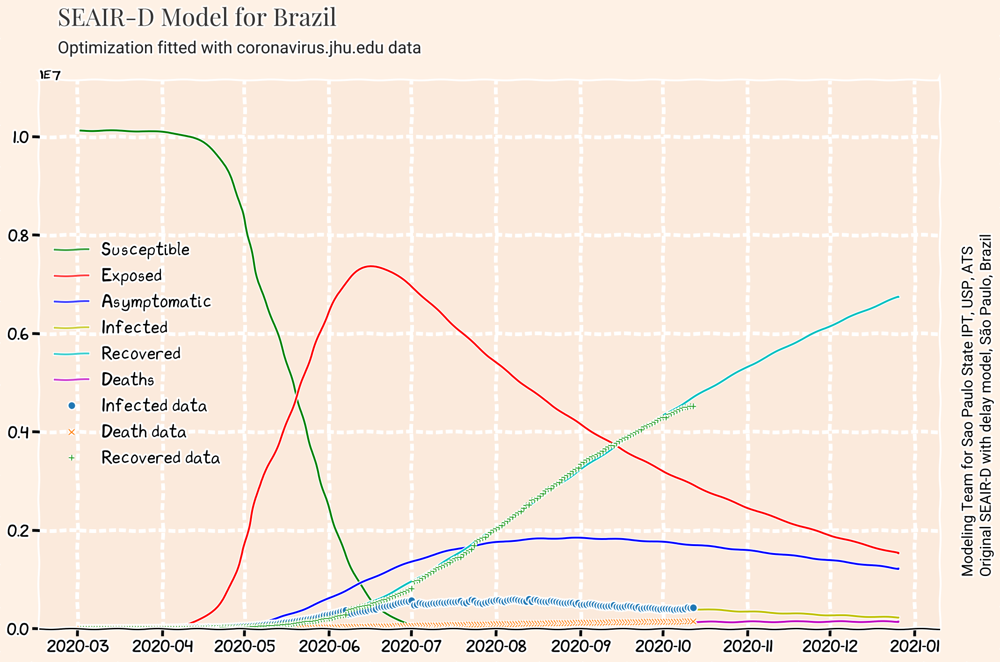

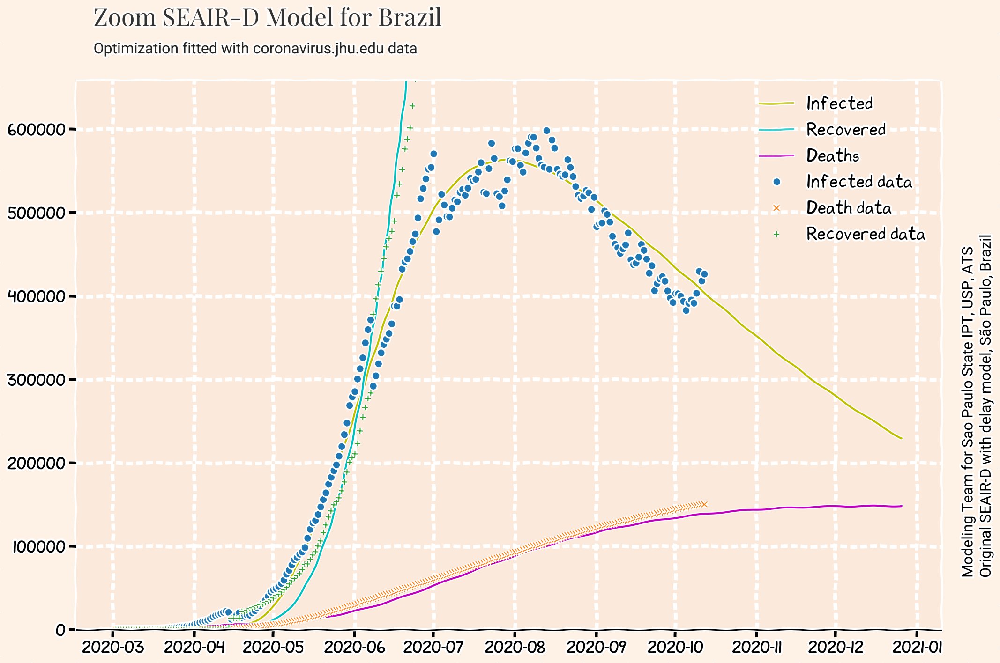

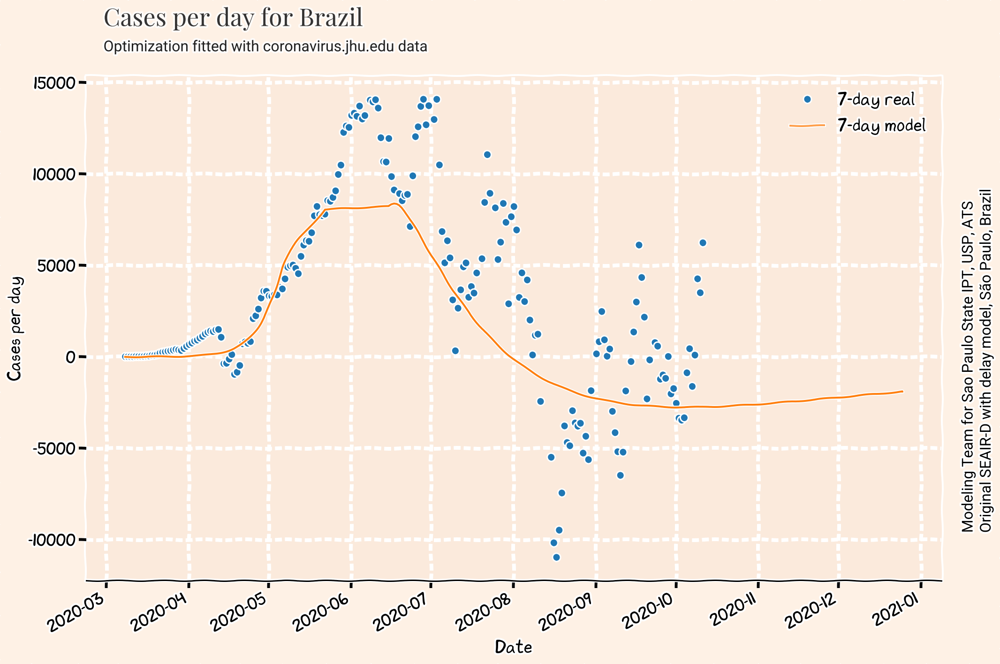

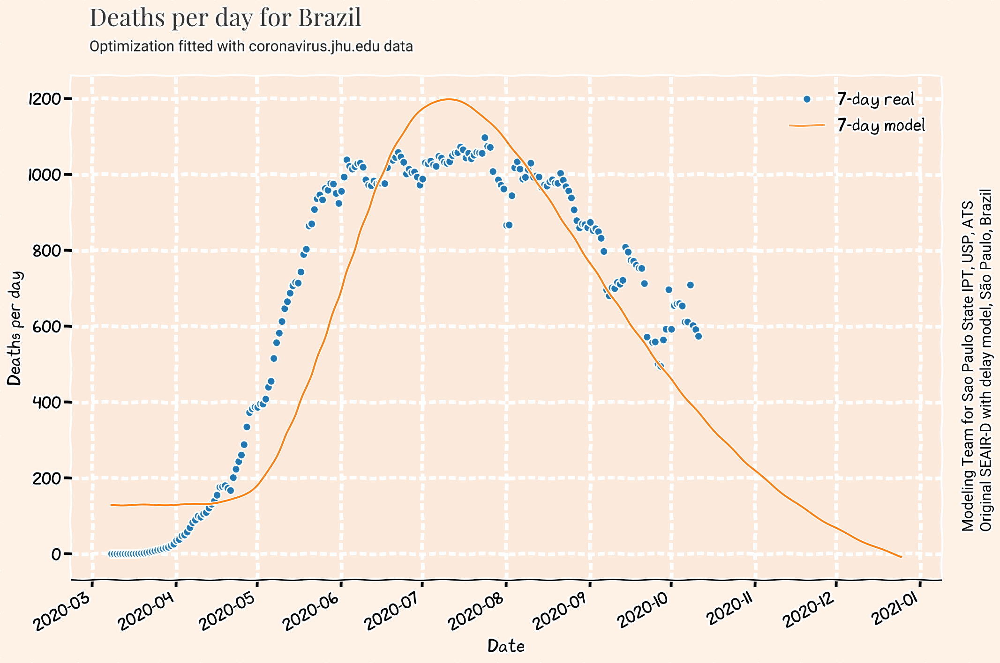

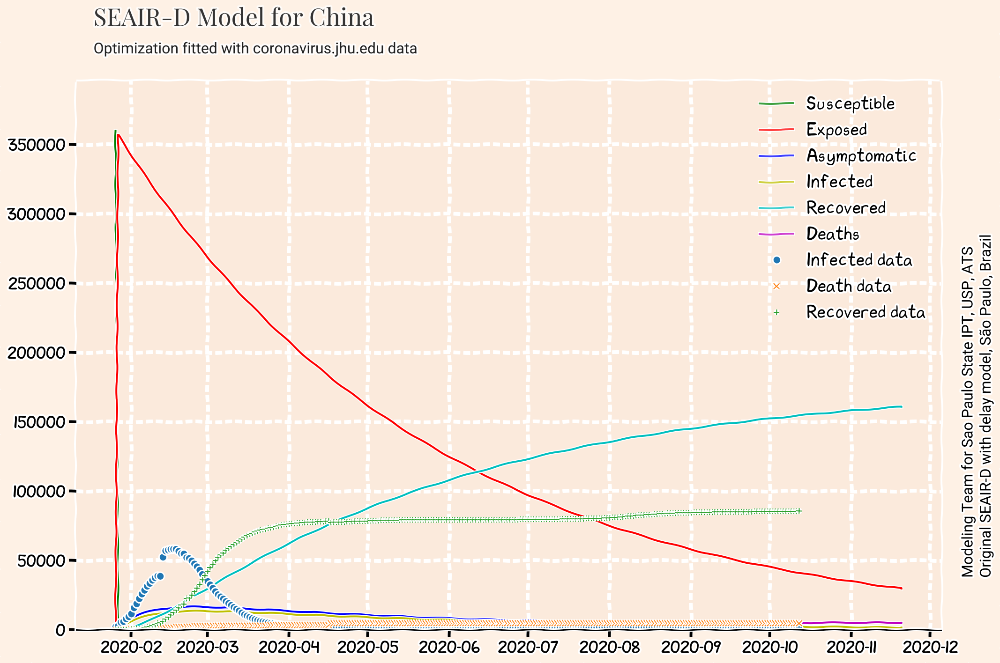

...

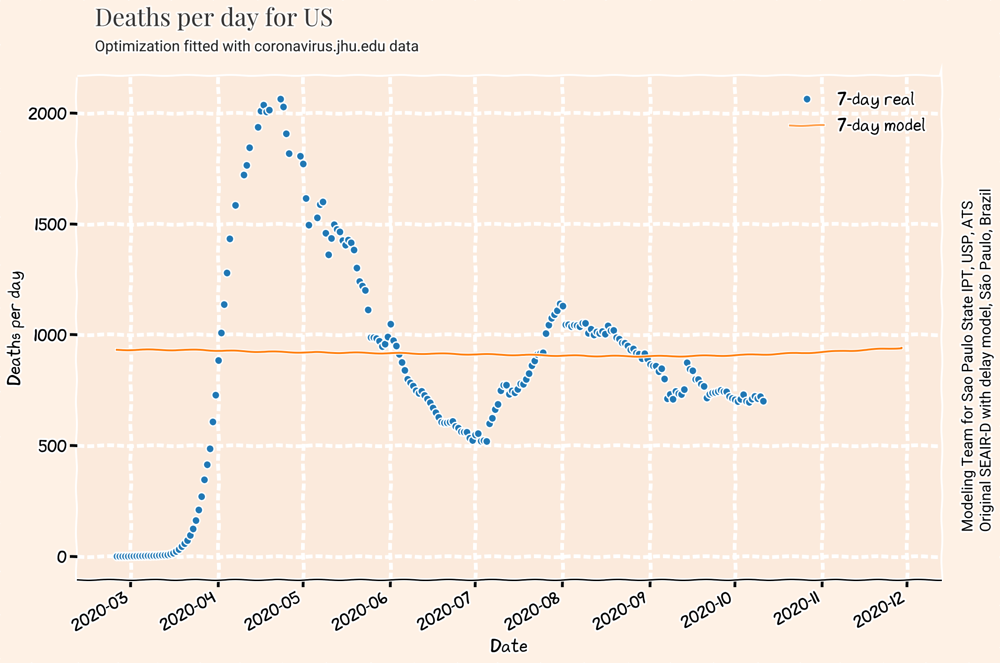

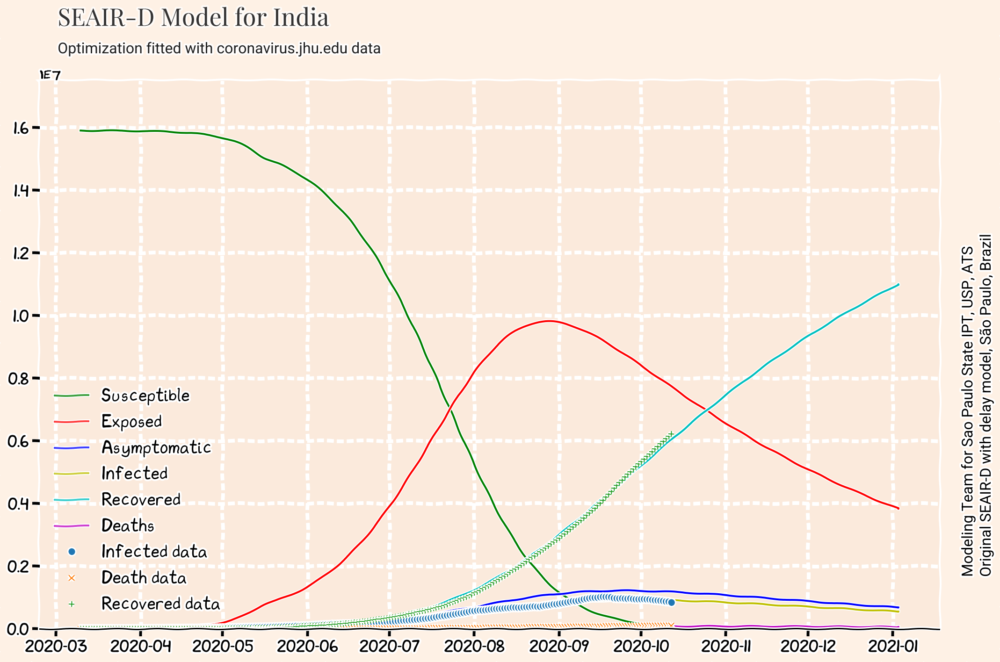

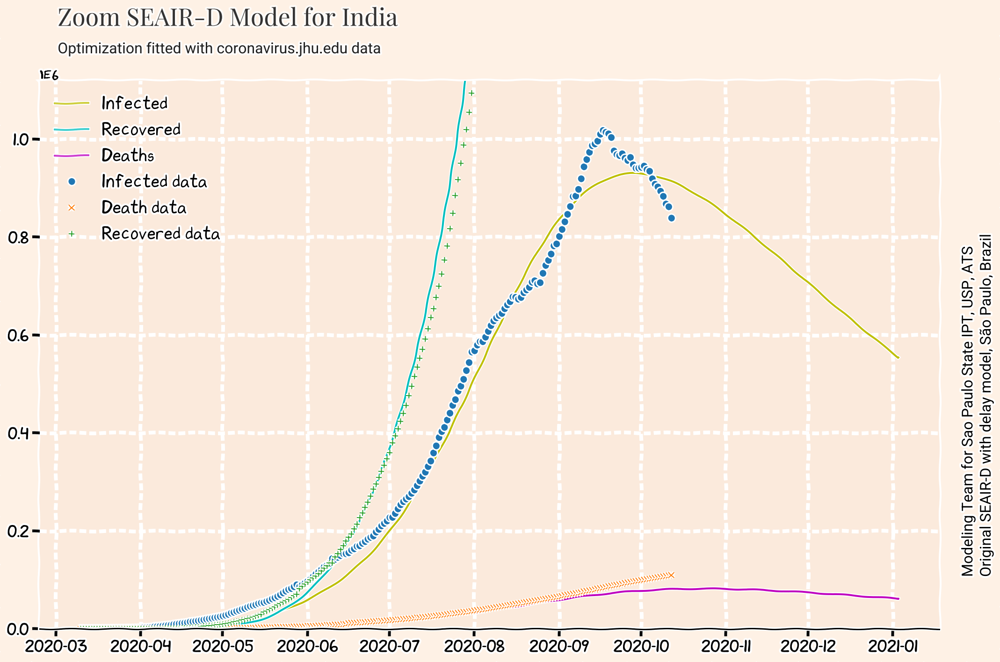

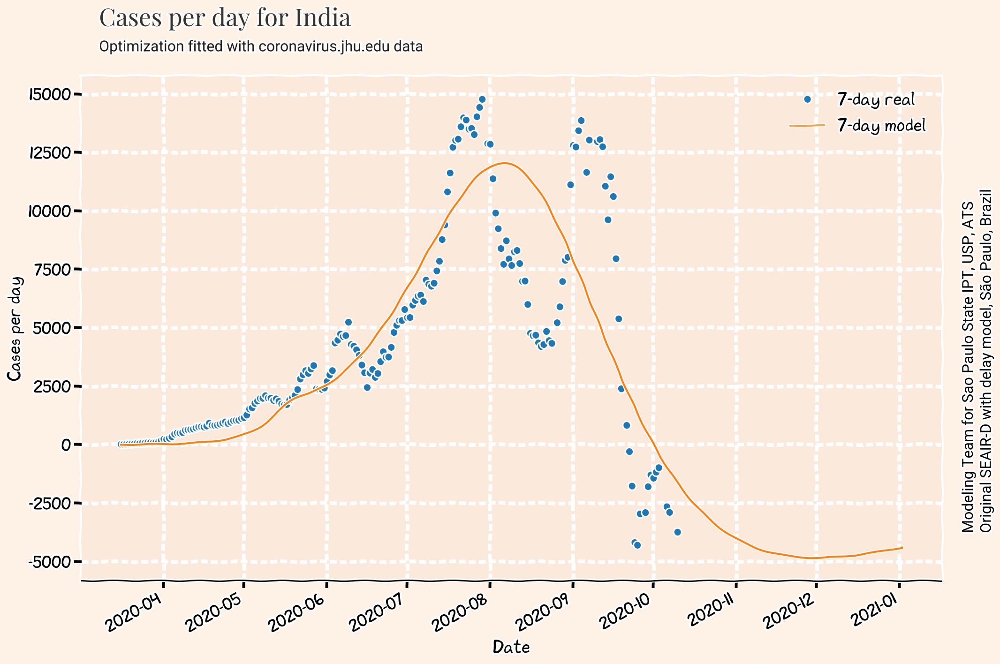

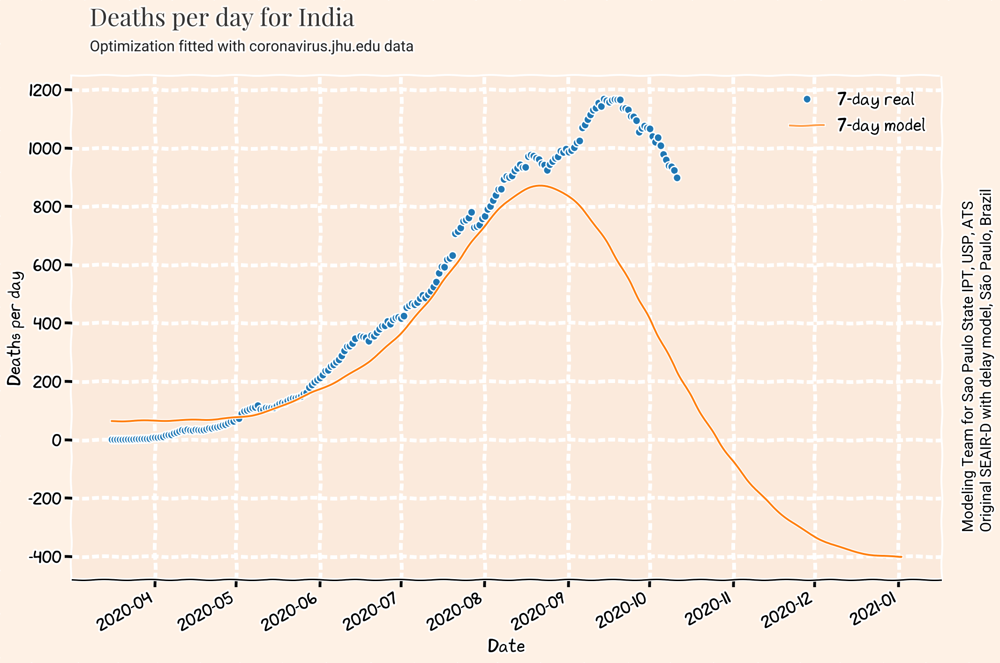

In [18]:
#plots one country or all countries  
if opt==5:
    allCountries=True
else:
    allCountries=False
    
if allCountries:
    for country in countries:
        query = dfparam.query('country == "{}"'.format(country)).reset_index()
        startCase = query['START'][0]
        startdate = query['start-date'][0]
        predict_range = query['prediction-range'][0]
        #calcula data máxima dos gráficos
        #200 dias é usado como máximo dos cálculos da derivada das mortes
        lastDate='9/22/20'
        maxDate= datetime.strptime(lastDate, "%m/%d/%y") + timedelta(days = 200) #"2020-08-31"
        maxDateStr = maxDate.strftime("%-m/%-d/%y")
        cp.covid_plots(country, countries4Plot, startdate, predict_range, \
                        startCase, opt, version, show=True, maxDate=maxDateStr, model=model)
else: 
    query = dfparam.query('country == "{}"'.format(country)).reset_index()
    startdate = query['start-date'][0]
    predict_range = query['prediction-range'][0]
    startCase = query['START'][0]
    #calcula data máxima dos gráficos
    #200 dias é usado como máximo dos cálculos da derivada das mortes
    lastDate='9/22/20'
    maxDate= datetime.strptime(lastDate, "%m/%d/%y") + timedelta(days = 200) #"2020-08-31"
    maxDateStr = maxDate.strftime("%-m/%-d/%y")   
    cp.covid_plots(country, countries4Plot,  startdate, predict_range, \
                       startCase, opt, version, show=True, maxDate=maxDateStr, model=model)